# PROJECT: Defect & Cost Optimisation of a Manufacturing Process Using a Large Dataset

# OBJECTIVES:
1. From the existing dataset, identify the ‘optimal' set(s) of M1-M4 input variables that will meet particular defect probability & cost requirements
2. Predict the defect probabilities & costs of a new set of M1-M4 input variables

# 1. Cleaning & Merging the Data

We are given 5 data files (CSVs): machine_params_and_cost.csv, Ion_Diffusion_Defects.csv, crystalisation_Defects.csv, contamination_defects.csv, burnishing_Defects.csv.  We look at the data files at a high level & clean them - remedying missing data (NaNs) & 0s (where there should NOT be 0s).  The reason for this is to ensure we can apply our algorithms/models across the entire dataset – and that we do not lose valuable data points by removing those with NaNs or 0s.

In [1001]:
#import the core Python libraries
import pandas as pd
import numpy as np

import seaborn as sns

#import visualisation libraries
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use ('ggplot')
from matplotlib.pyplot import figure

#read the data
df_params_cost=pd.read_csv('CML_2023-09-11#7-machine_params_and_cost.csv')
df_i_diff_d=pd.read_csv('CML_2023-09-11#6-Ion_Diffusion_Defects.csv')
df_crys_d=pd.read_csv('CML_2023-09-11#5-crystalisation_Defects.csv')
df_conta_d=pd.read_csv('CML_2023-09-11#4-contamination_defects.csv')
df_burn_d=pd.read_csv('CML_2023-09-11#3-burnishing_Defects.csv')

# Data Frame: df_params_cost

In [1002]:
#view & clean the data frame: df_params_cost
df_params_cost.shape

(2000, 25)

In [1003]:
df_params_cost.dtypes

T1         float64
V1         float64
A1         float64
P1         float64
B1         float64
T2         float64
V2         float64
A2         float64
P2         float64
B2         float64
T3         float64
V3         float64
A3         float64
P3         float64
B3         float64
T4         float64
V4         float64
A4         float64
P4         float64
B4         float64
m1_cost    float64
m2_cost    float64
m3_cost    float64
m4_cost    float64
ID           int64
dtype: object

In [1004]:
df_params_cost

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID
0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0
1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,1
2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,2
3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,3
4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,1995
1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,1996
1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,1997
1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,1998


In [1005]:
df_params_cost.describe()

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID
count,1992.000000,1999.000000,1992.000000,1996.000000,1996.000000,1993.000000,1996.000000,1993.000000,1994.000000,1997.000000,1995.000000,1998.000000,1994.000000,1996.000000,1999.000000,1996.000000,1991.000000,1996.000000,1995.000000,1992.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,100.717662,204.099725,160.152549,30.489575,122.199250,518.347912,378.823620,250.403107,70.979256,303.479247,418.119119,470.739327,352.644060,166.462643,825.134647,355.634124,391.957075,566.104177,284.748996,340.899187,92.601752,101.712880,96.322456,96.600898,999.500000
std,37.920978,71.211644,100.538665,17.269740,32.500352,81.402440,90.139307,160.844961,22.873690,50.102951,90.963998,67.036986,197.594520,98.873990,115.163090,48.548877,135.441152,311.774526,157.098257,21.478761,0.377163,1.009285,0.598595,0.406726,577.494589
min,-1.204738,77.151359,-4.331762,-14.264478,11.037258,299.901654,231.720439,2.216141,13.437790,167.961649,177.721612,355.352169,28.447013,4.901203,498.586483,223.142129,170.134357,74.703477,25.622449,252.694050,91.325056,98.624077,94.385339,95.198111,0.000000
25%,76.909036,150.394065,84.266391,18.337267,102.720732,470.348231,309.676271,125.751932,55.276345,272.575372,363.186706,419.767880,210.238807,93.593429,757.169833,325.103603,287.473852,321.609937,162.431170,327.986655,92.355334,101.039293,95.933392,96.318463,499.750000
50%,98.237363,203.232132,156.347259,29.830111,120.421846,513.839080,373.277282,247.030917,70.012087,301.146156,414.046953,468.136903,339.926530,162.172202,819.434177,353.743330,385.674380,569.789118,279.932950,340.070293,92.615936,101.714324,96.336918,96.600121,999.500000
75%,121.955567,251.057336,228.772901,41.325357,139.130236,561.921090,439.592595,354.636297,85.136222,329.620953,465.998910,517.522554,488.209164,232.106393,883.682334,380.845838,481.904526,774.905589,389.416039,352.169529,92.860238,102.355966,96.721242,96.868792,1499.250000
max,369.008247,712.310827,865.827160,132.029193,348.473408,1100.148937,991.835586,1493.038260,221.823824,655.987035,1031.388809,940.289964,1776.481269,967.161217,1649.323395,703.542390,1344.248460,2918.909940,1404.980384,490.574472,94.173970,104.981649,98.383404,97.811301,1999.000000


In [1006]:
print(df_params_cost.isnull())

         T1     V1     A1     P1     B1     T2     V2     A2     P2     B2  \
0     False  False  False  False  False  False  False  False  False  False   
1     False  False  False  False  False  False  False  False  False  False   
2     False  False  False  False  False  False  False  False  False  False   
3     False  False  False  False  False  False  False  False  False  False   
4     False  False  False  False  False  False  False  False  False  False   
...     ...    ...    ...    ...    ...    ...    ...    ...    ...    ...   
1995  False  False  False  False  False  False  False  False  False  False   
1996  False  False  False  False  False  False  False  False  False  False   
1997  False  False  False  False  False  False  False  False  False  False   
1998  False  False  False  False  False  False  False  False  False  False   
1999  False  False  False  False  False  False  False  False  False  False   

         T3     V3     A3     P3     B3     T4     V4     A4   

In [1007]:
#missing data
print(df_params_cost.isnull().sum())

T1         8
V1         1
A1         8
P1         4
B1         4
T2         7
V2         4
A2         7
P2         6
B2         3
T3         5
V3         2
A3         6
P3         4
B3         1
T4         4
V4         9
A4         4
P4         5
B4         8
m1_cost    0
m2_cost    0
m3_cost    0
m4_cost    0
ID         0
dtype: int64


In [1008]:
#total number of missing data
print(df_params_cost.isnull().sum().sum())

100


In [1009]:
#replace the missing values in each column with its average
for column_name in df_params_cost:
    df_params_cost[column_name].fillna(df_params_cost[column_name].mean(), inplace=True)
df_params_cost

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID
0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0
1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,1
2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,2
3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,3
4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,1995
1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,1996
1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,1997
1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,1998


In [1010]:
#total number of missing data
print(df_params_cost.isnull().sum().sum())

0


In [1011]:
#0s in all columns of df_params_cost
for column_name in df_params_cost.columns:
    column=df_params_cost[column_name]
    #get the count of 0s in the column 
    count=(column==0).sum()
    print('Count of zeros in Column ', column_name, ' is : ', count)

Count of zeros in Column  T1  is :  0
Count of zeros in Column  V1  is :  0
Count of zeros in Column  A1  is :  0
Count of zeros in Column  P1  is :  0
Count of zeros in Column  B1  is :  0
Count of zeros in Column  T2  is :  0
Count of zeros in Column  V2  is :  0
Count of zeros in Column  A2  is :  0
Count of zeros in Column  P2  is :  0
Count of zeros in Column  B2  is :  0
Count of zeros in Column  T3  is :  0
Count of zeros in Column  V3  is :  0
Count of zeros in Column  A3  is :  0
Count of zeros in Column  P3  is :  0
Count of zeros in Column  B3  is :  0
Count of zeros in Column  T4  is :  0
Count of zeros in Column  V4  is :  0
Count of zeros in Column  A4  is :  0
Count of zeros in Column  P4  is :  0
Count of zeros in Column  B4  is :  0
Count of zeros in Column  m1_cost  is :  0
Count of zeros in Column  m2_cost  is :  0
Count of zeros in Column  m3_cost  is :  0
Count of zeros in Column  m4_cost  is :  0
Count of zeros in Column  ID  is :  1


In [1012]:
#no 0s in any of the columns of df_params_cost (except for 'ID', which has an ID number '0')

# Data Frame: df_i_diff_d

In [1013]:
#view & clean the data frame: df_i_diff_d
df_i_diff_d.shape

(162, 1)

In [1014]:
df_i_diff_d.dtypes

ID    int64
dtype: object

In [1015]:
df_i_diff_d

,ID
0,40
1,56
2,59
3,60
4,66
...,...
157,1926
158,1943
159,1956
160,1968


In [1016]:
df_i_diff_d.describe()

,ID
count,162.000000
mean,915.950617
std,580.188605
min,40.000000
25%,418.250000
50%,815.500000
75%,1415.750000
max,1988.000000


In [1017]:
print(df_i_diff_d.isnull())

        ID
0    False
1    False
2    False
3    False
4    False
..     ...
157  False
158  False
159  False
160  False
161  False

[162 rows x 1 columns]


In [1018]:
#missing data
print(df_i_diff_d.isnull().sum())

ID    0
dtype: int64


In [1019]:
#no missing data

# Data Frame: df_crys_d

In [1020]:
#view & clean the data frame: df_crys_d
df_crys_d.shape

(931, 1)

In [1021]:
df_crys_d.dtypes

ID    int64
dtype: object

In [1022]:
df_crys_d

,ID
0,0
1,2
2,4
3,8
4,12
...,...
926,1979
927,1985
928,1986
929,1988


In [1023]:
df_crys_d.describe()

,ID
count,931.000000
mean,1022.684211
std,579.593943
min,0.000000
25%,519.000000
50%,1032.000000
75%,1548.000000
max,1992.000000


In [1024]:
print(df_crys_d.isnull())

        ID
0    False
1    False
2    False
3    False
4    False
..     ...
926  False
927  False
928  False
929  False
930  False

[931 rows x 1 columns]


In [1025]:
#missing data
print(df_crys_d.isnull().sum())

ID    0
dtype: int64


In [1026]:
#no missing data

# Data Frame: df_conta_d

In [1027]:
#view & clean the data frame: df_conta_d
df_conta_d.shape

(243, 1)

In [1028]:
df_conta_d.dtypes

ID    int64
dtype: object

In [1029]:
df_conta_d

,ID
0,1
1,3
2,4
3,18
4,21
...,...
238,1946
239,1961
240,1962
241,1970


In [1030]:
df_conta_d.describe()

,ID
count,243.000000
mean,980.440329
std,552.256947
min,1.000000
25%,529.500000
50%,996.000000
75%,1400.000000
max,1988.000000


In [1031]:
print(df_conta_d.isnull())

        ID
0    False
1    False
2    False
3    False
4    False
..     ...
238  False
239  False
240  False
241  False
242  False

[243 rows x 1 columns]


In [1032]:
#missing data
print(df_conta_d.isnull().sum())

ID    0
dtype: int64


In [1033]:
#no missing data

# Data Frame: df_burn_d

In [1034]:
#view & clean the data frame: df_burn_d
df_burn_d.shape

(173, 1)

In [1035]:
df_burn_d.dtypes

ID    int64
dtype: object

In [1036]:
df_burn_d

,ID
0,9
1,26
2,34
3,39
4,41
...,...
168,1944
169,1946
170,1961
171,1964


In [1037]:
df_burn_d.describe()

,ID
count,173.000000
mean,975.982659
std,579.307259
min,9.000000
25%,457.000000
50%,964.000000
75%,1483.000000
max,1970.000000


In [1038]:
print(df_burn_d.isnull())

        ID
0    False
1    False
2    False
3    False
4    False
..     ...
168  False
169  False
170  False
171  False
172  False

[173 rows x 1 columns]


In [1039]:
#missing data
print(df_burn_d.isnull().sum())

ID    0
dtype: int64


In [1040]:
#no missing data

# Creating merged_df from the Data Frames

We merge all data files into 1 dataset called merged_df.

The reasons for this are to:
- Ensure we are able to train & test algorithms/models across the M1-M4 input & cost variables in machine_params_and_cost & the defect variables in the other 4 files
- Identify potential correlations among the M1-M4 input variables (x) & the defect/cost outcome variables (y)
- Set realistic thresholds for the purpose of filtering/reducing the dataset & identifying ‘optimal’ set(s) of data points (as well as testing a new set of data points)

In [1041]:
#merge df_params_cost & df_i_diff_d 
#first, add a column of 1s to df_i_diff_d (1 indicates a defect)
df_i_diff_d['i_diff_d']=1
df_i_diff_d

,ID,i_diff_d
0,40,1
1,56,1
2,59,1
3,60,1
4,66,1
...,...,...
157,1926,1
158,1943,1
159,1956,1
160,1968,1


In [1042]:
#second, merge df_params_cost & df_i_diff_d using the 'ID' column
#new data frame: merged_df
merged_df=pd.merge(df_params_cost.copy(), df_i_diff_d.copy(), on='ID', how='outer')
merged_df

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID,i_diff_d
0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0,NaN
1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,1,NaN
2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,2,NaN
3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,3,NaN
4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,1995,NaN
1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,1996,NaN
1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,1997,NaN
1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,1998,NaN


In [1043]:
#merge merged_df & df_crys_d
#first, add a column of 1s to df_crys_d (1 indicates a defect)
df_crys_d['crys_d']=1
df_crys_d

,ID,crys_d
0,0,1
1,2,1
2,4,1
3,8,1
4,12,1
...,...,...
926,1979,1
927,1985,1
928,1986,1
929,1988,1


In [1044]:
#second, merge merged_df & df_crys_d using the 'ID' column
merged_df=pd.merge(merged_df, df_crys_d.copy(), on='ID', how='outer')
merged_df

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID,i_diff_d,crys_d
0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0,NaN,1.0
1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,1,NaN,NaN
2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,2,NaN,1.0
3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,3,NaN,NaN
4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,4,NaN,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,1995,NaN,NaN
1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,1996,NaN,NaN
1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,1997,NaN,NaN
1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,1998,NaN,NaN


In [1045]:
#merge merged_df & df_conta_d
#first, add a column of 1s to df_conta_d (1 indicates a defect)
df_conta_d['conta_d']=1
df_conta_d

,ID,conta_d
0,1,1
1,3,1
2,4,1
3,18,1
4,21,1
...,...,...
238,1946,1
239,1961,1
240,1962,1
241,1970,1


In [1046]:
#second, merge merged_df & df_conta_d using the 'ID' column
merged_df=pd.merge(merged_df, df_conta_d.copy(), on='ID', how='outer')
merged_df

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID,i_diff_d,crys_d,conta_d
0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0,NaN,1.0,NaN
1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,1,NaN,NaN,1.0
2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,2,NaN,1.0,NaN
3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,3,NaN,NaN,1.0
4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,4,NaN,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,1995,NaN,NaN,NaN
1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,1996,NaN,NaN,NaN
1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,1997,NaN,NaN,NaN
1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,1998,NaN,NaN,NaN


In [1047]:
#merge merged_df & df_burn_d
#first, add a column of 1s to df_burn_d (1 indicates a defect)
df_burn_d['burn_d']=1
df_burn_d

,ID,burn_d
0,9,1
1,26,1
2,34,1
3,39,1
4,41,1
...,...,...
168,1944,1
169,1946,1
170,1961,1
171,1964,1


In [1048]:
#second, merge merged_df & df_burn_d using the 'ID' column
merged_df=pd.merge(merged_df, df_burn_d.copy(), on='ID', how='outer')
merged_df

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID,i_diff_d,crys_d,conta_d,burn_d
0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0,NaN,1.0,NaN,NaN
1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,1,NaN,NaN,1.0,NaN
2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,2,NaN,1.0,NaN,NaN
3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,3,NaN,NaN,1.0,NaN
4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,4,NaN,1.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,1995,NaN,NaN,NaN,NaN
1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,1996,NaN,NaN,NaN,NaN
1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,1997,NaN,NaN,NaN,NaN
1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,1998,NaN,NaN,NaN,NaN


In [1049]:
#missing data
print(merged_df.isnull().sum())

T1             0
V1             0
A1             0
P1             0
B1             0
T2             0
V2             0
A2             0
P2             0
B2             0
T3             0
V3             0
A3             0
P3             0
B3             0
T4             0
V4             0
A4             0
P4             0
B4             0
m1_cost        0
m2_cost        0
m3_cost        0
m4_cost        0
ID             0
i_diff_d    1838
crys_d      1069
conta_d     1757
burn_d      1827
dtype: int64


In [1050]:
#total number of missing data
print(merged_df.isnull().sum().sum())

6491


In [1051]:
#replace the missing values in each column with 0s
for column_name in merged_df:
    merged_df[column_name].fillna(0, inplace=True)
merged_df

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,ID,i_diff_d,crys_d,conta_d,burn_d
0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0,0.0,1.0,0.0,0.0
1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,1,0.0,0.0,1.0,0.0
2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,2,0.0,1.0,0.0,0.0
3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,3,0.0,0.0,1.0,0.0
4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,4,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,1995,0.0,0.0,0.0,0.0
1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,1996,0.0,0.0,0.0,0.0
1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,1997,0.0,0.0,0.0,0.0
1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,1998,0.0,0.0,0.0,0.0


In [1052]:
#shift the 'ID' column to the first position in the data frame
first_column=merged_df.pop('ID')
merged_df.insert(0, 'ID', first_column)
merged_df

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
0,0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0.0,1.0,0.0,0.0
1,1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,0.0,0.0,1.0,0.0
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
3,3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,0.0,0.0,1.0,0.0
4,4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0
1996,1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,0.0,0.0,0.0,0.0
1997,1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,0.0,0.0,0.0,0.0
1998,1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,0.0,0.0,0.0,0.0


In [1053]:
merged_df.describe()

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,999.500000,100.717662,204.099725,160.152549,30.489575,122.199250,518.347912,378.823620,250.403107,70.979256,303.479247,418.119119,470.739327,352.644060,166.462643,825.134647,355.634124,391.957075,566.104177,284.748996,340.899187,92.601752,101.712880,96.322456,96.600898,0.081000,0.465500,0.121500,0.086500
std,577.494589,37.845022,71.193830,100.337286,17.252453,32.467819,81.259789,90.049077,160.563094,22.839337,50.065341,90.850165,67.003443,197.297757,98.775017,115.134281,48.500279,135.135913,311.462439,156.901663,21.435739,0.377163,1.009285,0.598595,0.406726,0.272903,0.498933,0.326789,0.281171
min,0.000000,-1.204738,77.151359,-4.331762,-14.264478,11.037258,299.901654,231.720439,2.216141,13.437790,167.961649,177.721612,355.352169,28.447013,4.901203,498.586483,223.142129,170.134357,74.703477,25.622449,252.694050,91.325056,98.624077,94.385339,95.198111,0.000000,0.000000,0.000000,0.000000
25%,499.750000,76.938501,150.405145,84.535432,18.356654,102.722714,470.468294,309.796273,126.140852,55.300812,272.583075,363.368135,419.890777,210.606924,93.669400,757.173148,325.205381,288.249742,321.963121,162.885068,328.077413,92.355334,101.039293,95.933392,96.318463,0.000000,0.000000,0.000000,0.000000
50%,999.500000,98.442039,203.274366,156.830837,29.876301,120.466160,514.127323,373.846344,247.286004,70.165119,301.255661,414.300136,468.161705,340.494933,162.470318,819.510676,353.796066,386.502293,569.351485,280.495404,340.194526,92.615936,101.714324,96.336918,96.600121,0.000000,0.000000,0.000000,0.000000
75%,1499.250000,121.922033,251.039861,228.589023,41.288256,139.034872,561.643301,439.518841,354.088982,85.112755,329.577076,465.948081,517.413275,487.752064,232.026843,883.659129,380.799076,481.736972,774.048992,389.181222,352.112170,92.860238,102.355966,96.721242,96.868792,0.000000,1.000000,0.000000,0.000000
max,1999.000000,369.008247,712.310827,865.827160,132.029193,348.473408,1100.148937,991.835586,1493.038260,221.823824,655.987035,1031.388809,940.289964,1776.481269,967.161217,1649.323395,703.542390,1344.248460,2918.909940,1404.980384,490.574472,94.173970,104.981649,98.383404,97.811301,1.000000,1.000000,1.000000,1.000000


In [1054]:
#count the number of occurrences of each value (0 or 1) for conta_d
counts=merged_df['conta_d'].value_counts()

#display the counts
print(counts)

0.0    1757
1.0     243
Name: conta_d, dtype: int64


In [1055]:
#12.15% of the dataset have a contamination defect

In [1056]:
#count the number of occurrences of each value (0 or 1) for crys_d
counts=merged_df['crys_d'].value_counts()

#display the counts
print(counts)

0.0    1069
1.0     931
Name: crys_d, dtype: int64


In [1057]:
#46.55% of the dataset have a crystallisation defect

In [1058]:
#count the number of occurrences of each value (0 or 1) for i_diff_d
counts=merged_df['i_diff_d'].value_counts()

#display the counts
print(counts)

0.0    1838
1.0     162
Name: i_diff_d, dtype: int64


In [1059]:
#8.10% of the dataset have an ion diffusion defect

In [1060]:
#count the number of occurrences of each value (0 or 1) for burn_d
counts=merged_df['burn_d'].value_counts()

#display the counts
print(counts)

0.0    1827
1.0     173
Name: burn_d, dtype: int64


In [1061]:
#8.65% of the dataset have a burnishing defect

# 2. Reviewing the Data Visually (Scanning the Data)

Now that we have a cleaned-and-merged dataset, we review & gain a ‘bird’s eye view’ of the data.  We review each set of input variables (M1-M4) & ALL current/later-step defect/cost variables (we include later-step outcome variables for M1, M2 & M3 each since we may find a cross-step correlation such as the M1 input variables predicting the ion diffusion defect) in a scatter matrix & a heat map.  The reason for scanning the data is to quickly identify strong correlations among these variables & narrow/focus our subsequent analyses around the correlations if possible.

In [1062]:
from pandas.plotting import scatter_matrix

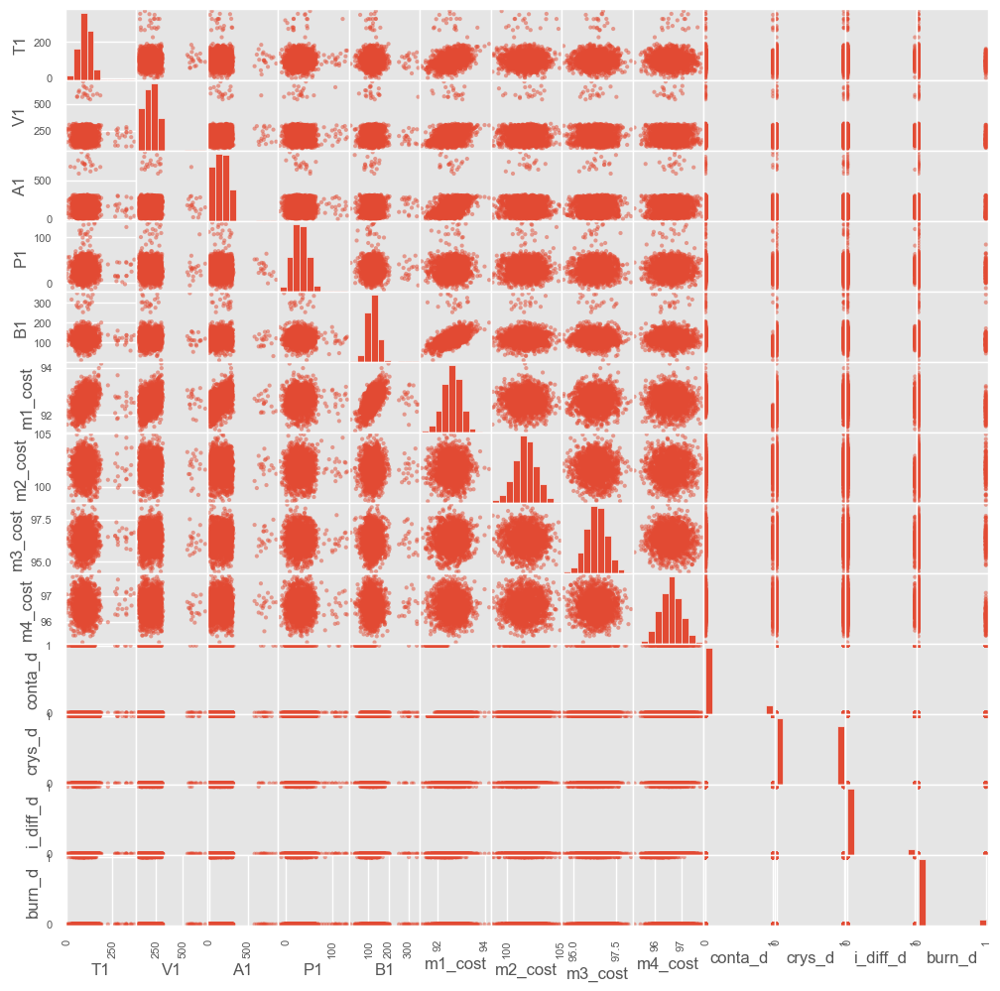

In [1063]:
#understanding correlations among T1, V1, A1, P1, B1 vs m1_cost, m2_cost, m3_cost, m4_cost, conta_d, crys_d, i_diff_d, burn_d in merged_df

#do the input variables of M1 correlate with the cost & defect values of M1-M4?

#select the columns to plot
cols=['T1', 'V1', 'A1', 'P1', 'B1', 'm1_cost', 'm2_cost', 'm3_cost', 'm4_cost', 'conta_d', 'crys_d', 'i_diff_d', 'burn_d']

#create a scatter matrix
scatter_matrix(merged_df[cols], figsize=(12, 12))

#show the plot
plt.show()

(13.5, -0.5)

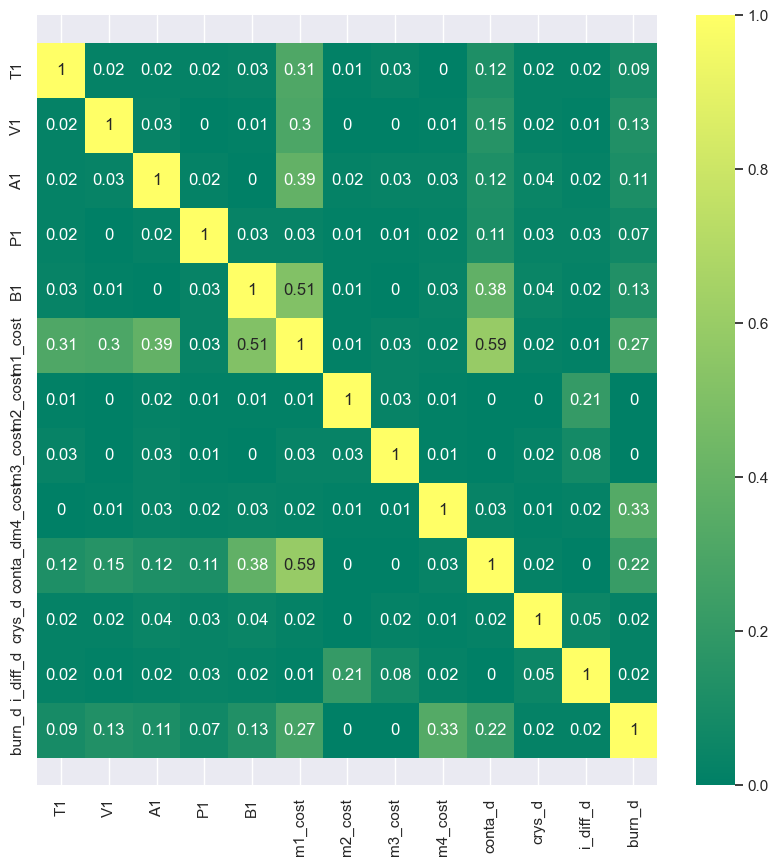

In [1064]:
#heat map for T1, V1, A1, P1, B1 vs m1_cost, m2_cost, m3_cost, m4_cost, conta_d, crys_d, i_diff_d, burn_d in merged_df

#do the input variables of M1 correlate with the cost & defect values of M1-M4?

%matplotlib inline
correlation_matrix=np.absolute(merged_df[cols].corr().round(2))
sns.set(rc={'figure.figsize':(10,10)})
ax=sns.heatmap(correlation_matrix,annot=True, cmap='summer')
bottom, top=ax.get_ylim()
ax.set_ylim(bottom+0.5, top-0.5)

In [1065]:
#somewhat strong correlation between B1 & m1_cost (0.51); also a somewhat strong correlation between conta_d & m1_cost (0.59) 

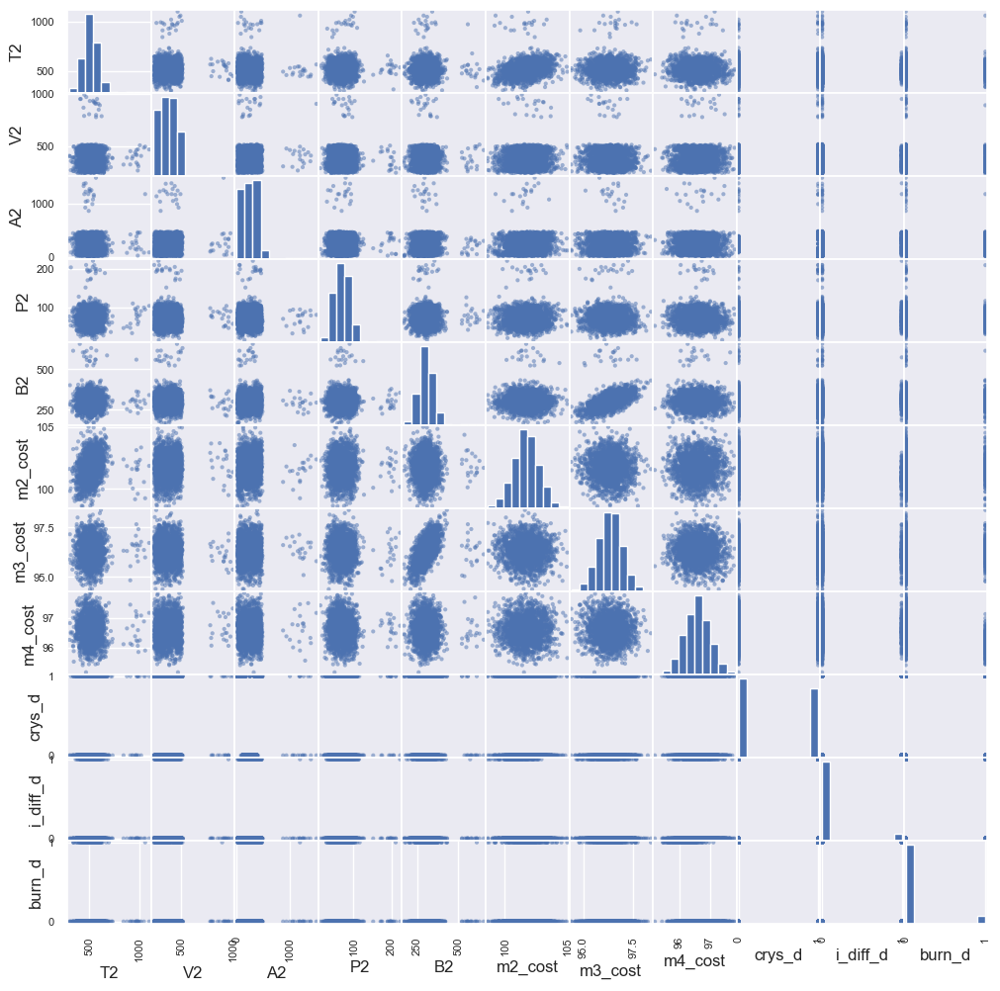

In [1066]:
#understanding correlations among T2, V2, A2, P2, B2 vs m2_cost, m3_cost, m4_cost, crys_d, i_diff_d, burn_d in merged_df

#do the input variables of M2 correlate with the cost & defect values of M2-M4?

#select the columns to plot
cols = ['T2', 'V2', 'A2', 'P2', 'B2', 'm2_cost', 'm3_cost', 'm4_cost', 'crys_d', 'i_diff_d', 'burn_d']

#create a scatter matrix
scatter_matrix(merged_df[cols], figsize=(12, 12))

#show the plot
plt.show()

(11.5, -0.5)

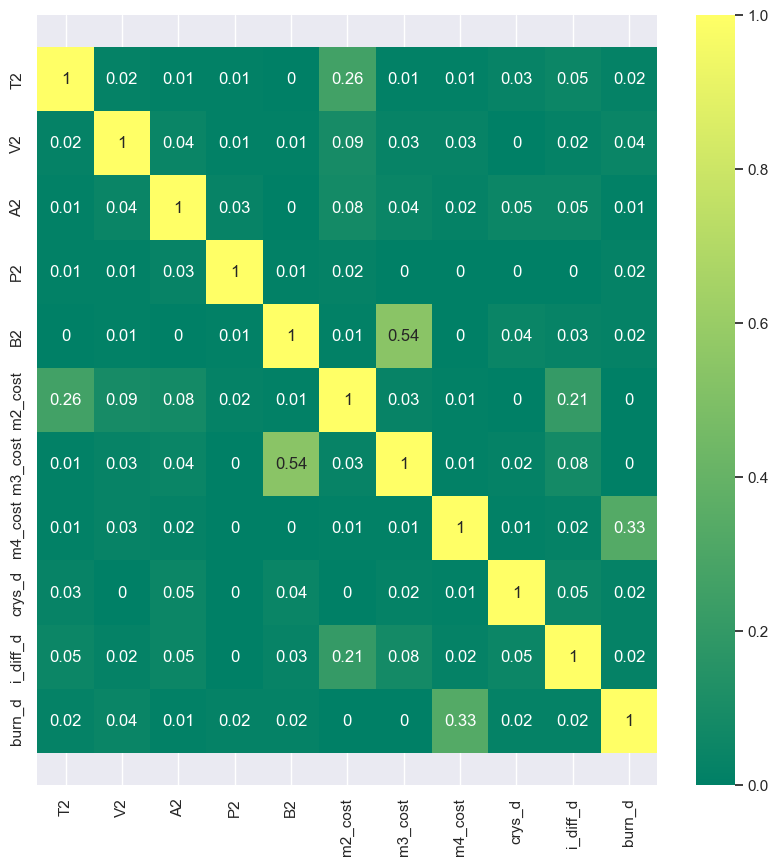

In [1067]:
#heat map for T2, V2, A2, P2, B2 vs m2_cost, m3_cost, m4_cost, crys_d, i_diff_d, burn_d in merged_df

#do the input variables of M2 correlate with the cost & defect values of M2-M4?

%matplotlib inline
correlation_matrix=np.absolute(merged_df[cols].corr().round(2))
sns.set(rc={'figure.figsize':(10,10)})
ax=sns.heatmap(correlation_matrix,annot=True, cmap='summer')
bottom, top=ax.get_ylim()
ax.set_ylim(bottom+0.5, top-0.5)

In [1068]:
#somewhat strong correlation between B2 & m3_cost (0.54); no correlation between crys_d & m2_cost (0) 

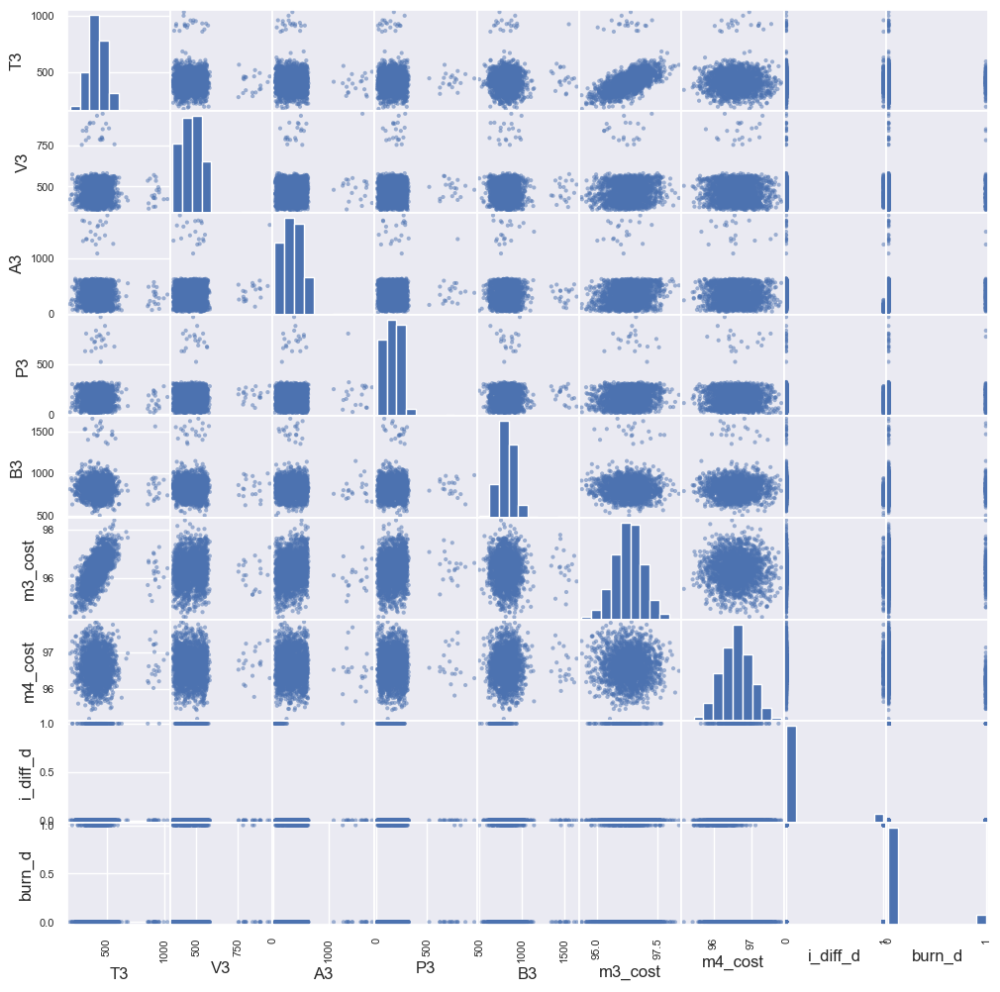

In [1069]:
#understanding correlations among T3, V3, A3, P3, B3 vs m3_cost, m4_cost, i_diff_d, burn_d in merged_df

#do the input variables of M3 correlate with the cost & defect values of M3-M4?

#select the columns to plot
cols = ['T3', 'V3', 'A3', 'P3', 'B3', 'm3_cost', 'm4_cost', 'i_diff_d', 'burn_d']

#create a scatter matrix
scatter_matrix(merged_df[cols], figsize=(12, 12))

#show the plot
plt.show()

(9.5, -0.5)

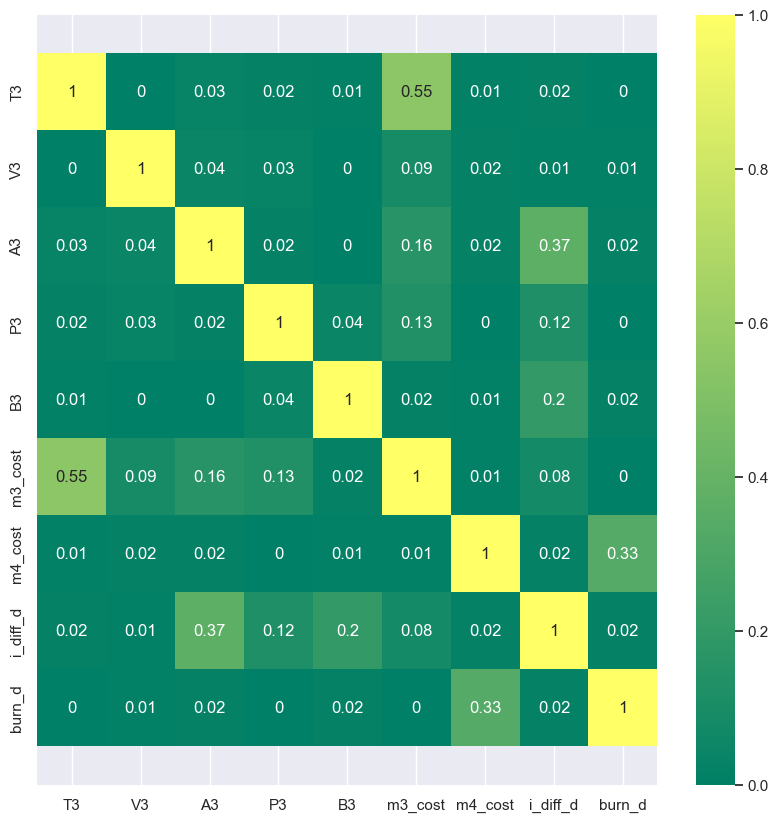

In [1070]:
#heat map for T3, V3, A3, P3, B3 vs m3_cost, m4_cost, i_diff_d, burn_d in merged_df

#do the input variables of M3 correlate with the cost & defect values of M3-M4?

%matplotlib inline
correlation_matrix=np.absolute(merged_df[cols].corr().round(2))
sns.set(rc={'figure.figsize':(10,10)})
ax=sns.heatmap(correlation_matrix,annot=True, cmap='summer')
bottom, top=ax.get_ylim()
ax.set_ylim(bottom+0.5, top-0.5)

In [1071]:
#somewhat strong correlation between T3 & m3_cost (0.55); little correlation between i_diff_d & m3_cost (0.08) 

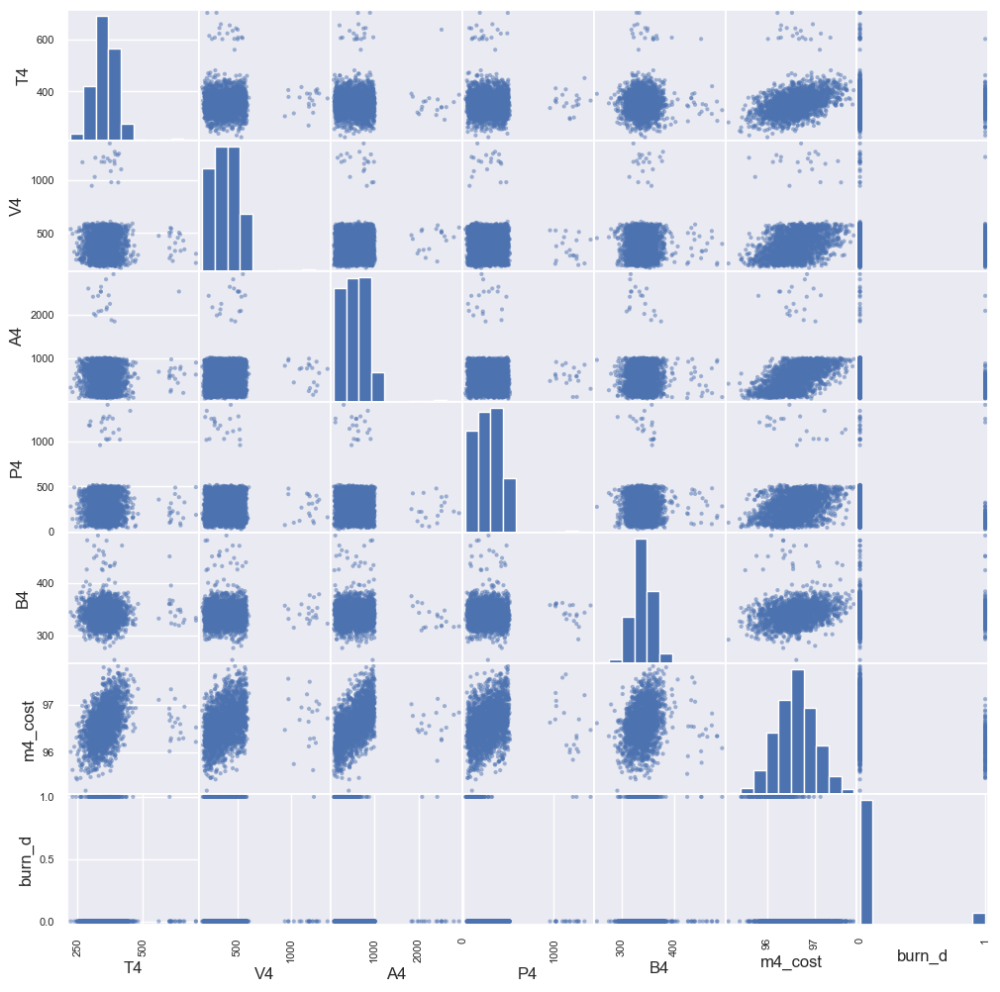

In [1072]:
#understanding correlations among T4, V4, A4, P4, B4, m4_cost, burn_d in merged_df

#do the input variables of M4 correlate with the cost & defect values of M4?

#select the columns to plot
cols = ['T4', 'V4', 'A4', 'P4', 'B4', 'm4_cost', 'burn_d']

#create a scatter matrix
scatter_matrix(merged_df[cols], figsize=(12, 12))

#show the plot
plt.show()

(7.5, -0.5)

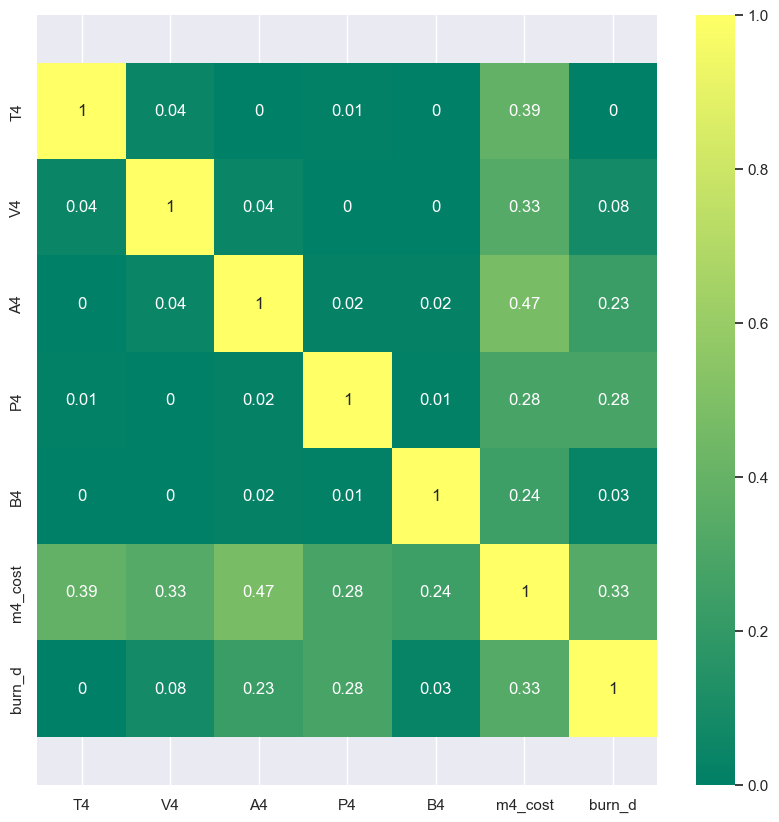

In [1073]:
#heat map for T4, V4, A4, P4, B4 vs m4_cost, burn_d in merged_df

#do the input variables of M4 correlate with the cost & defect values of M4?

%matplotlib inline
correlation_matrix=np.absolute(merged_df[cols].corr().round(2))
sns.set(rc={'figure.figsize':(10,10)})
ax=sns.heatmap(correlation_matrix,annot=True, cmap='summer')
bottom, top=ax.get_ylim()
ax.set_ylim(bottom+0.5, top-0.5)

In [1074]:
#borderline strong correlation between A4 & m4_cost (0.47); limited correlation between burn_d & m4_cost (0.33) 

The scatter matrices & heat maps reveal no strong correlation except for the following 3 pairs of variables, each indicating a somewhat strong (0.5-0.6) correlation on the heat map: B1 vs m1_cost, B3 vs m3_cost, T3 vs m3_cost.  We investigate these pairs further in our next linear/polynomial regression analyses.  Overall, we conclude that no single input variable has a strong impact on/correlation with any of the outcome variables – and that any such impact/correlation comes from multiple variables strategically selected to ‘move the needle’ on the outcome(s).

# 3. Analysing the Data with Algorithms/Models

Having scanned the data & established that any correlation with an outcome (defect or cost) variable is likely to be found in a set of (multiple) input variables, we next apply the following 5 supervised & unsupervised ML algorithms/models to tease out meaningful correlations and/or identify the ‘optimum (optima)’ in the existing dataset: (i) linear/polynomial regression, (ii) logistic regression, (iii) clustering, (iv) Gaussian Mixture Models, (v) decision trees/classifications.

# 3.1 Linear & Polynomial Regressions (Supervised ML): m1_cost, m2_cost, m3_cost, m4_cost

Given the inconclusive results of the scatter matrices & heat maps in the initial scan, we focus on multivariate linear/polynomial regressions.  We apply a linear regression to each set of M1-M4 input variables – and further apply 2nd/3rd-degree polynomial regressions if/where the linear regression appears to show a meaningful correlation.  The outcome variables are the cost variables (m1_cost, m2_cost, m3_cost, m4_cost) - but not the defect variables.  The reason for this is that linear/polynomial regressions would not be suitable for explaining the behaviour of conta_d, crys_d, i_diff_d or burn_d – each of which is a 0-or-1 categorical variable (we apply logistic regressions to the defect variables in the next section).  For each set of input variables from M1 to M4, we attempt to identify correlations vis-à-vis the direct cost variable (for example, the M1 input variables vs m1_cost) as well as any later-step cost variable (for example, the M1 input variables vs m2_cost, m3_cost or m4_cost).

For each of our multivariate linear & 2nd/3rd-degree polynomial regressions, we move through the following steps:

1. Run the regression using 80:20 split training & test datasets (estimate the intercept/coefficients where necessary)
2. Derive the regression fit using R2 & RMSE (the higher the R2 value is, the 'better'; the lower the RMSE value is, the 'better'

In addition, for each of the multivariate 2nd-degree polynomial regressions, we:

3. Attempt to find the minimum/optimum point provided that the regression fit is sufficiently strong
4. Apply ridge regularisation to ‘correct’ for overfitting (where necessary)

Though we focus on multivariate regressions, we nonetheless investigate possibilities of single-input-variable corelations.  Using linear & 2nd/3rd-degree polynomial regressions (following the steps described above), we analyse the 3 (potential) single-input-variable correlations identified from the heat map: B1 vs m1_cost, B3 vs m3_cost, T3 vs m3_cost.  In addition, we analyse each input variable vis-à-vis its direct cost variable in the same step of the process but only after segregating the input variable data into 2 clusters based on visual reviews of scatter plots (for example, T1<200 vs m1_cost).  

In [1075]:
#import the core classification, regression & clustering libraries
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split

#import the core polynomial library
from sklearn.preprocessing import PolynomialFeatures

# M1

In [1076]:
#the previous visual scan suggests a potential correlation between B1 & m1_cost for M1

#linear regression using B1 & m1_cost

x_1=merged_df[['B1']]
y_1=merged_df['m1_cost']

In [1077]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1078]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1079]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.2376890019561374
     Test= 0.3487648980357527
RMSE:
     Train= 0.32871387851803147
     Test= 0.30589272822917585


In [1080]:
#a low R2 & a relatively low RMSE indicate the correlation between B1 & m1_cost cannot be adequately explained by a linear regression function

In [1081]:
#the higher the R2 value is, the 'better'; the lower the RMSE value is, the 'better'

In [1082]:
#now, apply higher-degree polynomial regression functions to B1 & m1_cost

In [1083]:
#2nd-degree

In [1084]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.77968845e-02 -3.99966352e-05]
Constant term (bias) =  91.06871095813854


In [1085]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1086]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.35370754601227894
     Test= 0.4055245520134917
RMSE:
     Train= 0.30266798852600874
     Test= 0.29225854223214986


In [1087]:
#a relatively low R2 & a relatively low RMSE indicate the correlation between B1 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1088]:
#3rd-degree

In [1089]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  9.84361942e-03  1.23349125e-05 -9.88723027e-08]
Constant term (bias) =  91.42849386177986


In [1090]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1091]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.35724776401605696
     Test= 0.4104837530457375
RMSE:
     Train= 0.30183788285884106
     Test= 0.29103695750984293


In [1092]:
#a relatively low R2 & a relatively low RMSE indicate the correlation between B1 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

In [1093]:
#multivariate linear regression using all M1 input variables & m1_cost

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_1=merged_df['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1094]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1095]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.6129684222975331
     Test= 0.5950979871160726
RMSE:
     Train= 0.23307865276206355
     Test= 0.2455186785560036


# Note: a relatively high R2 & a low RMSE indicate the 5 M1 input variables together predict m1_cost well as a multivariate linear regression function

In [1096]:
#M1 input variables vs m1_cost - the coefficients & the intercept

coefficient_1=lin_model.coef_
print(coefficient_1)

intercept_1=lin_model.intercept_
print(intercept_1)

[0.00343894 0.00160049 0.00142317 0.00089421 0.00603813]
90.93607712360256


In [1097]:
#given a relatively high R2, apply a new ['T1', 'V1', 'A1', 'P1', 'B1'] array to calculate (test) the predicted value of m1_cost

#the same analysis will NOT be done with the related polynomial regression functions below since they are likely to yield similar results

#the analysis also will NOT be done below where the R2 for the linear or polynomial regression does NOT indicate a strong correlation

#[100, 100, 200, 15, 100]

#the intercept & the coefficients used are based on 1 particular iteration of the linear regression - the actual numbers will vary

m1_cost_new=90.96219442706463+100*0.00326474+100*0.00152273+200*0.00153736+15*0.00080062+100*0.00596947
print('The predicted cost of M1 is ', m1_cost_new)

The predicted cost of M1 is  92.35736972706464


In [1098]:
#now, apply higher-degree polynomial regression functions to all M1 input variables & m1_cost

In [1099]:
#2nd-degree

In [1100]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  7.23888332e-03  4.02474146e-03  3.79947577e-03
  3.92563240e-03  1.74370542e-02 -2.02497624e-05  3.94952586e-06
 -1.82219117e-07  5.26885318e-07  4.88133747e-06 -5.32368531e-06
 -5.77331331e-07 -4.80910234e-06  2.03262720e-06 -3.50596578e-06
 -4.68144699e-06 -2.91326179e-06 -9.83522811e-06 -3.83595853e-06
 -3.96192582e-05]
Constant term (bias) =  89.39731011892023


In [1101]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1102]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.8646277888489288
     Test= 0.8636205894509006
RMSE:
     Train= 0.1378459657157007
     Test= 0.14248986485916648


# Note: a high R2 & a low RMSE indicate the 5 M1 input variables together predict m1_cost very well as a 2nd-degree polynomial regression function

In [1103]:
#find the minimum/optimum point in the 2nd-degree polynomial regression function

In [1104]:
from scipy import optimize

In [1105]:
print(poly_features.get_feature_names_out(['T1', 'V1', 'A1', 'P1', 'B1']))

['1' 'T1' 'V1' 'A1' 'P1' 'B1' 'T1^2' 'T1 V1' 'T1 A1' 'T1 P1' 'T1 B1'
 'V1^2' 'V1 A1' 'V1 P1' 'V1 B1' 'A1^2' 'A1 P1' 'A1 B1' 'P1^2' 'P1 B1'
 'B1^2']


In [1106]:
x_train_poly

array([[1.00000000e+00, 1.32490123e+02, 1.54729685e+02, ...,
        3.99711878e+03, 6.61338335e+03, 1.09420915e+04],
       [1.00000000e+00, 1.33836738e+02, 1.07959678e+02, ...,
        1.62257581e+03, 5.81007548e+03, 2.08045609e+04],
       [1.00000000e+00, 1.48666801e+02, 2.09238169e+02, ...,
        2.04928548e+02, 1.86982459e+03, 1.70607952e+04],
       ...,
       [1.00000000e+00, 1.20464354e+02, 2.98078156e+02, ...,
        2.34001580e+03, 5.01249457e+03, 1.07371505e+04],
       [1.00000000e+00, 1.30287676e+02, 1.23856422e+02, ...,
        7.57861254e+02, 3.69915590e+03, 1.80557514e+04],
       [1.00000000e+00, 1.19353065e+02, 1.81907827e+02, ...,
        2.22892846e+02, 2.07828035e+03, 1.93781419e+04]])

In [1107]:
coef_poly=polynomial_model.coef_

In [1108]:
coef_poly

array([ 0.00000000e+00,  7.23888332e-03,  4.02474146e-03,  3.79947577e-03,
        3.92563240e-03,  1.74370542e-02, -2.02497624e-05,  3.94952586e-06,
       -1.82219117e-07,  5.26885318e-07,  4.88133747e-06, -5.32368531e-06,
       -5.77331331e-07, -4.80910234e-06,  2.03262720e-06, -3.50596578e-06,
       -4.68144699e-06, -2.91326179e-06, -9.83522811e-06, -3.83595853e-06,
       -3.96192582e-05])

In [1109]:
coef_poly.transpose()

array([ 0.00000000e+00,  7.23888332e-03,  4.02474146e-03,  3.79947577e-03,
        3.92563240e-03,  1.74370542e-02, -2.02497624e-05,  3.94952586e-06,
       -1.82219117e-07,  5.26885318e-07,  4.88133747e-06, -5.32368531e-06,
       -5.77331331e-07, -4.80910234e-06,  2.03262720e-06, -3.50596578e-06,
       -4.68144699e-06, -2.91326179e-06, -9.83522811e-06, -3.83595853e-06,
       -3.96192582e-05])

In [1110]:
matrix_product=np.dot(x_train_poly, coef_poly.transpose())

In [1111]:
matrix_product

array([2.8855352 , 3.45929894, 3.79022211, ..., 3.43607427, 3.17893922,
       3.60270586])

In [1112]:
intercept_poly=polynomial_model.intercept_

In [1113]:
intercept_poly

89.39731011892023

In [1114]:
def fun(paramt):
    T1, V1, A1, P1, B1=paramt    
    #use the coefficients indentified in 1 particular iteration as fixed in fun(paramt); the actual numbers will vary
    return T1*(7.79876246e-03)+V1*(4.22434955e-03)+A1*(3.71372084e-03)+P1*(4.00386269e-03)+B1*(1.80041686e-02)+(T1**2)*(-1.92504646e-05)+(T1*V1)*(1.09998357e-06)+(T1*A1)*(-4.11816671e-07)+(T1*P1)*(3.33712150e-06)+(T1*B1)*(2.66199345e-06)+(V1**2)*(-5.08493788e-06)+(V1*A1)*(-5.70685217e-07)+(V1*P1)*(-2.75763385e-06)+(V1*B1)*(9.32240256e-07)+(A1**2)*(-3.52009127e-06)+(A1*P1)*(-3.97909046e-06)+(A1*B1)*(-1.89807325e-06)+(P1**2)*(-1.33631505e-05)+(P1*B1)*(-8.73538764e-06)+(B1**2)*(-4.04890671e-05)

In [1115]:
initial_guess=[78.940130, 115.086999, 232.867174, 22.610159, 133.624956]

In [1116]:
result=optimize.minimize(fun, initial_guess)
result

  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 3.1841706372219503
        x: [ 7.359e+01  1.119e+02  2.312e+02  2.133e+01  1.266e+02]
      nit: 1
      jac: [ 5.401e-03  3.094e-03  1.667e-03  1.345e-03  7.427e-03]
 hess_inv: [[-5.505e+03 -3.238e+03 ... -1.320e+03 -7.236e+03]
            [-3.238e+03 -1.903e+03 ... -7.762e+02 -4.255e+03]
            ...
            [-1.320e+03 -7.762e+02 ... -3.155e+02 -1.735e+03]
            [-7.236e+03 -4.255e+03 ... -1.735e+03 -9.508e+03]]
     nfev: 684
     njev: 112

# Note: the minimisation attempt above has failed to find a minimum; this is potentially due to the function being numerically unstable; i.e., a small change among the input variables can lead to a large swing in the value of the output

# Note: is overfitting a problem here?

# Note: one way to detect overfitting is to look at the R2 values of the training & test datasets; if the R2 value of the training dataset is significantly higher than that of the test dataset, it is likely that the model is overfitting the training dataset

# Note: overfitting does NOT appear to be a problem

In [1117]:
#however, for good measure, we will apply ridge regularisation to the 2nd-degree polynomial regression function to 'correct' for overfitting (if any)

In [1118]:
#import the regularisation (Ridge) library
from sklearn.linear_model import Ridge, RidgeCV

In [1119]:
ridge_cv=RidgeCV(alphas=range(1, 100))

In [1120]:
ridge_cv.fit(x_train_poly, y_train)
print('Model Coefficients = ', ridge_cv.coef_)
print('Constant term (bias) = ', ridge_cv.intercept_)

Model Coefficients =  [ 0.00000000e+00  7.23857918e-03  4.02463066e-03  3.79944329e-03
  3.92505666e-03  1.74365314e-02 -2.02476299e-05  3.94986789e-06
 -1.74206640e-07  5.28148981e-07  4.88576554e-06 -5.33475763e-06
 -5.64662741e-07 -4.80840528e-06  2.03499884e-06 -3.46730101e-06
 -4.67860427e-06 -2.90171488e-06 -9.83468543e-06 -3.83255093e-06
 -3.96144853e-05]
Constant term (bias) =  89.39556331303572


In [1121]:
y_train_predicted=ridge_cv.predict(x_train_poly)
y_test_predict=ridge_cv.predict(poly_features.fit_transform(x_test))

In [1122]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.8645817794265703
     Test= 0.8638127018311379
RMSE:
     Train= 0.1378693888185929
     Test= 0.14238946952097079


In [1123]:
#ridge regularisation does NOT appear to make a significant difference to the R2 or to the RMSE

In [1124]:
#3rd-degree

In [1125]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 7.25089375e-13  8.71732486e-03 -3.03902245e-03  1.48399225e-03
 -2.32774109e-03  8.58734028e-03  2.26513088e-06  7.22368192e-06
 -1.65819989e-05 -1.01692320e-05 -4.48437597e-05  8.45155243e-06
  1.31486858e-05  4.77641374e-05  2.63888182e-05  4.85968896e-06
  2.44118551e-05 -1.22454733e-05 -7.42719679e-06 -3.20354491e-05
  2.80249454e-05 -7.41711429e-08  4.30418072e-08  1.11782424e-08
  1.37983139e-08  1.43674142e-08  1.87906027e-08 -9.98037457e-09
 -2.75617129e-07 -9.82707887e-08  8.26208898e-09 -7.69518438e-08
  1.27921816e-07  4.41137118e-08  6.40940505e-07  7.66967592e-08
 -9.76384076e-09 -1.02583532e-08 -1.55559374e-08 -2.98659789e-08
 -2.90453470e-09 -4.25263511e-08 -4.72761293e-08  2.04344998e-07
 -1.74586074e-07  4.05288859e-08 -6.25614814e-09 -7.08429476e-08
 -3.45133308e-09 -3.10314235e-08  1.43042601e-07  1.77165164e-08
 -9.26186999e-08 -2.74176786e-07  7.85001658e-10 -1.71478438e-07]
Constant term (bias) =  90.42696314829479


In [1126]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1127]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.8881733542710832
     Test= 0.8155461642048276
RMSE:
     Train= 0.12528582816799874
     Test= 0.1657117926772602


# Note: a high R2 & a low RMSE indicate the 5 M1 input variables together predict m1_cost very well as a 3rd-degree polynomial regression function

# Note: since the 3rd-degree polynomial regression function appears to be as 'good' as the previous 2nd-degree polynomial regression function, we will choose/use the 2nd-degree function

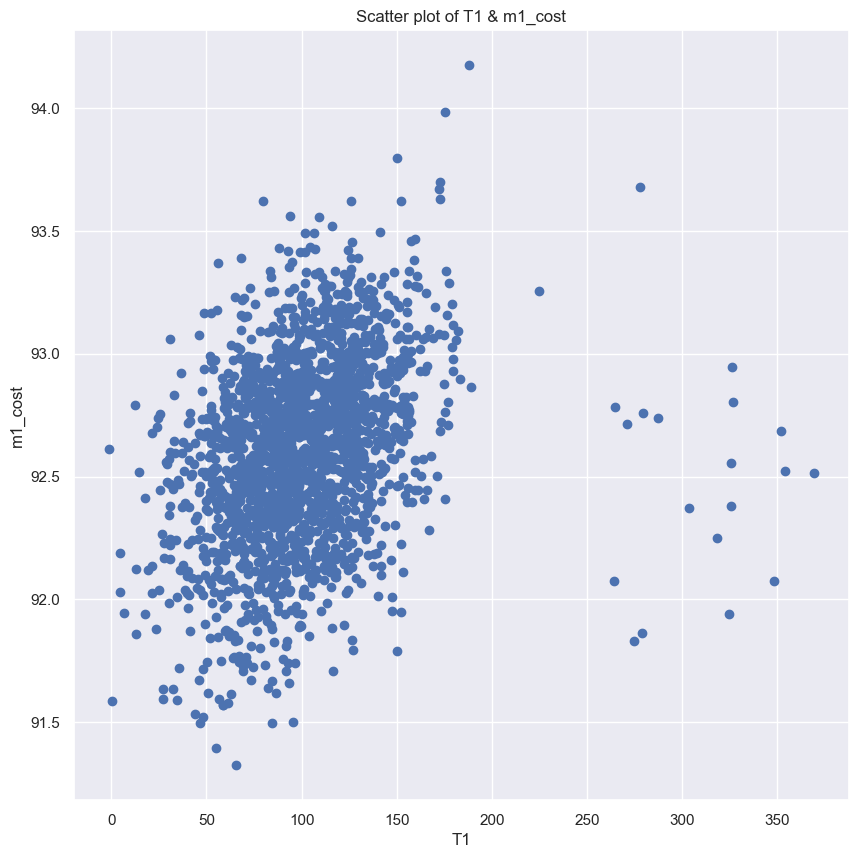

In [1128]:
#let us look at the scatter plots of the M1 inpput variables & m1_cost again

#T1 & m1_cost

x_axis=merged_df['T1']
y_axis=merged_df['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of T1 & m1_cost')

plt.show()

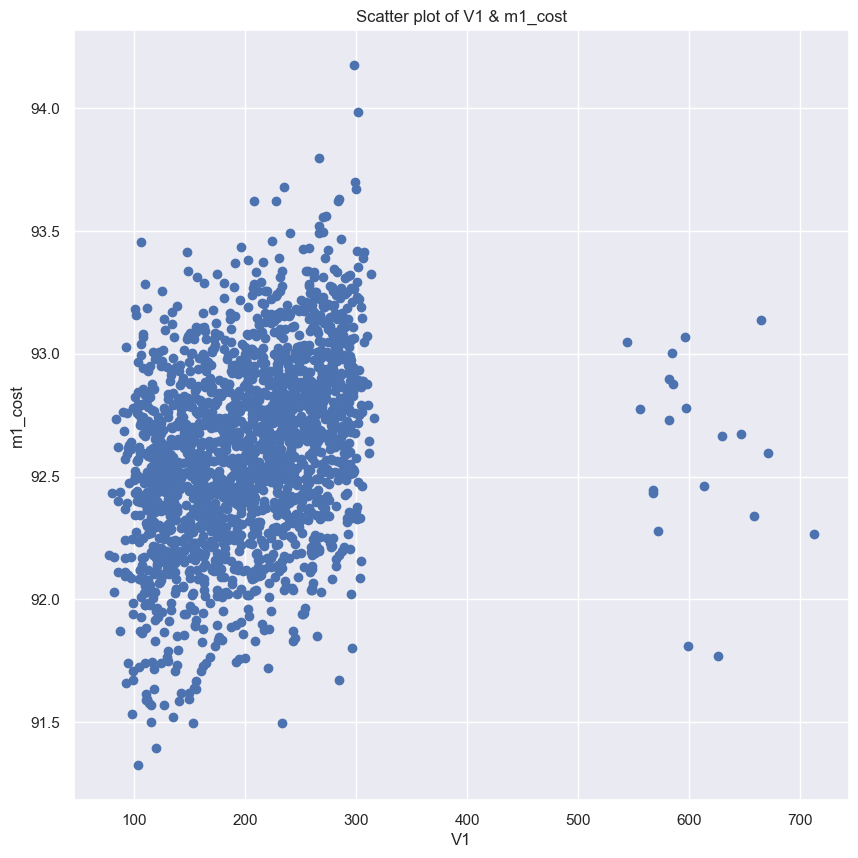

In [1129]:
#V1 & m1_cost

x_axis=merged_df['V1']
y_axis=merged_df['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of V1 & m1_cost')

plt.show()

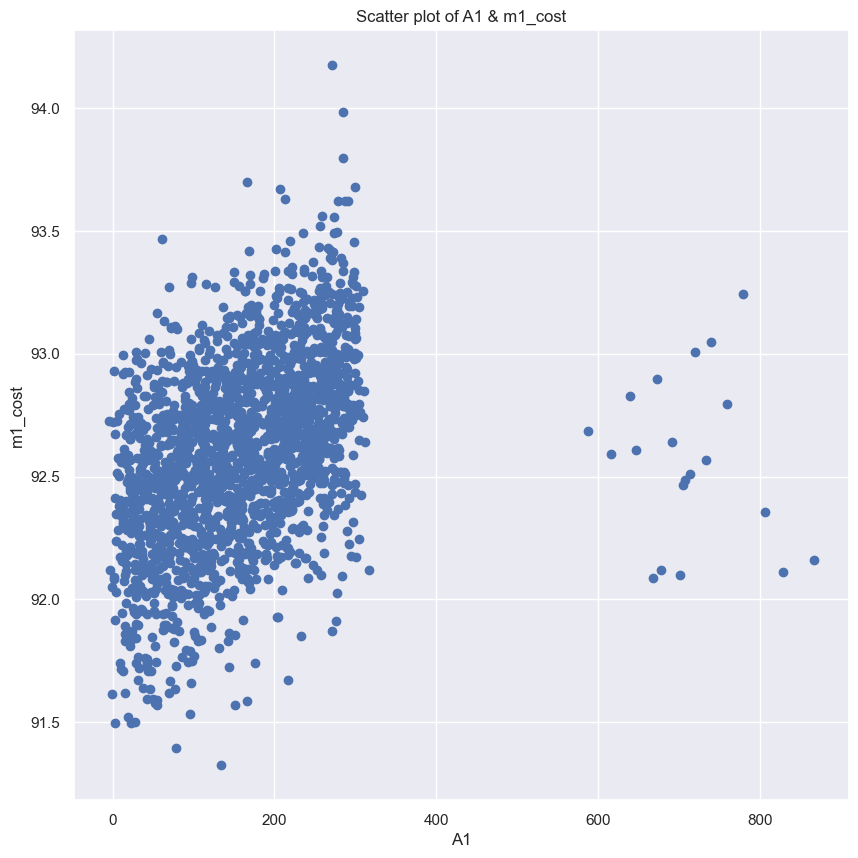

In [1130]:
#A1 & m1_cost

x_axis=merged_df['A1']
y_axis=merged_df['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of A1 & m1_cost')

plt.show()

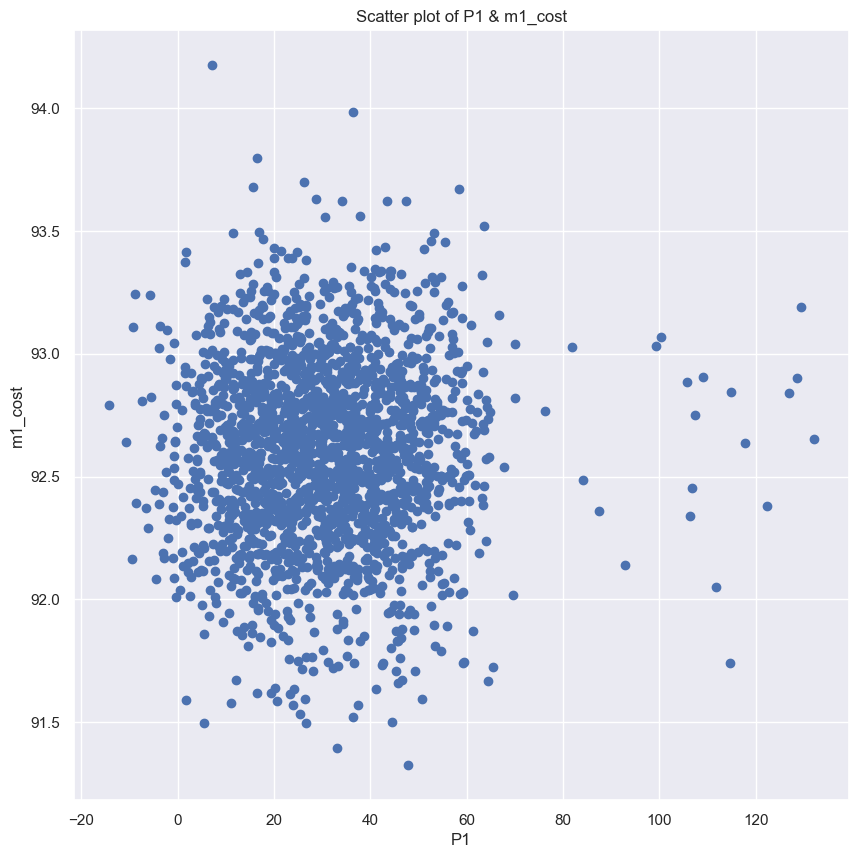

In [1131]:
#P1 & m1_cost

x_axis=merged_df['P1']
y_axis=merged_df['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of P1 & m1_cost')

plt.show()

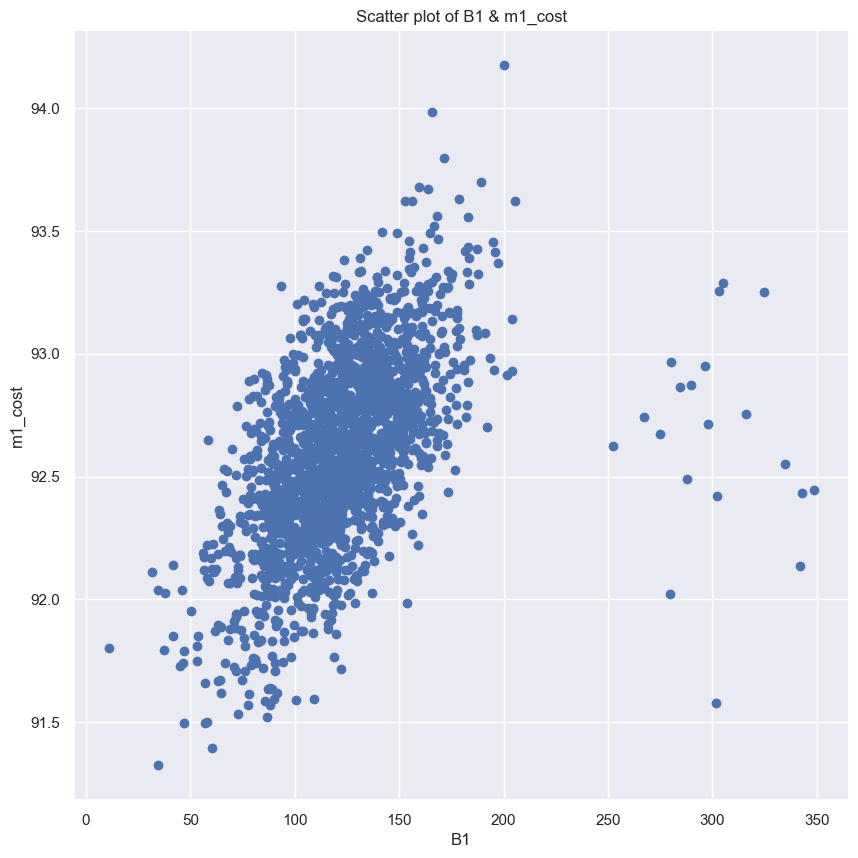

In [1132]:
#B1 & m1_cost

x_axis=merged_df['B1']
y_axis=merged_df['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of B1 & m1_cost')

plt.show()

In [1133]:
#the scatter plots suggest, for each M1 input variable, there are at least 2 clusters of data points, if not more

In [1134]:
#at least, separating the 2 clusters is required; there may be more clusters in the larger constellation of data points on the left

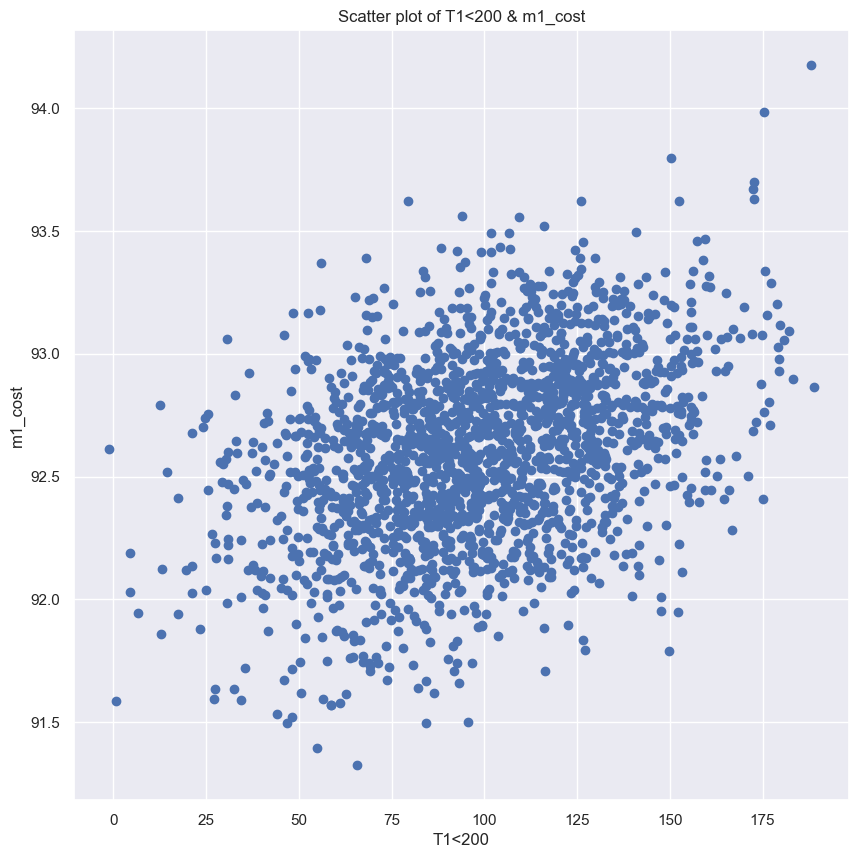

In [1135]:
#let us look at the scatter plot of T1 & m1_cost again - but, this time, separating the data points into 2 clusters at T1=200

#subset of the data frame for T1<200
merged_df_subset = merged_df[merged_df['T1']<200]

x_axis=merged_df_subset['T1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T1<200')
plt.ylabel('m1_cost')
plt.title('Scatter plot of T1<200 & m1_cost')

plt.show()

In [1136]:
#let us run a linear regression again - but, this time, using T1<200 & m1_cost

x_1=merged_df_subset[['T1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1137]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1138]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.1544211136857564
     Test= 0.15381751008697064
RMSE:
     Train= 0.34164751598687426
     Test= 0.36202649303004664


In [1139]:
#T1<200 & m1_cost - NOT a good linear regression fit (a low R2, a relatively low RMSE)

In [1140]:
#now, apply higher-degree polynomial regression functions to T1<200 & m1_cost

In [1141]:
#2nd-degree

In [1142]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [0.00000000e+00 4.21818834e-03 1.84025082e-06]
Constant term (bias) =  92.16248037362357


In [1143]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1144]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.15446815625555954
     Test= 0.15441625834302208
RMSE:
     Train= 0.34163801231967034
     Test= 0.3618983876318855


In [1145]:
#a low R2 & a relatively low RMSE indicate the correlation between T1<200 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1146]:
#3rd-degree

In [1147]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  4.08002522e-03  3.43494572e-06 -5.49884945e-09]
Constant term (bias) =  92.16589731575354


In [1148]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1149]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.15446919761597333
     Test= 0.15427011748137054
RMSE:
     Train= 0.3416378019382317
     Test= 0.36192965943540295


In [1150]:
#a low R2 & a relatively low RMSE indicate the correlation between T1<200 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

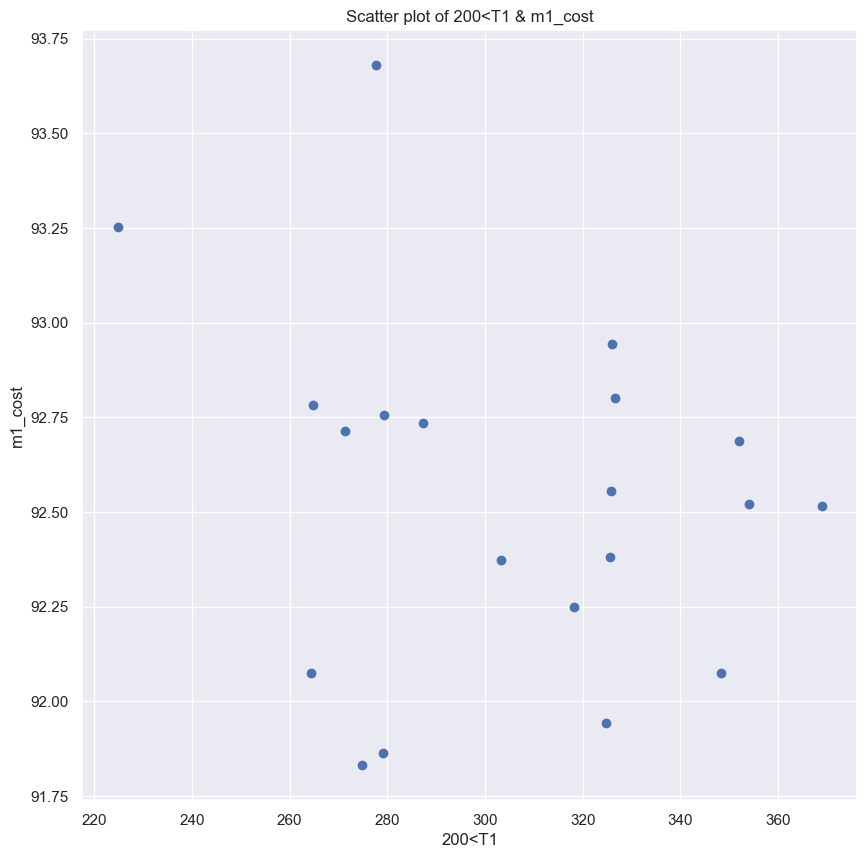

In [1151]:
#subset of the data frame for 200<T1
merged_df_subset = merged_df[200<merged_df['T1']]

x_axis=merged_df_subset['T1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('200<T1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of 200<T1 & m1_cost')

plt.show()

In [1152]:
#200<T1 & m1_cost - a linear regression function would NOT work

In [1153]:
#now, apply higher-degree polynomial regression functions to 200<T1 & m1_cost

x_1=merged_df_subset[['T1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

In [1154]:
#2nd-degree

In [1155]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -5.33851249e-02  8.48335787e-05]
Constant term (bias) =  100.7802667277444


In [1156]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1157]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.19200270296876798
     Test= -0.047219116597723376
RMSE:
     Train= 0.33713932241394273
     Test= 0.6887372407223005


In [1158]:
#a very low R2 & a relatively low RMSE indicate the correlation between 200<T1 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1159]:
#3rd-degree

In [1160]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -3.84858522e-01  1.21496270e-03 -1.26811121e-06]
Constant term (bias) =  132.7461839356221


In [1161]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1162]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.2512879612339429
     Test= -0.12604613179352997
RMSE:
     Train= 0.3245352413494411
     Test= 0.7141885399763752


In [1163]:
#a very low R2 & a relatively low RMSE indicate the correlation between 200<T1 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

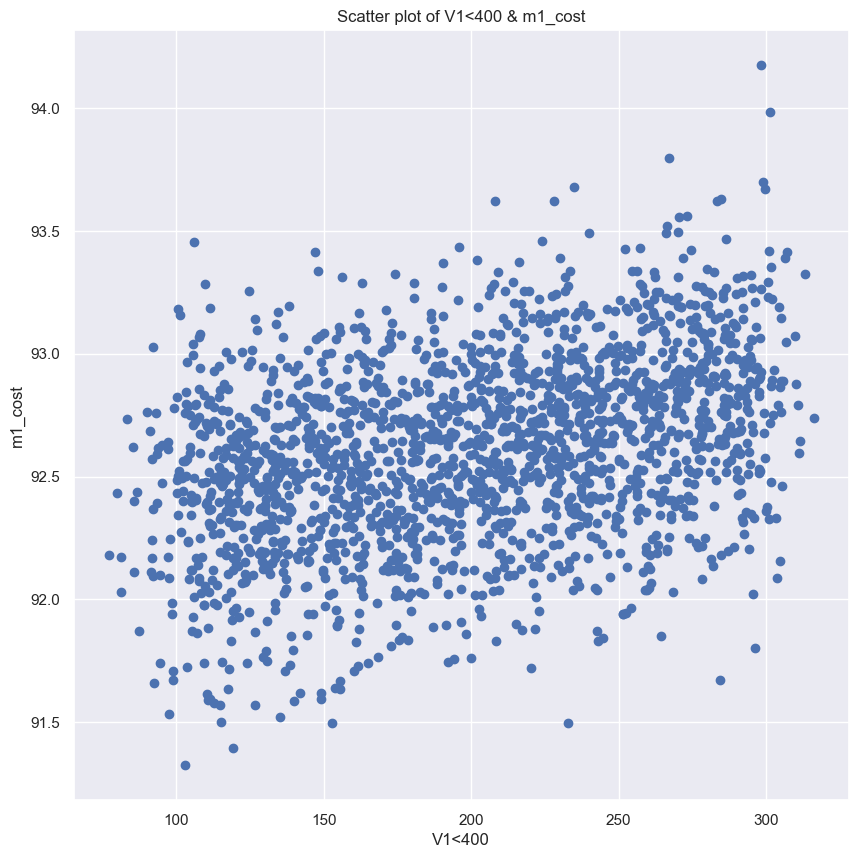

In [1164]:
#let us look at the scatter plot of V1 & m1_cost again - but, this time, separating the data points into 2 clusters at V1=400

#subset of the data frame for V1<400
merged_df_subset = merged_df[merged_df['V1']<400]

x_axis=merged_df_subset['V1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V1<400')
plt.ylabel('m1_cost')
plt.title('Scatter plot of V1<400 & m1_cost')

plt.show()

In [1165]:
#let us run a linear regression again - but, this time, using V1<400 & m1_cost

x_1=merged_df_subset[['V1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1166]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1167]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.14786548326497506
     Test= 0.10077088115893718
RMSE:
     Train= 0.3489130193543399
     Test= 0.3532606548240417


In [1168]:
#V1<400 & m1_cost - NOT a good linear regression fit (a low R2, a relatively low RMSE)

In [1169]:
#now, apply higher-degree polynomial regression functions to V1<400 & m1_cost

In [1170]:
#2nd-degree

In [1171]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [0.00000000e+00 9.37795979e-04 3.87733277e-06]
Constant term (bias) =  92.24963450364936


In [1172]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1173]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.14896779257840076
     Test= 0.10193015722090504
RMSE:
     Train= 0.3486872718195771
     Test= 0.35303287155578705


In [1174]:
#a low R2 & a relatively low RMSE indicate the correlation between V1<400 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1175]:
#3rd-degree

In [1176]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -2.31866990e-03  2.11901360e-05 -2.90049364e-08]
Constant term (bias) =  92.4405201773793


In [1177]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1178]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.14916360296258413
     Test= 0.10038872924965159
RMSE:
     Train= 0.34864715552557624
     Test= 0.3533357107197164


In [1179]:
#a low R2 & a relatively low RMSE indicate the correlation between V1<400 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

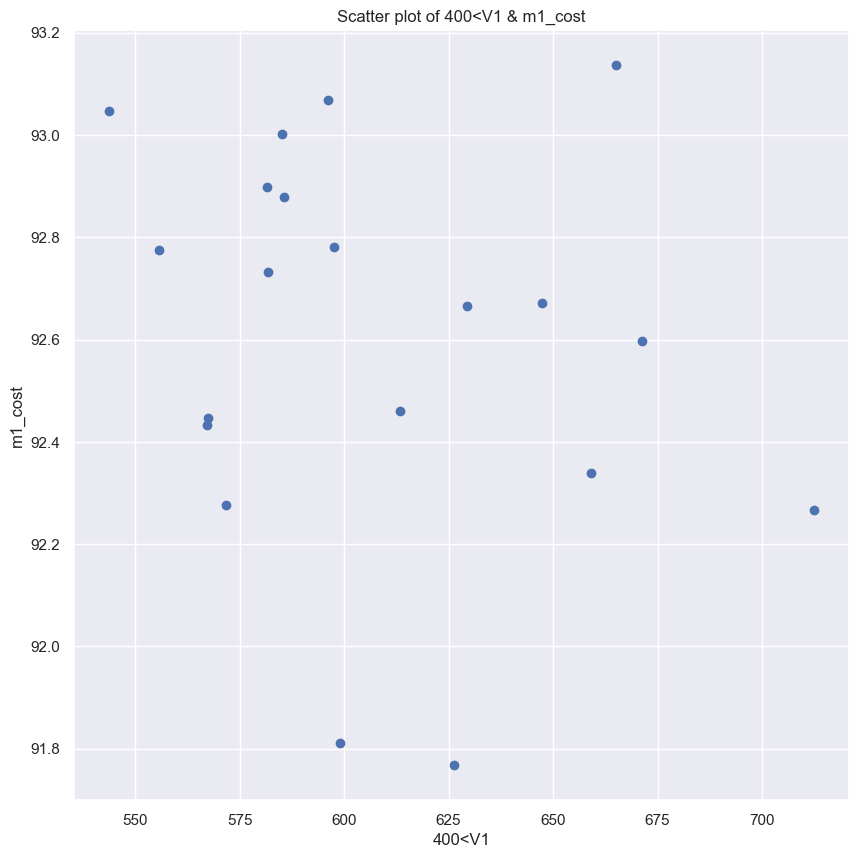

In [1180]:
#subset of the data frame for 400<V1
merged_df_subset = merged_df[400<merged_df['V1']]

x_axis=merged_df_subset['V1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('400<V1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of 400<V1 & m1_cost')

plt.show()

In [1181]:
#400<V1 & m1_cost - a linear regression function would NOT work

In [1182]:
#now, apply higher-degree polynomial regression functions to 400<V1 & m1_cost

x_1=merged_df_subset[['V1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

In [1183]:
#2nd-degree

In [1184]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -9.10522168e-03  5.78790705e-06]
Constant term (bias) =  95.99358503975033


In [1185]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1186]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.06161802047606657
     Test= 0.022420821847131678
RMSE:
     Train= 0.3366454471921481
     Test= 0.4576814301427279


In [1187]:
#a very low R2 & a relatively low RMSE indicate the correlation between 400<V1 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1188]:
#3rd-degree

In [1189]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -9.15734192e-01  1.45461767e-03 -7.68620834e-07]
Constant term (bias) =  284.3466509479091


In [1190]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1191]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.11774185460510267
     Test= 0.03874076336242349
RMSE:
     Train= 0.3264230017591856
     Test= 0.45384502946409927


In [1192]:
#a very low R2 & a relatively low RMSE indicate the correlation between 400<V1 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

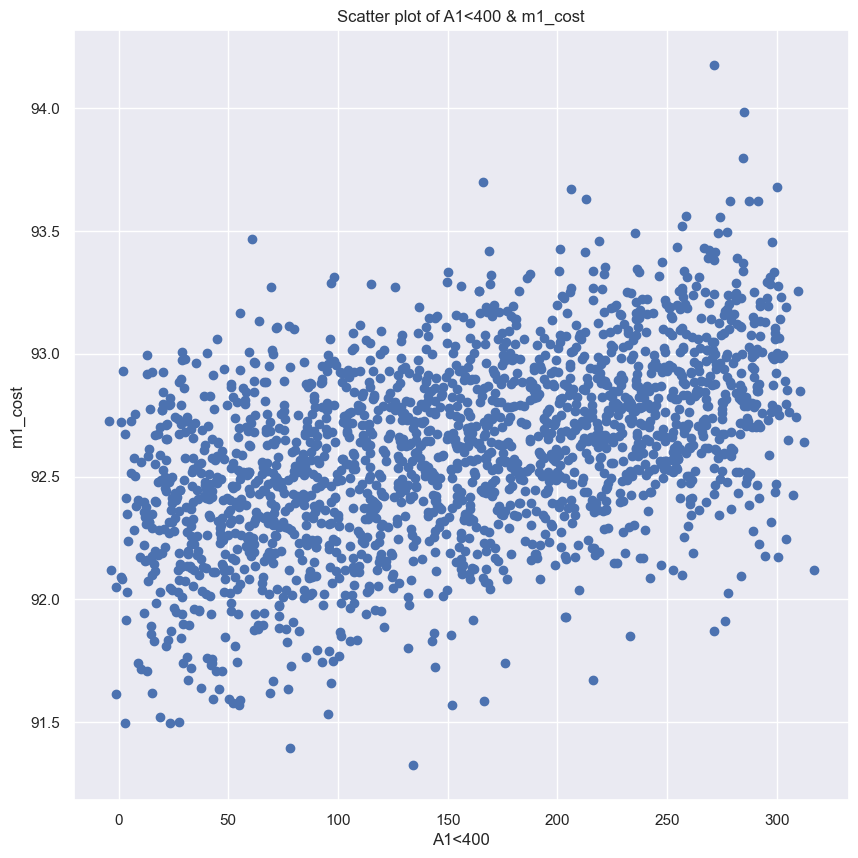

In [1193]:
#let us look at the scatter plot of A1 & m1_cost again - but, this time, separating the data points into 2 clusters at A1=400

#subset of the data frame for A1<400
merged_df_subset = merged_df[merged_df['A1']<400]

x_axis=merged_df_subset['A1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A1<400')
plt.ylabel('m1_cost')
plt.title('Scatter plot of A1<400 & m1_cost')

plt.show()

In [1194]:
#let us run a linear regression again - but, this time, using A1<400 & m1_cost

x_1=merged_df_subset[['A1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1195]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1196]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.21446223294057032
     Test= 0.2782391650629702
RMSE:
     Train= 0.3289710664384087
     Test= 0.3406170346541051


In [1197]:
#A1<400 & m1_cost - NOT a good linear regression fit (a low R2, a relatively low RMSE)

In [1198]:
#now, apply higher-degree polynomial regression functions to A1<400 & m1_cost

In [1199]:
#2nd-degree

In [1200]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [0.00000000e+00 1.81719900e-03 8.38632941e-07]
Constant term (bias) =  92.29026870096767


In [1201]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1202]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.2146693070645953
     Test= 0.2775742690821399
RMSE:
     Train= 0.32892770386044046
     Test= 0.3407738890804253


In [1203]:
#a low R2 & a relatively low RMSE indicate the correlation between 400<V1 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1204]:
#3rd-degree

In [1205]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.54902354e-04  1.38898604e-05 -2.80921475e-08]
Constant term (bias) =  92.33885236953417


In [1206]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1207]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.21608395449074846
     Test= 0.2716358553878634
RMSE:
     Train= 0.3286313150453998
     Test= 0.3421716207658058


In [1208]:
#a low R2 & a relatively low RMSE indicate the correlation between 400<V1 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

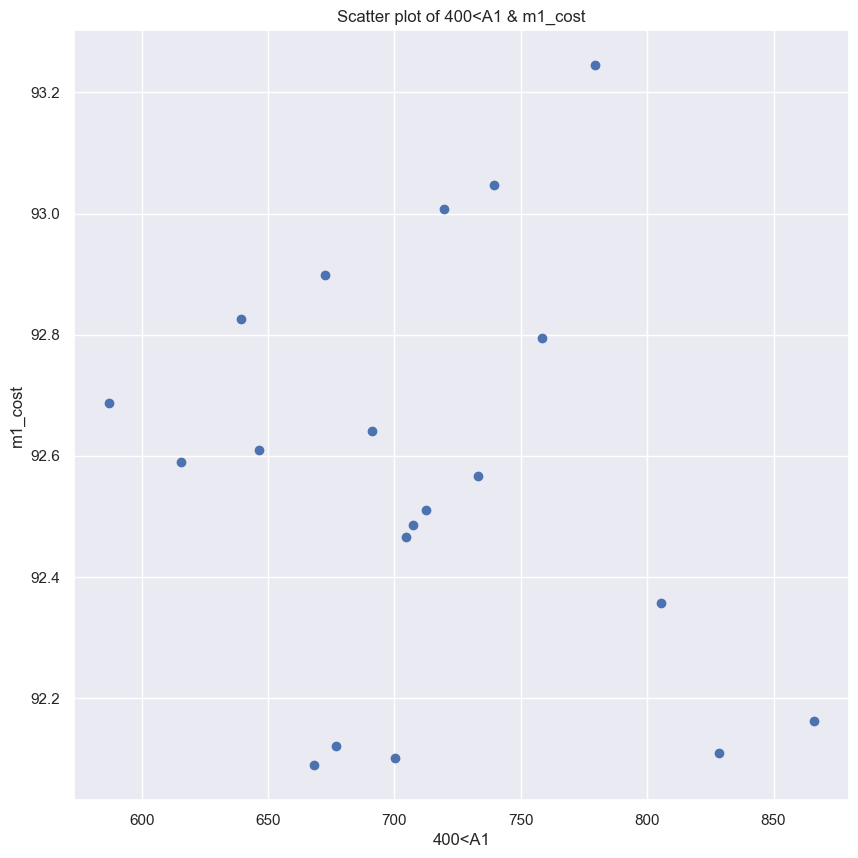

In [1209]:
#subset of the data frame for 400<A1
merged_df_subset = merged_df[400<merged_df['A1']]

x_axis=merged_df_subset['A1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('400<A1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of 400<A1 & m1_cost')

plt.show()

In [1210]:
#400<A1 & m1_cost - a linear regression function would NOT work

In [1211]:
#now, apply higher-degree polynomial regression functions to 400<A1 & m1_cost

x_1=merged_df_subset[['A1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

In [1212]:
#2nd-degree

In [1213]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.06333393e-02 -8.09561154e-06]
Constant term (bias) =  89.10284127154685


In [1214]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1215]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.033287839422088905
     Test= 0.08971091388143648
RMSE:
     Train= 0.3052946580658181
     Test= 0.39007330589397843


In [1216]:
#a very low R2 & a relatively low RMSE indicate the correlation between 400<A1 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1217]:
#3rd-degree

In [1218]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -6.81404446e-01  9.74617134e-04 -4.61973364e-07]
Constant term (bias) =  250.4408800412989


In [1219]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1220]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.23215780746991133
     Test= -0.8109831407360171
RMSE:
     Train= 0.27208625353325133
     Test= 0.550191360816199


In [1221]:
#a very low R2 & a relatively low RMSE indicate the correlation between 400<A1 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

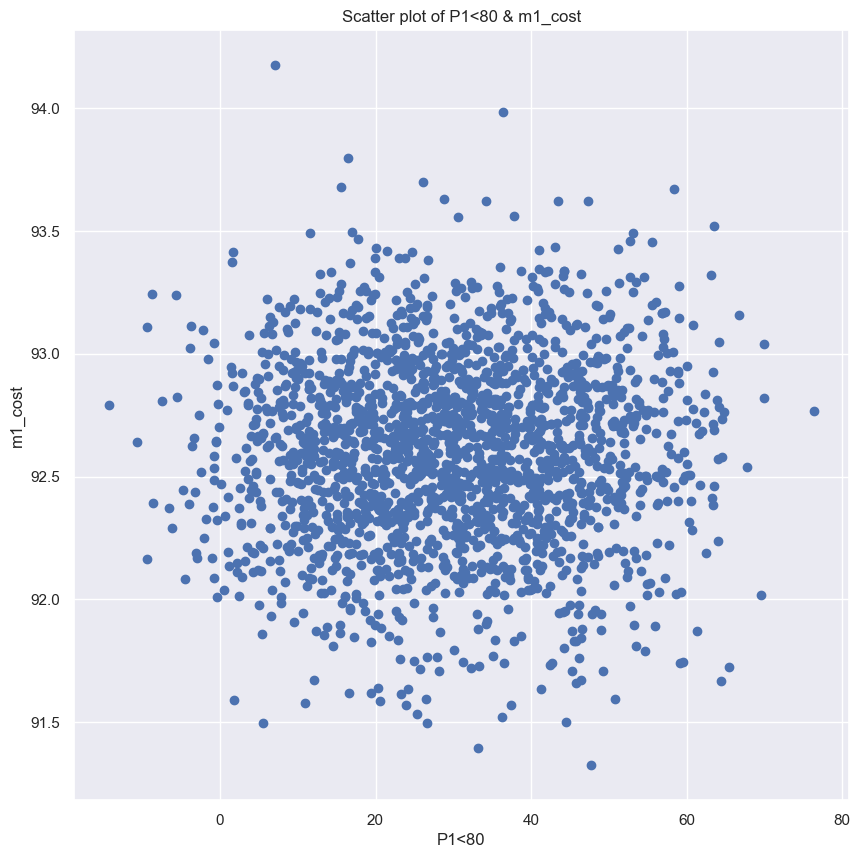

In [1222]:
#let us look at the scatter plot of P1 & m1_cost again - but, this time, separating the data points into 2 clusters at P1=80

#subset of the data frame for P1<80
merged_df_subset = merged_df[merged_df['P1']<80]

x_axis=merged_df_subset['P1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P1<80')
plt.ylabel('m1_cost')
plt.title('Scatter plot of P1<80 & m1_cost')

plt.show()

In [1223]:
#P1<80 & m1_cost - a linear regression function would NOT work

In [1224]:
#now, apply higher-degree polynomial regression functions to P1<80 & m1_cost

x_1=merged_df_subset[['P1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

In [1225]:
#2nd-degree

In [1226]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -1.54919848e-04  6.82649316e-06]
Constant term (bias) =  92.6003782982932


In [1227]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1228]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.00012966753082443994
     Test= 0.0011843563520018696
RMSE:
     Train= 0.3811756674502601
     Test= 0.3598685918946602


In [1229]:
#a very low R2 & a relatively low RMSE indicate the correlation between P1<80 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1230]:
#3rd-degree

In [1231]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.73134414e-03 -7.50701203e-05  9.21858441e-07]
Constant term (bias) =  92.59227715463874


In [1232]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1233]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.00033620162650593866
     Test= 0.0009317763783729394
RMSE:
     Train= 0.38113629742644195
     Test= 0.3599140907083539


In [1234]:
#a very low R2 & a relatively low RMSE indicate the correlation between P1<80 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

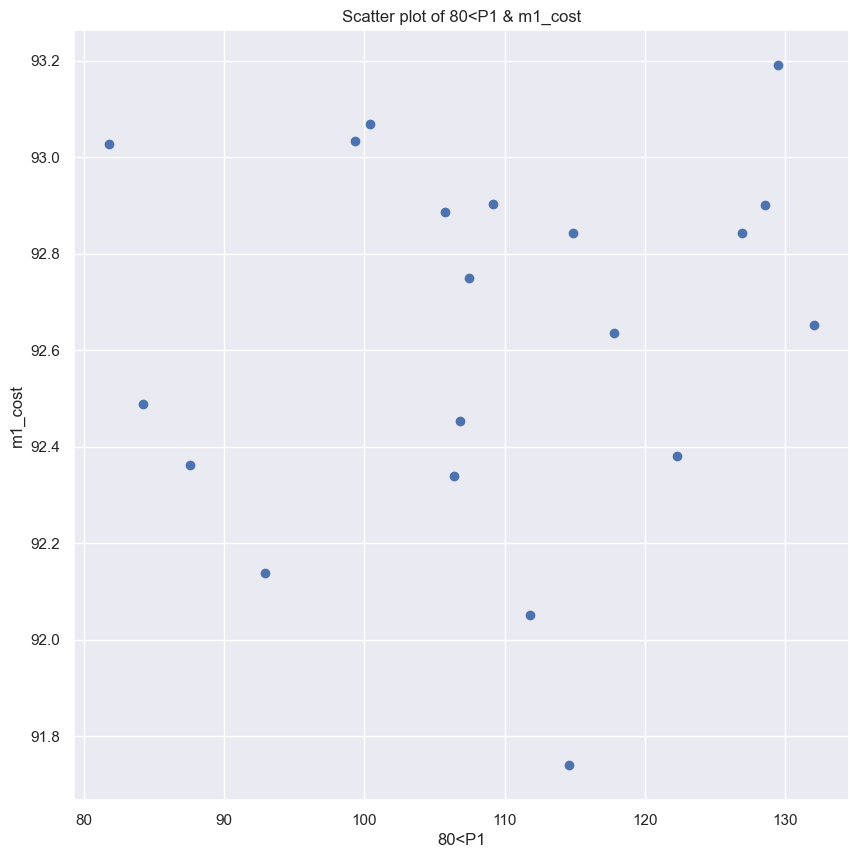

In [1235]:
#subset of the data frame for 80<P1
merged_df_subset = merged_df[80<merged_df['P1']]

x_axis=merged_df_subset['P1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('80<P1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of 80<P1 & m1_cost')

plt.show()

In [1236]:
#80<P1 & m1_cost - a linear regression function would NOT work

In [1237]:
#now, apply higher-degree polynomial regression functions to 80<P1 & m1_cost

x_1=merged_df_subset[['P1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

In [1238]:
#2nd-degree

In [1239]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.         -0.0580659   0.00027712]
Constant term (bias) =  95.65860517258841


In [1240]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1241]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.036661353514156225
     Test= -0.05306325673102141
RMSE:
     Train= 0.3320451529267639
     Test= 0.4750462989750834


In [1242]:
#a very low R2 & a relatively low RMSE indicate the correlation between 80<P1 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1243]:
#3rd-degree

In [1244]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -1.48569350e-02 -1.31070915e-04  1.26851255e-06]
Constant term (bias) =  94.15491179491971


In [1245]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1246]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.03675952707932839
     Test= -0.04447179525942491
RMSE:
     Train= 0.3320282331825302
     Test= 0.4731044875353665


In [1247]:
#a very low R2 & a relatively low RMSE indicate the correlation between 80<P1 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

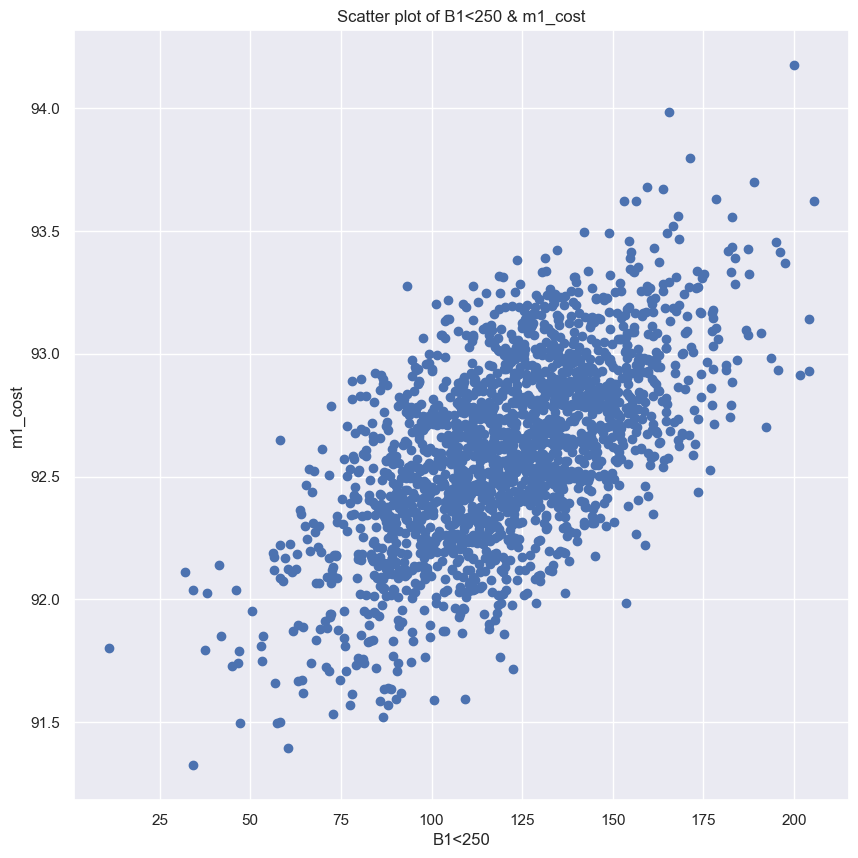

In [1248]:
#let us look at the scatter plot of B1 & m1_cost again - but, this time, separating the data points into 2 clusters at B1=250

#subset of the data frame for B1<250
merged_df_subset = merged_df[merged_df['B1']<250]

x_axis=merged_df_subset['B1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B1<250')
plt.ylabel('m1_cost')
plt.title('Scatter plot of B1<250 & m1_cost')

plt.show()

In [1249]:
#let us run a linear regression again - but, this time, using B1<250 & m1_cost

x_1=merged_df_subset[['B1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1250]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1251]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.3815113160529171
     Test= 0.3565869798100991
RMSE:
     Train= 0.2969781791788306
     Test= 0.2981312712487014


In [1252]:
#B1<250 & m1_cost - NOT a good linear regression fit (a relatively low R2, a relatively low RMSE)

In [1253]:
#now, apply higher-degree polynomial regression functions to B1<250 & m1_cost

In [1254]:
#2nd-degree

In [1255]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.12060795e-02 -1.09211133e-05]
Constant term (bias) =  91.42198271923749


In [1256]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1257]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.38248313050516103
     Test= 0.35691429206835923
RMSE:
     Train= 0.29674477058662113
     Test= 0.298055430047137


In [1258]:
#a relatively low R2 & a relatively low RMSE indicate the correlation between B1<250 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1259]:
#3rd-degree

In [1260]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.49752745e-02 -4.48554730e-05  9.61208737e-08]
Constant term (bias) =  91.2917981708993


In [1261]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1262]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.3826782087365731
     Test= 0.35698541236374925
RMSE:
     Train= 0.2966978949298918
     Test= 0.2980389482811171


In [1263]:
#a relatively low R2 & a relatively low RMSE indicate the correlation between B1<250 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

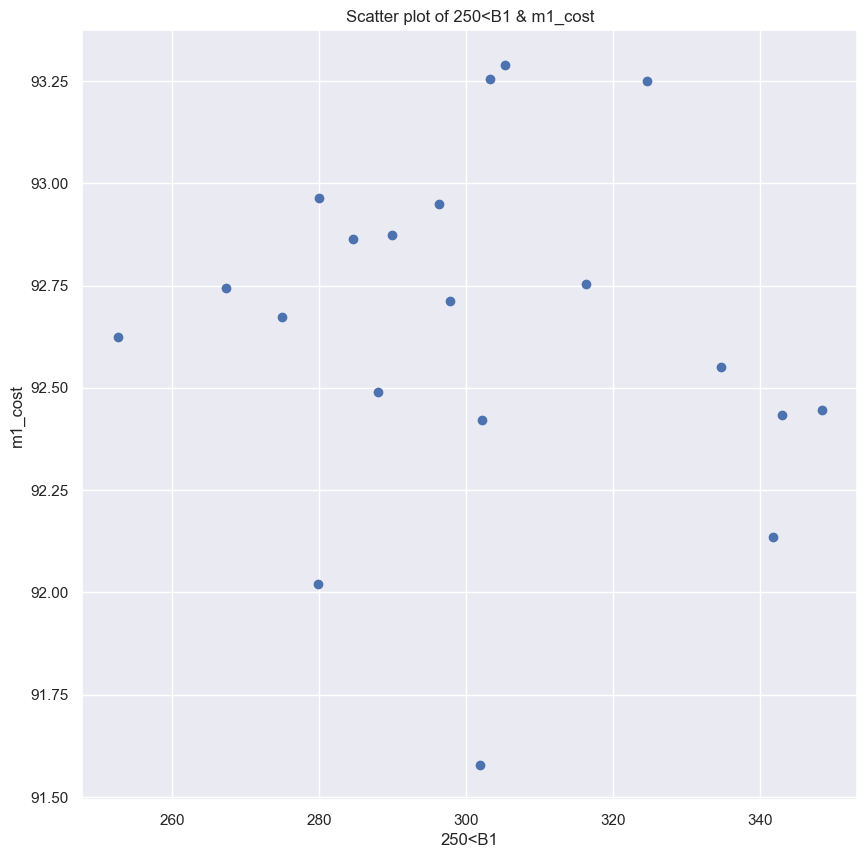

In [1264]:
#subset of the data frame for 250<B1
merged_df_subset = merged_df[250<merged_df['B1']]

x_axis=merged_df_subset['B1']
y_axis=merged_df_subset['m1_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('250<B1')
plt.ylabel('m1_cost')
plt.title('Scatter plot of 250<B1 & m1_cost')

plt.show()

In [1265]:
#250<B1 & m1_cost - a linear regression function would NOT work

In [1266]:
#now, apply higher-degree polynomial regression functions to 250<B1 & m1_cost

x_1=merged_df_subset[['B1']]
y_1=merged_df_subset['m1_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

In [1267]:
#2nd-degree

In [1268]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.          0.06870031 -0.00011696]
Constant term (bias) =  82.61337883592957


In [1269]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1270]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.07696816719048483
     Test= -0.5272671516292344
RMSE:
     Train= 0.40829842928175986
     Test= 0.3841672828137102


In [1271]:
#a very low R2 & a relatively low RMSE indicate the correlation between 250<B1 & m1_cost cannot be adequately explained by a 2nd-degree polynomial regression function

In [1272]:
#3rd-degree

In [1273]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -1.03360527e+00  3.58202159e-03 -4.11155956e-06]
Constant term (bias) =  191.42821133804225


In [1274]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1275]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.10406318508169465
     Test= -0.3612132835310802
RMSE:
     Train= 0.4022611223758209
     Test= 0.3626819646351712


In [1276]:
#a very low R2 & a relatively low RMSE indicate the correlation between 250<B1 & m1_cost cannot be adequately explained by a 3rd-degree polynomial regression function

In [1277]:
#multivariate linear regression using all M1 input variables & m2_cost

#do the M1 input variables predict m2_cost?

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_2=merged_df['m2_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_2, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1278]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1279]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.0021242763835518375
     Test= -0.009024834113758429
RMSE:
     Train= 1.006036874605061
     Test= 1.0211881609633393


In [1280]:
#a very low R2 & a high RMSE indicate the 5 M1 input variables do NOT predict m2_cost well at all

In [1281]:
#now, apply higher-degree polynomial regression functions to all M1 input variables & m2_cost

In [1282]:
#2nd-degree

In [1283]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -7.45103825e-04  1.18236613e-03 -3.09225356e-03
  1.62155622e-03  3.69663951e-03  4.40347261e-06 -3.42037069e-06
  8.17751131e-06  2.50047221e-05 -1.56199994e-05  1.36037307e-06
  5.82211739e-07 -2.69034329e-05 -5.99658004e-06  1.13805463e-06
  2.35285299e-05  5.48246980e-06  2.28380404e-05 -1.95058065e-05
 -1.41392628e-06]
Constant term (bias) =  101.58444852747733


In [1284]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1285]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.008363278146002906
     Test= -0.032224632251430796
RMSE:
     Train= 1.0028869295022627
     Test= 1.0328611753979628


In [1286]:
#a very low R2 & a high RMSE indicate the 5 M1 input variables do NOT predict m2_cost well at all as a 2nd-degree polynomial regression function

In [1287]:
#3rd-degree

In [1288]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [-1.73537146e-11  1.57041498e-02 -1.49457835e-02 -5.46325268e-03
  3.35374165e-02  1.17403192e-02  4.26507663e-05 -2.99762451e-05
 -3.28456367e-05 -4.07591091e-04 -1.42489998e-04  2.32050706e-05
  4.38907439e-05  1.49676330e-04  9.29555995e-05 -3.63349223e-06
  1.46749300e-04 -9.72339786e-06 -5.01223948e-04 -2.36719883e-04
 -5.73162761e-05 -2.17333536e-08 -1.21198293e-07  2.17598187e-07
  2.55514616e-07 -3.83937346e-07  7.41495784e-08 -1.03897152e-07
  5.77464616e-07  1.53544537e-07  1.97433050e-08 -3.92314070e-07
  1.19262783e-07  8.73845930e-07  1.82350538e-06  4.28336723e-07
 -2.25876388e-09 -1.12122427e-08 -1.57670985e-07 -1.72363553e-07
 -7.87002956e-09 -4.30489025e-07 -7.33192006e-08  4.26910857e-07
 -1.09701839e-06  5.01001797e-08  5.06478529e-09 -6.36496044e-08
  1.34904655e-08  5.18311985e-07 -4.45565712e-08  4.24698186e-08
  3.61658695e-07  1.59299516e-06  3.79893210e-07 -3.34423216e-08]
Constant term (bias) =  101.59135984128302


In [1289]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1290]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.03226329103547865
     Test= -0.04495076428983813
RMSE:
     Train= 0.9907276377733272
     Test= 1.0392086609856268


In [1291]:
#a very low R2 & a high RMSE indicate the 5 M1 input variables do NOT predict m2_cost well at all as a 3rd-degree polynomial regression function

In [1292]:
#multivariate linear regression using all M1 input variables & m3_cost

#do the M1 input variables predict m3_cost?

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_3=merged_df['m3_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_3, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1293]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1294]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.0017797370548251479
     Test= 0.0012713563256562255
RMSE:
     Train= 0.5967186920779269
     Test= 0.6027421434931188


In [1295]:
#a very low R2 & a relatively high RMSE indicate the 5 M1 input variables do NOT predict m3_cost well at all

In [1296]:
#now, apply higher-degree polynomial regression functions to all M1 input variables & m3_cost

In [1297]:
#2nd-degree

In [1298]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00 -6.57087827e-04  9.20774170e-04 -6.89152451e-04
 -2.50980817e-03  2.16052427e-03 -1.40202100e-06  3.66596252e-06
  6.83953344e-06  4.47310035e-05 -1.10417618e-05 -1.56190553e-06
 -3.94777040e-07 -8.58334359e-06 -1.13288407e-06  3.08882730e-07
  1.81833003e-06 -4.11865437e-07 -6.65238443e-06 -1.45376416e-06
 -3.01745867e-06]
Constant term (bias) =  96.1680876109095


In [1299]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1300]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.008545231137177423
     Test= -0.031732067955460685
RMSE:
     Train= 0.5946931068327512
     Test= 0.6126201397836825


In [1301]:
#a very low R2 & a relatively high RMSE indicate the 5 M1 input variables do NOT predict m3_cost well at all as a 2nd-degree polynomial regression function

In [1302]:
#3rd-degree

In [1303]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [-1.39501781e-13  1.36212095e-03 -9.52257059e-03  1.12944500e-03
  1.17077170e-02 -1.37244640e-02 -4.06787281e-05  8.10819840e-05
 -7.16424090e-06  1.82584413e-05 -8.07874250e-05 -3.21903158e-06
  5.46466368e-06 -2.08328251e-06  9.71042551e-05  1.63473288e-06
  1.42115627e-05 -3.47357324e-05 -2.81493729e-04 -7.81615767e-05
  7.86517466e-05  2.53238001e-08 -7.90063424e-08  1.98270427e-08
 -1.53328717e-07  3.56867035e-07  1.97636828e-08 -1.87135426e-07
 -3.54292875e-07 -2.30042343e-07 -8.02701877e-09  1.06157244e-07
  3.82068544e-07  7.36149730e-07  6.88540913e-07 -1.48815250e-07
  8.47395191e-09  4.19063380e-09 -5.67385538e-08 -6.03815271e-08
  6.76482976e-09  1.99974716e-07  1.13777512e-08  6.63481560e-07
 -2.28856255e-07 -1.17271976e-07 -2.28425775e-09 -2.20119517e-08
  1.03338419e-08 -4.79842061e-09 -4.50733571e-07  1.25864656e-08
 -9.81857398e-08  5.81201412e-07  2.89368745e-07 -1.02175228e-07]
Constant term (bias) =  97.3515132098603


In [1304]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1305]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.029420627359575624
     Test= -0.1188702056412263
RMSE:
     Train= 0.5883990733848902
     Test= 0.6379661852348221


In [1306]:
#a very low R2 & a relatively high RMSE indicate the 5 M1 input variables do NOT predict m3_cost well at all as a 3rd-degree polynomial regression function

In [1307]:
#multivariate linear regression using all M1 input variables & m4_cost

#do the M1 input variables predict m4_cost?

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_4=merged_df['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1308]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1309]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.0023079933716999568
     Test= -0.00030093273744546956
RMSE:
     Train= 0.4034504309823861
     Test= 0.41730665162224495


In [1310]:
#a very low R2 & a relatively low RMSE indicate the 5 M1 input variables do NOT predict m4_cost well at all

In [1311]:
#now, apply higher-degree polynomial regression functions to all M1 input variables & m4_cost

In [1312]:
#2nd-degree

In [1313]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  5.44791447e-04  9.11707172e-04  4.41914510e-04
  1.22295397e-03  1.96876847e-05  3.91711465e-06 -1.62561562e-06
 -1.96057351e-07  1.73214643e-05 -1.33260762e-05 -7.28241229e-07
 -1.29550192e-06 -4.77761553e-06  5.23413335e-07 -1.29443288e-07
 -3.92336897e-07  4.77329816e-07 -1.66648311e-05 -2.48125753e-07
  2.70563600e-06]
Constant term (bias) =  96.42197179180499


In [1314]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1315]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.010217248674188384
     Test= 0.0019030327265098235
RMSE:
     Train= 0.4018480618035401
     Test= 0.41684667173652046


In [1316]:
#a very low R2 & a relatively low RMSE indicate the 5 M1 input variables do NOT predict m4_cost well at all as a 2nd-degree polynomial regression function

In [1317]:
#3rd-degree

In [1318]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [-5.14604980e-12  2.44106437e-03 -5.34233466e-03  6.94292106e-03
 -5.49557815e-03 -2.42570100e-03 -2.56599849e-05  7.09205750e-06
 -4.06783938e-05  1.58235152e-04  2.41436224e-05  9.86930851e-06
 -1.86445569e-06  2.40783602e-05  4.62932898e-05 -9.06774104e-06
 -1.47408932e-05 -3.34700347e-05 -3.14307599e-05 -4.04245037e-05
 -8.10208979e-06  3.57444658e-08  1.05673874e-07  1.15978665e-08
 -1.41872779e-07 -4.12836525e-08  4.68439455e-09  4.66971614e-08
 -3.59583356e-07 -2.90627814e-07  2.29208323e-08  2.69325067e-08
  1.28570022e-07 -3.87037251e-09 -2.47388849e-07  6.61577255e-08
 -2.51207606e-09 -9.53684837e-09 -8.18109298e-08 -3.63112320e-08
 -4.70487360e-10  4.80608329e-08 -1.79197753e-08  4.03687651e-07
  1.08804630e-07  1.61957278e-08  4.63632681e-09 -1.13086223e-08
  1.91050266e-08  1.34309165e-08  5.17132731e-08  5.97838381e-08
 -1.17049530e-07 -4.98763791e-07  2.76027429e-07 -3.60583267e-08]
Constant term (bias) =  96.62709704837717


In [1319]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1320]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.03094264502892141
     Test= -0.051391916793879444
RMSE:
     Train= 0.39761858772057895
     Test= 0.42783103691231966


In [1321]:
#a very low R2 & a relatively low RMSE indicate the 5 M1 input variables do NOT predict m4_cost well at all as a 3rd-degree polynomial regression function

# Note: a linear (or polynomial) regression function would NOT be a suitable approach to explain conta_d since conta_d is a 0-or-1 categorical variable

# M2

In [1322]:
#given the results of M1 above, we will apply polynomial regression functions & related analyses to M2 only where the initial linear regression appears to show a meaningful correlation

In [1323]:
#the previous visual scan suggests a potential correlation between B2 & m3_cost for M2

#linear regression using B1 & m1_cost

x_2=merged_df[['B2']]
y_2=merged_df['m3_cost']

In [1324]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1325]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1326]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.3069334289137391
     Test= 0.2206228449530243
RMSE:
     Train= 0.49780714412296284
     Test= 0.5290336680346787


In [1327]:
#a relatively low R2 & a relatively high RMSE indicate the correlation between B2 & m3_cost cannot be adequately explained by a linear regression function

In [1328]:
#multivariate linear regression using all M2 input variables & m2_cost

x_2=merged_df[['T2', 'V2', 'A2', 'P2', 'B2']]
y_2=merged_df['m2_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1329]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1330]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.08361033590169797
     Test= 0.060295365352540764
RMSE:
     Train= 0.9658906699790786
     Test= 0.9749099981517433


In [1331]:
#a very low R2 & a high RMSE indicate the 5 M2 input variables do NOT predict m2_cost well at all

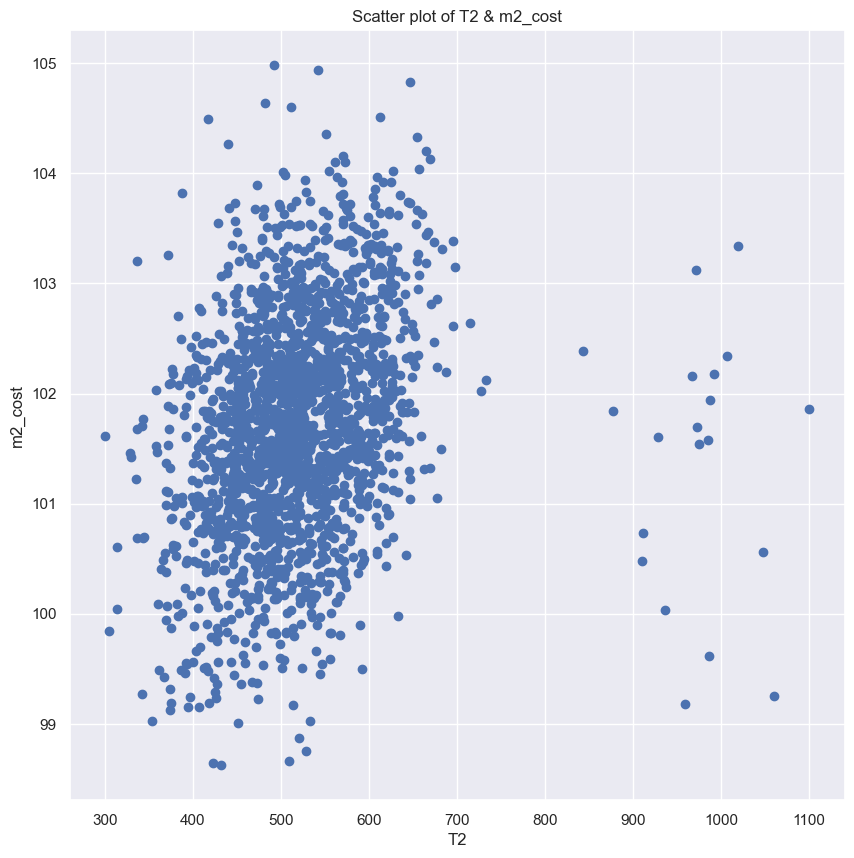

In [1332]:
#let us look at the scatter plots of the M2 input variables & m2_cost again

#T2 & m2_cost

x_axis=merged_df['T2']
y_axis=merged_df['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of T2 & m2_cost')

plt.show()

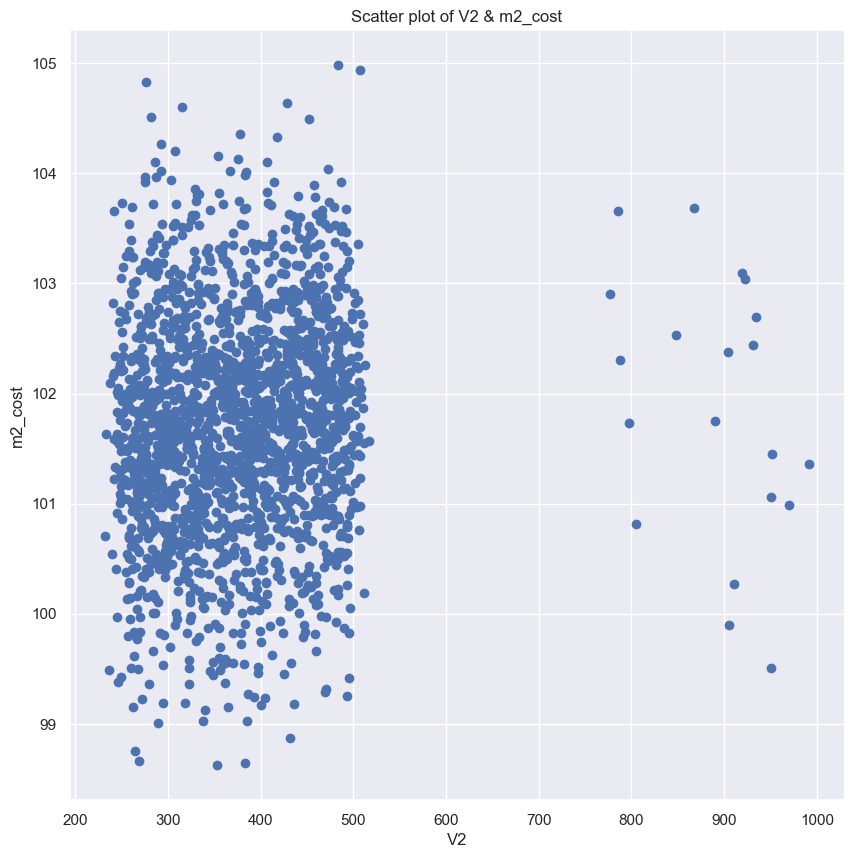

In [1333]:
#V2 & m2_cost

x_axis=merged_df['V2']
y_axis=merged_df['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of V2 & m2_cost')

plt.show()

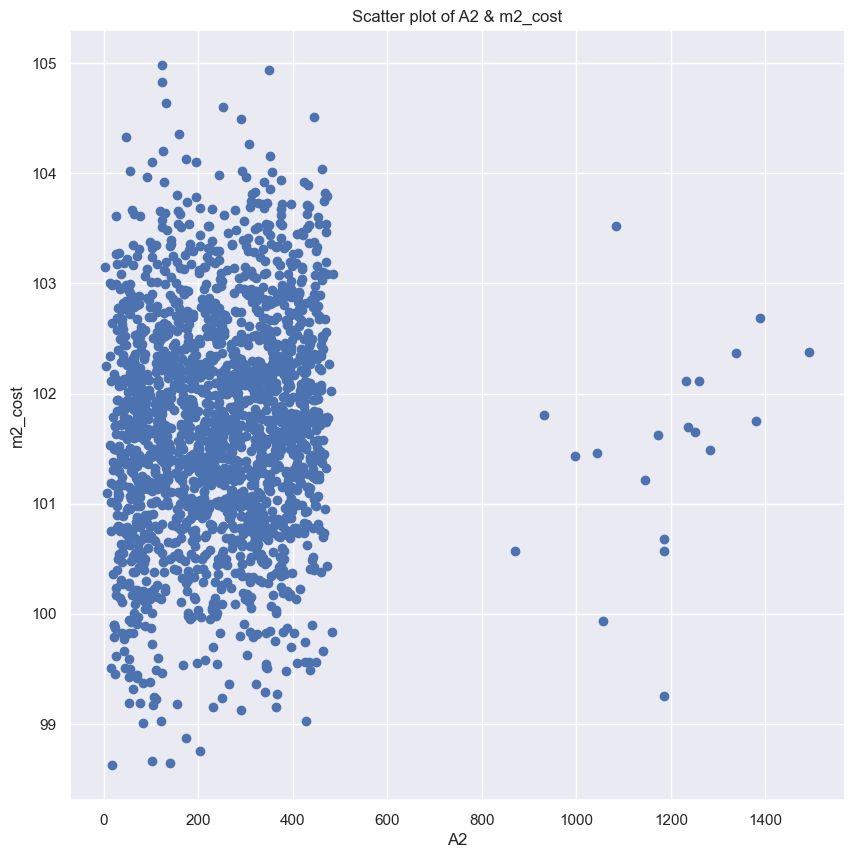

In [1334]:
#A2 & m2_cost

x_axis=merged_df['A2']
y_axis=merged_df['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of A2 & m2_cost')

plt.show()

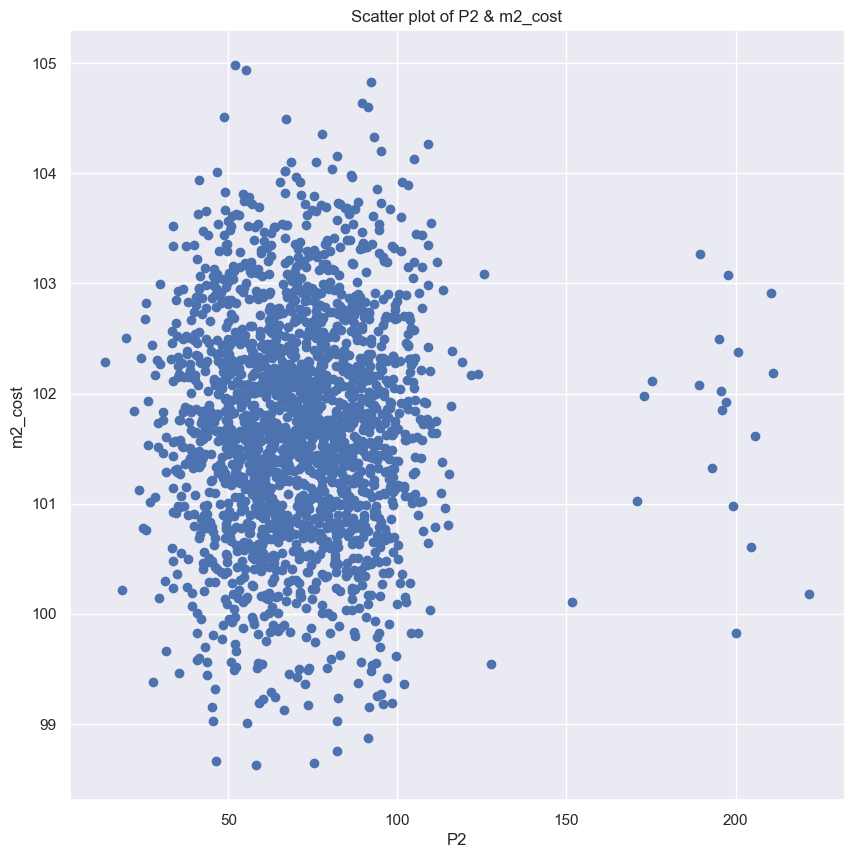

In [1335]:
#P2 & m2_cost

x_axis=merged_df['P2']
y_axis=merged_df['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of P2 & m2_cost')

plt.show()

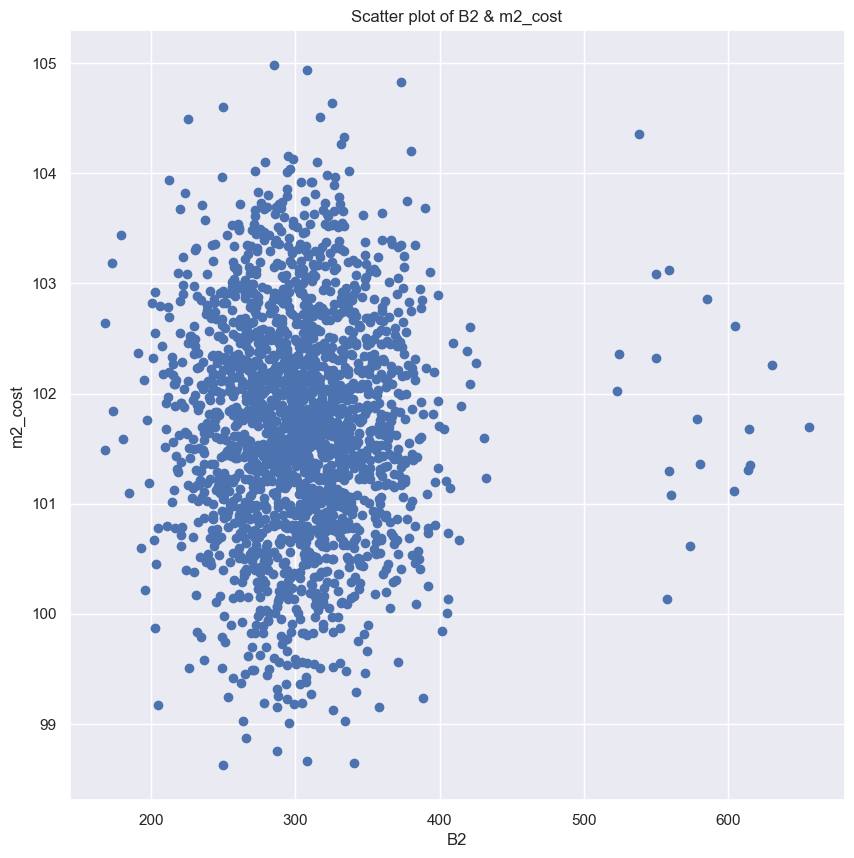

In [1336]:
#B2 & m2_cost

x_axis=merged_df['B2']
y_axis=merged_df['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of B2 & m2_cost')

plt.show()

In [1337]:
#scatter plots suggest, for each M2 input variable, there are at least 2 clusters of data points, if not more

In [1338]:
#at least, separating the 2 clusters is required; there may be more clusters in the larger constellation of data points on the left

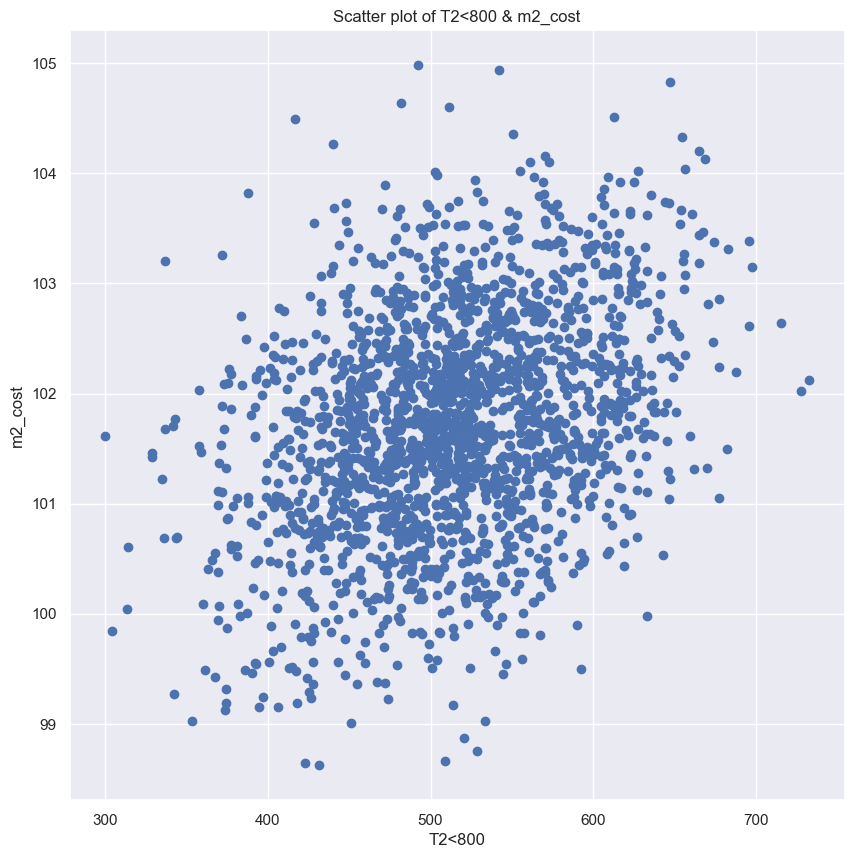

In [1339]:
#let us look at the scatter plot of T2 & m2_cost again - but, this time, separating the data points into 2 clusters at T2=800

#subset of the data frame for T2<800
merged_df_subset = merged_df[merged_df['T2']<800]

x_axis=merged_df_subset['T2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T2<800')
plt.ylabel('m2_cost')
plt.title('Scatter plot of T2<800 & m2_cost')

plt.show()

In [1340]:
#let us run a linear regression again - but, this time, using T2<800 & m2_cost

x_2=merged_df_subset[['T2']]
y_2=merged_df_subset['m2_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1341]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1342]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.1265803048156524
     Test= 0.06011988742995178
RMSE:
     Train= 0.9513217762832615
     Test= 0.9312520803247234


In [1343]:
#T2<800 & m2_cost - NOT a good linear regression fit (a low R2, a high RMSE)

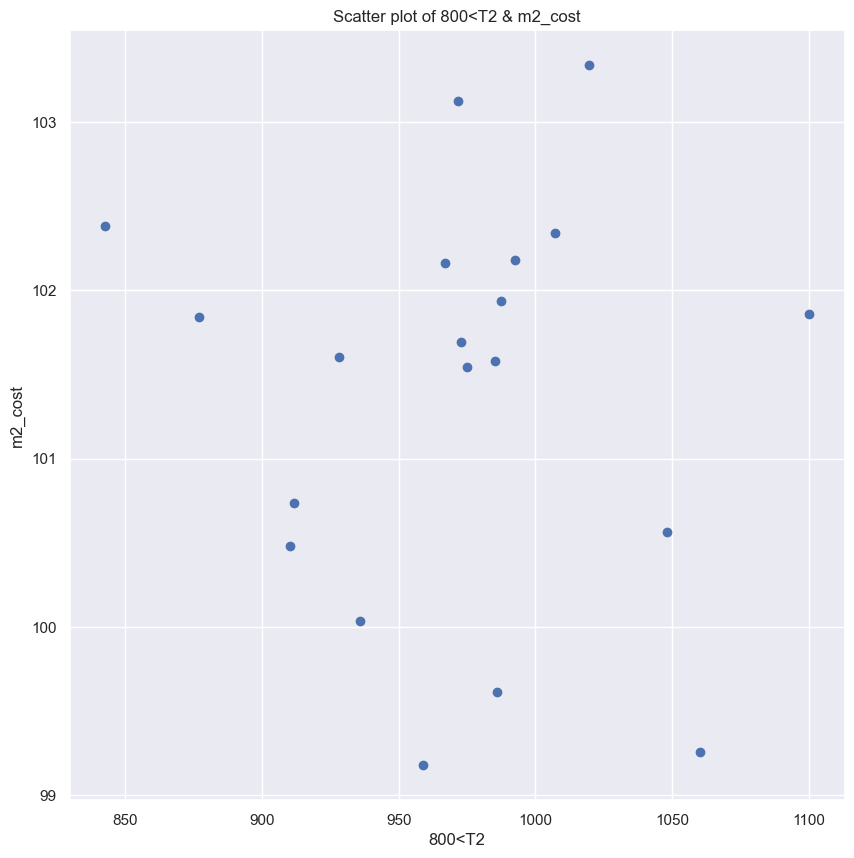

In [1344]:
#subset of the data frame for 800<T2
merged_df_subset = merged_df[800<merged_df['T2']]

x_axis=merged_df_subset['T2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('800<T2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of 800<T2 & m2_cost')

plt.show()

In [1345]:
#800<T2 & m2_cost - a linear regression function would NOT work

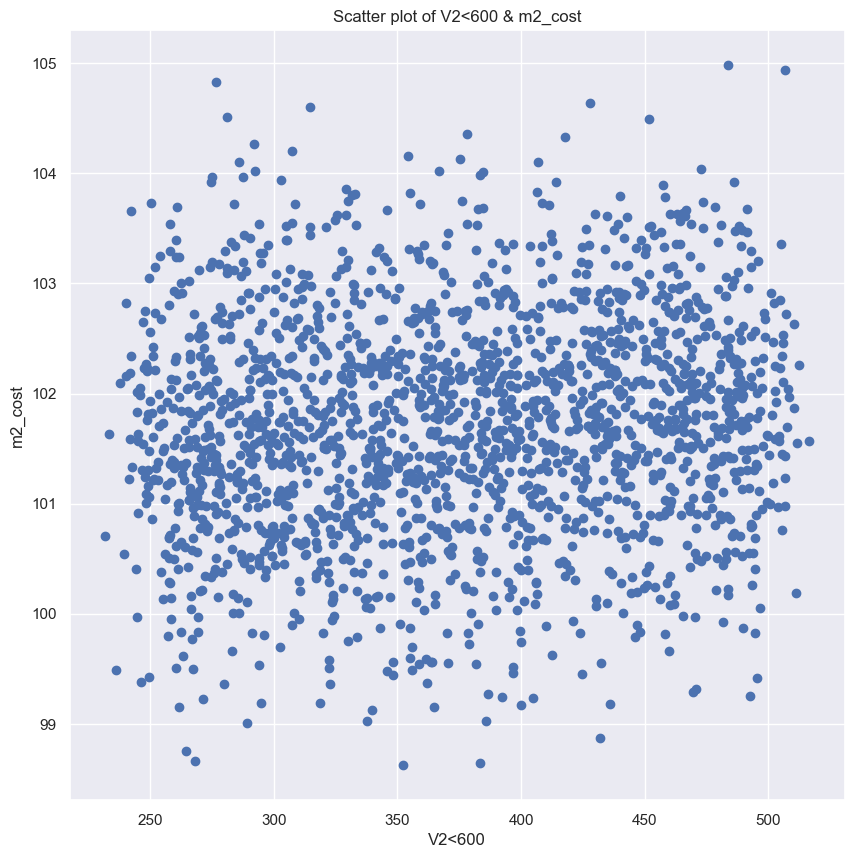

In [1346]:
#let us look at the scatter plot of V2 & m2_cost again - but, this time, separating the data points into 2 clusters at V2=600

#subset of the data frame for V2<600
merged_df_subset = merged_df[merged_df['V2']<600]

x_axis=merged_df_subset['V2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V2<600')
plt.ylabel('m2_cost')
plt.title('Scatter plot of V2<600 & m2_cost')

plt.show()

In [1347]:
#V2<600 & m2_cost - a linear regression function would NOT work

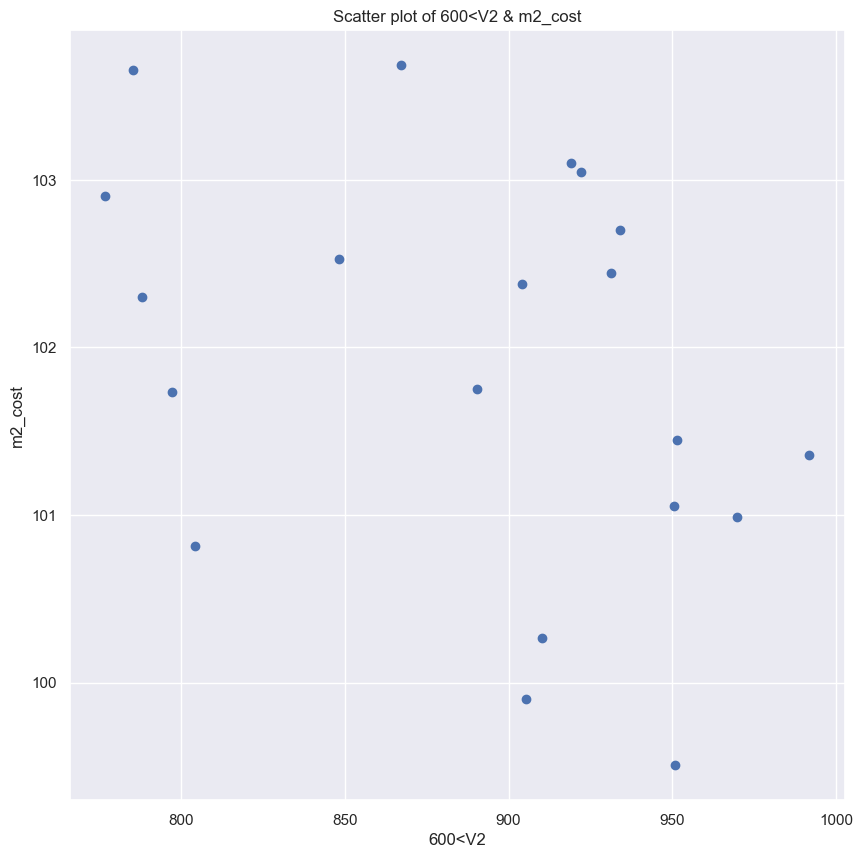

In [1348]:
#subset of the data frame for 600<V2
merged_df_subset = merged_df[600<merged_df['V2']]

x_axis=merged_df_subset['V2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('600<V2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of 600<V2 & m2_cost')

plt.show()

In [1349]:
#600<V2 & m2_cost - a linear regression function would NOT work

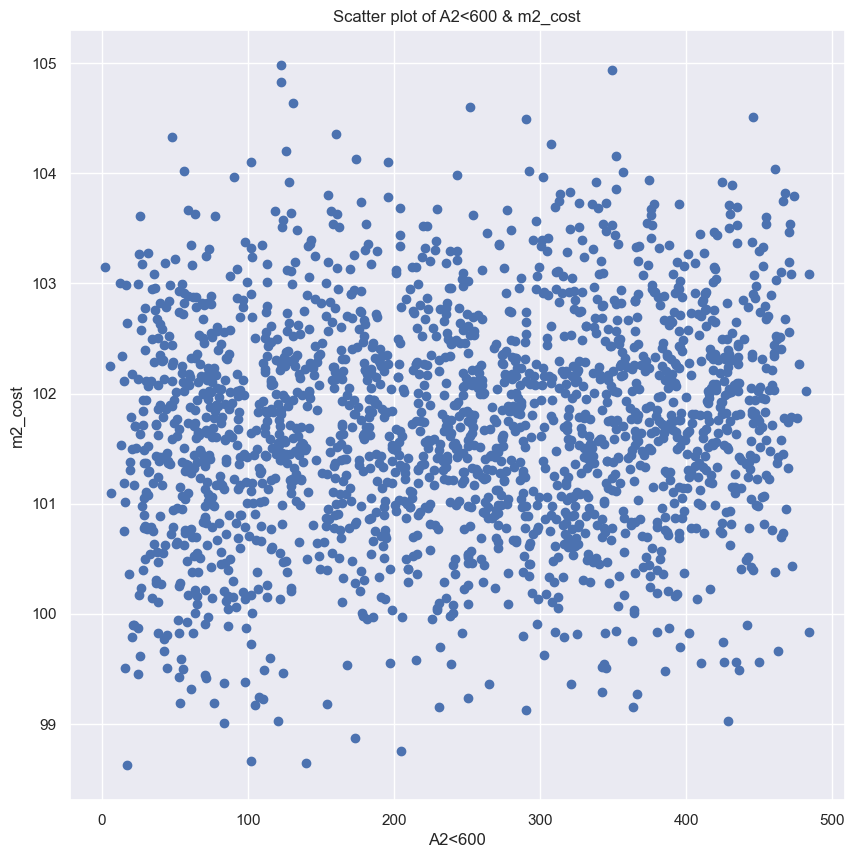

In [1350]:
#let us look at the scatter plot of A2 & m2_cost again - but, this time, separating the data points into 2 clusters at A2=600

#subset of the data frame for A2<600
merged_df_subset = merged_df[merged_df['A2']<600]

x_axis=merged_df_subset['A2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A2<600')
plt.ylabel('m2_cost')
plt.title('Scatter plot of A2<600 & m2_cost')

plt.show()

In [1351]:
#A2<600 & m2_cost - a linear regression function would NOT work

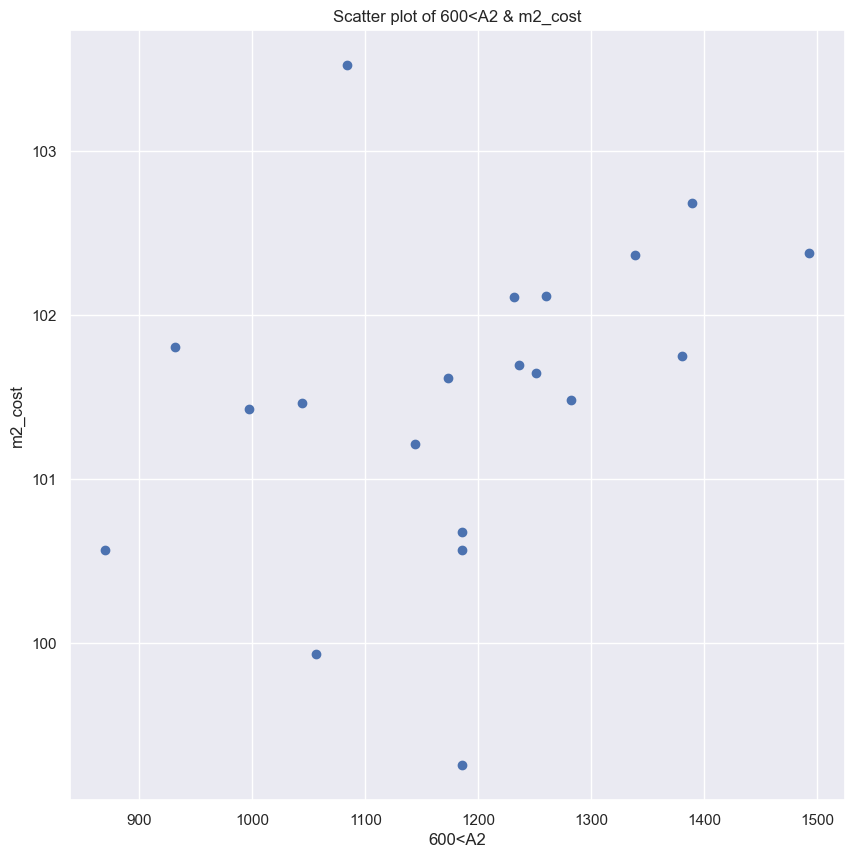

In [1352]:
#subset of the data frame for 600<A2
merged_df_subset = merged_df[600<merged_df['A2']]

x_axis=merged_df_subset['A2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('600<A2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of 600<A2 & m2_cost')

plt.show()

In [1353]:
#600<A2 & m2_cost - a linear regression function would NOT work

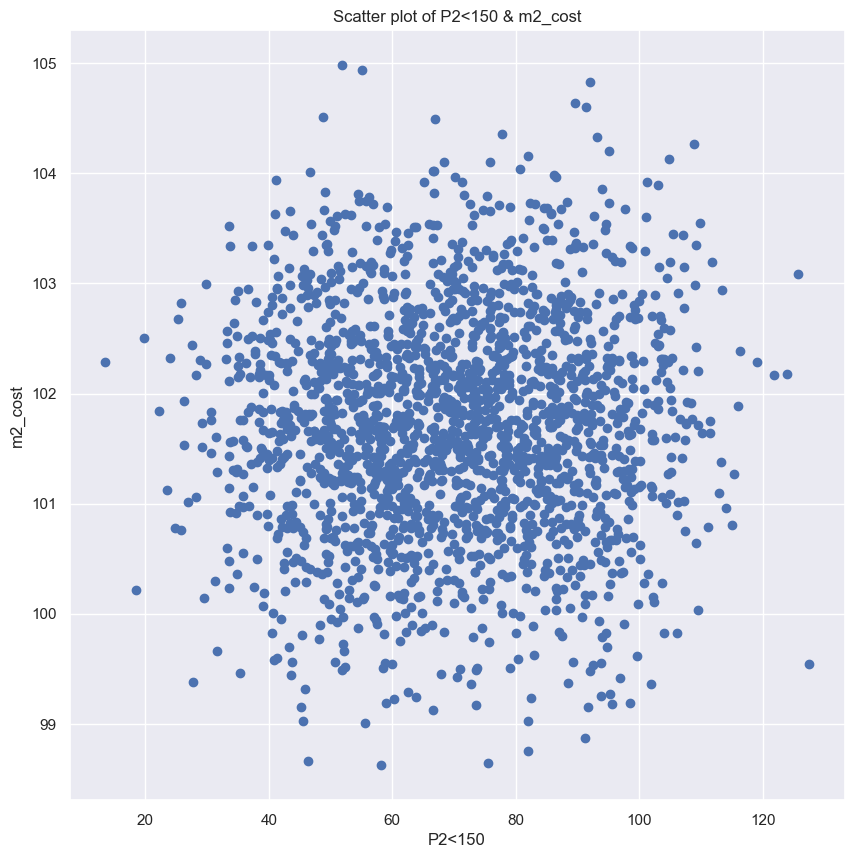

In [1354]:
#let us look at the scatter plot of P2 & m2_cost again - but, this time, separating the data points into 2 clusters at P2=150

#subset of the data frame for P2<150
merged_df_subset = merged_df[merged_df['P2']<150]

x_axis=merged_df_subset['P2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P2<150')
plt.ylabel('m2_cost')
plt.title('Scatter plot of P2<150 & m2_cost')

plt.show()

In [1355]:
#P2<150 & m2_cost - a linear regression function would NOT work

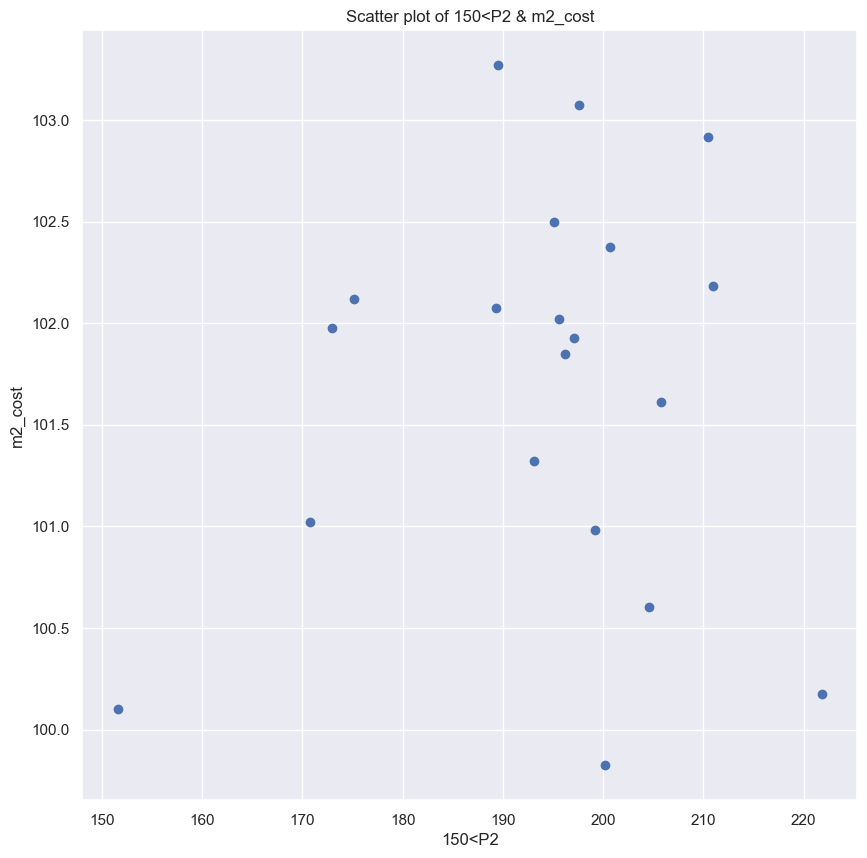

In [1356]:
#subset of the data frame for 150<P2
merged_df_subset = merged_df[150<merged_df['P2']]

x_axis=merged_df_subset['P2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('150<P2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of 150<P2 & m2_cost')

plt.show()

In [1357]:
#150<P2 & m2_cost - a linear regression function would NOT work

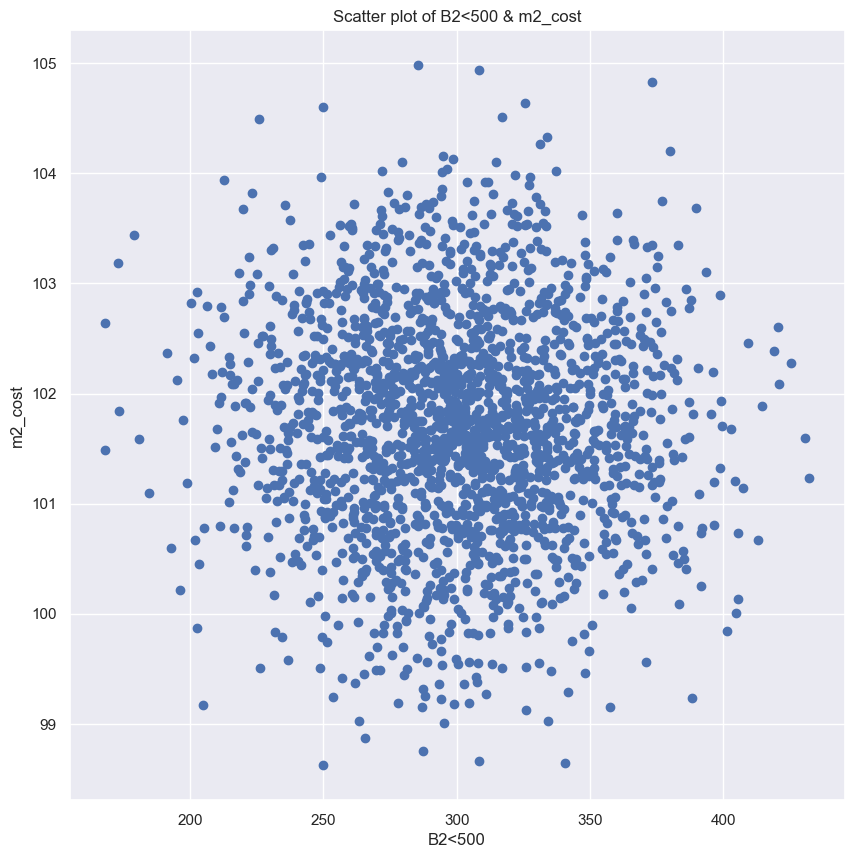

In [1358]:
#let us look at the scatter plot of B2 & m2_cost again - but, this time, separating the data points into 2 clusters at B2=500

#subset of the data frame for B2<500
merged_df_subset = merged_df[merged_df['B2']<500]

x_axis=merged_df_subset['B2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B2<500')
plt.ylabel('m2_cost')
plt.title('Scatter plot of B2<500 & m2_cost')

plt.show()

In [1359]:
#B2<500 & m2_cost - a linear regression function would NOT work

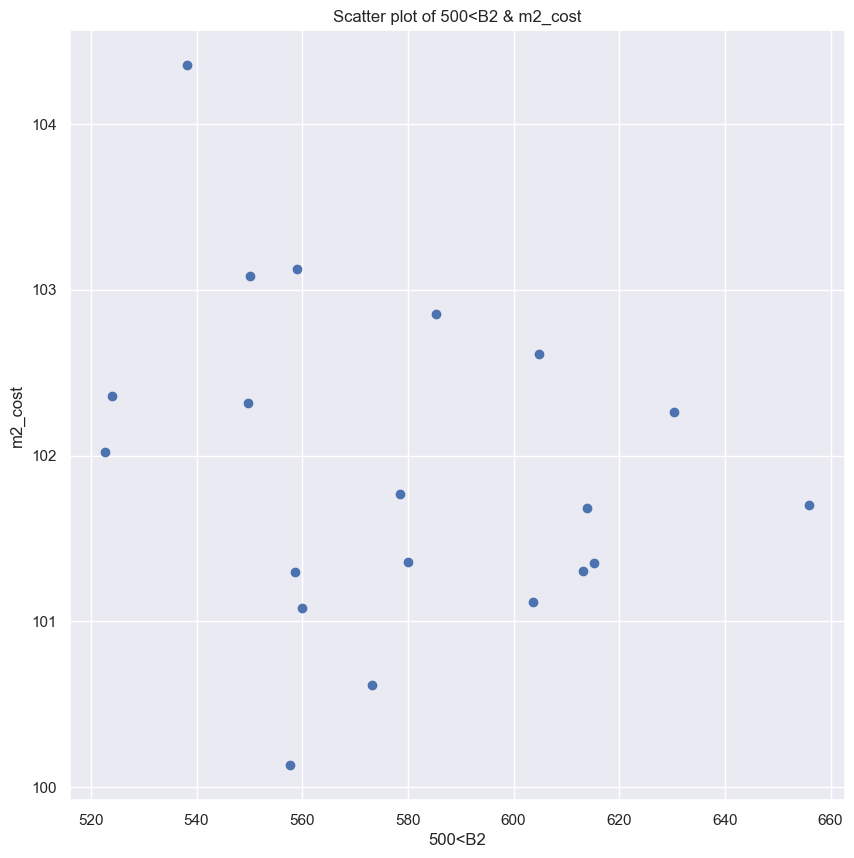

In [1360]:
#subset of the data frame for 500<B2
merged_df_subset = merged_df[500<merged_df['B2']]

x_axis=merged_df_subset['B2']
y_axis=merged_df_subset['m2_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('500<B2')
plt.ylabel('m2_cost')
plt.title('Scatter plot of 500<B2 & m2_cost')

plt.show()

In [1361]:
#500<B2 & m2_cost - a linear regression function would NOT work

In [1362]:
#multivariate linear regression using all M2 input variables & m3_cost

#do the M2 input variables predict m3_cost?

x_2=merged_df[['T2', 'V2', 'A2', 'P2', 'B2']]
y_2=merged_df['m3_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1363]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1364]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.29182056261220213
     Test= 0.2924951630480649
RMSE:
     Train= 0.4962991832883848
     Test= 0.5306681064951252


In [1365]:
#a low R2 & a relatively high RMSE indicate the 5 M2 input variables do NOT predict m3_cost well at all

In [1366]:
#multivariate linear regression using all M2 input variables & m4_cost

#do the M2 input variables predict m4_cost?

x_2=merged_df[['T2', 'V2', 'A2', 'P2', 'B2']]
y_2=merged_df['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1367]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1368]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.005396632156447145
     Test= -0.02443804951402795
RMSE:
     Train= 0.41002134765116355
     Test= 0.3927231846574611


In [1369]:
#a very low R2 & a relatively low RMSE indicate the 5 M2 input variables do NOT predict m4_cost well at all

# Note: a linear (or polynomial) regression function would NOT be a suitable approach to explain crys_d since crys_d is a 0-or-1 categorical variable

# M3

In [1370]:
#given the results of M1 above, we will apply polynomial regression functions & related analyses to M3 only where the initial linear regression appears to show a meaningful correlation

In [1371]:
#the previous visual scan suggests a potential correlation between T3 & m3_cost for M3

#linear regression using T3 & m3_cost

x_3=merged_df[['T3']]
y_3=merged_df['m3_cost']

In [1372]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1373]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1374]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.32477936440801913
     Test= 0.20611148708957938
RMSE:
     Train= 0.49199221308318275
     Test= 0.5319976565485958


In [1375]:
#a relatively low R2 & a relatively low RMSE indicate the correlation between T3 & m3_cost cannot be adequately explained by a linear regression function

In [1376]:
#multivariate linear regression using all M3 input variables & m3_cost

x_3=merged_df[['T3', 'V3', 'A3', 'P3', 'B3']]
y_3=merged_df['m3_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1377]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1378]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.34929440082646623
     Test= 0.36184657080267546
RMSE:
     Train= 0.4816299739964595
     Test= 0.4812550778235787


In [1379]:
#a relatively low R2 & a relatively low RMSE indicate the 5 M3 input variables do NOT predict m3_cost well at all

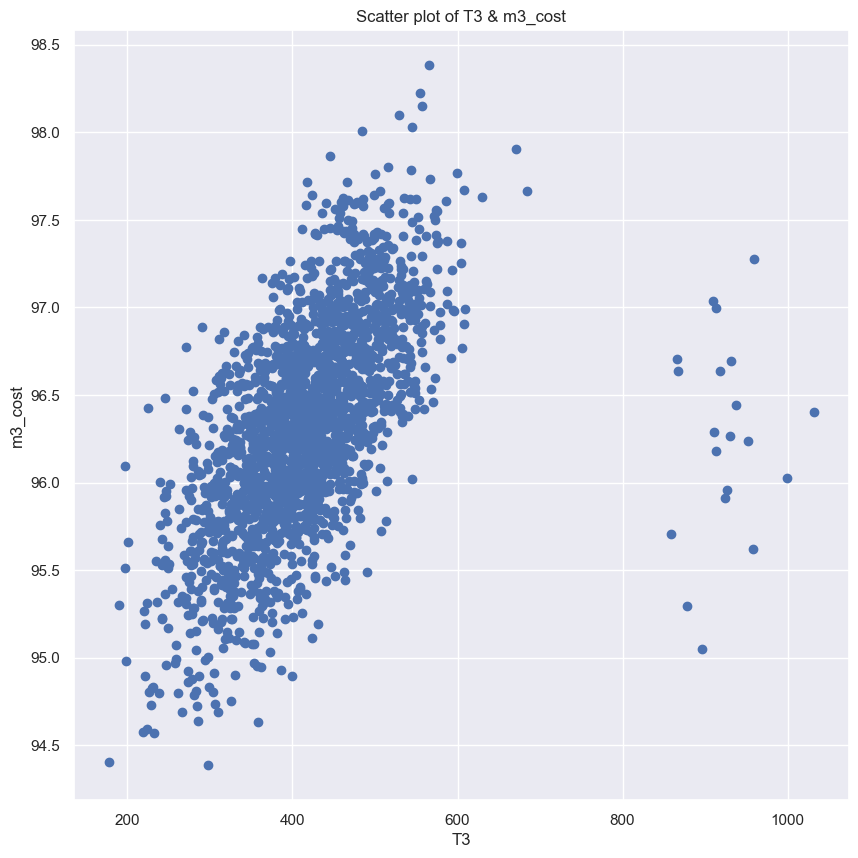

In [1380]:
#let us look at the scatter plots of the M3 input variables & m3_cost again

#T3 & m3_cost

x_axis=merged_df['T3']
y_axis=merged_df['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of T3 & m3_cost')

plt.show()

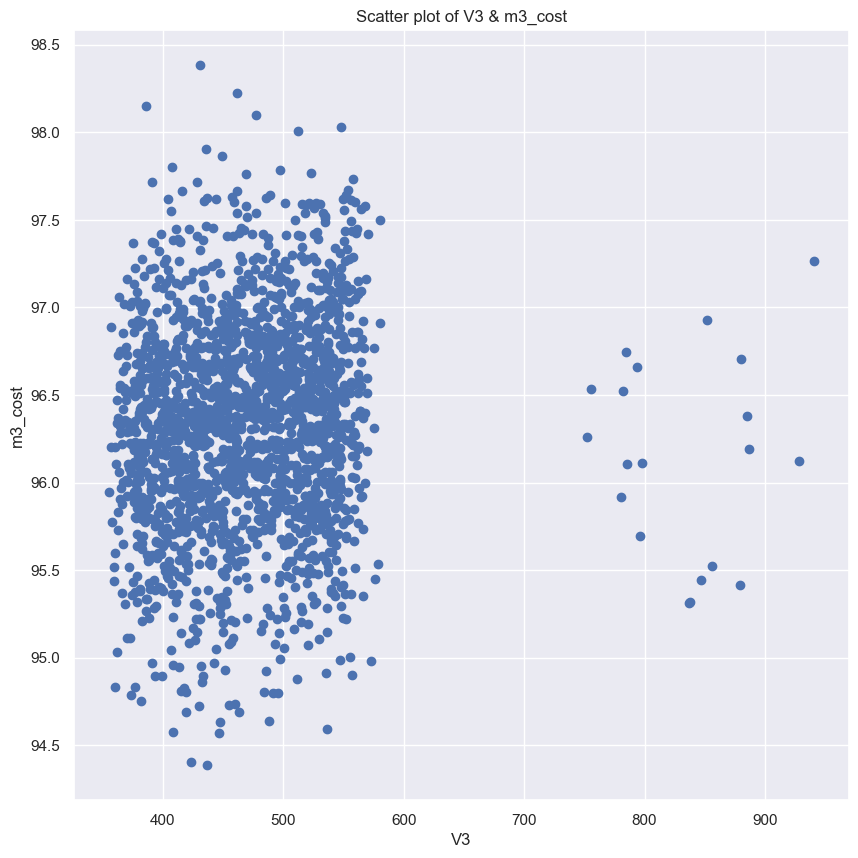

In [1381]:
#V3 & m3_cost

x_axis=merged_df['V3']
y_axis=merged_df['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of V3 & m3_cost')

plt.show()

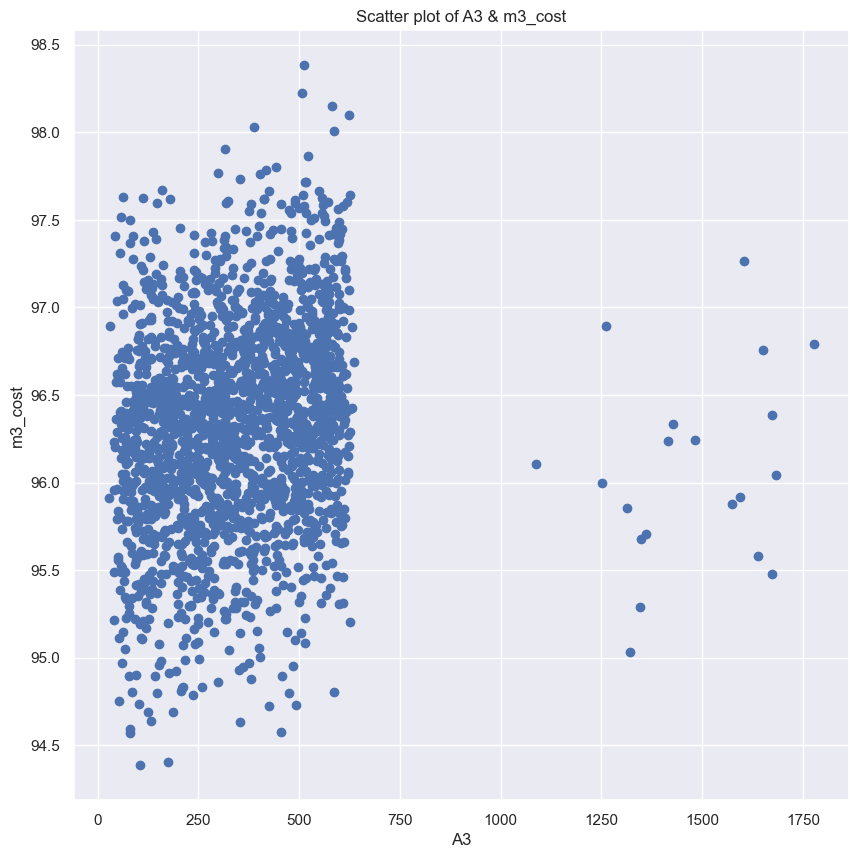

In [1382]:
#A3 & m3_cost

x_axis=merged_df['A3']
y_axis=merged_df['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of A3 & m3_cost')

plt.show()

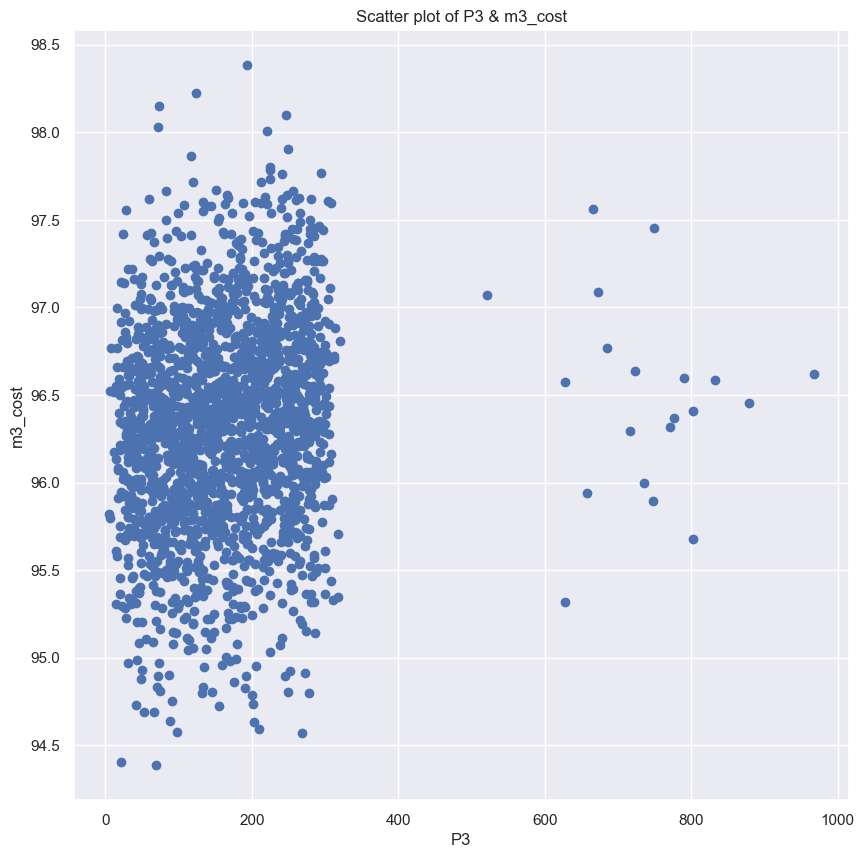

In [1383]:
#P3 & m3_cost

x_axis=merged_df['P3']
y_axis=merged_df['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of P3 & m3_cost')

plt.show()

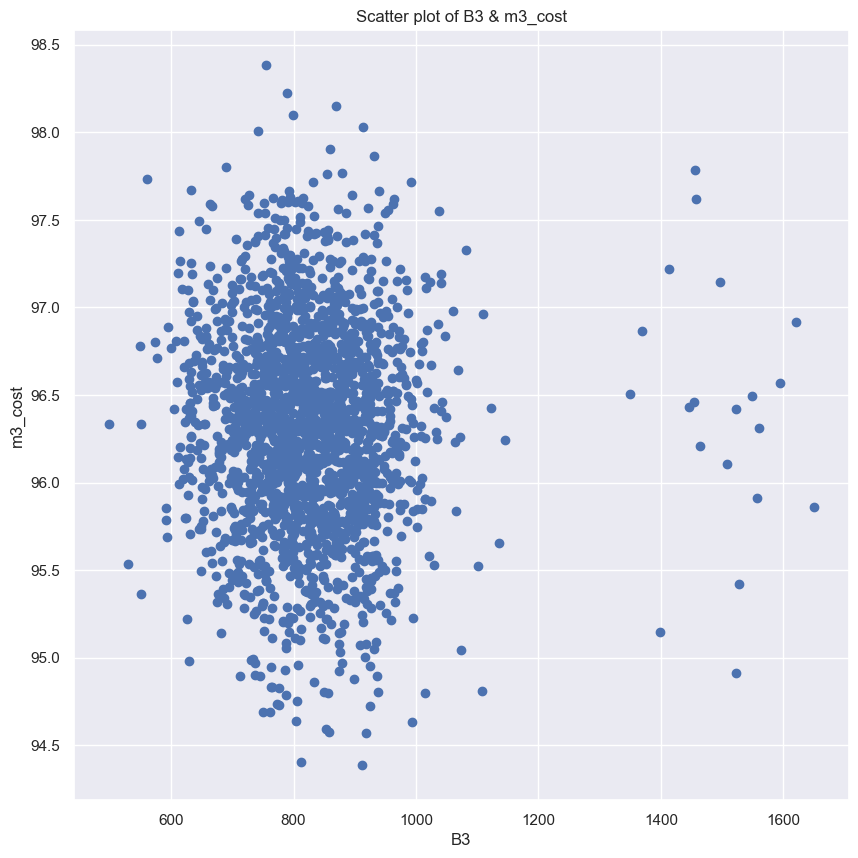

In [1384]:
#B3 & m3_cost

x_axis=merged_df['B3']
y_axis=merged_df['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of B3 & m3_cost')

plt.show()

In [1385]:
#scatter plots suggest, for each M3 input variable, there are at least 2 clusters of data points, if not more

In [1386]:
#at least, separating the 2 clusters is required; there may be more clusters in the larger constellation of data points on the left

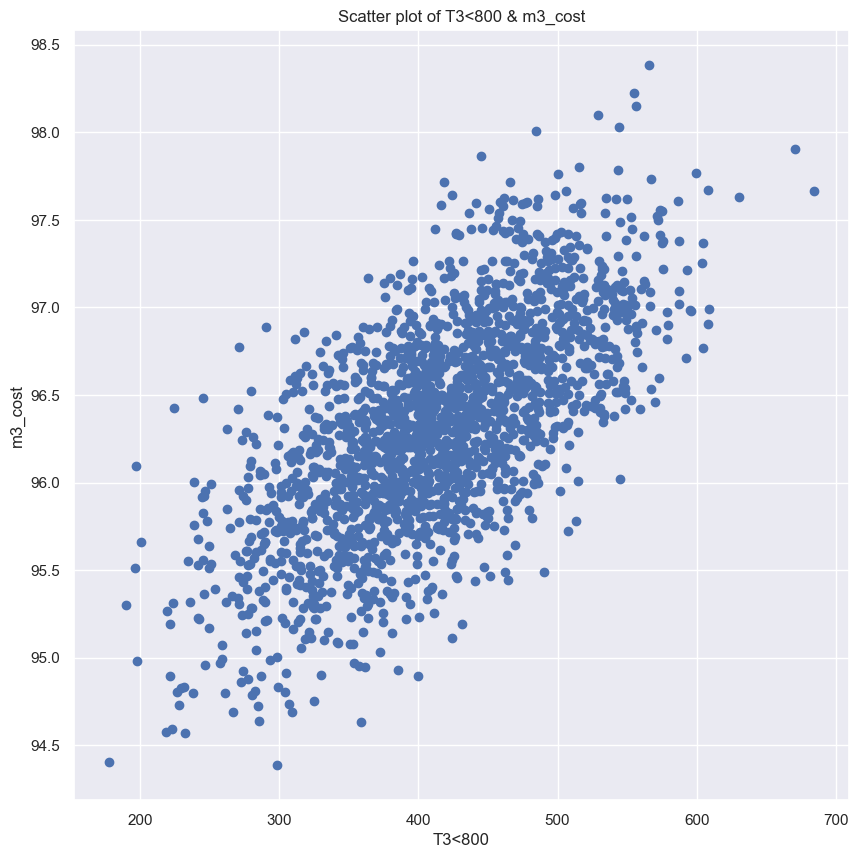

In [1387]:
#let us look at the scatter plot of T3 & m3_cost again - but, this time, separating the data points into 2 clusters at T3=800

#subset of the data frame for T3<800
merged_df_subset = merged_df[merged_df['T3']<800]

x_axis=merged_df_subset['T3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T3<800')
plt.ylabel('m3_cost')
plt.title('Scatter plot of T3<800 & m3_cost')

plt.show()

In [1388]:
#let us run a linear regression again - but, this time, using T3<800 & m3_cost

x_3=merged_df_subset[['T3']]
y_3=merged_df_subset['m3_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1389]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1390]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.459356750987608
     Test= 0.4175997423735508
RMSE:
     Train= 0.44592607357151304
     Test= 0.4326798025194105


# Note: T3<800 appears to predict m3_cost reasonably well as a linear regression function - though the correlation is NOT very strong

In [1391]:
#T3<800 vs m3_cost - the coefficient & the intercept

coefficient_3=lin_model.coef_
print(coefficient_3)

intercept_3=lin_model.intercept_
print(intercept_3)

[0.00545708]
94.07107718353511


In [1392]:
#given a reasonably high R2, apply a new value'T3'<800 to calculate (test) the predicted value of m3_cost

#the same analysis will NOT be done with the related polynomial regression functions below since they are likely to yield similar results

#the analysis also will NOT be done below where the R2 for the linear or polynomial regression does NOT indicate a strong correlation

#T3=400

#the intercept & the coefficients are based on 1 particular iteration of the linear regression - the actual numbers will vary

m3_cost_new=94.12114999762422+400*0.00533668
print('The predicted cost of M3 is ', m3_cost_new)

The predicted cost of M3 is  96.25582199762421


In [1393]:
#now, apply higher-degree polynomial regression functions to T3<800 & m3_cost

In [1394]:
#2nd-degree

In [1395]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  6.03830662e-03 -7.05978306e-07]
Constant term (bias) =  93.95545547071708


In [1396]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1397]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.459439328244415
     Test= 0.418056785695871
RMSE:
     Train= 0.44589201714136384
     Test= 0.43250999470748597


# Note: the predictive power of T3<800 for m3_cost does NOT appear to change meaningfully as a 2nd-degree polynomial regression function

In [1398]:
#find the minimum/optimum point in the 2nd-degree polynomial regression function

In [1399]:
print(x_train)

              T3
981   456.656794
1055  277.568630
1173  465.992959
942   439.217108
934   346.001613
...          ...
1112  486.751824
1882  482.766177
81    431.997861
1872  468.282234
1493  352.455060

[1584 rows x 1 columns]


In [1400]:
print(poly_features.get_feature_names_out(['T3']))

['1' 'T3' 'T3^2']


In [1401]:
def fun(paramt):
    T3=paramt    
    #use the coefficients produced in 1 particular iteration as fixed in fun(paramt)
    return T3*(6.48255804e-03)+(T3**2)*(-1.50000665e-06)

In [1402]:
initial_guess=[100]

In [1403]:
result=optimize.minimize(fun, initial_guess)
result

  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 0.5940542662388079
        x: [ 9.367e+01]
      nit: 1
      jac: [ 6.202e-03]
 hess_inv: [[-3.334e+05]]
     nfev: 236
     njev: 112

# Note: the minimisation attempt above has failed to find a minimum; this is potentially due to the function being numerically unstable; i.e., a small change among the input variables can lead to a large swing in the value of the output

# Note: is overfitting a problem here?

# Note: overfitting does NOT appear to be a problem

In [1404]:
#3rd-degree

In [1405]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  3.83803804e-03  4.77670023e-06 -4.40871402e-09]
Constant term (bias) =  94.23938144791012


In [1406]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1407]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.4594887047003833
     Test= 0.41828635596045083
RMSE:
     Train= 0.44587165210975
     Test= 0.4324246760494477


# Note: similarly, the predictive power of T3<800 for m3_cost does NOT appear to change meaningfully as a 3rd-degree polynomial regression function

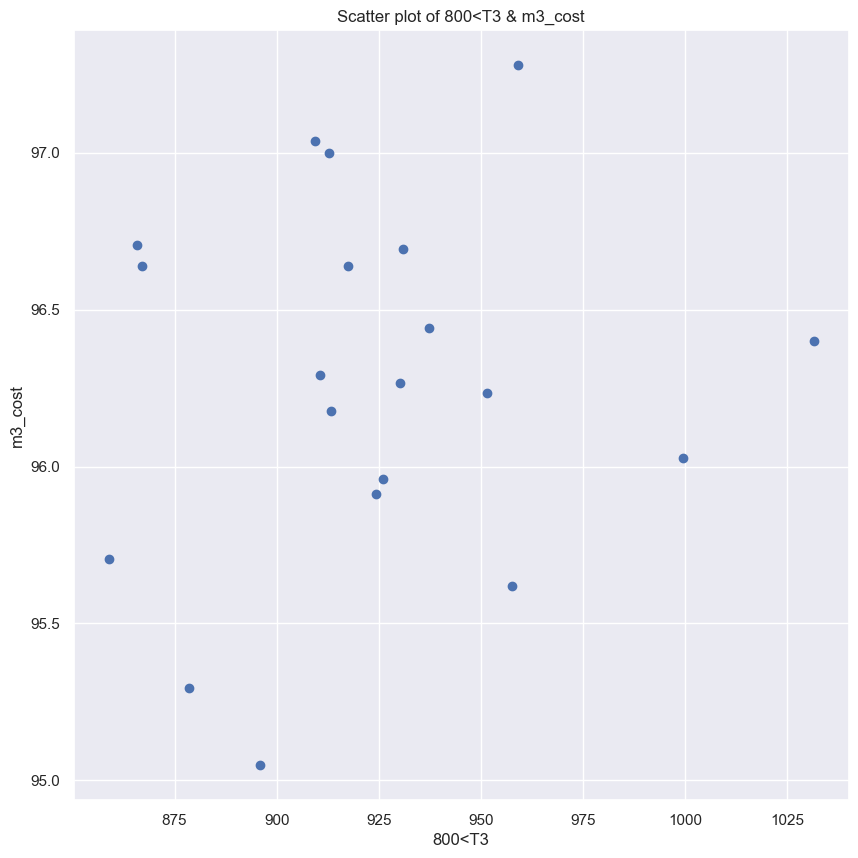

In [1408]:
#subset of the data frame for 800<T3
merged_df_subset = merged_df[800<merged_df['T3']]

x_axis=merged_df_subset['T3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('800<T3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of 800<T3 & m3_cost')

plt.show()

In [1409]:
#800<T3 & m3_cost - a linear regression function would NOT work

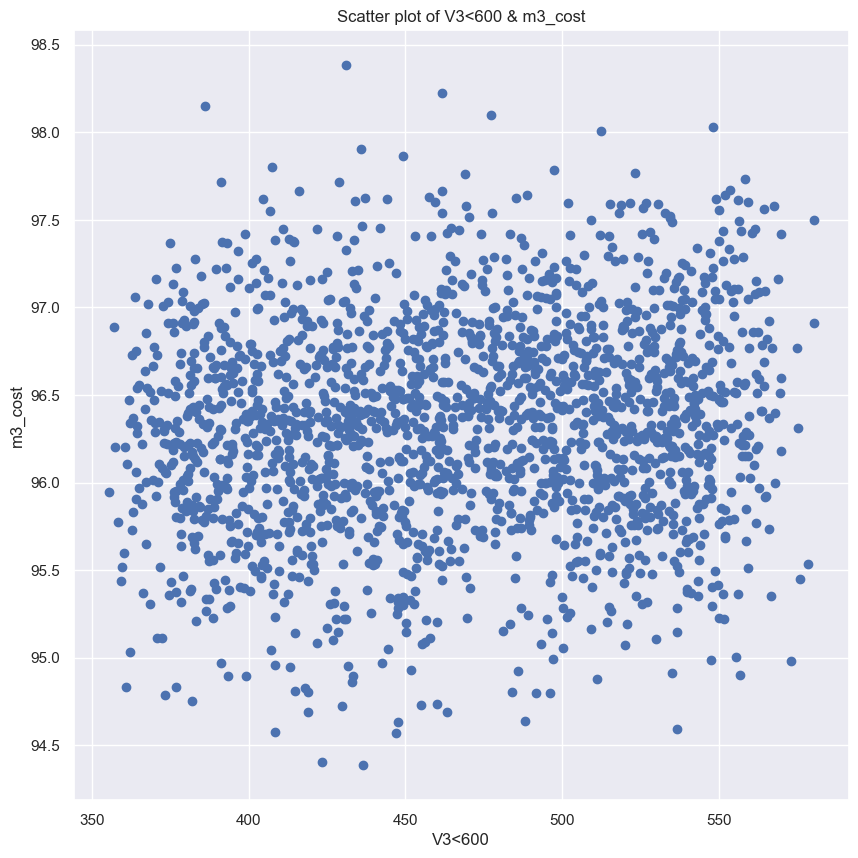

In [1410]:
#let us look at the scatter plot of V3 & m3_cost again - but, this time, separating the data points into 2 clusters at V3=600

#subset of the data frame for V3<600
merged_df_subset = merged_df[merged_df['V3']<600]

x_axis=merged_df_subset['V3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V3<600')
plt.ylabel('m3_cost')
plt.title('Scatter plot of V3<600 & m3_cost')

plt.show()

In [1411]:
#V3<600 & m3_cost - a linear regression function would NOT work

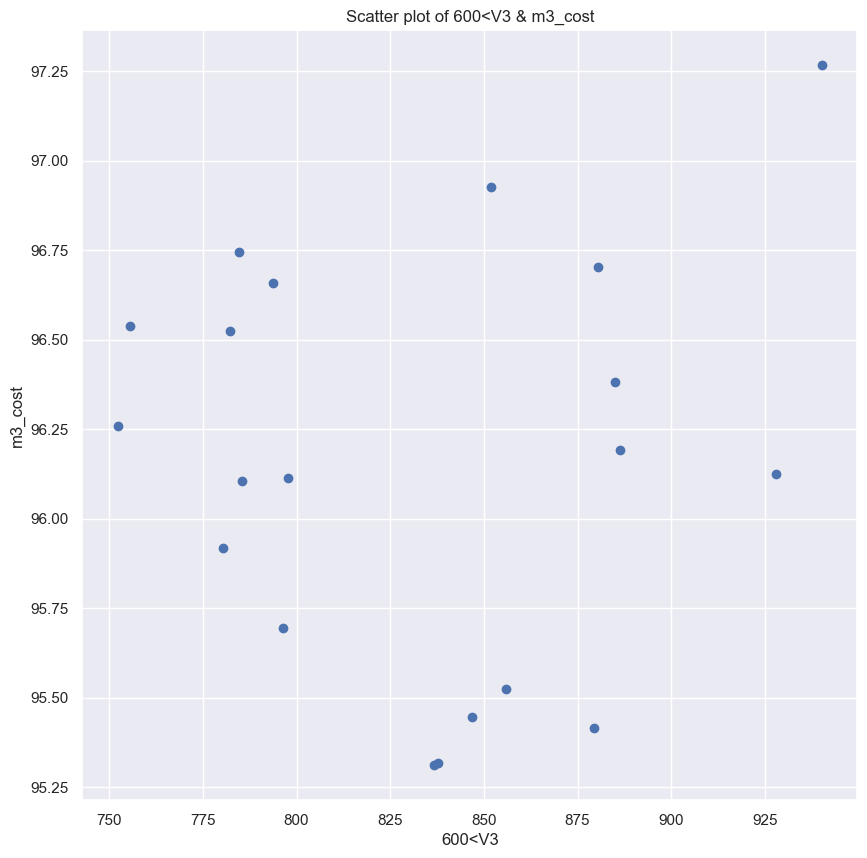

In [1412]:
#subset of the data frame for 600<V3
merged_df_subset = merged_df[600<merged_df['V3']]

x_axis=merged_df_subset['V3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('600<V3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of 600<V3 & m3_cost')

plt.show()

In [1413]:
#600<V3 & m3_cost - a linear regression function would NOT work

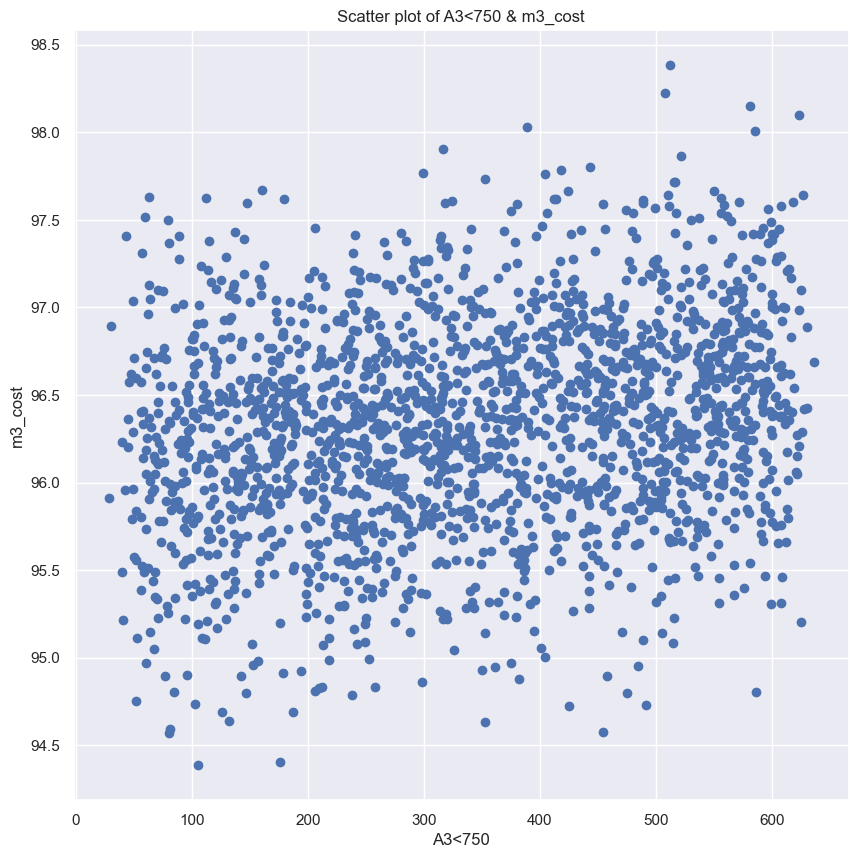

In [1414]:
#let us look at the scatter plot of A3 & m3_cost again - but, this time, separating the data points into 2 clusters at A3=750

#subset of the data frame for A3<750
merged_df_subset = merged_df[merged_df['A3']<750]

x_axis=merged_df_subset['A3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A3<750')
plt.ylabel('m3_cost')
plt.title('Scatter plot of A3<750 & m3_cost')

plt.show()

In [1415]:
#A3<750 & m3_cost - a linear regression function would NOT work

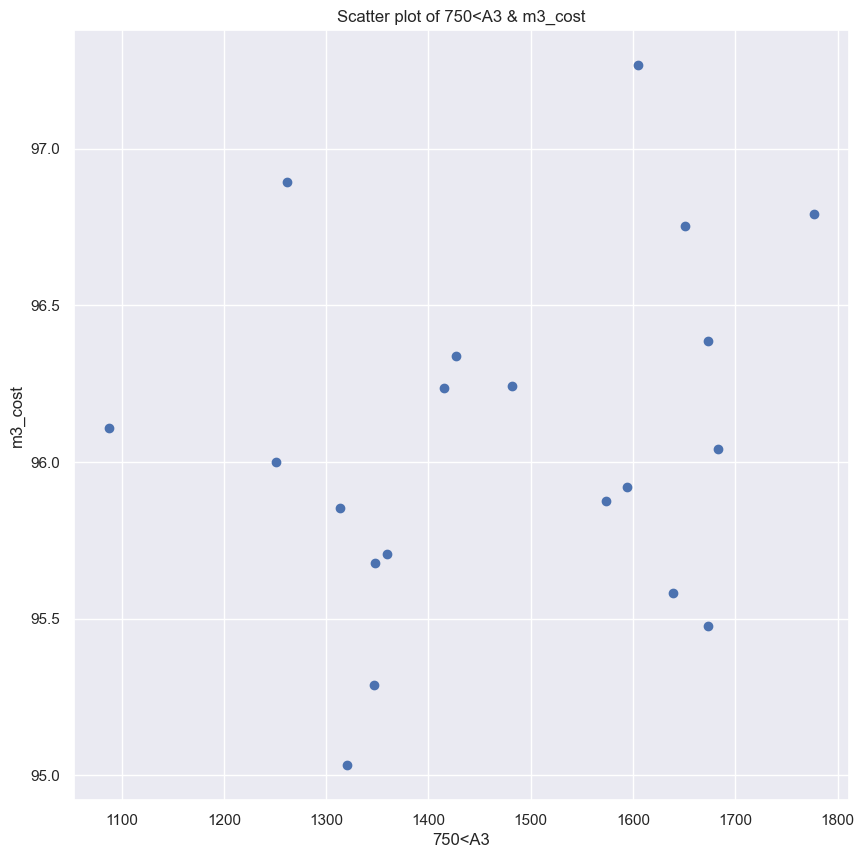

In [1416]:
#subset of the data frame for 750<A3
merged_df_subset = merged_df[750<merged_df['A3']]

x_axis=merged_df_subset['A3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('750<A3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of 750<A3 & m3_cost')

plt.show()

In [1417]:
#750<A3 & m3_cost - a linear regression function would NOT work

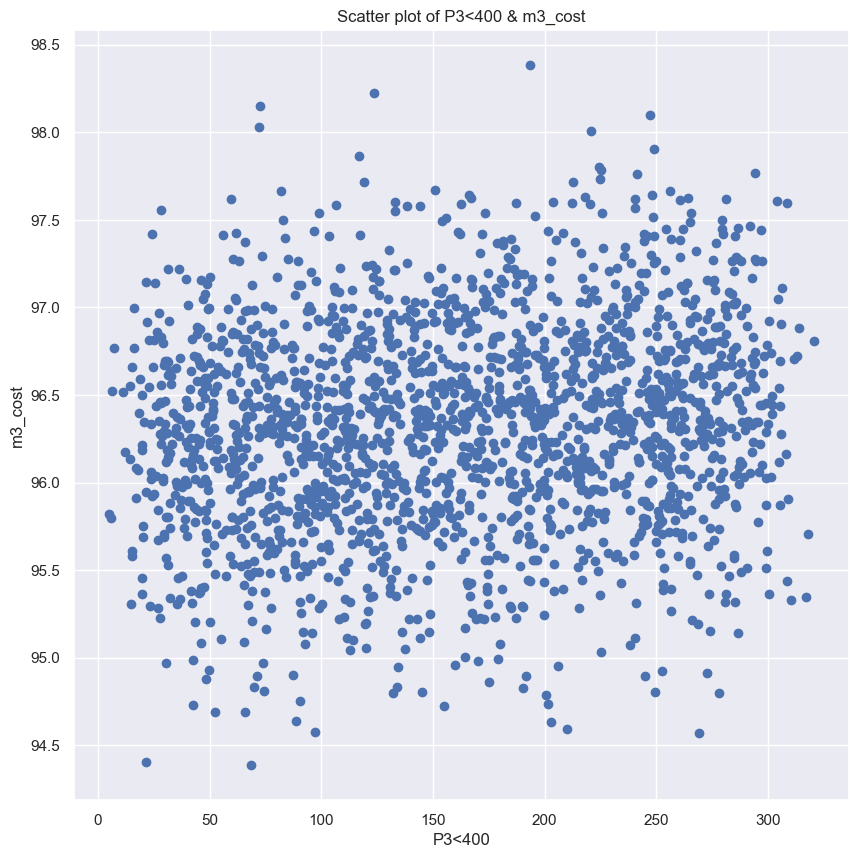

In [1418]:
#let us look at the scatter plot of P3 & m3_cost again - but, this time, separating the data points into 2 clusters at P3=400

#subset of the data frame for P3<400
merged_df_subset = merged_df[merged_df['P3']<400]

x_axis=merged_df_subset['P3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P3<400')
plt.ylabel('m3_cost')
plt.title('Scatter plot of P3<400 & m3_cost')

plt.show()

In [1419]:
#P3<400 & m3_cost - a linear regression function would NOT work

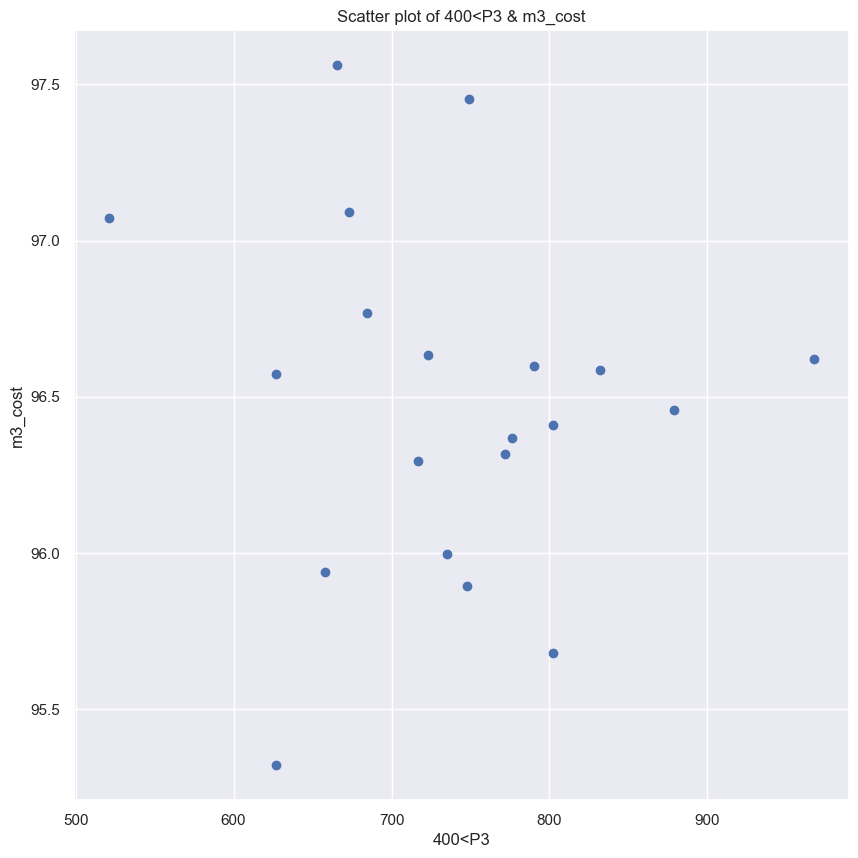

In [1420]:
#subset of the data frame for 400<P3
merged_df_subset = merged_df[400<merged_df['P3']]

x_axis=merged_df_subset['P3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('400<P3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of 400<P3 & m3_cost')

plt.show()

In [1421]:
#400<P3 & m3_cost - a linear regression function would NOT work

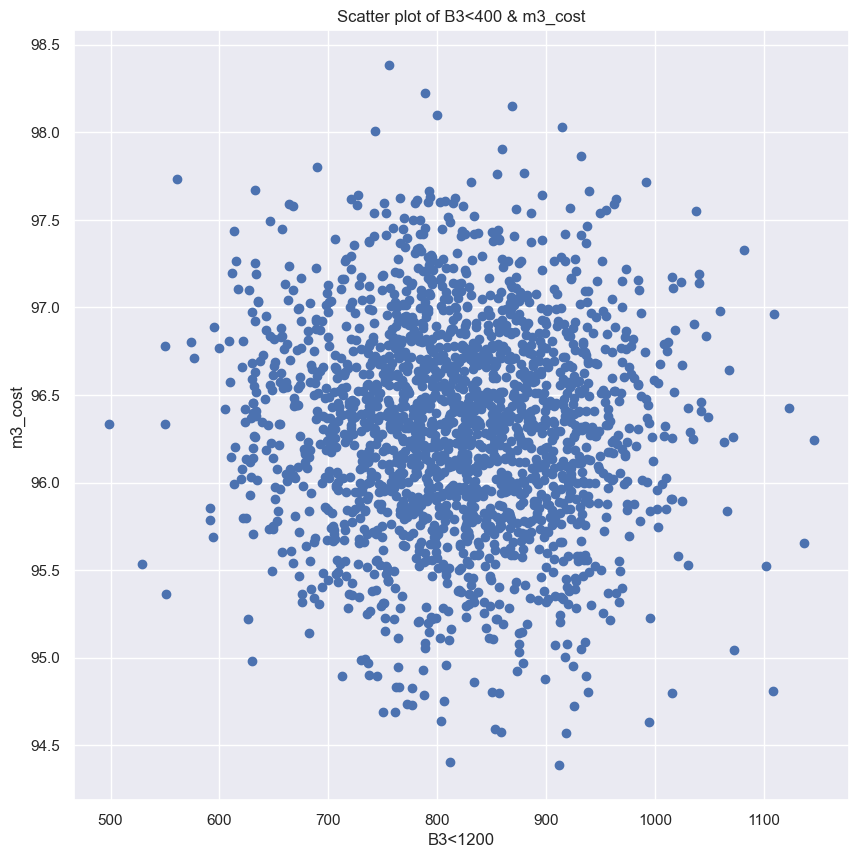

In [1422]:
#let us look at the scatter plot of B3 & m3_cost again - but, this time, separating the data points into 2 clusters at B3=1200

#subset of the data frame for B3<1200
merged_df_subset = merged_df[merged_df['B3']<1200]

x_axis=merged_df_subset['B3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B3<1200')
plt.ylabel('m3_cost')
plt.title('Scatter plot of B3<400 & m3_cost')

plt.show()

In [1423]:
#B3<1200 & m3_cost - a linear regression function would NOT work

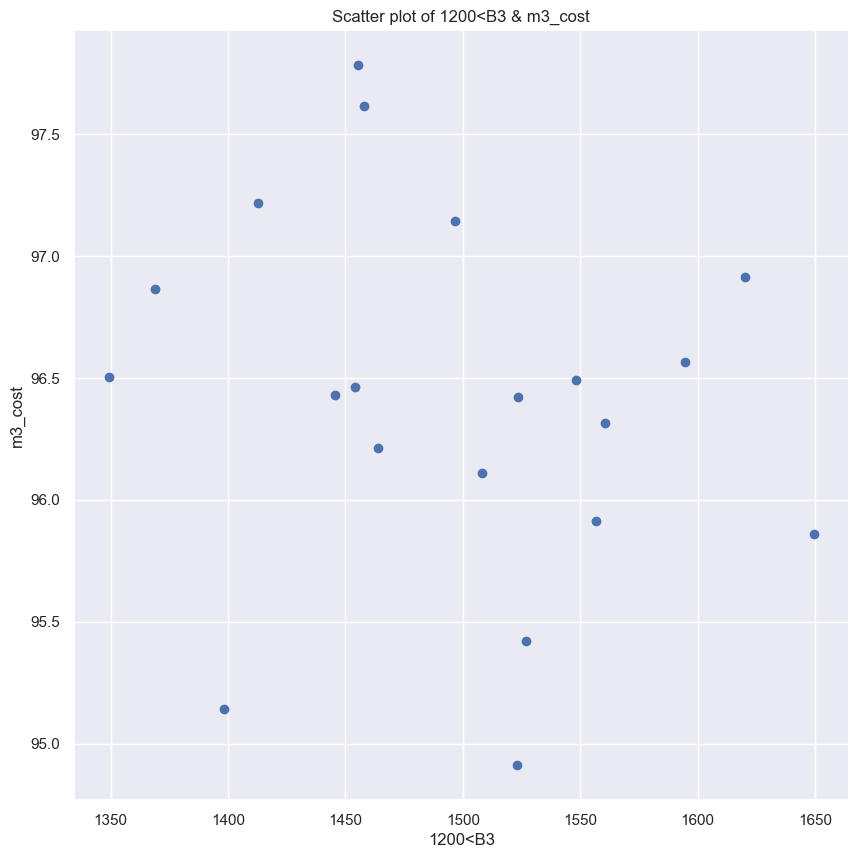

In [1424]:
#subset of the data frame for 1200<B3
merged_df_subset = merged_df[1200<merged_df['B3']]

x_axis=merged_df_subset['B3']
y_axis=merged_df_subset['m3_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('1200<B3')
plt.ylabel('m3_cost')
plt.title('Scatter plot of 1200<B3 & m3_cost')

plt.show()

In [1425]:
#1200<B3 & m3_cost - a linear regression function would NOT work

In [1426]:
#multivariate linear regression using all M3 input variables & m4_cost

#do the M3 input variables predict m4_cost?

x_3=merged_df[['T3', 'V3', 'A3', 'P3', 'B3']]
y_3=merged_df['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1427]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1428]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.00024167962534993315
     Test= 0.0015688544826130135
RMSE:
     Train= 0.41181498746140427
     Test= 0.38461480166106365


In [1429]:
#a very low R2 & a relatively low RMSE indicate the 5 M3 input variables do NOT predict m4_cost well at all

# Note: a linear (or polynomial) regression function would NOT be a suitable approach to explain i_diff_d since i_diff_d is a 0-or-1 categorical variable

# M4

In [1430]:
#given the results of M1 above, we will apply polynomial regression functions & related analyses to M4 only where the initial linear regression appears to show a meaningful correlation

In [1431]:
#the previous visual scan suggests a potential correlation between A4 & m4_cost for M4

#linear regression using A4 & m4_cost

x_4=merged_df[['A4']]
y_4=merged_df['m4_cost']

In [1432]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1433]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1434]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.22393442583569734
     Test= 0.22880993504178515
RMSE:
     Train= 0.3591681888361778
     Test= 0.35290962538677695


In [1435]:
#a low R2 & a relatively low RMSE indicate the correlation between A4 & m4_cost cannot be adequately explained by a linear regression function

In [1436]:
#multivariate linear regression using all M4 input variables & m4_cost

x_4=merged_df[['T4', 'V4', 'A4', 'P4', 'B4']]
y_4=merged_df['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1437]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1438]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.6122227954353123
     Test= 0.6298586845308478
RMSE:
     Train= 0.25164473128999776
     Test= 0.25323976287236205


# Note: a relatively high R2 & a low RMSE indicate the 5 M4 input variables together predict m4_cost well as a multivariate linear regression function

In [1439]:
#M4 input variables vs m4_cost - the coefficients & the intercept

coefficient_4=lin_model.coef_
print(coefficient_4)

intercept_4=lin_model.intercept_
print(intercept_4)

[0.00343941 0.00094417 0.0006024  0.00072494 0.0046359 ]
92.88204746748681


In [1440]:
#given a relatively high R2, apply a new ['T4', 'V4', 'A4', 'P4', 'B4'] array to calculate (test) the predicted value of m4_cost

#same analysis NOT done with the related polynomial regression functions below since they are likely to yield similar results

#analysis also NOT done where the R2 for the linear or polynomial regression does NOT indicate a strong correlation

#[400, 400, 400, 300, 300]

#the intercept & the coefficients are based on 1 particular iteration of the linear regression - the actual numbers will vary

m4_cost_new=92.87569185747614+400*0.00310866+400*0.00086282+400*0.00062669+300*0.00081848+300*0.00496939
print('The predicted cost of M4 is ', m4_cost_new)

The predicted cost of M4 is  96.45132085747613


In [1441]:
#now, apply higher-degree polynomial regression functions to all M4 input variables & m4_cost

In [1442]:
#2nd-degree

In [1443]:
poly_features=PolynomialFeatures(degree=2)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.86257160e-02  2.93186860e-03  1.43307198e-03
  1.06101095e-03  4.37055160e-02 -1.57524962e-05 -1.04642214e-06
 -7.64735364e-07  9.24754188e-07 -6.49871382e-06 -1.76661511e-06
  1.48594723e-07  4.41374385e-08  1.09756657e-07 -4.52840890e-07
 -1.74425447e-08  5.26078534e-07 -1.27669137e-06  1.17137445e-06
 -5.23957859e-05]
Constant term (bias) =  82.31317094348913


In [1444]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1445]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.8977645551100875
     Test= 0.9063809479318932
RMSE:
     Train= 0.12921039370917473
     Test= 0.12735917461401694


# Note: a high R2 & a low RMSE indicate the 5 M4 input variables together predict m4_cost very well as a 2nd-degree polynomial regression function

In [1446]:
#find the minimum/optimum point in the 2nd-degree polynomial regression function

In [1447]:
print(poly_features.get_feature_names_out(['T4', 'V4', 'A4', 'P4', 'B4']))

['1' 'T4' 'V4' 'A4' 'P4' 'B4' 'T4^2' 'T4 V4' 'T4 A4' 'T4 P4' 'T4 B4'
 'V4^2' 'V4 A4' 'V4 P4' 'V4 B4' 'A4^2' 'A4 P4' 'A4 B4' 'P4^2' 'P4 B4'
 'B4^2']


In [1448]:
x_train_poly

array([[1.00000000e+00, 2.99526522e+02, 2.64554907e+02, ...,
        6.62417651e+03, 2.64399099e+04, 1.05532942e+05],
       [1.00000000e+00, 3.65877463e+02, 3.19874194e+02, ...,
        1.44099257e+05, 1.33204089e+05, 1.23132691e+05],
       [1.00000000e+00, 3.12581759e+02, 4.68443018e+02, ...,
        1.85042471e+05, 1.92528024e+05, 2.00316391e+05],
       ...,
       [1.00000000e+00, 3.63595780e+02, 3.79714663e+02, ...,
        1.12752470e+05, 1.27429103e+05, 1.44016148e+05],
       [1.00000000e+00, 3.81191044e+02, 5.76750264e+02, ...,
        1.99508077e+04, 5.04883251e+04, 1.27767808e+05],
       [1.00000000e+00, 3.33320345e+02, 5.42860850e+02, ...,
        1.51429581e+05, 1.24809276e+05, 1.02868642e+05]])

In [1449]:
coef_poly=polynomial_model.coef_

In [1450]:
coef_poly

array([ 0.00000000e+00,  1.86257160e-02,  2.93186860e-03,  1.43307198e-03,
        1.06101095e-03,  4.37055160e-02, -1.57524962e-05, -1.04642214e-06,
       -7.64735364e-07,  9.24754188e-07, -6.49871382e-06, -1.76661511e-06,
        1.48594723e-07,  4.41374385e-08,  1.09756657e-07, -4.52840890e-07,
       -1.74425447e-08,  5.26078534e-07, -1.27669137e-06,  1.17137445e-06,
       -5.23957859e-05])

In [1451]:
coef_poly.transpose()

array([ 0.00000000e+00,  1.86257160e-02,  2.93186860e-03,  1.43307198e-03,
        1.06101095e-03,  4.37055160e-02, -1.57524962e-05, -1.04642214e-06,
       -7.64735364e-07,  9.24754188e-07, -6.49871382e-06, -1.76661511e-06,
        1.48594723e-07,  4.41374385e-08,  1.09756657e-07, -4.52840890e-07,
       -1.74425447e-08,  5.26078534e-07, -1.27669137e-06,  1.17137445e-06,
       -5.23957859e-05])

In [1452]:
matrix_product=np.dot(x_train_poly, coef_poly.transpose())

In [1453]:
matrix_product

array([13.11852092, 14.71949231, 14.38127441, ..., 14.27629417,
       14.75983769, 14.37538093])

In [1454]:
intercept_poly=polynomial_model.intercept_

In [1455]:
intercept_poly

82.31317094348913

In [1456]:
def fun(paramt):
    T4, V4, A4, P4, B4=paramt    
    #use the coefficients produced in 1 particular iteration as fixed in fun(paramt)
    return T4*(1.81847853e-02)+V4*(3.22121970e-03)+A4*(1.25709690e-03)+P4*(4.42040576e-04)+B4*(4.37789240e-02)+(T4**2)*(-1.51899853e-05)+(T4*V4)*(-5.65672187e-07)+(T4*A4)*(-3.98463628e-07)+(T4*P4)*(1.37402648e-06)+(T4*B4)*(-7.80791158e-06)+(V4**2)*(-1.78399848e-06)+(V4*A4)*(1.83082011e-07)+(V4*P4)*(-9.01566141e-08)+(V4*B4)*(-1.18750722e-06)+(A4**2)*(-4.21982018e-07)+(A4*P4)*(9.02221461e-08)+(A4*B4)*(4.43695797e-07)+(P4**2)*(-1.23788390e-06)+(P4*B4)*(2.43254389e-06)+(B4**2)*(-5.15727382e-05)

In [1457]:
initial_guess=[100, 100, 100, 100, 100]

In [1458]:
result=optimize.minimize(fun, initial_guess)
result

  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 4.53845062485367
        x: [ 8.525e+01  9.724e+01  9.877e+01  9.941e+01  6.636e+01]
      nit: 1
      jac: [ 1.512e-02  2.756e-03  1.196e-03  4.746e-04  3.644e-02]
 hess_inv: [[-1.657e+03 -3.106e+02 ... -6.618e+01 -3.781e+03]
            [-3.106e+02 -5.717e+01 ... -1.239e+01 -7.082e+02]
            ...
            [-6.618e+01 -1.239e+01 ... -1.641e+00 -1.509e+02]
            [-3.781e+03 -7.082e+02 ... -1.509e+02 -8.622e+03]]
     nfev: 684
     njev: 112

# Note: the minimisation attempt above has failed to find a minimum; this is potentially due to the function being numerically unstable; i.e., a small change among the input variables can lead to a large swing in the value of the output

# Note: is overfitting a problem here?

# Note: overfitting does NOT appear to be a problem

In [1459]:
#however, for good measure, we will apply ridge regularisation to the 2nd-degree polynomial regression function to 'correct' for overfitting (if any)

In [1460]:
ridge_cv=RidgeCV(alphas=range(1, 100))

In [1461]:
ridge_cv.fit(x_train_poly, y_train)
print('Model Coefficients = ', ridge_cv.coef_)
print('Constant term (bias) = ', ridge_cv.intercept_)

Model Coefficients =  [ 0.00000000e+00  1.86216161e-02  2.93095628e-03  1.43287316e-03
  1.06042648e-03  4.36902104e-02 -1.57530189e-05 -1.03462559e-06
 -7.23427360e-07  9.31435071e-07 -6.48946107e-06 -1.73914374e-06
  2.23289966e-07  6.42253327e-08  1.23766703e-07 -3.12671059e-07
  2.82284377e-08  5.65500503e-07 -1.27459442e-06  1.17881255e-06
 -5.23833799e-05]
Constant term (bias) =  82.20693073675746


In [1462]:
y_train_predicted=ridge_cv.predict(x_train_poly)
y_test_predict=ridge_cv.predict(poly_features.fit_transform(x_test))

In [1463]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.826367234144402
     Test= 0.869175376305778
RMSE:
     Train= 0.16838854558908925
     Test= 0.15055419574944376


In [1464]:
#ridge regularisation does NOT appear to make a significant difference to the R2 or to the RMSE

In [1465]:
#3rd-degree

In [1466]:
poly_features=PolynomialFeatures(degree=3)
x_train_poly=poly_features.fit_transform(x_train)

polynomial_model=LinearRegression()
polynomial_model.fit(x_train_poly, y_train)

print('Model Coefficients = ', polynomial_model.coef_)
print('Constant term (bias) = ', polynomial_model.intercept_)

Model Coefficients =  [ 1.40647688e-08 -5.50153018e-02 -7.87131974e-03 -6.27802058e-03
  6.55108961e-03 -1.35837097e-01  9.77304266e-05  2.30453805e-05
  1.23356570e-05 -1.15049480e-05  1.13769228e-04  3.27263753e-07
  3.26549110e-06  4.62896306e-07  2.58780999e-05  2.16486205e-06
  2.58880492e-07  1.87868048e-05  5.70407710e-07 -2.26553899e-05
  3.57885030e-04 -5.99621741e-08 -2.39959058e-08  5.01488510e-09
  5.03921381e-10 -8.64222397e-08  9.76865532e-10 -1.63023881e-10
 -6.47791171e-09 -1.55791970e-08 -1.05436706e-09 -3.64579425e-09
 -4.16691731e-08  2.05068270e-09  4.39988921e-08 -4.64222169e-08
 -1.64905860e-09 -6.63896646e-11  1.81535525e-09  7.03753777e-10
  2.87241973e-10 -9.32114399e-10 -9.46274828e-09  5.24192273e-10
  1.07366618e-09 -2.34434867e-08 -1.44356874e-10 -1.77544413e-10
 -5.52305454e-09 -2.26244509e-10  4.88905192e-09  8.07556991e-09
 -7.11578907e-10 -4.11632916e-09  1.14616566e-08 -3.52497194e-07]
Constant term (bias) =  115.61194261100245


In [1467]:
y_train_predicted=polynomial_model.predict(x_train_poly)
y_test_predict=polynomial_model.predict(poly_features.fit_transform(x_test))

In [1468]:
rmse_train=np.sqrt(mean_squared_error(y_train,y_train_predicted))
r2_train=r2_score(y_train, y_train_predicted)

rmse_test=np.sqrt(mean_squared_error(y_test,y_test_predict))
r2_test=r2_score(y_test, y_test_predict)

print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.9162733940261769
     Test= 0.89178521302727
RMSE:
     Train= 0.1169306725105381
     Test= 0.13692773382044568


# Note: a high R2 & a low RMSE indicate the 5 M4 input variables together predict m4_cost very well as a 3rd-degree polynomial regression function

# Note: since the 3rd-degree polynomial regression function appears to be as 'good' as the previous 2nd-degree polynomial regression function, we will choose/use the 2nd-degree function

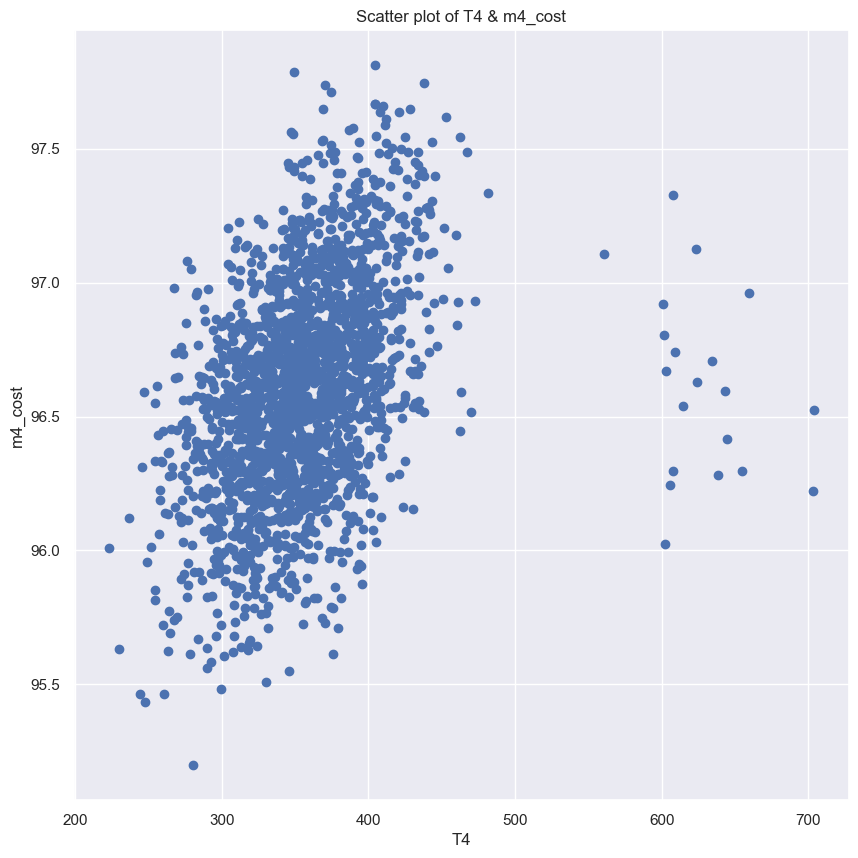

In [1469]:
#let us look at the scatter plots of the M4 input variables & m4_cost again

#T4 & m4_cost

x_axis=merged_df['T4']
y_axis=merged_df['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of T4 & m4_cost')

plt.show()

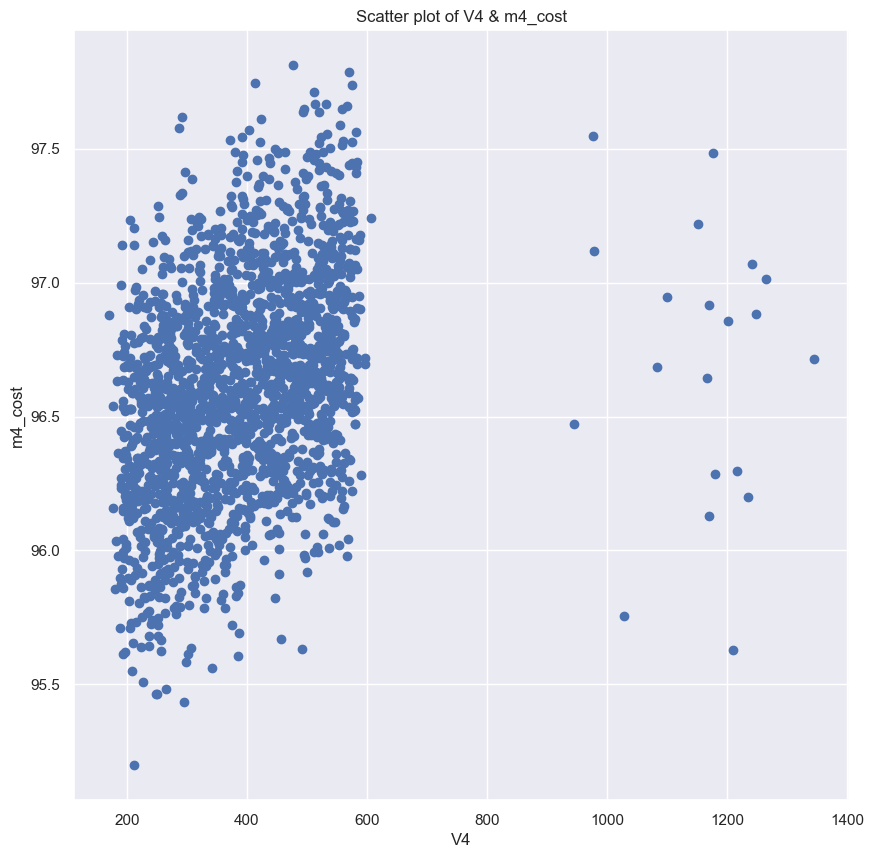

In [1470]:
#V4 & m4_cost

x_axis=merged_df['V4']
y_axis=merged_df['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of V4 & m4_cost')

plt.show()

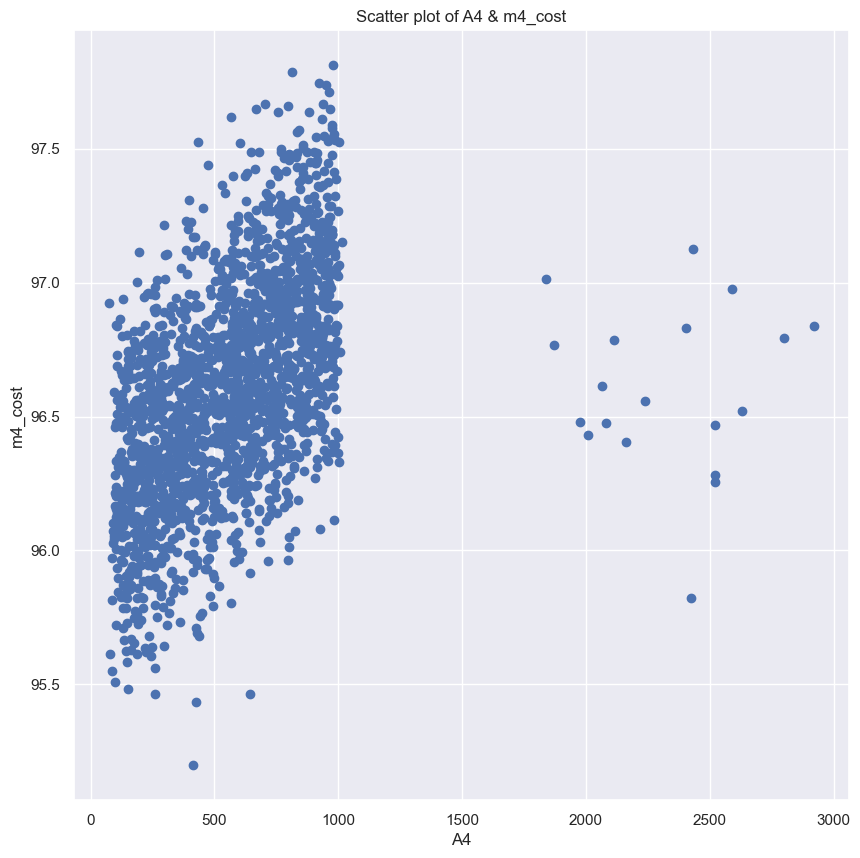

In [1471]:
#A4 & m4_cost

x_axis=merged_df['A4']
y_axis=merged_df['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of A4 & m4_cost')

plt.show()

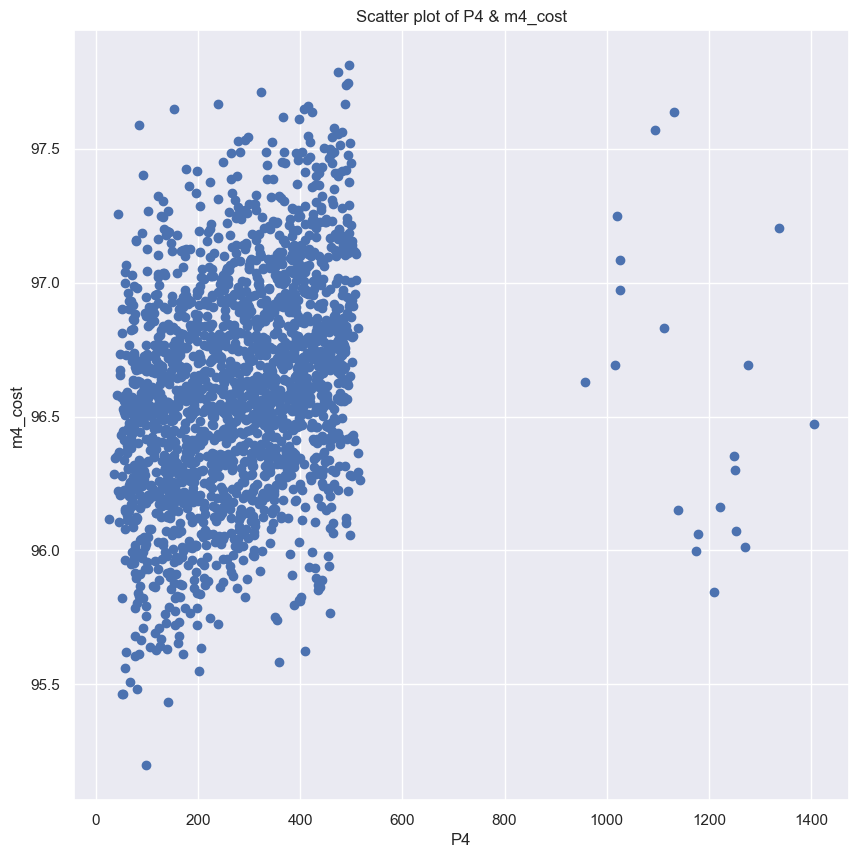

In [1472]:
#P4 & m4_cost

x_axis=merged_df['P4']
y_axis=merged_df['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of P4 & m4_cost')

plt.show()

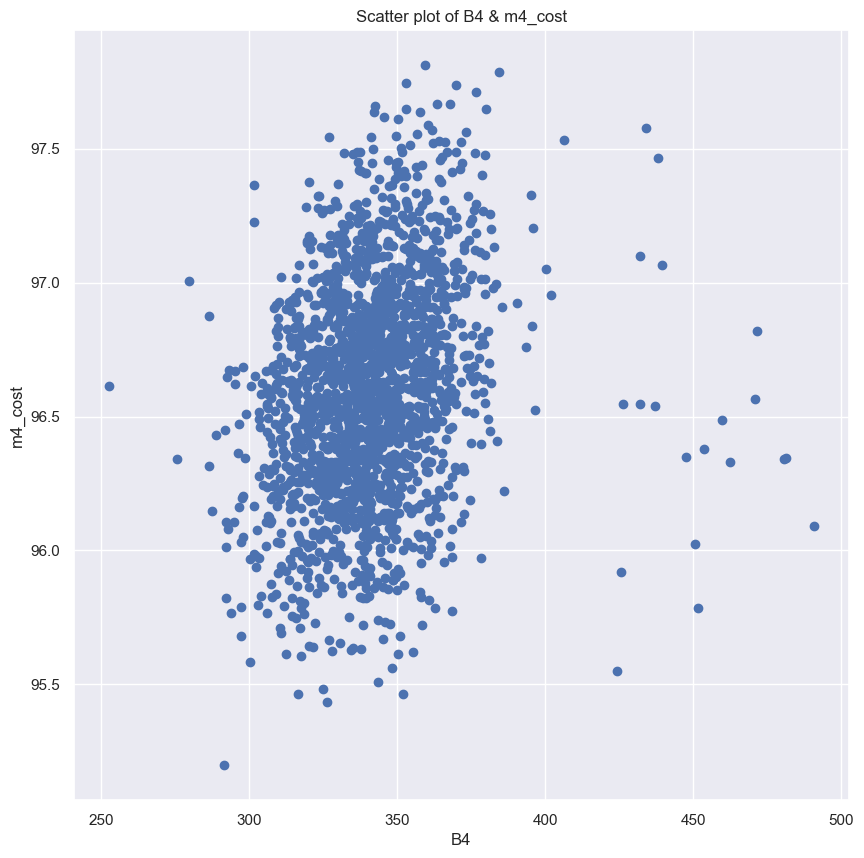

In [1473]:
#B4 & m4_cost

x_axis=merged_df['B4']
y_axis=merged_df['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of B4 & m4_cost')

plt.show()

In [1474]:
#scatter plots suggest, for each M4 variable, there are at least 2 clusters of data points, if not more

In [1475]:
#at least, separating the 2 clusters is required; there may be more clusters in the larger constellation of data points on the left

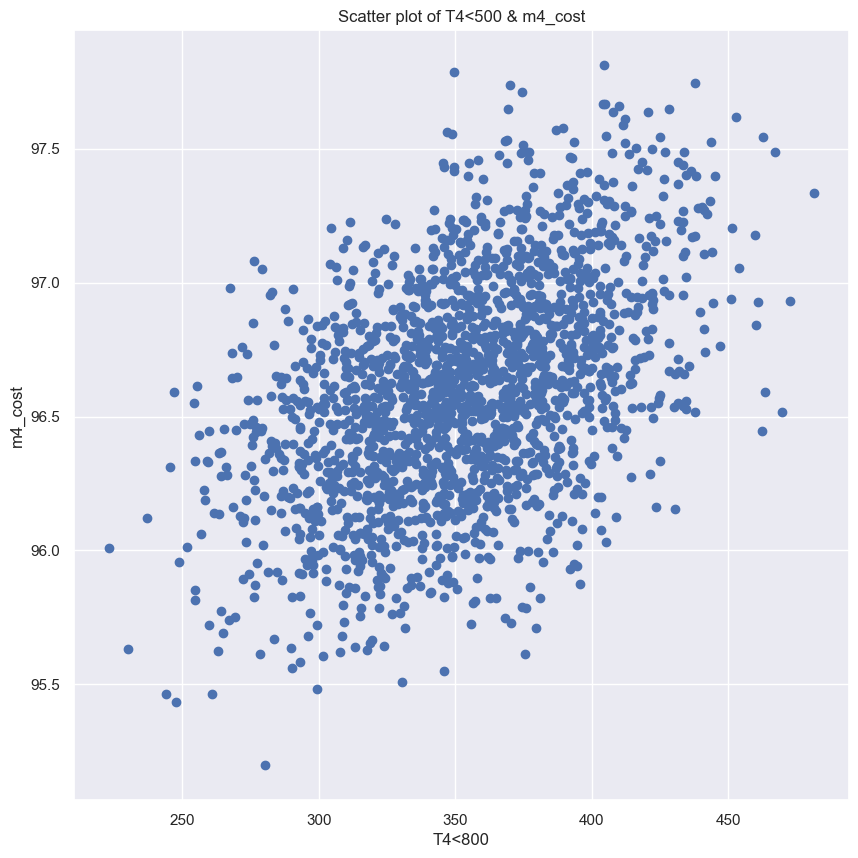

In [1476]:
#let us look at the scatter plot of T4 & m4_cost again - but, this time, separating the data points into 2 clusters at T4=500

#subset of the data frame for T4<500
merged_df_subset = merged_df[merged_df['T4']<500]

x_axis=merged_df_subset['T4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('T4<800')
plt.ylabel('m4_cost')
plt.title('Scatter plot of T4<500 & m4_cost')

plt.show()

In [1477]:
#let us run a linear regression again - but, this time, using T4<500 & m4_cost

x_4=merged_df_subset[['T4']]
y_4=merged_df_subset['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1478]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1479]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.22738906835104167
     Test= 0.20433661342184206
RMSE:
     Train= 0.35948037821887996
     Test= 0.3568288130738418


In [1480]:
#T4<500 & m4_cost - NOT a good linear regression fit (a low R2, a relatively low RMSE)

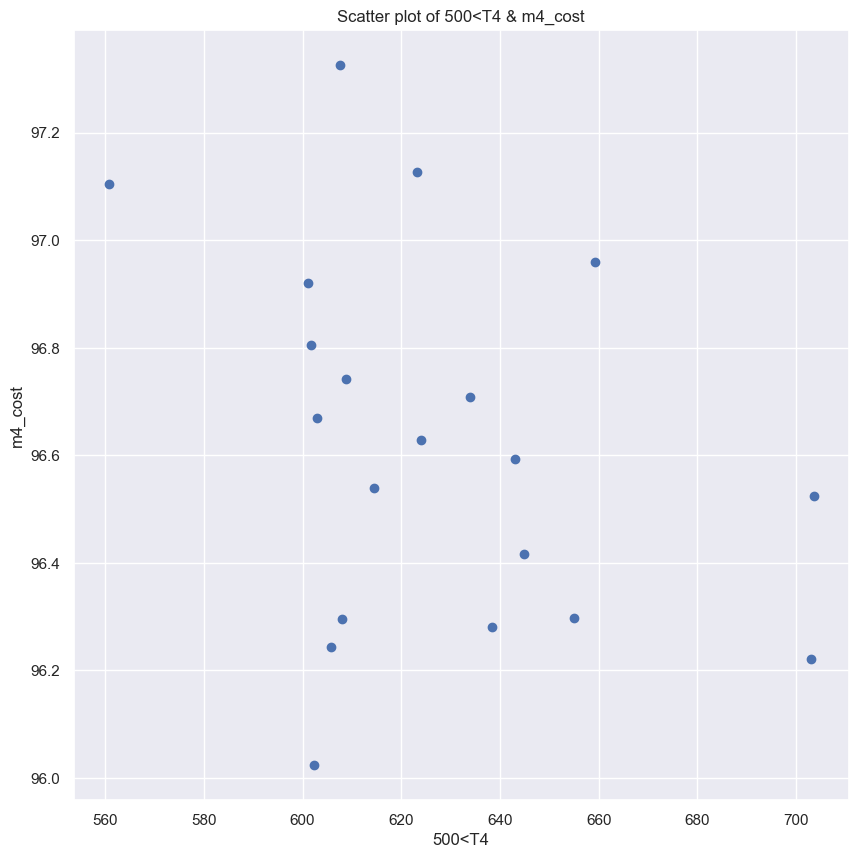

In [1481]:
#subset of the data frame for 500<T4
merged_df_subset = merged_df[500<merged_df['T4']]

x_axis=merged_df_subset['T4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('500<T4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of 500<T4 & m4_cost')

plt.show()

In [1482]:
#500<T4 & m4_cost - a linear regression function would NOT work

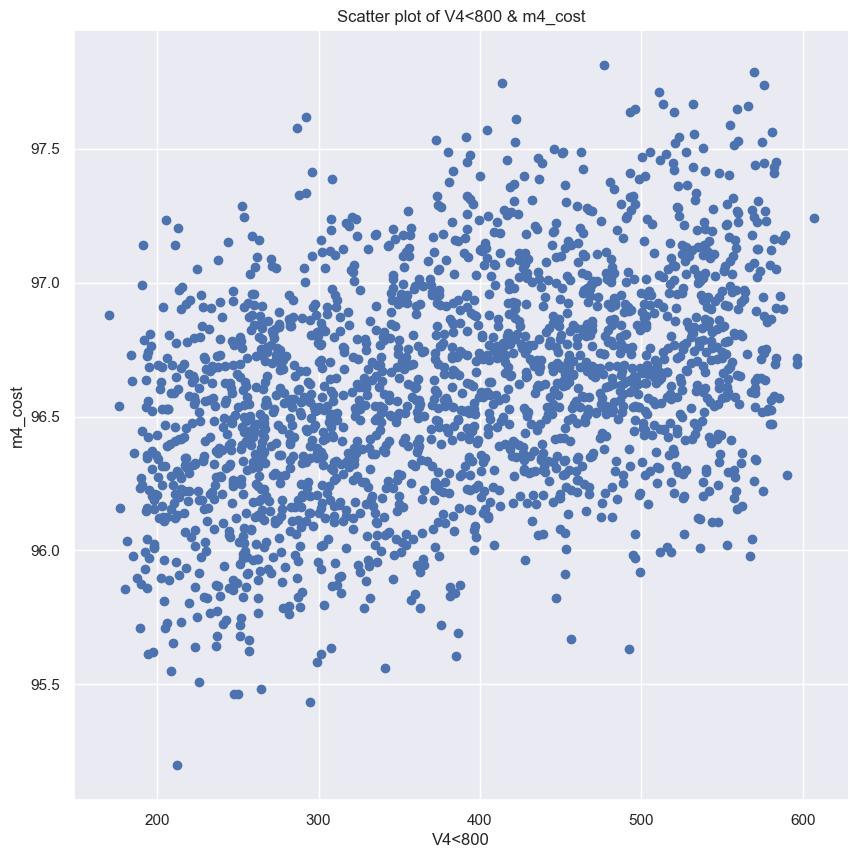

In [1483]:
#let us look at the scatter plot of V4 & m4_cost again - but, this time, separating the data points into 2 clusters at V4=800

#subset of the data frame for V4<800
merged_df_subset = merged_df[merged_df['V4']<800]

x_axis=merged_df_subset['V4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('V4<800')
plt.ylabel('m4_cost')
plt.title('Scatter plot of V4<800 & m4_cost')

plt.show()

In [1484]:
#let us run a linear regression again - but, this time, using V4<800 & m4_cost

x_4=merged_df_subset[['V4']]
y_4=merged_df_subset['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1485]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1486]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.1681597237889214
     Test= 0.09770331772545948
RMSE:
     Train= 0.37035711960045575
     Test= 0.38084708394158684


In [1487]:
#V4<800 & m4_cost - NOT a good linear regression fit (a very low R2, a relatively low RMSE)

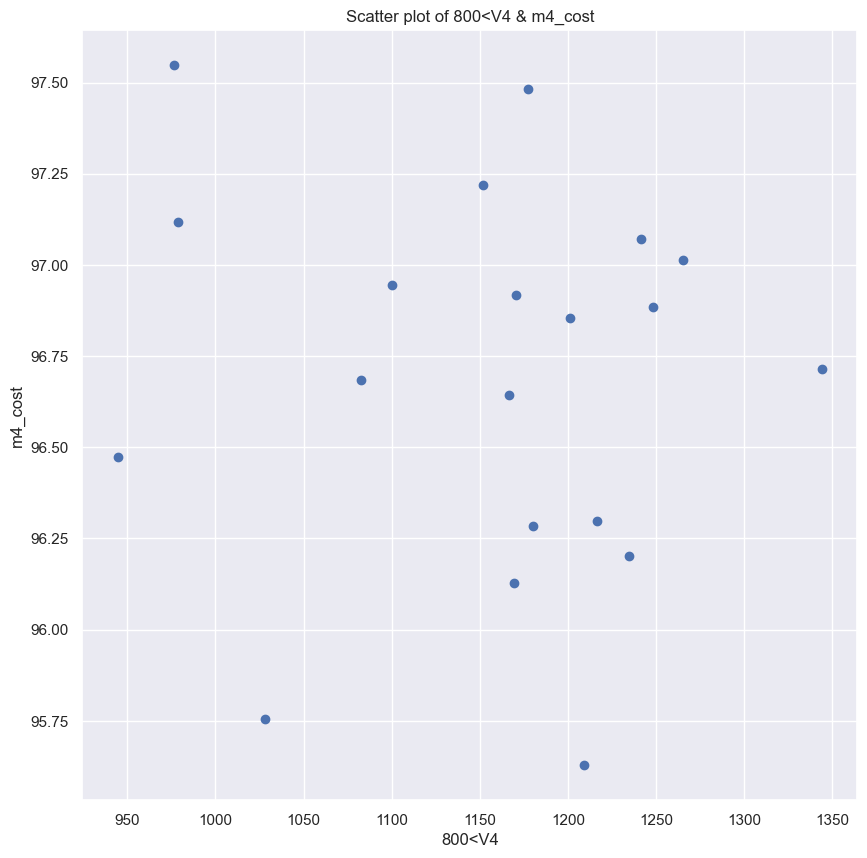

In [1488]:
#subset of the data frame for 800<V4
merged_df_subset = merged_df[800<merged_df['V4']]

x_axis=merged_df_subset['V4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('800<V4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of 800<V4 & m4_cost')

plt.show()

In [1489]:
#800<V4 & m4_cost - a linear regression function would NOT work

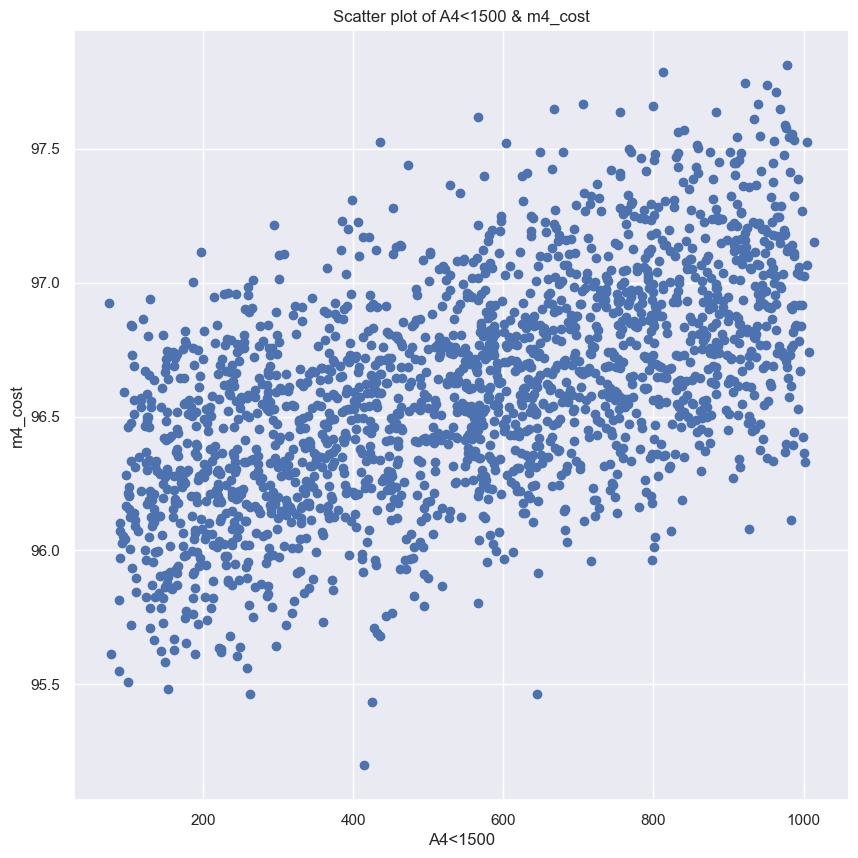

In [1490]:
#let us look at the scatter plot of A4 & m4_cost again - but, this time, separating the data points into 2 clusters at A4=1500

#subset of the data frame for A4<1500
merged_df_subset = merged_df[merged_df['A4']<1500]

x_axis=merged_df_subset['A4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('A4<1500')
plt.ylabel('m4_cost')
plt.title('Scatter plot of A4<1500 & m4_cost')

plt.show()

In [1491]:
#let us run a linear regression again - but, this time, using A4<1500 & m4_cost

x_4=merged_df_subset[['A4']]
y_4=merged_df_subset['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1492]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1493]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.32680310649328315
     Test= 0.3402619210799632
RMSE:
     Train= 0.3302928365196406
     Test= 0.346404809217


In [1494]:
#A4<1500 & m4_cost - NOT a good linear regression fit (a relatively low R2, a relatively low RMSE)

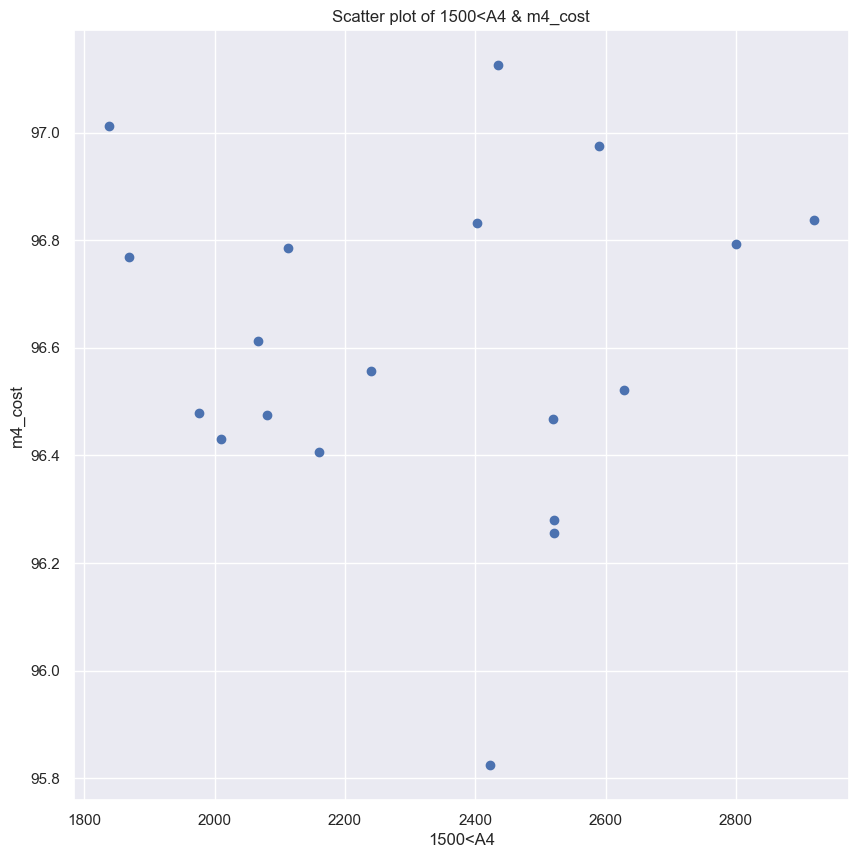

In [1495]:
#subset of the data frame for 1500<A4
merged_df_subset = merged_df[1500<merged_df['A4']]

x_axis=merged_df_subset['A4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('1500<A4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of 1500<A4 & m4_cost')

plt.show()

In [1496]:
#1500<A4 & m4_cost - a linear regression function would NOT work

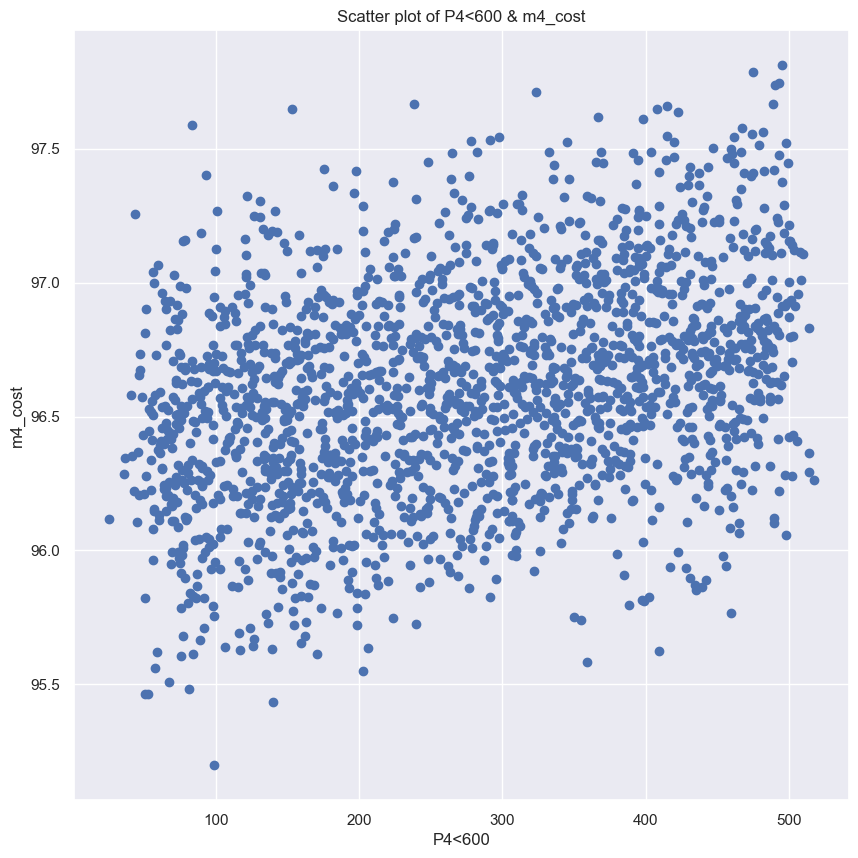

In [1497]:
#let us look at the scatter plot of P4 & m4_cost again - but, this time, separating the data points into 2 clusters at P4=600

#subset of the data frame for P4<600
merged_df_subset = merged_df[merged_df['P4']<600]

x_axis=merged_df_subset['P4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('P4<600')
plt.ylabel('m4_cost')
plt.title('Scatter plot of P4<600 & m4_cost')

plt.show()

In [1498]:
#let us run a linear regression again - but, this time, using P4<600 & m4_cost

x_4=merged_df_subset[['P4']]
y_4=merged_df_subset['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1499]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1500]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.1229227765793579
     Test= 0.09793270633948725
RMSE:
     Train= 0.38126964636160837
     Test= 0.3771164586640392


In [1501]:
#P4<600 & m4_cost - NOT a good linear regression fit (a low R2, a relatively low RMSE)

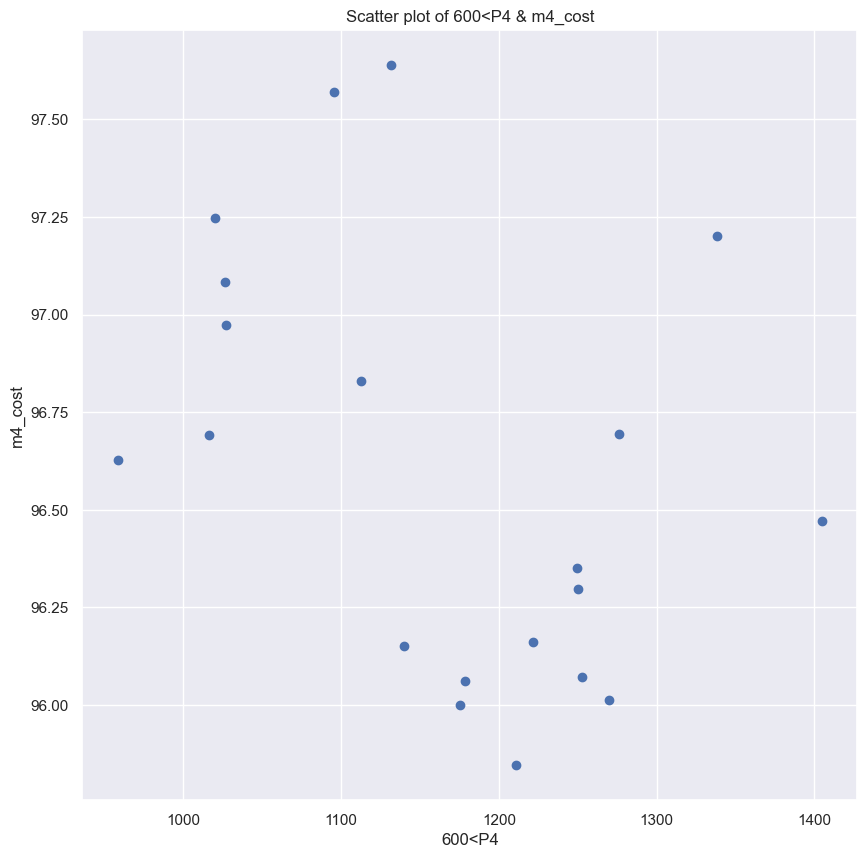

In [1502]:
#subset of the data frame for 600<P4
merged_df_subset = merged_df[600<merged_df['P4']]

x_axis=merged_df_subset['P4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('600<P4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of 600<P4 & m4_cost')

plt.show()

In [1503]:
#600<P4 & m4_cost - a linear regression function would NOT work

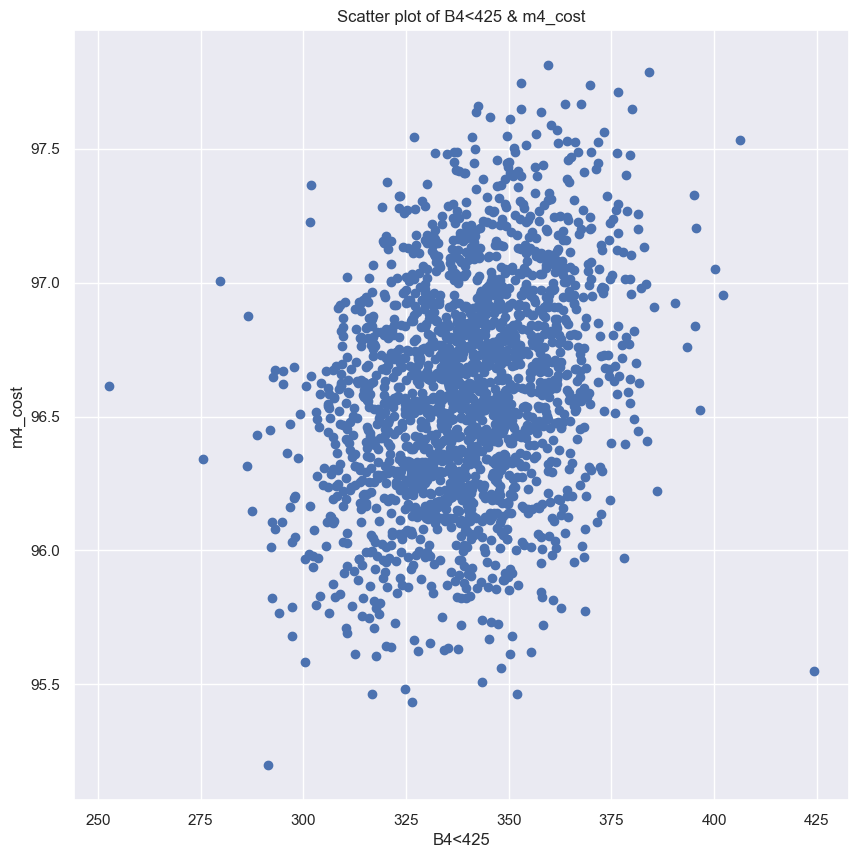

In [1504]:
#let us look at the scatter plot of B4 & m4_cost again - but, this time, separating the data points into 2 clusters at B4=425

#subset of the data frame for B4<425
merged_df_subset = merged_df[merged_df['B4']<425]

x_axis=merged_df_subset['B4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('B4<425')
plt.ylabel('m4_cost')
plt.title('Scatter plot of B4<425 & m4_cost')

plt.show()

In [1505]:
#let us run a linear regression again - but, this time, using B4<425 & m4_cost

x_4=merged_df_subset[['B4']]
y_4=merged_df_subset['m4_cost']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#linear regression using the training dataset

lin_model=LinearRegression()
lin_model.fit(x_train, y_train)

LinearRegression()

In [1506]:
#use R-squared & RMSE to measure the quality of the fit for both the training dataset & the test dataset

#training dataset
y_train_predict=lin_model.predict(x_train)
r2_train=r2_score(y_train, y_train_predict)
rmse_train=(np.sqrt(mean_squared_error(y_train, y_train_predict)))

#test dataset
y_test_predict=lin_model.predict(x_test)
r2_test=r2_score(y_test, y_test_predict)
rmse_test=(np.sqrt(mean_squared_error(y_test, y_test_predict)))

In [1507]:
print('R2:')
print('     Train=', r2_train)
print('     Test=', r2_test)
print('RMSE:')
print('     Train=', rmse_train)
print('     Test=', rmse_test)

R2:
     Train= 0.10389442558789652
     Test= 0.01769983839962508
RMSE:
     Train= 0.3858322018055873
     Test= 0.3952720418286249


In [1508]:
#B4<425 & m4_cost - NOT a good linear regression fit (a very low R2, a relatively low RMSE)

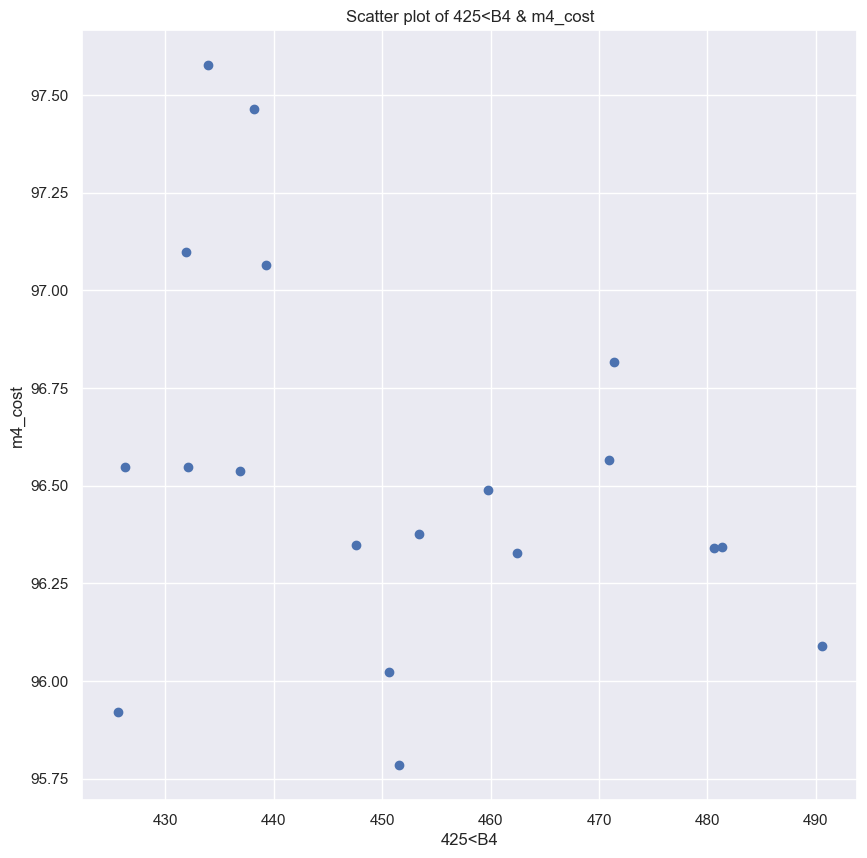

In [1509]:
#subset of the data frame for 425<B4
merged_df_subset = merged_df[425<merged_df['B4']]

x_axis=merged_df_subset['B4']
y_axis=merged_df_subset['m4_cost']

plt.scatter(x_axis, y_axis)

plt.xlabel('425<B4')
plt.ylabel('m4_cost')
plt.title('Scatter plot of 425<B4 & m4_cost')

plt.show()

In [1510]:
#425<B4 & m4_cost - a linear regression function would NOT work

# Note: a linear (polynomial) regression function would NOT be a suitable approach to explain burn_d since burn_d is a 0-or-1 categorical variable

# Summary
- Linear & polynomial regressions DO appear to explain the cost behaviours of M1, M3 & M4 (m1_cost, m3_cost, m4_cost) to SOME extent
- Linear or polynomial regressions do NOT appear to predict m2_cost

# M1
- T1, V1, A1, P1, B1 as a multivariate linear regression as well as multivariate 2nd/3rd-degree polynomial regressions appear to explain m1_cost very well
- For e.g., for [‘T1', 'V1', 'A1', 'P1', 'B1’] =[100, 100, 200, 15, 100] (close to the values of ‘ID’=0 for ‘T1', 'V1', 'A1', 'P1', 'B1’), the predicted cost of M1 (m1_cost) from the multivariate linear regression is approx 92
- Our attempt to find the minimum in the multivariate 2nd-degree polynomial regression failed, suggesting the function is potentially numerically unstable
- Overfitting does NOT appear to be a problem – and regularisation does NOT appear to make a significant difference to the regression fit
- None of the single-input-variable regressions shows a sufficiently strong correlation
- None of the cross-step multivariate regressions shows a sufficiently strong correlation
- The positive coefficients of the linear regression suggest lower M1 input variables would help lower the cost of M1; however, the coefficients are very small - nor do they indicate any optima to minimise the cost
- The coefficients of the polynomial regressions are a mix of positive & negative (very small) numbers; our attempt to find the minimum in the 2nd-degree polynomial regression failed - therefore, the polynomial regressions do NOT suggest a clear way to minimise the cost

# M3
- T3<800 as a linear regression as well as 2nd/3rd-degree polynomial regressions appear to explain m3_cost reasonably well
- For e.g., for ’T3’=400 (given ’T3’<800) (close to the values of ‘ID’=0 for ‘T3’), the predicted cost of M3 (m3_cost) from the linear regression is approx 96
- Our attempt to find the minimum in the 2nd-degree polynomial regression failed, suggesting the function is potentially numerically unstable
- None of the single-input-variable regressions shows a sufficiently strong correlation
- None of the cross-step multivariate regressions shows a sufficiently strong correlation
- The positive coefficient of the linear regression suggests a lower T3 (provided it is below 800) would help lower the cost of M3; however, the coefficient is very small - nor does it indicate the optimum to minimise the cost
- The coefficients of the polynomial regressions are a mix of positive & negative (very small) numbers (that of 'T3' is positive as in the linear regression); our attempt to find the minimum in the 2nd-degree polynomial regression failed - therefore, the polynomial regressions do NOT suggest a clear way to minimise the cost

# M4
- T4, V4, A4, P4, B4 as a multivariate linear regression as well as multivariate 2nd/3rd-degree polynomial regressions appear to explain m4_cost very well
- For e.g., for [‘T4’, 'V4’, 'A4’, 'P4’, 'B4’] =[400, 400, 400, 300, 300] (close to the values of ‘ID’=0 for ‘T4’, 'V4’, 'A4’, 'P4’, 'B4’), the predicted cost of M4 (m4_cost) from the multivariate linear regression is approx 96
- Our attempt to find the minimum in the multivariate 2nd-degree polynomial regression failed, suggesting the function is potentially numerically unstable
- Overfitting does NOT appear to be a problem – and regularisation does NOT appear to make a significant difference to the regression fit
- None of the single-input-variable regressions shows a sufficiently strong correlation
- The positive coefficients of the linear regression suggest lower M4 input variables would help lower the cost of M4; however, the coefficients are very small - nor do they indicate the optima to minimise the cost
- The coefficients of the polynomial regressions are a mix of positive & negative (very small) numbers (those of 'T4', 'V4', 'A4', 'P4' & 'B4' are positive as in the linear regression); our attempt to find the minimum in the 2nd-degree polynomial regression failed - therefore, the polynomial regressions do NOT suggest a clear way to minimise the cost

# 3.2 Logistic Regression (Supervised ML): conta_d, crys_d, i_diff_d, burn_d

We now turn our attention to the defect variables (conta_d, crys_d, i_diff_d, burn_d) – each as the outcome variable of a multivariate logistic regression.  We note again that these variables are 0-or-1 categorical variables – therefore, logistic regressions help us understand the probability of a particular defect occurring given a particular set of input variables.  As in the previous section, for each set of M1-M4 input variables, we attempt to identify correlations vis-à-vis the direct defect variable as well as any later-step defect variable.

For each of our multivariate logistic regressions, we move through the following steps:

1. Run the regression using 80:20 split training & test datasets (estimate the intercept/coefficients where necessary)
2. Estimate the predicted defect probability of each set of input variables (test dataset)
3. Derive the regression fit using the ‘how often did we get the outcome right’ score as well as the confusion matrix & the following values: Accuracy, Misclassification Rate, False Positive Rate, Precision

# M1

In [1511]:
#multivariate logistic regression using all M1 input variables & conta_d

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_1=merged_df['conta_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1.

In [1512]:
#intercept
intercept=logModel.intercept_
intercept

array([8.0450725])

In [1513]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.01170305, -0.00794932, -0.0034158 , -0.02989016, -0.05541745]])

In [1514]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.99158019e-01, 8.41981148e-04],
       [9.71675996e-01, 2.83240043e-02],
       [9.95948046e-01, 4.05195448e-03],
       [8.06465487e-01, 1.93534513e-01],
       [9.33534064e-01, 6.64659357e-02],
       [7.69683607e-01, 2.30316393e-01],
       [9.74556814e-01, 2.54431856e-02],
       [5.15958021e-01, 4.84041979e-01],
       [8.41144895e-01, 1.58855105e-01],
       [9.85024175e-01, 1.49758247e-02],
       [9.97661270e-01, 2.33872960e-03],
       [8.43330055e-01, 1.56669945e-01],
       [9.97545553e-01, 2.45444668e-03],
       [9.84978916e-01, 1.50210839e-02],
       [9.24472640e-01, 7.55273600e-02],
       [8.93648533e-01, 1.06351467e-01],
       [7.05394391e-01, 2.94605609e-01],
       [8.23888299e-01, 1.76111701e-01],
       [9.71415335e-01, 2.85846651e-02],
       [7.68891834e-01, 2.31108166e-01],
       [9.69556047e-01, 3.04439526e-02],
       [9.98483040e-01, 1.51696037e-03],
       [9.94119687e-01, 5.88031309e-03],
       [9.70843202e-01, 2.91567979e-02],
       [9.739481

In [1515]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

0.08419811475352378 %
2.832400434954651 %
0.40519544809932156 %
19.353451346615607 %
6.646593566580964 %
23.031639323076757 %
2.5443185632349357 %
48.40419789571363 %
15.885510468503327 %
1.4975824653272973 %
0.23387296034995075 %
15.666994505075959 %
0.2454446676529476 %
1.5021083874759442 %
7.552735996008073 %
10.635146690990137 %
29.460560873492714 %
17.611170134514225 %
2.858466514399439 %
23.11081655020817 %
3.044395258487752 %
0.1516960365730348 %
0.5880313087698904 %
2.9156797851888827 %
2.605185204779079 %
7.5678626362843335 %
11.928521749129438 %
0.30751125637477805 %
2.191541837043263 %
11.015929022221723 %
3.868630820377946 %
18.040273119161014 %
2.210593394028063 %
0.7750784726288138 %
3.256522925275493 %
3.0153272952109336 %
6.765106221830178 %
15.091112648819905 %
51.977067038991265 %
2.0815568422158743 %
24.65833488479234 %
8.527049797555978 %
0.4008915194491846 %
1.1871341804898534 %
1.0032300549432482 %
1.0377317363031624 %
0.1361996495752380

In [1516]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.93


In [1517]:
#confusion matrix to measure accuracy/quality

#import the confusion matrix library
from sklearn.metrics import confusion_matrix

print(confusion_matrix(y_test, predictions))

[[356   0]
 [ 28  16]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary): True Negative (0) - 348, True Positive (1) - 14, False Positive - 0, False Negative - 38

# 'Accuracy' 90.50%=(348+14)/400

# 'Misclassification Rate' 9.50%=(0+38)/400

# 'False Positive Rate' 0%=0/(348+0)

# 'Precision' 100%=14/(0+14)

In [1518]:
#apply a new ['T1', 'V1', 'A1', 'P1', 'B1'] array to calculate the probability of a contamination defect

#[100, 100, 200, 15, 100]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

import math

probability_defect_new=(1/(1+math.exp(-(7.87077064+100*(-0.00837431)+100*(-0.00645273)+200*(-0.00577089)+15*(-0.03108901)+100*(-0.05666437)))))*100
print('The probability of a contamination defect is ', probability_defect_new, '%')

The probability of a contamination defect is  28.92799904401986 %


In [1519]:
#select only the arrays of ['T1', 'V1', 'A1', 'P1', 'B1'] in the whole dataset (x_1) whose predicted probablity of a contamination defect is less than 5%

In [1520]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the whole dataset (x_1)
probability_defect_all=logModel.predict_proba(x_1)
probability_defect_all

array([[0.93523518, 0.06476482],
       [0.95416722, 0.04583278],
       [0.96438085, 0.03561915],
       ...,
       [0.87851802, 0.12148198],
       [0.99388377, 0.00611623],
       [0.99796592, 0.00203408]])

In [1521]:
filtered_x_1=x_1[probability_defect_all[:, 1]<0.05]

In [1522]:
filtered_x_1

,T1,V1,A1,P1,B1
1,279.123695,106.896424,143.837072,15.394145,108.505666
2,90.800408,163.802623,167.744116,51.453506,123.931713
6,125.824560,306.429457,282.042714,19.963581,131.234779
7,85.407327,279.346684,164.164788,15.279495,152.359977
8,125.972699,283.317137,278.639493,43.441650,156.373373
...,...,...,...,...,...
1986,179.124281,246.565844,175.294245,43.138717,110.246981
1992,135.978230,275.822161,254.613662,26.663922,126.352581
1995,159.071431,202.034973,271.206895,26.687542,123.504741
1998,135.165438,258.534429,20.459556,24.297708,157.036772


In [1523]:
filtered_x_1.describe()

,T1,V1,A1,P1,B1
count,975.000000,975.000000,975.000000,975.000000,975.000000
mean,108.077978,220.379595,175.462134,34.178423,142.739478
std,41.050561,79.220339,108.221809,18.519157,30.562118
min,-1.204738,85.299806,-4.331762,-14.264478,82.990768
25%,83.135924,166.066131,98.549806,22.076266,126.064199
50%,104.927282,220.574559,171.584829,33.099084,138.766977
75%,127.376716,264.031867,241.835186,44.922481,153.519691
max,369.008247,712.310827,865.827160,132.029193,348.473408


In [1524]:
#multivariate logistic regression using all M1 input variables & crys_d

#do the M1 input variables predict the probability of a crystallisation defect (M2)?

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_2=merged_df['crys_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_2, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1525]:
#intercept
intercept=logModel.intercept_
intercept

array([-0.28747677])

In [1526]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[ 0.00050461, -0.00035754,  0.0006412 , -0.00194501,  0.00095777]])

In [1527]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.5441652 , 0.4558348 ],
       [0.53287518, 0.46712482],
       [0.54957487, 0.45042513],
       [0.53869828, 0.46130172],
       [0.51676035, 0.48323965],
       [0.54666383, 0.45333617],
       [0.5144545 , 0.4855455 ],
       [0.54767215, 0.45232785],
       [0.46469299, 0.53530701],
       [0.5451792 , 0.4548208 ],
       [0.55928315, 0.44071685],
       [0.52793505, 0.47206495],
       [0.5511964 , 0.4488036 ],
       [0.53031997, 0.46968003],
       [0.53587153, 0.46412847],
       [0.52763933, 0.47236067],
       [0.54093709, 0.45906291],
       [0.51624662, 0.48375338],
       [0.51583969, 0.48416031],
       [0.55838102, 0.44161898],
       [0.51186528, 0.48813472],
       [0.53266769, 0.46733231],
       [0.50788162, 0.49211838],
       [0.53055932, 0.46944068],
       [0.52137041, 0.47862959],
       [0.54963073, 0.45036927],
       [0.5407052 , 0.4592948 ],
       [0.54426224, 0.45573776],
       [0.50256787, 0.49743213],
       [0.55647532, 0.44352468],
       [0.

In [1528]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

45.58348031992185 %
46.71248192706914 %
45.04251299418632 %
46.130172484666986 %
48.32396525615861 %
45.33361731128158 %
48.5545504251618 %
45.23278522775555 %
53.53070107804645 %
45.48208044917648 %
44.0716850524687 %
47.20649472575438 %
44.88036035330493 %
46.96800283684852 %
46.412847324390306 %
47.236066577150176 %
45.906291444423005 %
48.375337546725774 %
48.41603123435094 %
44.161898181948864 %
48.8134720464745 %
46.73323061502248 %
49.21183832281312 %
46.94406812802349 %
47.862959395172524 %
45.03692733832756 %
45.92947968839509 %
45.573776342796705 %
49.74321266296112 %
44.35246811188357 %
45.71779202385552 %
45.3683700780047 %
47.15654121795712 %
47.558729549824754 %
46.295867440352836 %
48.52635684263738 %
47.04181110844791 %
50.088018956479516 %
43.9578008350692 %
47.369236079776925 %
41.66301281440726 %
36.88294681867985 %
44.02130765684451 %
47.51455426580098 %
45.15587158639419 %
47.87464669073482 %
45.83689881577755 %
45.20425675122402 %
46.948

In [1529]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.5425


In [1530]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[204   5]
 [178  13]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 189, True Positive (1) - 24, False Positive - 27, False Negative - 160

# 'Accuracy' 56.00%=(186+38)/400

# 'Misclassification Rate' 44.00%=(40+136)/400

# 'False Positive Rate' 17.70%=40/(186+40)

# 'Precision' 48.72%=38/(40+38)

In [1531]:
#apply a new ['T1', 'V1', 'A1', 'P1', 'B1'] array to calculate the probability of a crystallisation defect (M2)

#[100, 100, 200, 15, 100]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

import math

probability_defect_new=(1/(1+math.exp(-(-0.38568642+100*(0.00081396)+100*(-0.00028349)+200*(0.00062843)+15*(-0.00333135)+100*(0.00212973)))))*100
print('The probability of a crystallisation defect is ', probability_defect_new, '%')

The probability of a crystallisation defect is  48.90141008628391 %


In [1532]:
#multivariate logistic regression using all M1 input variables & i_diff_d

#do the M1 input variables predict the probability of an ion diffusion defect (M3)?

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_3=merged_df['i_diff_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_3, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1533]:
#intercept
intercept=logModel.intercept_
intercept

array([-1.64848975])

In [1534]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.00155374, -0.00012407, -0.00130304,  0.00481503, -0.00401975]])

In [1535]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.92067587, 0.07932413],
       [0.91230764, 0.08769236],
       [0.92389732, 0.07610268],
       [0.91648236, 0.08351764],
       [0.89126501, 0.10873499],
       [0.92045062, 0.07954938],
       [0.91793376, 0.08206624],
       [0.93748081, 0.06251919],
       [0.91470386, 0.08529614],
       [0.92483182, 0.07516818],
       [0.89955084, 0.10044916],
       [0.91665856, 0.08334144],
       [0.89366291, 0.10633709],
       [0.91910311, 0.08089689],
       [0.93830459, 0.06169541],
       [0.89419449, 0.10580551],
       [0.91319733, 0.08680267],
       [0.9197562 , 0.0802438 ],
       [0.90486705, 0.09513295],
       [0.9159269 , 0.0840731 ],
       [0.93450574, 0.06549426],
       [0.90793789, 0.09206211],
       [0.89300253, 0.10699747],
       [0.8969083 , 0.1030917 ],
       [0.92825629, 0.07174371],
       [0.86368745, 0.13631255],
       [0.90807709, 0.09192291],
       [0.93336353, 0.06663647],
       [0.93440899, 0.06559101],
       [0.92329622, 0.07670378],
       [0.

In [1536]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

7.9324127009103265 %
8.769235636363577 %
7.610267811052935 %
8.35176350494477 %
10.8734993950108 %
7.954938430249449 %
8.206623771050614 %
6.25191859475113 %
8.52961445101226 %
7.516817636181802 %
10.044916057042023 %
8.33414352933218 %
10.633708837893007 %
8.089689359799129 %
6.169541315010354 %
10.580551336250169 %
8.680266933092081 %
8.024380401496293 %
9.51329506228652 %
8.407310150909913 %
6.549426362688278 %
9.206210669370908 %
10.699746895709808 %
10.309169957082819 %
7.17437102907644 %
13.631254968717354 %
9.19229149052486 %
6.6636472849787065 %
6.559100993711395 %
7.670377782144959 %
7.948785100831265 %
7.567269558291985 %
7.131719205306986 %
7.981159509306426 %
9.84250888443205 %
11.585791504576056 %
8.956836650431962 %
10.217916373645958 %
9.31904023871343 %
9.59840144333297 %
9.478067549867255 %
7.0070174788976205 %
8.48817949438182 %
8.392739650688727 %
8.000664394731162 %
10.687985928247965 %
8.460336547275142 %
7.5499407770507965 %
9.7719175087

In [1537]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.935


In [1538]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[374   0]
 [ 26   0]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 369, True Positive (1) - 0, False Positive - 0, False Negative - 31

# 'Accuracy' 92.25%=(369+0)/400

# 'Misclassification Rate' 7.75%=(0+31)/400

# 'False Positive Rate' 0%=0/(369+0)

# 'Precision' N/A

In [1539]:
#apply a new ['T1', 'V1', 'A1', 'P1', 'B1'] array to calculate the probability of an ion diffusion defect (M3)

#[100, 100, 200, 15, 100]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

import math

probability_defect_new=(1/(1+math.exp(-(-1.83523132+100*(-0.00346134)+100*(0.00050716)+200*(-0.0009256)+15*(0.01102154)+100*(-0.0046882)))))*100
print('The probability of an ion diffusion defect is ', probability_defect_new, '%')

The probability of an ion diffusion defect is  6.7908725021475895 %


In [1540]:
#among the previously filtered sets of arrays of ['T1', 'V1', 'A1', 'P1', 'B1'], select only those whose predicted probablity of an ion diffusion defect is less than 5%; this is a way to further filter the choice of the M1 input variables

In [1541]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the previously filtered dataset (filtered_x_1)
probability_defect_filtered=logModel.predict_proba(filtered_x_1)
probability_defect_filtered

array([[0.93369628, 0.06630372],
       [0.90711389, 0.09288611],
       [0.93589162, 0.06410838],
       ...,
       [0.93351999, 0.06648001],
       [0.91919738, 0.08080262],
       [0.92765345, 0.07234655]])

In [1542]:
filtered_x_1=filtered_x_1[probability_defect_filtered[:, 1]<0.05]

In [1543]:
filtered_x_1

,T1,V1,A1,P1,B1
23,326.666911,229.746700,286.839617,16.220917,136.177673
134,85.078364,122.027505,732.909987,37.325882,134.795290
262,113.784625,146.235091,266.646317,16.662202,297.820529
311,52.694518,200.375163,274.073484,20.791814,287.988639
356,87.103242,190.258716,719.438197,21.198672,153.300176
439,55.727429,567.432700,169.178871,-4.726790,348.473408
550,25.528030,237.914884,144.283243,34.407417,316.323002
619,90.397671,261.048343,228.590355,30.619875,343.006210
656,97.333245,294.010866,712.671191,32.416717,129.284249
674,79.222470,170.022986,187.389234,16.915668,284.645889


In [1544]:
filtered_x_1.describe()

,T1,V1,A1,P1,B1
count,33.000000,33.000000,33.000000,33.000000,33.000000
mean,115.670229,217.893649,386.020208,24.558502,230.100929
std,59.518454,109.193980,257.228512,16.724333,88.149320
min,25.528030,112.845407,32.800194,-4.726790,86.606606
25%,85.078364,146.235091,228.590355,11.367064,136.177673
50%,101.704950,199.379966,272.013637,21.044378,275.026457
75%,127.440749,261.048343,691.138913,34.407417,302.216119
max,326.666911,581.562611,865.827160,64.223433,348.473408


In [1545]:
#multivariate logistic regression using all M1 input variables & burn_d

#do the M1 input variables predict the probability of a burnishing defect (M4)?

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_4=merged_df['burn_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_4, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1546]:
#intercept
intercept=logModel.intercept_
intercept

array([2.90045763])

In [1547]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.00701961, -0.00746307, -0.00502535, -0.01627186, -0.0173545 ]])

In [1548]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.97122895e-01, 2.87710516e-03],
       [9.89718240e-01, 1.02817598e-02],
       [9.34845549e-01, 6.51544509e-02],
       [9.70071096e-01, 2.99289037e-02],
       [8.71848488e-01, 1.28151512e-01],
       [9.10093927e-01, 8.99060734e-02],
       [8.99033732e-01, 1.00966268e-01],
       [5.72387901e-01, 4.27612099e-01],
       [9.02573184e-01, 9.74268156e-02],
       [9.58180189e-01, 4.18198108e-02],
       [9.69451068e-01, 3.05489321e-02],
       [8.57521136e-01, 1.42478864e-01],
       [9.64521211e-01, 3.54787891e-02],
       [8.83701758e-01, 1.16298242e-01],
       [8.22459760e-01, 1.77540240e-01],
       [9.45855778e-01, 5.41442216e-02],
       [9.75558887e-01, 2.44411130e-02],
       [9.67861898e-01, 3.21381024e-02],
       [9.54427085e-01, 4.55729145e-02],
       [9.81626268e-01, 1.83737316e-02],
       [9.96592588e-01, 3.40741248e-03],
       [9.62236688e-01, 3.77633120e-02],
       [9.69204786e-01, 3.07952145e-02],
       [9.40903712e-01, 5.90962879e-02],
       [9.551193

In [1549]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

0.2877105161874498 %
1.0281759798187107 %
6.515445087176397 %
2.992890374693554 %
12.815151243380276 %
8.990607344512519 %
10.096626767793794 %
42.76120988663285 %
9.742681563866595 %
4.181981077650934 %
3.0548932114748935 %
14.247886391424643 %
3.5478789050278383 %
11.629824181032646 %
17.75402395246251 %
5.414422156147443 %
2.4441112980407116 %
3.2138102440565164 %
4.557291453895821 %
1.8373731558449875 %
0.34074124752542334 %
3.776331199703094 %
3.079521446075548 %
5.909628794470665 %
4.48806464297273 %
1.2403335299586629 %
7.050440797868839 %
8.51760690949144 %
3.281109300816693 %
5.5562247790842605 %
9.009170821626087 %
3.9019733719627894 %
2.246155476400727 %
3.374802389813321 %
11.327262002527624 %
3.817645364274014 %
6.540636834728558 %
14.291747173361333 %
19.67450871408671 %
6.771261257303859 %
3.194155646626272 %
21.902893824912546 %
4.6229318011142855 %
5.852018593895201 %
11.480214584539032 %
1.5130462980977097 %
4.563323271410761 %
5.71293490331

In [1550]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.905


In [1551]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[362   0]
 [ 38   0]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 366, True Positive (1) - 0, False Positive - 0, False Negative - 34

# 'Accuracy' 91.50%=(366+0)/400

# 'Misclassification Rate' 8.50%=(0+34)/400

# 'False Positive Rate' 0%=0/(366+0)

# 'Precision' N/A

In [1552]:
#apply a new ['T1', 'V1', 'A1', 'P1', 'B1'] array to calculate the probability of a burnishing defect (M4)

#[100, 100, 200, 15, 100]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

import math

probability_defect_new=(1/(1+math.exp(-(3.05518064+100*(-0.00781604)+100*(-0.00814677)+200*(-0.00480759)+15*(-0.01852091)+100*(-0.01615377)))))*100
print('The probability of a burnishing defect is ', probability_defect_new, '%')

The probability of a burnishing defect is  19.848200060040757 %


In [1553]:
#among the previously filtered sets of arrays of ['T1', 'V1', 'A1', 'P1', 'B1'], select only those whose predicted probablity of a burnishing defect is less than 5%; this is a way to further filter the choice of the M1 input variables

In [1554]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the previously filtered dataset (filtered_x_1)
probability_defect_filtered=logModel.predict_proba(filtered_x_1)
probability_defect_filtered

array([[9.94380871e-01, 5.61912895e-03],
       [9.94713280e-01, 5.28672013e-03],
       [9.96887692e-01, 3.11230848e-03],
       [9.96592588e-01, 3.40741248e-03],
       [9.96832713e-01, 3.16728667e-03],
       [9.99805789e-01, 1.94210980e-04],
       [9.97067289e-01, 2.93271142e-03],
       [9.99312673e-01, 6.87326522e-04],
       [9.98220382e-01, 1.77961776e-03],
       [9.93827021e-01, 6.17297897e-03],
       [9.99282251e-01, 7.17749152e-04],
       [9.96311166e-01, 3.68883386e-03],
       [9.98874302e-01, 1.12569809e-03],
       [9.95181110e-01, 4.81889026e-03],
       [9.98400120e-01, 1.59988016e-03],
       [9.82889993e-01, 1.71100071e-02],
       [9.95153675e-01, 4.84632456e-03],
       [9.96378752e-01, 3.62124789e-03],
       [9.98982971e-01, 1.01702865e-03],
       [9.97719560e-01, 2.28043982e-03],
       [9.76084067e-01, 2.39159330e-02],
       [9.99682294e-01, 3.17706461e-04],
       [9.98743845e-01, 1.25615530e-03],
       [9.92807774e-01, 7.19222562e-03],
       [9.947525

In [1555]:
filtered_x_1=filtered_x_1[probability_defect_filtered[:, 1]<0.05]

In [1556]:
filtered_x_1

,T1,V1,A1,P1,B1
23,326.666911,229.746700,286.839617,16.220917,136.177673
134,85.078364,122.027505,732.909987,37.325882,134.795290
262,113.784625,146.235091,266.646317,16.662202,297.820529
311,52.694518,200.375163,274.073484,20.791814,287.988639
356,87.103242,190.258716,719.438197,21.198672,153.300176
439,55.727429,567.432700,169.178871,-4.726790,348.473408
550,25.528030,237.914884,144.283243,34.407417,316.323002
619,90.397671,261.048343,228.590355,30.619875,343.006210
656,97.333245,294.010866,712.671191,32.416717,129.284249
674,79.222470,170.022986,187.389234,16.915668,284.645889


In [1557]:
filtered_x_1.describe()

,T1,V1,A1,P1,B1
count,33.000000,33.000000,33.000000,33.000000,33.000000
mean,115.670229,217.893649,386.020208,24.558502,230.100929
std,59.518454,109.193980,257.228512,16.724333,88.149320
min,25.528030,112.845407,32.800194,-4.726790,86.606606
25%,85.078364,146.235091,228.590355,11.367064,136.177673
50%,101.704950,199.379966,272.013637,21.044378,275.026457
75%,127.440749,261.048343,691.138913,34.407417,302.216119
max,326.666911,581.562611,865.827160,64.223433,348.473408


# M2

In [1558]:
#multivariate logistic regression using all M2 input variables & crys_d

x_2=merged_df[['T2', 'V2', 'A2', 'P2', 'B2']]
y_2=merged_df['crys_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 1., 1., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1559]:
#intercept
intercept=logModel.intercept_
intercept

array([0.00083466])

In [1560]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[ 0.0005295 ,  0.00013376, -0.00057891,  0.00019991, -0.00114717]])

In [1561]:
#defect probability of each ['T2', 'V2', 'A2', 'P2', 'B2'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.55883174, 0.44116826],
       [0.50416229, 0.49583771],
       [0.5654217 , 0.4345783 ],
       [0.54806326, 0.45193674],
       [0.50597067, 0.49402933],
       [0.55073919, 0.44926081],
       [0.51720788, 0.48279212],
       [0.48813421, 0.51186579],
       [0.57473239, 0.42526761],
       [0.54275009, 0.45724991],
       [0.50010719, 0.49989281],
       [0.52506301, 0.47493699],
       [0.53693647, 0.46306353],
       [0.55589791, 0.44410209],
       [0.51988357, 0.48011643],
       [0.55855976, 0.44144024],
       [0.51269659, 0.48730341],
       [0.51144704, 0.48855296],
       [0.54177218, 0.45822782],
       [0.52176987, 0.47823013],
       [0.55136692, 0.44863308],
       [0.54919624, 0.45080376],
       [0.55785833, 0.44214167],
       [0.52470065, 0.47529935],
       [0.5114434 , 0.4885566 ],
       [0.51631238, 0.48368762],
       [0.54685674, 0.45314326],
       [0.55995203, 0.44004797],
       [0.55551027, 0.44448973],
       [0.51180508, 0.48819492],
       [0.

In [1562]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

44.116825929461086 %
49.58377128882243 %
43.4578295020463 %
45.193674153109065 %
49.40293286791776 %
44.926080892449086 %
48.27921216219721 %
51.18657896185662 %
42.526761261586195 %
45.724990929440665 %
49.989280705462114 %
47.49369920755973 %
46.30635324072098 %
44.4102094231357 %
48.01164277443578 %
44.144024447691976 %
48.73034087738546 %
48.85529643178538 %
45.82278187998525 %
47.82301274096997 %
44.863307866752486 %
45.080376452212015 %
44.21416708977979 %
47.529935448684064 %
48.855660340347285 %
48.36876175294235 %
45.31432594034096 %
44.004797293940015 %
44.44897302911749 %
48.81949240339038 %
46.70153808403414 %
48.436921237121034 %
44.456803818742344 %
45.33714982731987 %
51.43069344569724 %
44.382897303779956 %
55.59398750611366 %
50.38480327365738 %
50.65968826596339 %
44.834756626292176 %
46.42348872088521 %
43.859378706630004 %
48.99677453716891 %
51.62384982385002 %
45.66025348873675 %
44.32553568182372 %
46.5489556470056 %
49.576100870756775 

In [1563]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.565


In [1564]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[201   8]
 [166  25]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 204, True Positive (1) - 34, False Positive - 10, False Negative - 152

# 'Accuracy' 59.50%=(204+34)/400

# 'Misclassification Rate' 40.50%=(10+152)/400

# 'False Positive Rate' 4.67%=10/(204+10)

# 'Precision' 77.27%=34/(10+34)

In [1565]:
merged_df.loc[:, ['T2', 'V2', 'A2', 'P2', 'B2']]

,T2,V2,A2,P2,B2
0,507.780191,370.014740,123.161691,43.707415,303.446698
1,571.603120,468.268042,177.169161,73.582653,256.794293
2,541.071181,487.986805,33.832191,82.867949,263.355556
3,510.012513,427.478352,283.932571,90.980745,279.062032
4,524.771696,317.944358,409.512248,71.396122,293.195537
...,...,...,...,...,...
1995,517.280296,462.753197,266.051695,100.102305,316.755773
1996,527.311922,347.071692,113.533567,55.430948,261.597180
1997,598.385252,366.502573,284.444796,44.672621,329.278292
1998,576.891863,951.337880,187.995396,44.988842,364.612119


In [1566]:
#apply a new ['T2', 'V2', 'A2', 'P2', 'B2'] array to calculate the probability of a crystallisation defect

#[500, 300, 100, 50, 300]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_defect_new=(1/(1+math.exp(-(-2.84228522e-06+500*(8.38923360e-04)+300*(-1.48001053e-04)+100*(-8.12968377e-04)+50*(9.72267214e-05)+300*(-1.15493622e-03)))))*100
print('The probability of a crystallisation defect is ', probability_defect_new, '%')

The probability of a crystallisation defect is  48.803782161364964 %


In [1567]:
#multivariate logistic regression using all M2 input variables & i_diff_d

#do the M2 input variables predict the probability of an ion diffusion defect (M3)?

x_2=merged_df[['T2', 'V2', 'A2', 'P2', 'B2']]
y_3=merged_df['i_diff_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_3, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1568]:
#intercept
intercept=logModel.intercept_
intercept

array([-0.00515553])

In [1569]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.00424446, -0.00116139,  0.00092595, -0.00158279,  0.00025616]])

In [1570]:
#defect probability of each ['T2', 'V2', 'A2', 'P2', 'B2'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.88018416, 0.11981584],
       [0.90027287, 0.09972713],
       [0.90399113, 0.09600887],
       [0.93758842, 0.06241158],
       [0.89503187, 0.10496813],
       [0.88277543, 0.11722457],
       [0.92178293, 0.07821707],
       [0.91689459, 0.08310541],
       [0.90587699, 0.09412301],
       [0.90037018, 0.09962982],
       [0.92839458, 0.07160542],
       [0.89465271, 0.10534729],
       [0.94109831, 0.05890169],
       [0.9148042 , 0.0851958 ],
       [0.90867439, 0.09132561],
       [0.86959641, 0.13040359],
       [0.92161958, 0.07838042],
       [0.93831881, 0.06168119],
       [0.8893707 , 0.1106293 ],
       [0.938698  , 0.061302  ],
       [0.90408282, 0.09591718],
       [0.9491536 , 0.0508464 ],
       [0.9325692 , 0.0674308 ],
       [0.8717312 , 0.1282688 ],
       [0.94701441, 0.05298559],
       [0.94022376, 0.05977624],
       [0.9126897 , 0.0873103 ],
       [0.90813244, 0.09186756],
       [0.93083826, 0.06916174],
       [0.94365897, 0.05634103],
       [0.

In [1571]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

11.981583550785306 %
9.972713171950993 %
9.60088731688641 %
6.241157986245869 %
10.496813106036596 %
11.72245653360787 %
7.821707444045669 %
8.310540546976936 %
9.41230073183039 %
9.962981918379509 %
7.160542307483403 %
10.534728940126339 %
5.890169492338343 %
8.51958023999696 %
9.132560600274807 %
13.040359129807896 %
7.838042130006046 %
6.168119383612405 %
11.062930445176026 %
6.13019986533454 %
9.591718090002347 %
5.084640306757484 %
6.743080010029318 %
12.826880178800588 %
5.298558660310533 %
5.977623651424488 %
8.731029723515649 %
9.186756034112186 %
6.916173712066501 %
5.634102983937044 %
8.634872213760428 %
7.23161447558087 %
9.500002072572668 %
1.6010700871785652 %
8.832138663789006 %
7.79816854105315 %
5.6173720522281 %
5.558435218591376 %
6.674823160733282 %
6.37544163144515 %
7.555855473322154 %
12.117489982080205 %
8.755721645478602 %
6.1205415673767485 %
7.954088414004613 %
15.192758217730276 %
9.82757510299302 %
8.634328581161018 %
9.21543088977

In [1572]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.925


In [1573]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[370   0]
 [ 30   0]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 371, True Positive (1) - 0, False Positive - 0, False Negative - 29

# 'Accuracy' 92.75%=(371+0)/400

# 'Misclassification Rate' 8.75%=(0+29)/400

# 'False Positive Rate' 0%=0/(371+0)

# 'Precision' N/A

In [1574]:
#apply a new ['T2', 'V2', 'A2', 'P2', 'B2'] array to calculate the probability of an ion diffusion defect

#[500, 300, 100, 50, 300]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_defect_new=(1/(1+math.exp(-(-0.00680981+500*(-0.00418849)+300*(-0.00163322)+100*(0.00081298)+50*(0.00074096)+300*(0.00014853)))))*100
print('The probability of an ion diffusion defect is ', probability_defect_new, '%')

The probability of an ion diffusion defect is  8.10536984802611 %


In [1575]:
 #select only the arrays of ['T2', 'V2', 'A2', 'P2', 'B2'] in the whole dataset (x_2) whose predicted probablity of an ion diffusion defect is less than 5%

In [1576]:
#defect probability of each ['T2', 'V2', 'A2', 'P2', 'B2'] input array in the whole dataset (x_2)
probability_defect_all=logModel.predict_proba(x_2)
probability_defect_all

array([[0.92183509, 0.07816491],
       [0.94592431, 0.05407569],
       [0.94788725, 0.05211275],
       ...,
       [0.93664834, 0.06335166],
       [0.96650713, 0.03349287],
       [0.93292126, 0.06707874]])

In [1577]:
filtered_x_2=x_2[probability_defect_all[:, 1]<0.05]

In [1578]:
filtered_x_2

,T2,V2,A2,P2,B2
31,664.833459,314.811201,204.453190,107.127205,252.616391
70,662.086834,341.795530,59.091353,98.352476,332.559455
74,646.936422,276.660062,122.967964,92.057690,373.104567
85,677.023496,290.343971,29.403148,79.326099,228.513923
87,646.367250,242.314665,147.802925,98.610810,294.464044
...,...,...,...,...,...
1950,660.504340,460.069441,161.058659,40.980750,285.977810
1960,727.393764,385.870089,92.573920,59.324437,296.367456
1972,592.608191,432.692898,115.821681,78.873128,331.062812
1978,620.279615,327.757413,87.832055,71.204254,308.669005


In [1579]:
filtered_x_2.describe()

,T2,V2,A2,P2,B2
count,139.000000,139.000000,139.000000,139.000000,139.000000
mean,674.924927,452.386406,160.243574,73.411303,302.584209
std,130.604286,159.918182,142.137696,22.568517,51.627621
min,449.142041,242.314665,5.496326,29.845712,212.719798
25%,605.758422,355.846062,71.655497,57.335356,270.154742
50%,635.139567,429.971508,122.967964,74.347693,301.316658
75%,669.241740,473.026371,193.486966,89.560278,328.061615
max,1100.148937,991.835586,1185.549261,189.542700,585.278820


In [1580]:
#multivariate logistic regression using all M2 input variables & burn_d

#do the M2 input variables predict the probability of a burnishing defect (M4)?

x_2=merged_df[['T2', 'V2', 'A2', 'P2', 'B2']]
y_4=merged_df['burn_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_4, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1581]:
#intercept
intercept=logModel.intercept_
intercept

array([-1.73953288e-05])

In [1582]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.00164529, -0.00247254,  0.00027595, -0.00270778, -0.00163206]])

In [1583]:
#defect probability of each ['T2', 'V2', 'A2', 'P2', 'B2'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.89901839, 0.10098161],
       [0.93744521, 0.06255479],
       [0.89213761, 0.10786239],
       [0.94234315, 0.05765685],
       [0.91347758, 0.08652242],
       [0.9111803 , 0.0888197 ],
       [0.90837161, 0.09162839],
       [0.91520228, 0.08479772],
       [0.90145526, 0.09854474],
       [0.92641706, 0.07358294],
       [0.92791884, 0.07208116],
       [0.91572595, 0.08427405],
       [0.91445907, 0.08554093],
       [0.91297669, 0.08702331],
       [0.93379458, 0.06620542],
       [0.86308005, 0.13691995],
       [0.91225645, 0.08774355],
       [0.91279159, 0.08720841],
       [0.92443831, 0.07556169],
       [0.87746912, 0.12253088],
       [0.91203818, 0.08796182],
       [0.89964501, 0.10035499],
       [0.90690087, 0.09309913],
       [0.90294093, 0.09705907],
       [0.87321893, 0.12678107],
       [0.94259099, 0.05740901],
       [0.90383979, 0.09616021],
       [0.91409251, 0.08590749],
       [0.88331589, 0.11668411],
       [0.93181272, 0.06818728],
       [0.

In [1584]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

10.098161294756368 %
6.255479108407835 %
10.78623898125897 %
5.76568465121608 %
8.65224172191947 %
8.881970105378821 %
9.162839316373372 %
8.479772058356994 %
9.854473744870957 %
7.358293682616718 %
7.208115559749423 %
8.427404804275142 %
8.55409313078909 %
8.702330729345825 %
6.620542154903901 %
13.691994856072412 %
8.774355297661437 %
8.720841009613945 %
7.5561694138626265 %
12.253088415276064 %
8.796181966565571 %
10.035498741491141 %
9.309913234412727 %
9.705907381050602 %
12.678107186579233 %
5.740900752067403 %
9.61602138867693 %
8.590748970348843 %
11.668410543551134 %
6.81872822800535 %
6.703017165836345 %
9.862983181732602 %
6.9966946752346475 %
10.884168466642736 %
10.100563136506201 %
8.487113992445442 %
6.811039729632827 %
7.842206895211623 %
6.960089957763952 %
8.082233373686359 %
7.923348449209035 %
7.749611531697109 %
7.447185595463673 %
8.764065345055135 %
7.095274607186257 %
5.808904247336601 %
7.754350053609698 %
5.754368437478618 %
5.495685

In [1585]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.905


In [1586]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[362   0]
 [ 38   0]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 363, True Positive (1) - 0, False Positive - 0, False Negative - 37

# 'Accuracy' 90.75%=(363+0)/400

# 'Misclassification Rate' 9.25%=(0+37)/400

# 'False Positive Rate' 0%=0/(363+0)

# 'Precision' N/A

In [1587]:
#apply a new ['T2', 'V2', 'A2', 'P2', 'B2'] array to calculate the probability of a burnishing defect

#[500, 300, 100, 50, 300]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_defect_new=(1/(1+math.exp(-(-3.37571269e-05+500*(-0.00175986)+300*(-0.00162168)+100*(0.0001333)+50*(-0.00356904)+300*(-0.00211737)))))*100
print('The probability of a burnishing defect is ', probability_defect_new, '%')

The probability of a burnishing defect is  10.277165982481128 %


In [1588]:
#among the previously filtered sets of arrays of ['T2', 'V2', 'A2', 'P2', 'B2'], select only those whose predicted probablity of a burnishing defect is less than 5%; this is a way to further filter the choice of the M2 input variables

In [1589]:
#defect probability of each ['T2', 'V2', 'A2', 'P2', 'B2'] input array in the previously filtered dataset (filtered_x_2)
probability_defect_filtered=logModel.predict_proba(filtered_x_2)
probability_defect_filtered

array([[0.92540686, 0.07459314],
       [0.93861332, 0.06138668],
       [0.92908605, 0.07091395],
       [0.91769508, 0.08230492],
       [0.91446569, 0.08553431],
       [0.93684921, 0.06315079],
       [0.93523819, 0.06476181],
       [0.94758132, 0.05241868],
       [0.94578274, 0.05421726],
       [0.93908482, 0.06091518],
       [0.92927812, 0.07072188],
       [0.92356892, 0.07643108],
       [0.97566435, 0.02433565],
       [0.97717767, 0.02282233],
       [0.96642752, 0.03357248],
       [0.9720408 , 0.0279592 ],
       [0.95638683, 0.04361317],
       [0.93773765, 0.06226235],
       [0.95186108, 0.04813892],
       [0.93710264, 0.06289736],
       [0.94182717, 0.05817283],
       [0.9203741 , 0.0796259 ],
       [0.94414516, 0.05585484],
       [0.94315896, 0.05684104],
       [0.94091472, 0.05908528],
       [0.96939916, 0.03060084],
       [0.95032857, 0.04967143],
       [0.93126899, 0.06873101],
       [0.9453661 , 0.0546339 ],
       [0.9210845 , 0.0789155 ],
       [0.

In [1590]:
filtered_x_2=filtered_x_2[probability_defect_filtered[:, 1]<0.05]

In [1591]:
filtered_x_2

,T2,V2,A2,P2,B2
182,566.262786,776.732755,102.250298,97.135751,370.198207
205,604.745183,890.422372,429.936258,69.858080,300.117654
218,958.878163,435.801162,154.184266,95.647438,299.175658
225,497.209339,804.433317,123.434260,88.078849,329.125723
233,992.364183,304.066522,181.850467,61.525271,359.564674
245,654.815118,495.565761,224.374963,96.148679,296.075789
344,566.702653,797.293383,252.970690,73.188630,259.508489
358,639.937857,425.440736,87.973863,104.913037,359.518166
644,1048.109038,482.981080,82.062328,98.743796,309.605857
700,538.128392,934.050930,103.147983,90.127578,212.719798


In [1592]:
filtered_x_2.describe()

,T2,V2,A2,P2,B2
count,39.000000,39.000000,39.000000,39.000000,39.000000
mean,764.671566,589.755271,234.843081,82.826257,319.534381
std,207.314858,232.241701,207.274483,26.235573,72.274962
min,449.142041,263.445706,25.775668,31.442193,212.719798
25%,583.563182,421.974593,102.699141,69.400300,282.941637
50%,673.585403,479.684356,181.850467,87.863239,309.605857
75%,973.891210,826.268453,324.664048,95.721974,339.514750
max,1100.148937,991.835586,1185.549261,189.542700,585.278820


# M3

In [1593]:
#multivariate logistic regression using all M3 input variables & i_diff_d

x_3=merged_df[['T3', 'V3', 'A3', 'P3', 'B3']]
y_3=merged_df['i_diff_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1594]:
#intercept
intercept=logModel.intercept_
intercept

array([3.68680623])

In [1595]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[ 0.00490404,  0.00953971, -0.02505577, -0.00844658, -0.0084129 ]])

In [1596]:
#defect probability of each ['T3', 'V3', 'A3', 'P3', 'B3'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.99942521e-01, 5.74792588e-05],
       [9.97313046e-01, 2.68695378e-03],
       [8.87861431e-01, 1.12138569e-01],
       [9.28094861e-01, 7.19051385e-02],
       [9.22454130e-01, 7.75458704e-02],
       [9.85498849e-01, 1.45011512e-02],
       [9.99995942e-01, 4.05840687e-06],
       [9.99996153e-01, 3.84677412e-06],
       [9.96915142e-01, 3.08485824e-03],
       [8.99834641e-01, 1.00165359e-01],
       [9.98054811e-01, 1.94518931e-03],
       [9.31944164e-01, 6.80558357e-02],
       [9.99697663e-01, 3.02337298e-04],
       [9.84215251e-01, 1.57847487e-02],
       [9.99974114e-01, 2.58859365e-05],
       [9.99984958e-01, 1.50424754e-05],
       [8.67043324e-01, 1.32956676e-01],
       [9.72307364e-01, 2.76926355e-02],
       [9.22104399e-01, 7.78956005e-02],
       [9.82082668e-01, 1.79173325e-02],
       [9.97875833e-01, 2.12416726e-03],
       [9.99992176e-01, 7.82447788e-06],
       [9.99989829e-01, 1.01709128e-05],
       [9.99999465e-01, 5.35356897e-07],
       [9.999884

In [1597]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

0.005747925882132996 %
0.2686953778197629 %
11.213856879268807 %
7.190513854927234 %
7.7545870441561355 %
1.4501151172170268 %
0.00040584068683857015 %
0.0003846774117371921 %
0.30848582371524524 %
10.016535869732298 %
0.19451893083874358 %
6.805583570957527 %
0.03023372980661264 %
1.5784748716027812 %
0.0025885936459155126 %
0.0015042475359380854 %
13.295667575662629 %
2.7692635504528527 %
7.789560052782944 %
1.7917332464870892 %
0.2124167261717943 %
0.0007824477877510192 %
0.0010170912811270762 %
5.3535689656099144e-05 %
0.0011557919385917254 %
0.00033126555544703556 %
0.00014831877869720227 %
0.0012940919092304887 %
8.540296481071163 %
0.0026159980789042135 %
0.2354371439042272 %
21.48653812394645 %
0.04807029066540623 %
1.7184668018182927 %
20.352920519351045 %
0.0018771666904895447 %
8.372251765406566e-06 %
2.9584380029995963 %
0.03092641995549358 %
0.0019349788087879545 %
5.860893658682073 %
0.15354664072424132 %
4.742211288531867e-05 %
40.8983933365823

In [1598]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.96


In [1599]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[369   4]
 [ 12  15]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 365, True Positive (1) - 19, False Positive - 2, False Negative - 14

# 'Accuracy' 96.00%=(365+19)/400

# 'Misclassification Rate' 4.00%=(2+14)/400

# 'False Positive Rate' 0.54%=2/(365+2)

# 'Precision' 90.48%=19/(2+19)

In [1600]:
merged_df.loc[:, ['T3', 'V3', 'A3', 'P3', 'B3']]

,T3,V3,A3,P3,B3
0,432.718652,414.939687,517.868420,91.028872,794.075924
1,380.188927,513.624609,558.017404,69.462037,706.734324
2,425.703618,485.482764,328.635820,66.799137,856.761784
3,418.222734,358.063722,304.190547,43.574608,827.188272
4,315.103209,415.277967,350.989988,164.284333,798.754006
...,...,...,...,...,...
1995,353.764866,455.838086,547.266473,49.823743,787.978828
1996,343.112086,409.644390,532.000477,127.517325,679.348828
1997,422.669327,507.876632,408.203565,42.832904,801.994873
1998,486.609288,425.064577,244.045240,95.274733,760.896683


In [1601]:
#apply a new ['T3', 'V3', 'A3', 'P3', 'B3'] array to calculate the probability of an ion diffusion defect

#[400, 400, 500, 100, 800]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_defect_new=(1/(1+math.exp(-(4.29581579+400*(0.0036119)+400*(0.00926739)+500*(-0.02438109)+100*(-0.0079224)+800*(-0.00859584)))))*100
print('The probability of an ion diffusion defect defect is ', probability_defect_new, '%')

The probability of an ion diffusion defect defect is  0.0030070820311508886 %


In [1602]:
#select only the arrays of ['T3', 'V3', 'A3', 'P3', 'B3'] in the whole dataset (x_3) whose predicted probablity of an ion diffusion defect is less than 5%

In [1603]:
#defect probability of each ['T3', 'V3', 'A3', 'P3', 'B3'] input array in the whole dataset (x_3)
probability_defect_all=logModel.predict_proba(x_3)
probability_defect_all

array([[9.99976481e-01, 2.35190739e-05],
       [9.99957368e-01, 4.26321481e-05],
       [9.96317447e-01, 3.68255286e-03],
       ...,
       [9.98809462e-01, 1.19053792e-03],
       [9.60558020e-01, 3.94419801e-02],
       [9.99697663e-01, 3.02337298e-04]])

In [1604]:
filtered_x_3=x_3[probability_defect_all[:, 1]<0.05]

In [1605]:
filtered_x_3

,T3,V3,A3,P3,B3
0,432.718652,414.939687,517.868420,91.028872,794.075924
1,380.188927,513.624609,558.017404,69.462037,706.734324
2,425.703618,485.482764,328.635820,66.799137,856.761784
3,418.222734,358.063722,304.190547,43.574608,827.188272
4,315.103209,415.277967,350.989988,164.284333,798.754006
...,...,...,...,...,...
1995,353.764866,455.838086,547.266473,49.823743,787.978828
1996,343.112086,409.644390,532.000477,127.517325,679.348828
1997,422.669327,507.876632,408.203565,42.832904,801.994873
1998,486.609288,425.064577,244.045240,95.274733,760.896683


In [1606]:
filtered_x_3.describe()

,T3,V3,A3,P3,B3
count,1531.000000,1531.000000,1531.000000,1531.000000,1531.000000
mean,412.831026,466.451240,418.598307,172.726521,832.828520
std,84.971769,66.508893,176.769066,103.943228,120.461764
min,190.085917,355.352169,66.093746,6.338967,549.782910
25%,361.168262,415.418104,299.919112,99.075617,763.254723
50%,410.979018,461.395876,410.912055,166.893661,825.262551
75%,461.931620,512.201482,517.491044,238.250960,890.470337
max,1031.388809,940.289964,1776.481269,967.161217,1649.323395


In [1607]:
#multivariate logistic regression using all M3 input variables & burn_d

#do the M3 input variables predict the probability of a burnishing defect (M4)?

x_3=merged_df[['T3', 'V3', 'A3', 'P3', 'B3']]
y_4=merged_df['burn_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_4, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1608]:
#intercept
intercept=logModel.intercept_
intercept

array([-1.40801141e-05])

In [1609]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.00198341, -0.00115055, -0.00028776, -0.00097884, -0.0009162 ]])

In [1610]:
#defect probability of each ['T3', 'V3', 'A3', 'P3', 'B3'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.87482147, 0.12517853],
       [0.88234067, 0.11765933],
       [0.89870606, 0.10129394],
       [0.91811533, 0.08188467],
       [0.91887281, 0.08112719],
       [0.93688606, 0.06311394],
       [0.88312127, 0.11687873],
       [0.88661872, 0.11338128],
       [0.92449228, 0.07550772],
       [0.92285553, 0.07714447],
       [0.90929537, 0.09070463],
       [0.91309778, 0.08690222],
       [0.89065096, 0.10934904],
       [0.88803129, 0.11196871],
       [0.92604774, 0.07395226],
       [0.91406223, 0.08593777],
       [0.90280151, 0.09719849],
       [0.90572691, 0.09427309],
       [0.91351915, 0.08648085],
       [0.92976059, 0.07023941],
       [0.95955805, 0.04044195],
       [0.9016288 , 0.0983712 ],
       [0.92932107, 0.07067893],
       [0.90553235, 0.09446765],
       [0.93039473, 0.06960527],
       [0.92654115, 0.07345885],
       [0.91595938, 0.08404062],
       [0.89481456, 0.10518544],
       [0.88862823, 0.11137177],
       [0.89472581, 0.10527419],
       [0.

In [1611]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

12.517852573918415 %
11.765932997424617 %
10.129393832564558 %
8.188466523811702 %
8.112718954411221 %
6.311394222869635 %
11.687873002159867 %
11.338128495021067 %
7.55077197755891 %
7.714447442748405 %
9.070462916142235 %
8.690222123959238 %
10.934904193574072 %
11.196871414693437 %
7.3952264770034635 %
8.59377726883603 %
9.71984880598982 %
9.427308983121597 %
8.648085093450947 %
7.023940950226468 %
4.044194619687145 %
9.837119544362038 %
7.067892590134687 %
9.44676536095658 %
6.960527442984659 %
7.345885244156753 %
8.404061757512899 %
10.518543522930633 %
11.137177374452795 %
10.527418765120485 %
6.826531290531198 %
8.901215732325847 %
8.335388375207147 %
8.035526978992067 %
8.818454765194188 %
8.469021378549954 %
10.2559874125065 %
12.636777739428318 %
9.808217549228662 %
6.30187071030648 %
10.635715645409908 %
6.038356864101187 %
10.069277856294448 %
6.132654346115235 %
7.977657145940349 %
8.141698223402036 %
9.228347328625741 %
10.418936203478246 %
7.22

In [1612]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.9025


In [1613]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[361   0]
 [ 39   0]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 361, True Positive (1) - 0, False Positive - 0, False Negative - 39

# 'Accuracy' 90.25%=(361+0)/400

# 'Misclassification Rate' 9.75%=(0+39)/400

# 'False Positive Rate' 0%=0/(361+0)

# 'Precision' N/A

In [1614]:
#apply a new ['T3', 'V3', 'A3', 'P3', 'B3'] array to calculate the probability of a burnishing defect

#[400, 400, 500, 100, 800]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_defect_new=(1/(1+math.exp(-(-1.88958365e-05+400*(-0.0010391)+400*(-0.00258113)+500*(0.00037441)+100*(-0.00040822)+800*(-0.00091912)))))*100
print('The probability of a burnishing defect is ', probability_defect_new, '%')

The probability of a burnishing defect is  11.53701253005403 %


In [1615]:
#among the previously filtered sets of arrays of ['T3', 'V3', 'A3', 'P3', 'B3'], select only those whose predicted probablity of a burnishing defect is less than 5%; this is a way to further filter the choice of the M3 input variables

In [1616]:
#defect probability of each ['T3', 'V3', 'A3', 'P3', 'B3'] input array in the previously filtered dataset (filtered_x_3)
probability_defect_filtered=logModel.predict_proba(filtered_x_3)
probability_defect_filtered

array([[0.90898762, 0.09101238],
       [0.90212933, 0.09787067],
       [0.91276293, 0.08723707],
       ...,
       [0.91026332, 0.08973668],
       [0.9100981 , 0.0899019 ],
       [0.91823851, 0.08176149]])

In [1617]:
filtered_x_3=filtered_x_3[probability_defect_filtered[:, 1]<0.05]

In [1618]:
filtered_x_3

,T3,V3,A3,P3,B3
29,999.512311,423.265359,278.750257,278.574869,922.552590
63,368.244811,520.201972,486.607559,748.001752,888.890006
72,909.399876,430.644475,395.814314,205.323318,875.311555
99,543.706988,497.480847,418.113184,225.286025,1455.364948
120,910.583604,377.715102,503.492161,238.033455,947.209513
146,511.422781,419.487812,182.264387,802.253726,930.432156
260,443.928693,492.702289,1673.164993,271.962190,862.530895
315,937.290256,478.369184,481.444253,92.815125,719.016907
351,865.931492,398.850798,485.874321,188.179025,868.977269
416,373.849684,511.912860,309.537283,77.366686,1649.323395


In [1619]:
filtered_x_3.describe()

,T3,V3,A3,P3,B3
count,47.000000,47.000000,47.000000,47.000000,47.000000
mean,554.675767,522.734058,499.908879,360.122835,1081.094147
std,199.330338,134.540574,351.228609,267.165626,317.227035
min,319.266238,376.534326,116.165885,16.036368,630.538343
25%,438.370845,439.850096,306.122457,187.137820,861.142623
50%,464.205457,493.400706,418.113184,248.973470,947.209513
75%,570.930786,536.399816,517.946118,669.271442,1449.822134
max,1031.388809,940.289964,1673.164993,967.161217,1649.323395


# M4

In [1620]:
#multivariate logistic regression using all M4 input variables & burn_d

x_4=merged_df[['T4', 'V4', 'A4', 'P4', 'B4']]
y_4=merged_df['burn_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1621]:
#intercept
intercept=logModel.intercept_
intercept

array([2.81772121e-05])

In [1622]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[ 0.00089713, -0.00253937, -0.00512291, -0.01277027,  0.00938183]])

In [1623]:
#defect probability of each ['T4', 'V4', 'A4', 'P4', 'B4'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.73253429e-01, 2.67465714e-02],
       [6.81635206e-01, 3.18364794e-01],
       [9.99559129e-01, 4.40871478e-04],
       [8.99104892e-01, 1.00895108e-01],
       [9.93984972e-01, 6.01502767e-03],
       [9.99455975e-01, 5.44025179e-04],
       [9.83874108e-01, 1.61258923e-02],
       [9.98951480e-01, 1.04851976e-03],
       [9.80228585e-01, 1.97714146e-02],
       [9.83699169e-01, 1.63008310e-02],
       [9.91085090e-01, 8.91491008e-03],
       [8.92773749e-01, 1.07226251e-01],
       [9.76678044e-01, 2.33219559e-02],
       [9.98449502e-01, 1.55049831e-03],
       [8.78216419e-01, 1.21783581e-01],
       [9.99445144e-01, 5.54855910e-04],
       [9.97456874e-01, 2.54312635e-03],
       [9.90456046e-01, 9.54395434e-03],
       [9.76409138e-01, 2.35908622e-02],
       [9.87100619e-01, 1.28993812e-02],
       [7.98246096e-01, 2.01753904e-01],
       [9.83676513e-01, 1.63234871e-02],
       [8.98647709e-01, 1.01352291e-01],
       [7.65241882e-01, 2.34758118e-01],
       [9.771225

In [1624]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

2.6746571375010912 %
31.83647941545488 %
0.04408714779606537 %
10.089510845045394 %
0.6015027669675569 %
0.05440251791153228 %
1.6125892336735015 %
0.10485197592035582 %
1.977141455293463 %
1.6300830961471238 %
0.8914910081744191 %
10.722625131768643 %
2.3321955894564166 %
0.15504983124765565 %
12.1783581285387 %
0.05548559099692183 %
0.2543126347907459 %
0.9543954338737525 %
2.359086224270104 %
1.2899381227206146 %
20.175390357611143 %
1.632348710581136 %
10.135229094901344 %
23.475811766350994 %
2.287745259635553 %
0.2742027011634357 %
4.590691370223314 %
9.278884687634106 %
0.28773119795350843 %
0.4027561540258544 %
42.392822780706865 %
0.010641202045180388 %
0.12169222885069508 %
36.38122034085701 %
3.744537355877555 %
25.889347261148917 %
5.204285722707751 %
2.6827248764579 %
22.42918415270546 %
24.483914663542492 %
0.1716425550478561 %
0.03430860898136152 %
0.04585607918630323 %
0.09324204053177919 %
0.22338756964903786 %
50.28228664293787 %
7.860761118

In [1625]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.94


In [1626]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[362   1]
 [ 23  14]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 365, True Positive (1) - 13, False Positive - 3, False Negative - 19

# 'Accuracy' 94.50%=(365+13)/400

# 'Misclassification Rate' 5.50%=(3+19)/400

# 'False Positive Rate' 0.82%=3/(365+3)

# 'Precision' 81.25%=13/(3+13)

In [1627]:
merged_df.loc[:, ['T4', 'V4', 'A4', 'P4', 'B4']]

,T4,V4,A4,P4,B4
0,392.655034,373.415078,432.946617,269.988431,326.391617
1,399.148769,253.981065,127.103920,364.185571,355.790207
2,344.886153,246.293714,423.369294,478.460090,358.684659
3,300.590055,342.898547,439.010655,223.193350,356.529517
4,433.649555,451.510521,875.067767,282.225705,336.567299
...,...,...,...,...,...
1995,399.528096,261.063373,929.995458,94.856314,323.494331
1996,316.846530,550.019613,285.254869,479.248539,344.081282
1997,443.458059,421.295776,625.982901,368.286781,328.876947
1998,335.277295,356.300952,851.102470,403.132450,343.032882


In [1628]:
#apply a new ['T4', 'V4', 'A4', 'P4', 'B4'] array to calculate the probability of a burnishing defect

#[400, 400, 400, 300, 300]

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_defect_new=(1/(1+math.exp(-(4.04286068e-05+400*(0.00028054)+400*(-0.00303593)+400*(-0.00563273)+300*(-0.01307121)+300*(0.01123771)))))*100
print('The probability of a burnishing defect is ', probability_defect_new, '%')

The probability of a burnishing defect is  1.973832118095629 %


In [1629]:
#select only the arrays of ['T4', 'V4', 'A4', 'P4', 'B4'] in the whole dataset (x_4) whose predicted probablity of a burnishing defect is less than 5%

In [1630]:
#defect probability of each ['T4', 'V4', 'A4', 'P4', 'B4'] input array in the whole dataset (x_4)
probability_defect_all=logModel.predict_proba(x_4)
probability_defect_all

array([[0.96081805, 0.03918195],
       [0.90471624, 0.09528376],
       [0.99467404, 0.00532596],
       ...,
       [0.99591551, 0.00408449],
       [0.99898709, 0.00101291],
       [0.89779953, 0.10220047]])

In [1631]:
filtered_x_4=x_4[probability_defect_all[:, 1]<0.05]

In [1632]:
filtered_x_4

,T4,V4,A4,P4,B4
0,392.655034,373.415078,432.946617,269.988431,326.391617
2,344.886153,246.293714,423.369294,478.460090,358.684659
4,433.649555,451.510521,875.067767,282.225705,336.567299
5,333.656045,282.034439,561.602508,301.208645,333.871364
6,407.129522,490.025144,809.559778,211.666955,313.766878
...,...,...,...,...,...
1991,400.093067,338.051015,566.104177,249.683040,354.904380
1995,399.528096,261.063373,929.995458,94.856314,323.494331
1996,316.846530,550.019613,285.254869,479.248539,344.081282
1997,443.458059,421.295776,625.982901,368.286781,328.876947


In [1633]:
filtered_x_4.describe()

,T4,V4,A4,P4,B4
count,1316.000000,1316.000000,1316.000000,1316.000000,1316.000000
mean,353.803642,403.094099,660.696596,346.344092,339.599964
std,47.651653,139.684013,314.797830,150.622096,19.997946
min,223.142129,170.134357,74.703477,55.649598,252.694050
25%,323.072957,300.934530,458.260852,257.432013,327.113326
50%,352.519231,400.064828,677.400038,351.641598,339.344634
75%,379.565446,489.335942,844.016637,430.082666,351.154345
max,703.542390,1344.248460,2918.909940,1404.980384,471.393691


# Summary
- The M1 input variables, M2 input variables, M3 input variables & M4 input variables, each as a group, predict various defects very well; the predictive power often goes beyond the immediate defect associated with the input variables (for e.g., the M1 input variables predicting the contamination defect)
- The predictive power of the M1-M4 input variables concerning defect probabilities (the lower the probability, the better) can be used as a filter to narrow the range of the input variables permitted to be used to avoid a defect; the filtering can incorporate the cross-step nature of the predictive power to further narrow the range of the input variables (for example, the M1 input variables can predict the probabilities of contamination, ion diffusion & burnishing defects - and keeping all 3 probabilities low as an objective can be used to narrow the range of the M1 input variables)

# M1
- The M1 input variables [‘T1', 'V1', 'A1', 'P1', 'B1’] predict contamination defects very well
- Very high ‘accuracy’ & ‘precision’ scores (Confusion Matrix)
- At the max contamination defect probability of 5%, the 2,000 data points can be filtered/reduced significantly (by approx 50%)
- The M1 input variables do NOT predict crystallisation defects very well
- The M1 input variables predict ion diffusion defects very well
- Very high ‘accuracy’ score
- At the max ion diffusion defect probability of 5%, the data points can be further filtered/reduced to approx 3% of the original dataset size
- The M1 input variables predict burnishing defects very well
- Very high ‘accuracy’ & ‘precision’ scores
- At the max burnishing defect probability of 5%, the data points canNOT be further filtered/reduced significantly (the dataset remains at approx 2.5% of the original size)

- For e.g., for [‘T1', 'V1', 'A1', 'P1', 'B1’] =[100, 100, 200, 15, 100] (close to the values of ‘ID’=0 for ‘T1', 'V1', 'A1', 'P1', 'B1’):
    - Probability of a contamination defect is approx 29%
    - …of an ion diffusion defect is approx 7%
    - …of a burnishing defect is approx 20%

# M2
- The M2 input variables [‘T2’, 'V2’, 'A2’, 'P2’, 'B2’] do NOT predict crystallisation defects very well
- The M2 input variables predict ion diffusion defects very well
- Very high ‘accuracy’ score
- At the max ion diffusion defect probability of 5%, the data points can be filtered/reduced significantly to approx 12% of the original dataset size
- The M2 input variables predict burnishing defects very well
- Very high ‘accuracy’ score
- At the max burnishing defect probability of 5%, the data points can be further filtered/reduced to approx 2% of the original dataset size

- For e.g., for [‘T2’, 'V2’, 'A2’, 'P2’, 'B2’] =[500, 300, 100, 50, 300] (close to the values of ‘ID’=0 for ‘T2’, 'V2, 'A2’, 'P2, 'B2’):
    - Probability of an ion diffusion defect is approx 8%
    - …of a burnishing defect is approx 10%

# M3
- The M3 input variables [‘T3’, 'V3’, 'A3’, 'P3’, 'B3’] predict ion diffusion defects very well
- Very high ‘accuracy’ & ‘precision’ scores
- At the max contamination defect probability of 5%, the 2,000 data points can be filtered/reduced to some extent (by approx 25%)
- The M3 input variables predict burnishing defects very well
- Very high ‘accuracy’ score
- At the max burnishing defect probability of 5%, the data points can be further filtered/reduced to approx 2% of the original dataset size


- For e.g., for [‘T3’, 'V3’, 'A3’, 'P3’, 'B3’] =[400, 400, 500, 100, 800] (close to the values of ‘ID’=0 for ‘T3’, 'V3’, 'A3’, 'P3’, 'B3’):
    - Probability of an ion diffusion defect is approx 0.003%
    - …of a burnishing defect is approx 12%

# M4
- The M4 input variables [‘T4’, 'V4’, 'A4’, 'P4’, 'B4’] predict burnishing defects very well
- Very high ‘accuracy’ & high ‘precision’ scores
- At the max contamination defect probability of 5%, the 2,000 data points can be filtered/reduced to some extent (by approx 35%)

- For e.g., for [‘T4’, 'V4’, 'A4’, 'P4’, 'B4’] =[400, 400, 500, 100, 800] (close to the values of ‘ID’=0 for ‘T4’, 'V4’, 'A4’, 'P4’, 'B4’):
    - Probability of a burnishing defect is approx 2%

# 3.3 Clustering (Unsupervised ML): m1_cost, m2_cost, m3_cost, m4_cost

Given the somewhat inconclusive results of the linear/polynomial regressions applied to the M1-M4 input variables & m1_cost/m2_cost/m3_cost/m4_cost previously - and given what we can glean from the scatter plots visually, we apply clustering to identify & segregate distinct sets of data points & apply algorithms/models accordingly in the hope of teasing out stronger correlations and/or identifying lower-cost clusters.  We analyse each set of M1-M4 input variables vis-à-vis their direct cost variable (for example, the M1 input variables vs m1_cost), but not any of the cross-step variables.

For each of our clustering analyses, we move through the following steps:

1. Determine the number of clusters (k) via the silhouette method or the elbow method; in our analysis, we use k=2
2. Cluster the data assuming k clusters & using K-means

Note: K-means clustering groups similar data points together.  K-means clustering works by randomly initialising k number of centroids, assigning each data point to the cluster with the closest centroid, updating the centroid of each cluster to be the ‘average’ of all the data points in the cluster – and repeating this process till the centroids no longer change.

3. Plot the clustering result for each input variable/cost variable pair & review visually to identify meaningful clusters

In [1634]:
#import additional sklearn libraries
from sklearn import preprocessing
from sklearn.cluster import KMeans

# M1

In [1635]:
#retrieve the M1 input variables & m1_cost data again

m1_all=merged_df[['T1', 'V1', 'A1', 'P1', 'B1', 'm1_cost']]

#scale them into a standard set

standardised_m1_all=preprocessing.scale(m1_all)
standardised_m1_all_df=pd.DataFrame(standardised_m1_all, columns=m1_all.columns)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

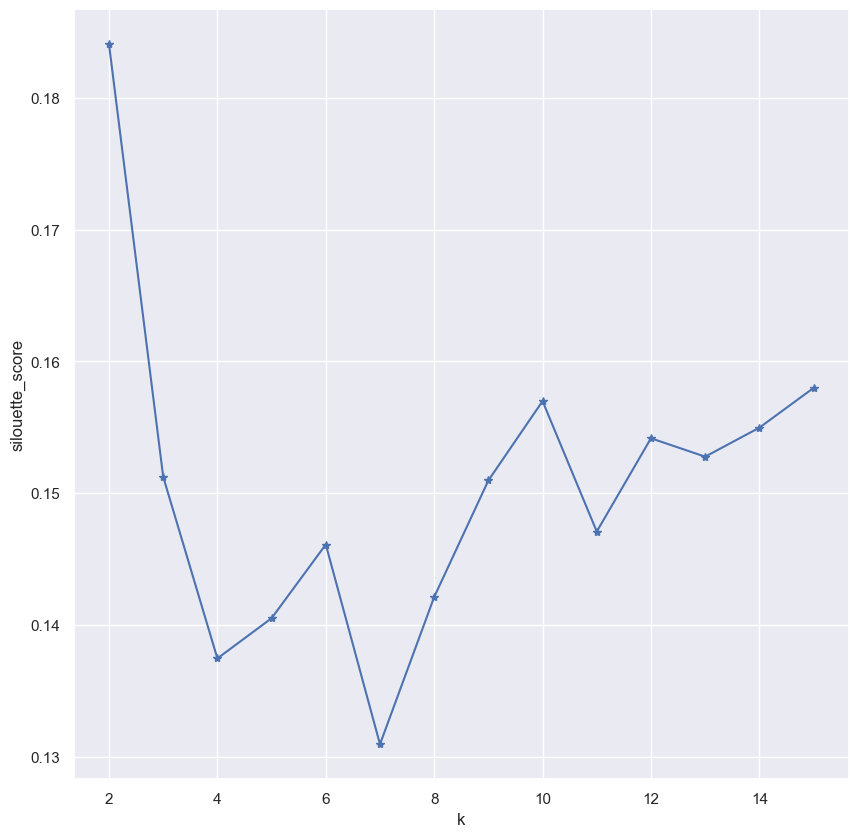

In [1636]:
#determine the number of clusters

#via the silhouette method

%matplotlib inline
from sklearn import metrics
def k_silhouette(X, clusters):
    K=range(2, clusters+1)
    score=[]
    for k in K:
        kmeans=KMeans(n_clusters=k)
        kmeans.fit(X)
        labels=kmeans.labels_
        score.append(metrics.silhouette_score(X, labels, metric='euclidean'))
        
    plt.plot(K, score, 'b*-')
    plt.xlabel('k')
    plt.ylabel('silouette_score')
    
    plt.show();
    
k_silhouette(standardised_m1_all_df, 15) 

In [1637]:
#likely number of clusters (silhouette method): 2

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

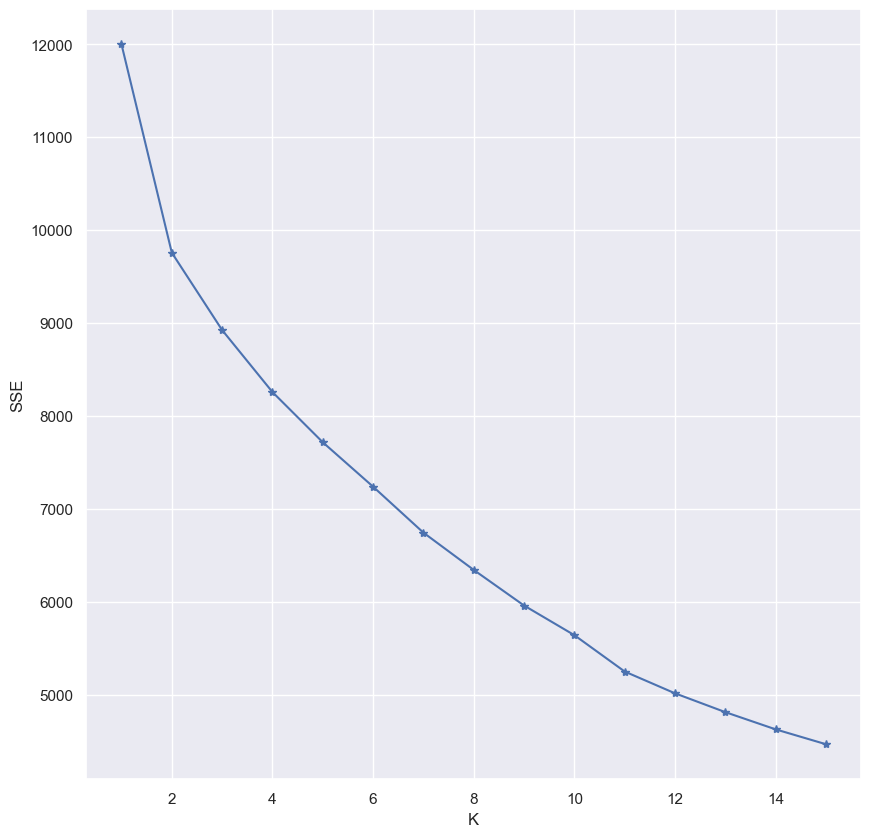

In [1638]:
#via the elbow method

sse=[]
for k in range(1, 16):
    kmeans=KMeans(n_clusters=k,)
    kmeans.fit(standardised_m1_all_df)
    sse.append(kmeans.inertia_)
x=range(1, 16)
plt.xlabel('K')
plt.ylabel('SSE')
plt.plot(x, sse, 'b*-')
plt.show()

In [1639]:
#likely number of clusters (elbow method): inconclusive
#potential reasons include: (1) the data are not well-clustered, (2) the data are noisy, (3) the data have a complex structure

In [1640]:
#cluster the data (build the model) - assuming 2 clusters

kmeans=KMeans(n_clusters=2)
kmeans.fit(standardised_m1_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=2)

In [1641]:
#assign each data point to a cluster

y_km=kmeans.fit_predict(standardised_m1_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [1642]:
#review the cluster assignment for the 1st 20 data points

print(y_km[0:20])

[1 1 1 1 1 0 0 0 0 1 1 0 0 0 1 1 0 0 1 1]


In [1643]:
print(m1_all[y_km==0][0:10])

            T1          V1          A1          P1          B1    m1_cost
5    99.497250  216.679251  263.216775   17.935721  119.421314  92.843437
6   125.824560  306.429457  282.042714   19.963581  131.234779  93.387880
7    85.407327  279.346684  164.164788   15.279495  152.359977  93.254593
8   125.972699  283.317137  278.639493   43.441650  156.373373  93.623059
11  151.455777  185.958735   42.624546  132.029193  128.830715  92.651959
12  111.281753  202.426943  251.402696   25.127667  154.431940  93.190730
13   60.470250  152.356970  290.574569   39.711797  123.127866  92.702526
16  128.181598  258.534635  213.387664   18.728479  120.425720  92.733175
17  131.819964  278.211167  274.165981   23.566338   99.290164  92.963957
20   88.423046  215.285497  240.299147   51.947271  132.834790  93.089592


In [1644]:
print(m1_all[y_km==1][0:10])

            T1          V1          A1         P1          B1    m1_cost
0    78.940130  115.086999  232.867174  22.610159  133.624956  92.524040
1   279.123695  106.896424  143.837072  15.394145  108.505666  91.863553
2    90.800408  163.802623  167.744116  51.453506  123.931713  92.546588
3    72.221316  295.436651   68.756056  17.536468   80.242899  92.021783
4    42.302119  150.416225  668.046834  31.921874   79.462521  92.089066
9    92.932649  154.896270   77.376983  84.232132  148.230564  92.487732
10   54.535169  217.501642  196.145333   8.969451  127.478479  92.481568
14  135.049787  116.674597   18.037838  15.064967  127.093586  92.181378
15   46.690769  128.969274  239.873372  60.695600  115.798005  92.283502
18  105.193739  300.868955  126.963836  15.017726   88.124446  92.326303


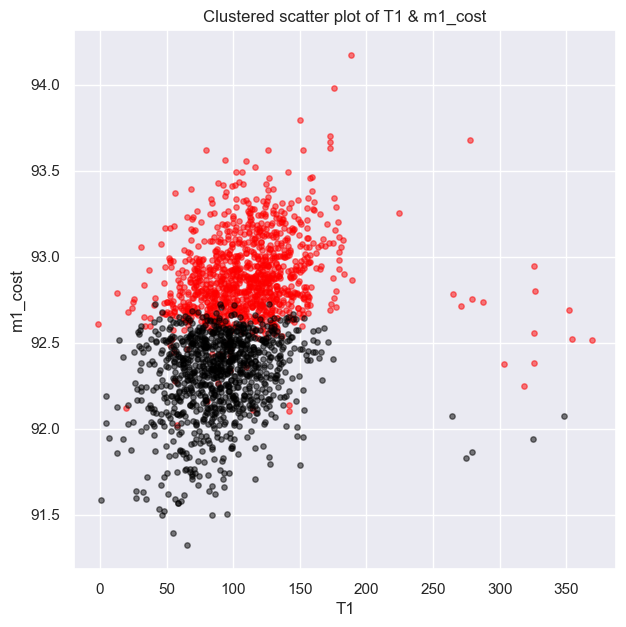

In [1645]:
#first, plot 'T1' vs 'm1_cost'

plt.figure(figsize=(7,7))
plt.xlabel('T1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of T1 & m1_cost')
plt.scatter(m1_all[y_km==0]['T1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['T1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

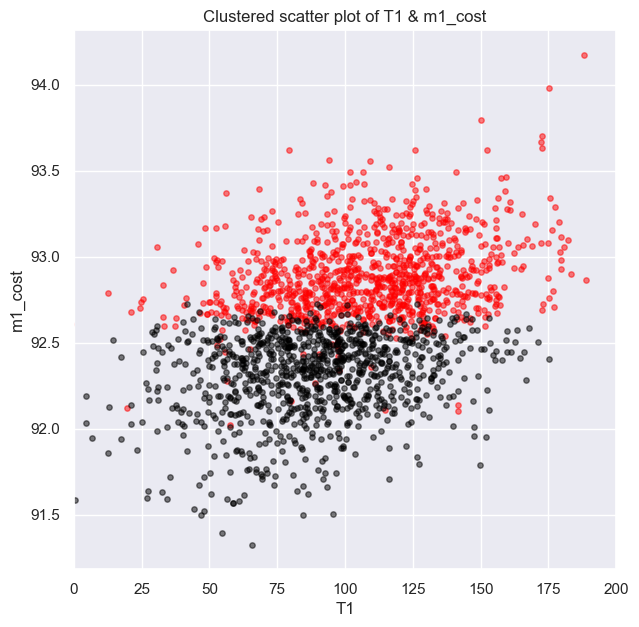

In [1646]:
#separating the data points at T1=200
#truncate the x-axis at 200

plt.figure(figsize=(7,7))
plt.xlabel('T1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of T1 & m1_cost')
plt.xlim(None, 200)
plt.scatter(m1_all[y_km==0]['T1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['T1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m1_cost=approx 92.5

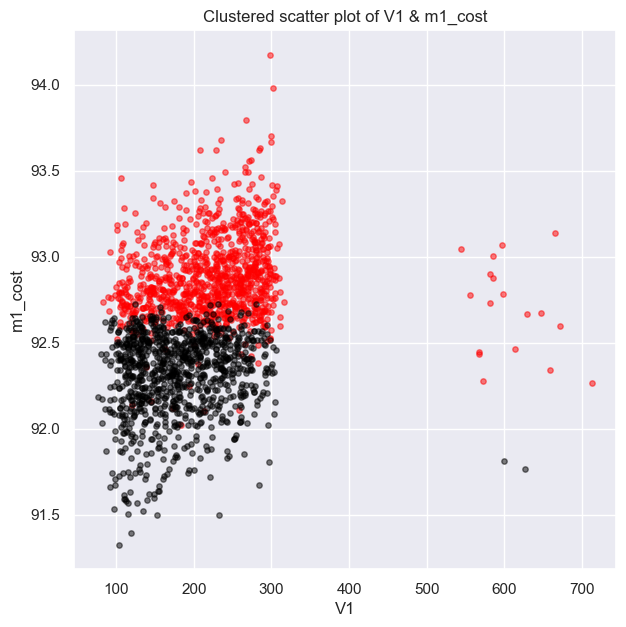

In [1647]:
#next, plot 'V1' vs 'm1_cost'

plt.figure(figsize=(7,7))
plt.xlabel('V1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of V1 & m1_cost')
plt.scatter(m1_all[y_km==0]['V1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['V1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

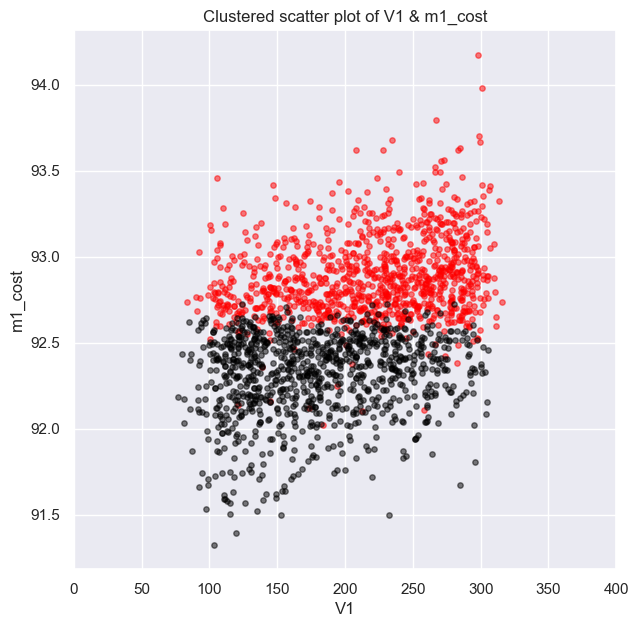

In [1648]:
#separating the data points at V1=400
#truncate the x-axis at 400

plt.figure(figsize=(7,7))
plt.xlabel('V1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of V1 & m1_cost')
plt.xlim(None, 400)
plt.scatter(m1_all[y_km==0]['V1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['V1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m1_cost=approx 92.5

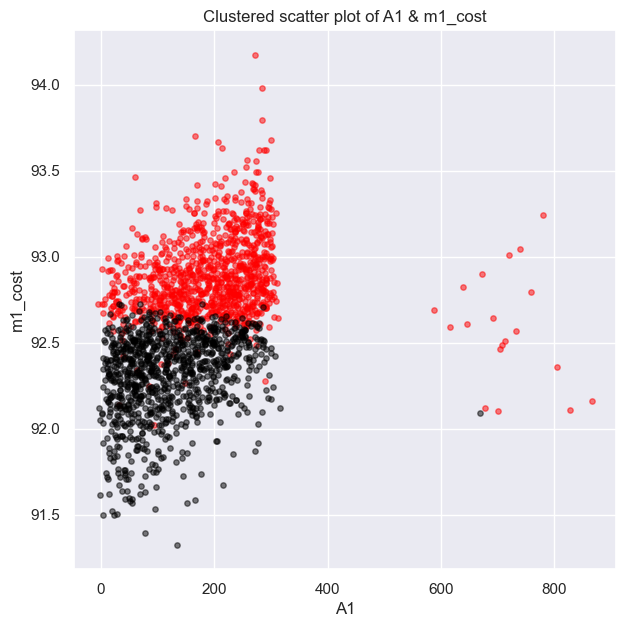

In [1649]:
#next, plot 'A1' vs 'm1_cost'

plt.figure(figsize=(7,7))
plt.xlabel('A1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of A1 & m1_cost')
plt.scatter(m1_all[y_km==0]['A1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['A1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

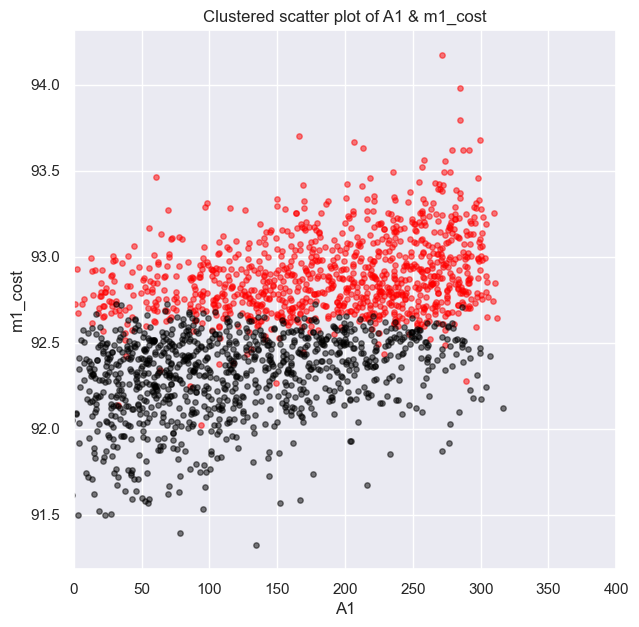

In [1650]:
#separating the data points at A1=400
#truncate the x-axis at 400

plt.figure(figsize=(7,7))
plt.xlabel('A1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of A1 & m1_cost')
plt.xlim(None, 400)
plt.scatter(m1_all[y_km==0]['A1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['A1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m1_cost=approx 92.5

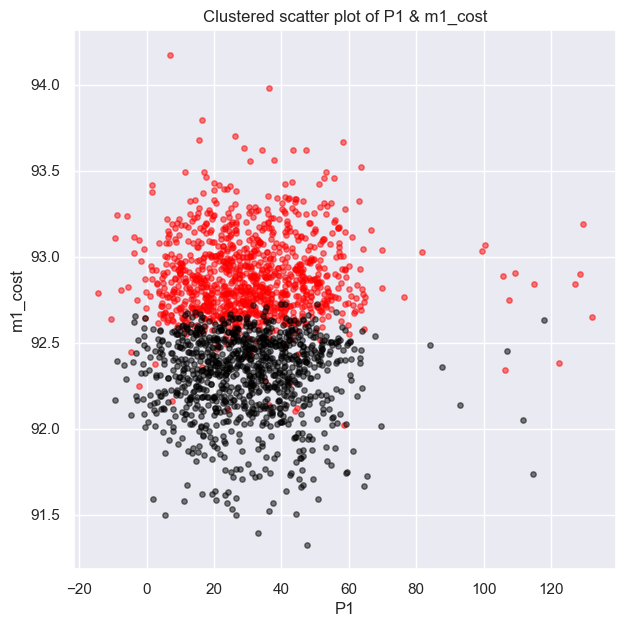

In [1651]:
#next, plot 'P1' vs 'm1_cost'

plt.figure(figsize=(7,7))
plt.xlabel('P1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of P1 & m1_cost')
plt.scatter(m1_all[y_km==0]['P1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['P1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

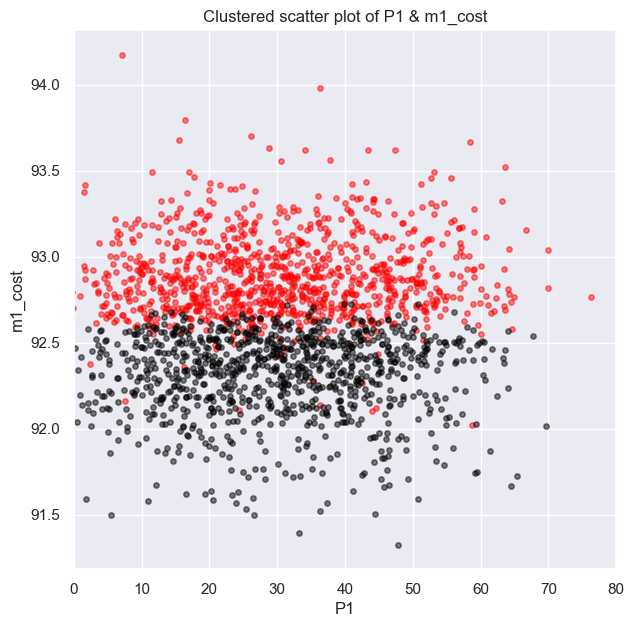

In [1652]:
#separating the data points at P1=80
#truncate the x-axis at 80

plt.figure(figsize=(7,7))
plt.xlabel('P1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of P1 & m1_cost')
plt.xlim(None, 80)
plt.scatter(m1_all[y_km==0]['P1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['P1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m1_cost=approx 92.5

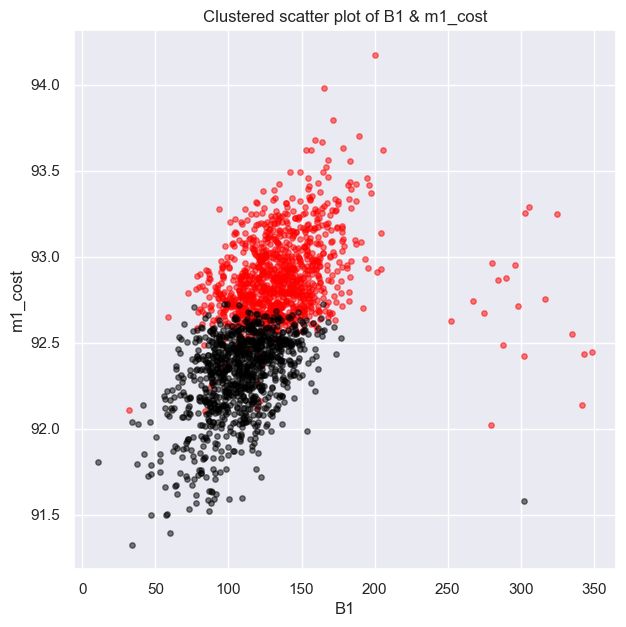

In [1653]:
#next, plot 'B1' vs 'm1_cost'

plt.figure(figsize=(7,7))
plt.xlabel('B1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of B1 & m1_cost')
plt.scatter(m1_all[y_km==0]['B1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['B1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

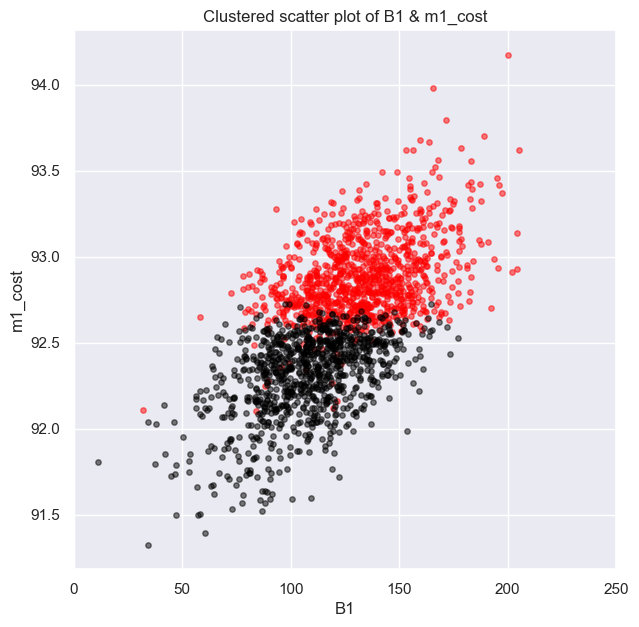

In [1654]:
#separating the data points at B1=250
#truncate the x-axis at 250

plt.figure(figsize=(7,7))
plt.xlabel('B1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of B1 & m1_cost')
plt.xlim(None, 250)
plt.scatter(m1_all[y_km==0]['B1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['B1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m1_cost=approx 92.5

In [1655]:
#what if we tried 4 clusters?

In [1656]:
#cluster the data (build the model) - assuming 4 clusters

kmeans=KMeans(n_clusters=4)
kmeans.fit(standardised_m1_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=4)

In [1657]:
#assign each data point to a cluster

y_km=kmeans.fit_predict(standardised_m1_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [1658]:
#review the cluster assignment for the 1st 20 data points

print(y_km[0:20])

[1 3 0 2 0 1 3 1 3 0 1 0 1 0 2 0 3 3 2 0]


In [1659]:
print(m1_all[y_km==0][0:10])

            T1          V1          A1          P1          B1    m1_cost
2    90.800408  163.802623  167.744116   51.453506  123.931713  92.546588
4    42.302119  150.416225  668.046834   31.921874   79.462521  92.089066
9    92.932649  154.896270   77.376983   84.232132  148.230564  92.487732
11  151.455777  185.958735   42.624546  132.029193  128.830715  92.651959
13   60.470250  152.356970  290.574569   39.711797  123.127866  92.702526
15   46.690769  128.969274  239.873372   60.695600  115.798005  92.283502
19   86.283241  196.443810  182.568205   36.099756  110.044017  92.502126
20   88.423046  215.285497  240.299147   51.947271  132.834790  93.089592
26  112.431464   96.993267  199.128969   29.605423  120.095375  92.612347
44  107.138455  130.836280  286.246873   45.476503   95.047315  92.493018


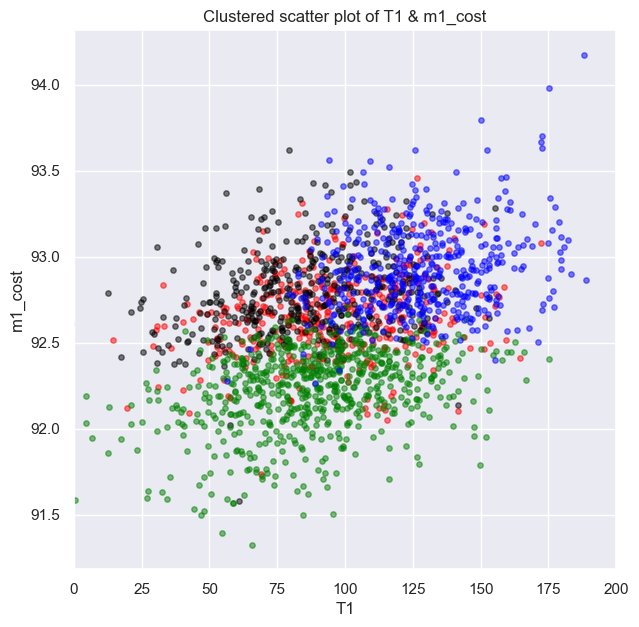

In [1660]:
#first, plot 'T1' vs 'm1_cost'

#separating the data points at T1=200
#truncate the x-axis at 200

plt.figure(figsize=(7,7))
plt.xlabel('T1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of T1 & m1_cost')
plt.xlim(None, 200)
plt.scatter(m1_all[y_km==0]['T1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['T1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)
plt.scatter(m1_all[y_km==2]['T1'], m1_all[y_km==2]['m1_cost'], s=15, c='green', alpha=0.5)
plt.scatter(m1_all[y_km==3]['T1'], m1_all[y_km==3]['m1_cost'], s=15, c='blue', alpha=0.5)

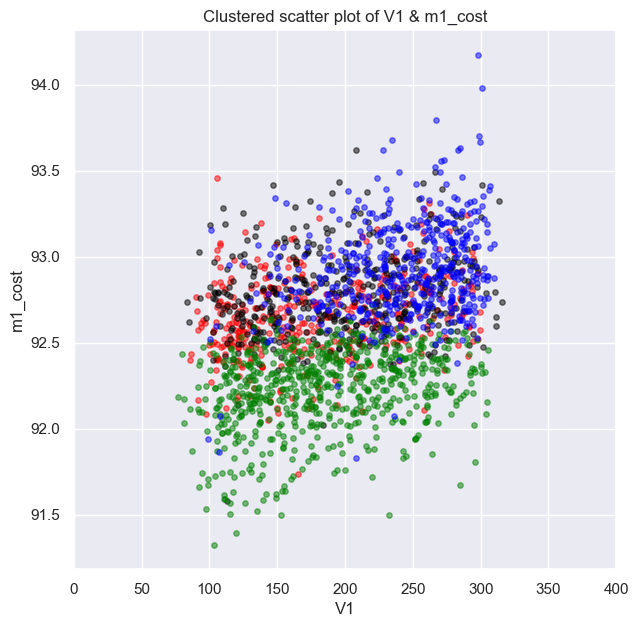

In [1661]:
#next, plot 'V1' vs 'm1_cost'

#separating the data points at V1=400
#truncate the x-axis at 400

plt.figure(figsize=(7,7))
plt.xlabel('V1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of V1 & m1_cost')
plt.xlim(None, 400)
plt.scatter(m1_all[y_km==0]['V1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['V1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)
plt.scatter(m1_all[y_km==2]['V1'], m1_all[y_km==2]['m1_cost'], s=15, c='green', alpha=0.5)
plt.scatter(m1_all[y_km==3]['V1'], m1_all[y_km==3]['m1_cost'], s=15, c='blue', alpha=0.5)

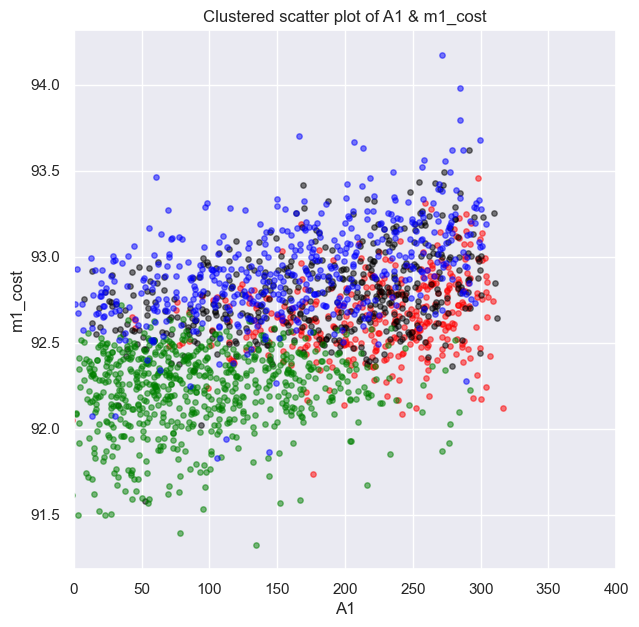

In [1662]:
#next, plot 'A1' vs 'm1_cost'

#separating the data points at A1=400
#truncate the x-axis at 400

plt.figure(figsize=(7,7))
plt.xlabel('A1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of A1 & m1_cost')
plt.xlim(None, 400)
plt.scatter(m1_all[y_km==0]['A1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['A1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)
plt.scatter(m1_all[y_km==2]['A1'], m1_all[y_km==2]['m1_cost'], s=15, c='green', alpha=0.5)
plt.scatter(m1_all[y_km==3]['A1'], m1_all[y_km==3]['m1_cost'], s=15, c='blue', alpha=0.5)

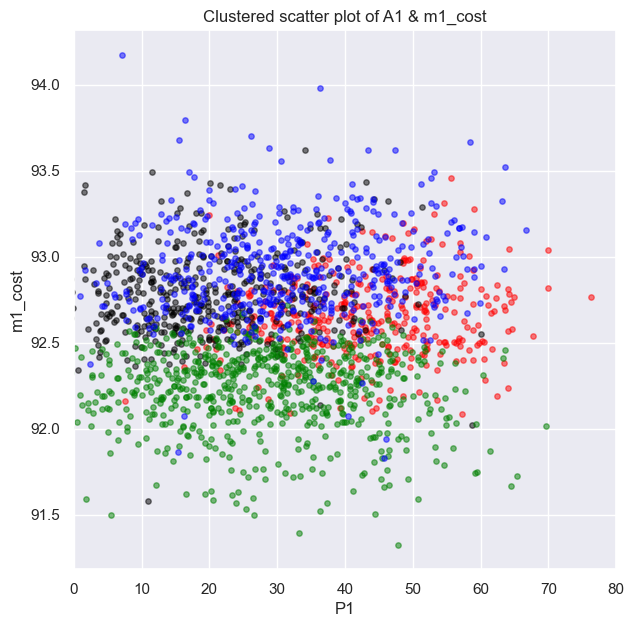

In [1663]:
#next, plot 'P1' vs 'm1_cost'

#separating the data points at P1=80
#truncate the x-axis at 400

plt.figure(figsize=(7,7))
plt.xlabel('P1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of A1 & m1_cost')
plt.xlim(None, 80)
plt.scatter(m1_all[y_km==0]['P1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['P1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)
plt.scatter(m1_all[y_km==2]['P1'], m1_all[y_km==2]['m1_cost'], s=15, c='green', alpha=0.5)
plt.scatter(m1_all[y_km==3]['P1'], m1_all[y_km==3]['m1_cost'], s=15, c='blue', alpha=0.5)

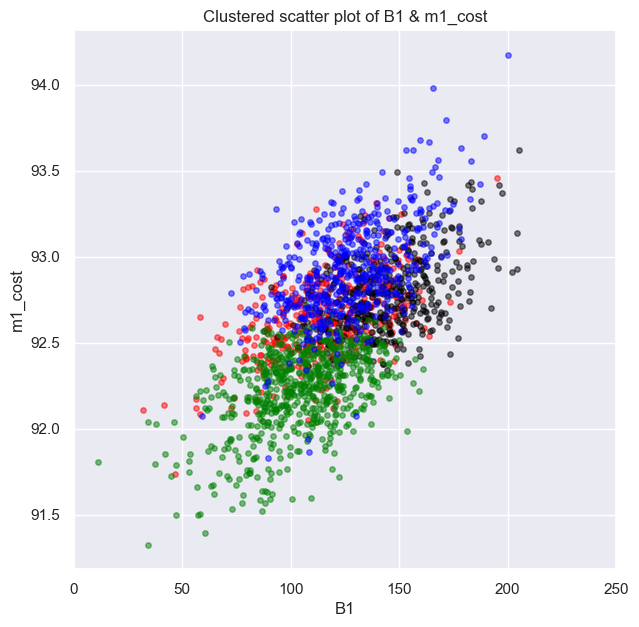

In [1664]:
#next, plot 'B1' vs 'm1_cost'

#separating the data points at B1=250
#truncate the x-axis at 250

plt.figure(figsize=(7,7))
plt.xlabel('B1')
plt.ylabel('m1_cost')
plt.title('Clustered scatter plot of B1 & m1_cost')
plt.xlim(None, 250)
plt.scatter(m1_all[y_km==0]['B1'], m1_all[y_km==0]['m1_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m1_all[y_km==1]['B1'], m1_all[y_km==1]['m1_cost'], s=15, c='black', alpha=0.5)
plt.scatter(m1_all[y_km==2]['B1'], m1_all[y_km==2]['m1_cost'], s=15, c='green', alpha=0.5)
plt.scatter(m1_all[y_km==3]['B1'], m1_all[y_km==3]['m1_cost'], s=15, c='blue', alpha=0.5)

# Note: using 4 clusters does NOT appear to yield any additional insight into the clustering of the M1 input variables & m1_cost (there appears to be a divide at m1_cost=approx 92.5)

# M2

In [1665]:
#retrieve the M2 input variables & m2_cost data again

m2_all=merged_df[['T2', 'V2', 'A2', 'P2', 'B2', 'm2_cost']]

#scale them into a standard set

standardised_m2_all=preprocessing.scale(m2_all)
standardised_m2_all_df=pd.DataFrame(standardised_m2_all, columns=m2_all.columns)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

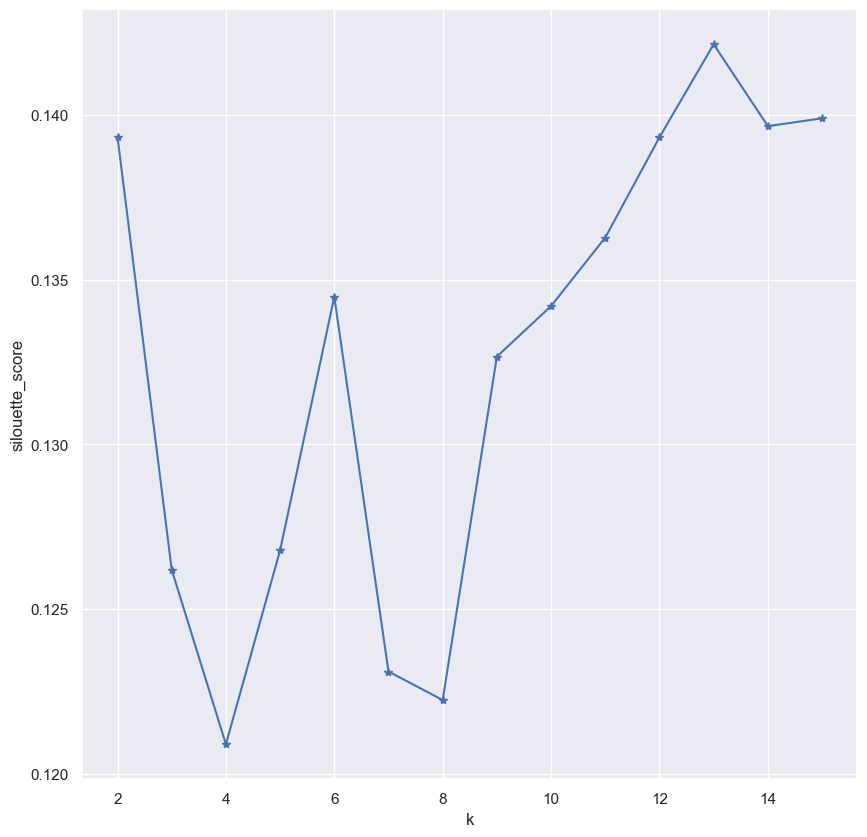

In [1666]:
#determine the number of clusters

#via the silhouette method
#use the previously defined k_silhouete function
    
k_silhouette(standardised_m2_all_df, 15) 

In [1667]:
#likely number of clusters (silhouette method): 2 or 14

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

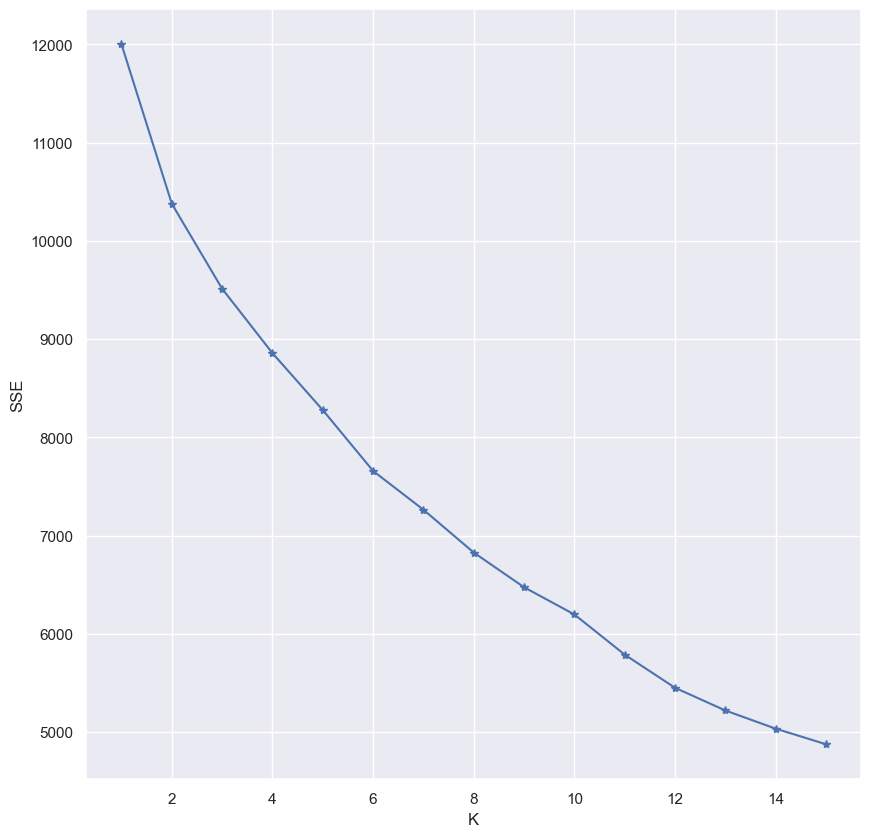

In [1668]:
#via the elbow method

sse=[]
for k in range(1, 16):
    kmeans=KMeans(n_clusters=k,)
    kmeans.fit(standardised_m2_all_df)
    sse.append(kmeans.inertia_)
x=range(1, 16)
plt.xlabel('K')
plt.ylabel('SSE')
plt.plot(x, sse, 'b*-')
plt.show()

In [1669]:
#likely number of clusters (elbow method): inconclusive (as in the case of M1)

In [1670]:
#cluster the data (build the model) - assuming 2 clusters

kmeans=KMeans(n_clusters=2)
kmeans.fit(standardised_m2_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=2)

In [1671]:
#assign each data point to a cluster

y_km=kmeans.fit_predict(standardised_m2_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [1672]:
#review the cluster assignment for the 1st 20 data points

print(y_km[0:20])

[1 0 0 0 0 0 1 1 0 1 0 0 1 1 1 1 0 1 0 0]


In [1673]:
print(m2_all[y_km==0][0:10])

            T2          V2          A2          P2          B2     m2_cost
1   571.603120  468.268042  177.169161   73.582653  256.794293  100.981891
2   541.071181  487.986805   33.832191   82.867949  263.355556  102.117686
3   510.012513  427.478352  283.932571   90.980745  279.062032  101.824887
4   524.771696  317.944358  409.512248   71.396122  293.195537  101.803140
5   559.177849  308.082723  276.311048  121.856265  247.542239  102.164501
8   503.658279  413.867884  406.002926   72.688118  388.726135  101.816778
10  473.883517  433.730592  330.870361  104.737241  274.412210  102.284677
11  564.816041  377.488120  219.653476   78.697206  299.414725  101.432231
16  554.071457  269.741851  127.101125   76.913844  272.519216  103.123589
18  487.594108  371.090289  325.472217   87.106949  297.410744  102.121631


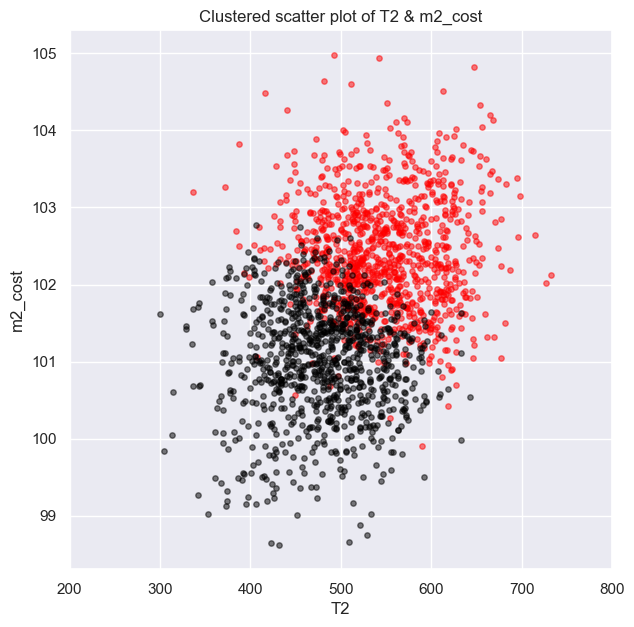

In [1674]:
#first, plot 'T2' vs 'm2_cost'

#separating the data points at T2=800
#truncate the x-axis at 800

plt.figure(figsize=(7,7))
plt.xlabel('T2')
plt.ylabel('m2_cost')
plt.title('Clustered scatter plot of T2 & m2_cost')
plt.xlim(200, 800)
plt.scatter(m2_all[y_km==0]['T2'], m2_all[y_km==0]['m2_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m2_all[y_km==1]['T2'], m2_all[y_km==1]['m2_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m2_cost=approx 101.5

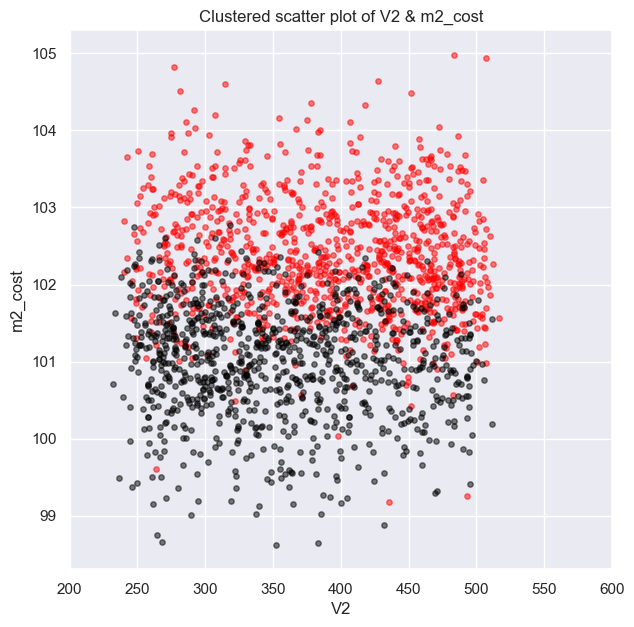

In [1675]:
#next, plot 'V2' vs 'm2_cost'

#separating the data points at V2=600
#truncate the x-axis at 600

plt.figure(figsize=(7,7))
plt.xlabel('V2')
plt.ylabel('m2_cost')
plt.title('Clustered scatter plot of V2 & m2_cost')
plt.xlim(200, 600)
plt.scatter(m2_all[y_km==0]['V2'], m2_all[y_km==0]['m2_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m2_all[y_km==1]['V2'], m2_all[y_km==1]['m2_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m2_cost=approx 101.5

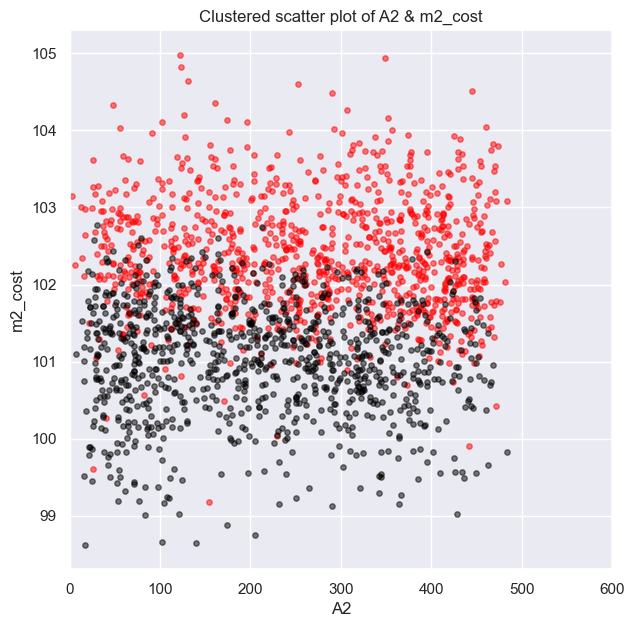

In [1676]:
#next, plot 'A2' vs 'm2_cost'

#separating the data points at A2=600
#truncate the x-axis at 600

plt.figure(figsize=(7,7))
plt.xlabel('A2')
plt.ylabel('m2_cost')
plt.title('Clustered scatter plot of A2 & m2_cost')
plt.xlim(None, 600)
plt.scatter(m2_all[y_km==0]['A2'], m2_all[y_km==0]['m2_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m2_all[y_km==1]['A2'], m2_all[y_km==1]['m2_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m2_cost=approx 101.5

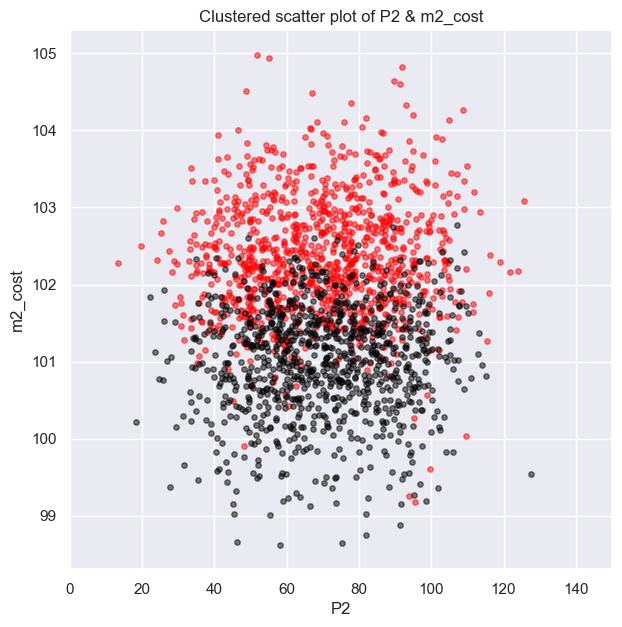

In [1677]:
#next, plot 'P2' vs 'm2_cost'

#separating the data points at P2=150
#truncate the x-axis at 150

plt.figure(figsize=(7,7))
plt.xlabel('P2')
plt.ylabel('m2_cost')
plt.title('Clustered scatter plot of P2 & m2_cost')
plt.xlim(None, 150)
plt.scatter(m2_all[y_km==0]['P2'], m2_all[y_km==0]['m2_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m2_all[y_km==1]['P2'], m2_all[y_km==1]['m2_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m2_cost=approx 101.5

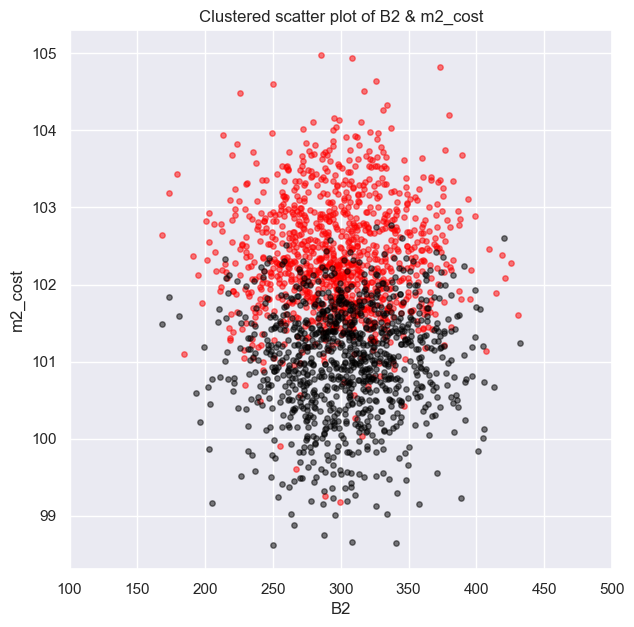

In [1678]:
#next, plot 'B2' vs 'm2_cost'

#separating the data points at B2=500
#truncate the x-axis at 500

plt.figure(figsize=(7,7))
plt.xlabel('B2')
plt.ylabel('m2_cost')
plt.title('Clustered scatter plot of B2 & m2_cost')
plt.xlim(100, 500)
plt.scatter(m2_all[y_km==0]['B2'], m2_all[y_km==0]['m2_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m2_all[y_km==1]['B2'], m2_all[y_km==1]['m2_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m2_cost=approx 101.5

# Note: we will skip using 4 (or 3, 4, 5, 6...) clusters as they did NOT appear to yield any additional insight for the M1 input variables & m1_cost

# M3

In [1679]:
#retrieve the M3 input variables & m3_cost data again

m3_all=merged_df[['T3', 'V3', 'A3', 'P3', 'B3', 'm3_cost']]

#scale them into a standard set

standardised_m3_all=preprocessing.scale(m3_all)
standardised_m3_all_df=pd.DataFrame(standardised_m3_all, columns=m3_all.columns)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

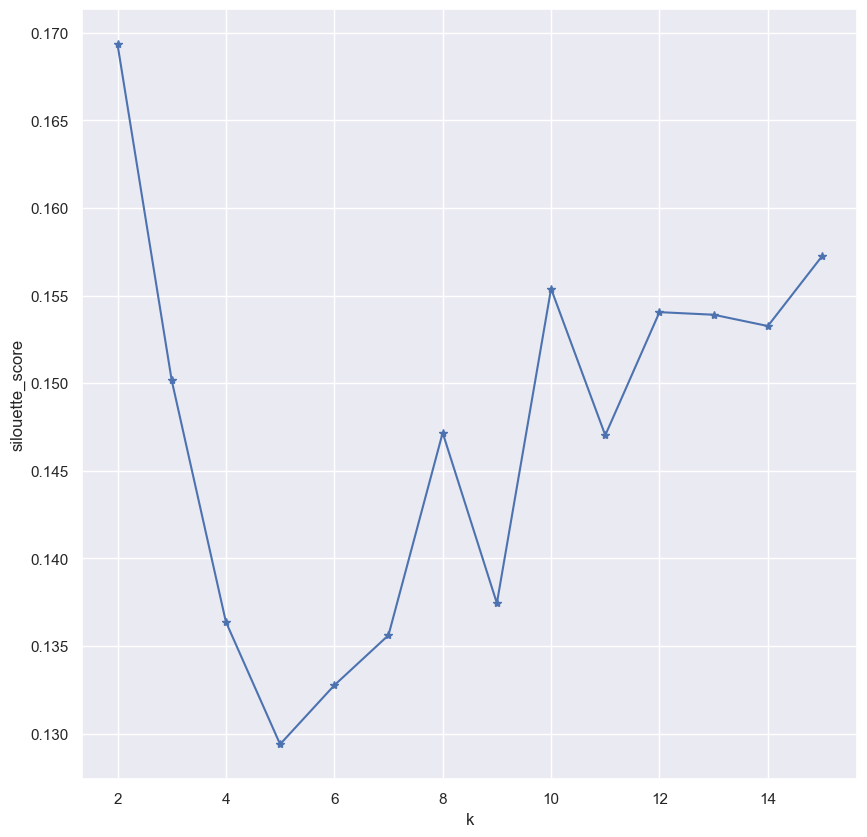

In [1680]:
#determine the number of clusters

#via the silhouette method
#use the previously defined k_silhouete function
    
k_silhouette(standardised_m3_all_df, 15) 

In [1681]:
#likely number of clusters (silhouette method): 2

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

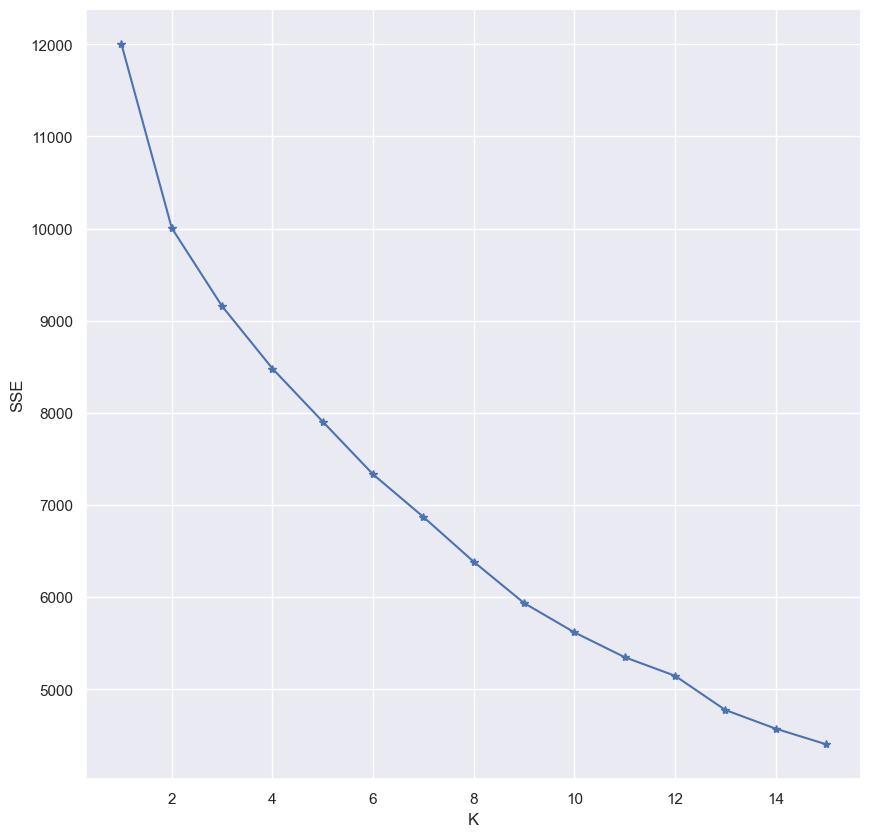

In [1682]:
#via the elbow method

sse=[]
for k in range(1, 16):
    kmeans=KMeans(n_clusters=k,)
    kmeans.fit(standardised_m3_all_df)
    sse.append(kmeans.inertia_)
x=range(1, 16)
plt.xlabel('K')
plt.ylabel('SSE')
plt.plot(x, sse, 'b*-')
plt.show()

In [1683]:
#likely number of clusters (elbow method): inconclusive (as in the cases of M1/M2)

In [1684]:
#cluster the data (build the model) - assuming 2 clusters

kmeans=KMeans(n_clusters=2)
kmeans.fit(standardised_m3_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=2)

In [1685]:
#assign each data point to a cluster

y_km=kmeans.fit_predict(standardised_m3_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [1686]:
#review the cluster assignment for the 1st 20 data points

print(y_km[0:20])

[1 0 0 0 0 0 0 1 0 1 1 1 0 0 1 1 1 0 1 0]


In [1687]:
print(m3_all[y_km==0][0:10])

            T3          V3          A3          P3          B3    m3_cost
1   380.188927  513.624609  558.017404   69.462037  706.734324  95.987919
2   425.703618  485.482764  328.635820   66.799137  856.761784  95.739381
3   418.222734  358.063722  304.190547   43.574608  827.188272  95.772697
4   315.103209  415.277967  350.989988  164.284333  798.754006  95.605800
5   404.889145  450.068219  248.182043  202.999744  858.130694  95.750306
6   361.924021  524.117804  573.137792  113.276497  632.874614  96.261539
8   361.364919  376.450597  188.688036   51.921770  822.632746  96.309988
12  352.244764  550.860287  505.207246  256.665230  893.630506  95.853175
13  373.215136  393.135830  244.237627  117.455549  723.095951  96.215013
17  426.026559  435.674043  281.314687   92.135335  890.532550  95.796184


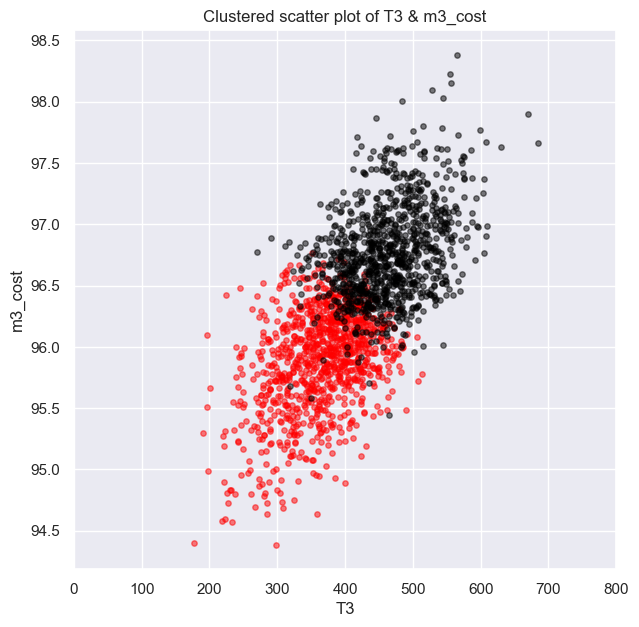

In [1688]:
#first, plot 'T3' vs 'm3_cost'

#separating the data points at T3=800
#truncate the x-axis at 800

plt.figure(figsize=(7,7))
plt.xlabel('T3')
plt.ylabel('m3_cost')
plt.title('Clustered scatter plot of T3 & m3_cost')
plt.xlim(None, 800)
plt.scatter(m3_all[y_km==0]['T3'], m3_all[y_km==0]['m3_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m3_all[y_km==1]['T3'], m3_all[y_km==1]['m3_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m3_cost=approx 96.5

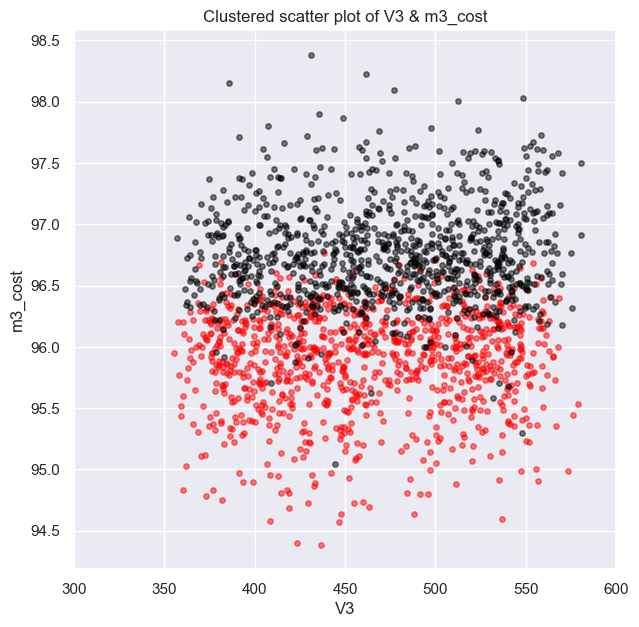

In [1689]:
#next, plot 'V3' vs 'm3_cost'

#separating the data points at V3=600
#truncate the x-axis at 600

plt.figure(figsize=(7,7))
plt.xlabel('V3')
plt.ylabel('m3_cost')
plt.title('Clustered scatter plot of V3 & m3_cost')
plt.xlim(300, 600)
plt.scatter(m3_all[y_km==0]['V3'], m3_all[y_km==0]['m3_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m3_all[y_km==1]['V3'], m3_all[y_km==1]['m3_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m3_cost=approx 96.5

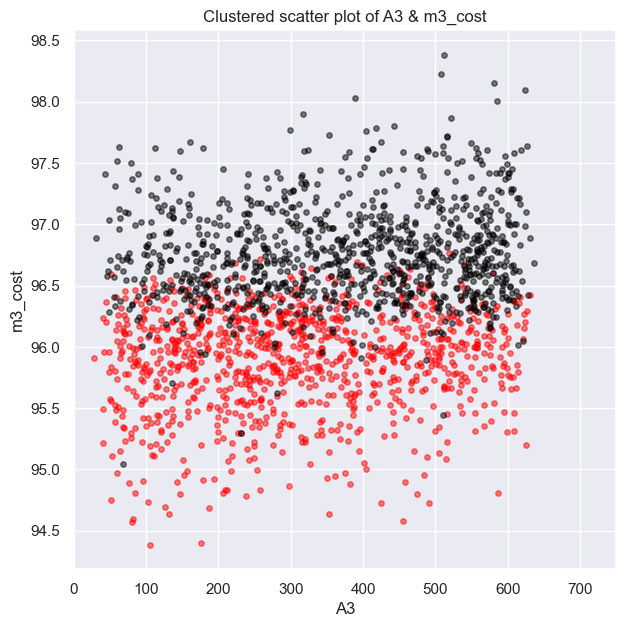

In [1690]:
#next, plot 'A3' vs 'm3_cost'

#separating the data points at A3=750
#truncate the x-axis at 750

plt.figure(figsize=(7,7))
plt.xlabel('A3')
plt.ylabel('m3_cost')
plt.title('Clustered scatter plot of A3 & m3_cost')
plt.xlim(None, 750)
plt.scatter(m3_all[y_km==0]['A3'], m3_all[y_km==0]['m3_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m3_all[y_km==1]['A3'], m3_all[y_km==1]['m3_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m3_cost=approx 96.5

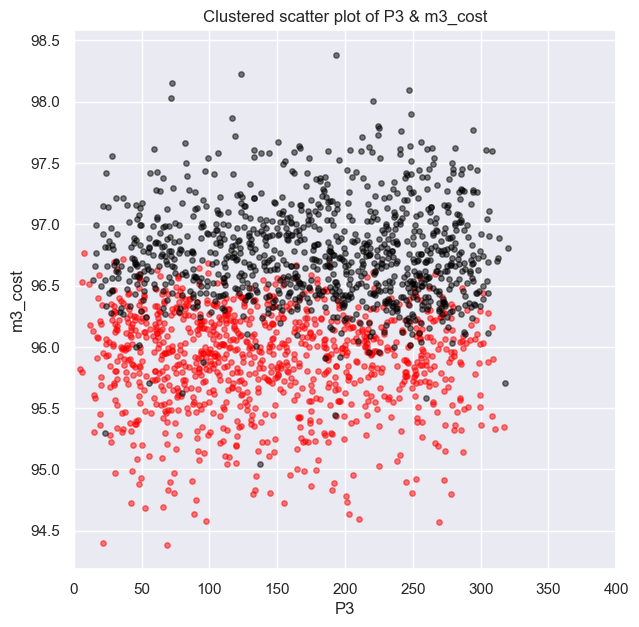

In [1691]:
#next, plot 'P3' vs 'm3_cost'

#separating the data points at P3=400
#truncate the x-axis at 400

plt.figure(figsize=(7,7))
plt.xlabel('P3')
plt.ylabel('m3_cost')
plt.title('Clustered scatter plot of P3 & m3_cost')
plt.xlim(None, 400)
plt.scatter(m3_all[y_km==0]['P3'], m3_all[y_km==0]['m3_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m3_all[y_km==1]['P3'], m3_all[y_km==1]['m3_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m3_cost=approx 96.5

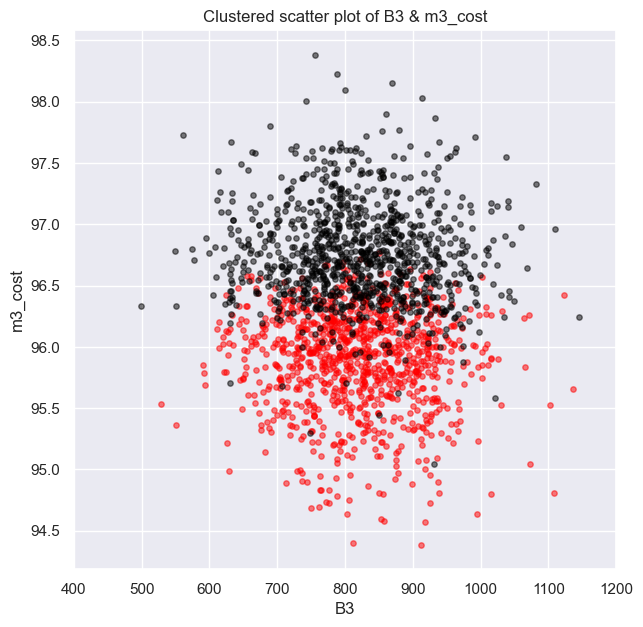

In [1692]:
#next, plot 'B3' vs 'm3_cost'

#separating the data points at B3=1200
#truncate the x-axis at 1200

plt.figure(figsize=(7,7))
plt.xlabel('B3')
plt.ylabel('m3_cost')
plt.title('Clustered scatter plot of B3 & m3_cost')
plt.xlim(400, 1200)
plt.scatter(m3_all[y_km==0]['B3'], m3_all[y_km==0]['m3_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m3_all[y_km==1]['B3'], m3_all[y_km==1]['m3_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m3_cost=approx 96.5

# Note: we will skip using 4 (or 3, 4, 5, 6...) clusters as they did NOT appear to yield any additional insight for the M1 input variables & m1_cost

# M4

In [1693]:
#retrieve the M4 input variables & m4_cost data again

m4_all=merged_df[['T4', 'V4', 'A4', 'P4', 'B4', 'm4_cost']]

#scale them into a standard set

standardised_m4_all=preprocessing.scale(m4_all)
standardised_m4_all_df=pd.DataFrame(standardised_m4_all, columns=m4_all.columns)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

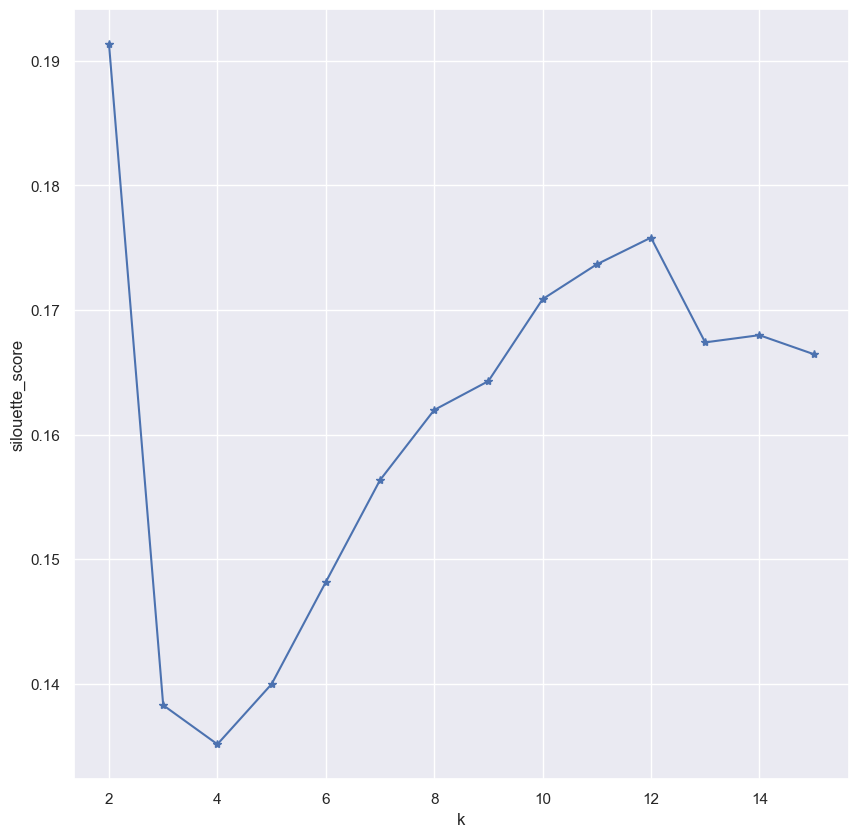

In [1694]:
#determine the number of clusters

#via the silhouette method
#use the previously defined k_silhouete function
    
k_silhouette(standardised_m4_all_df, 15) 

In [1695]:
#likely number of clusters (silhouette method): 2

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_

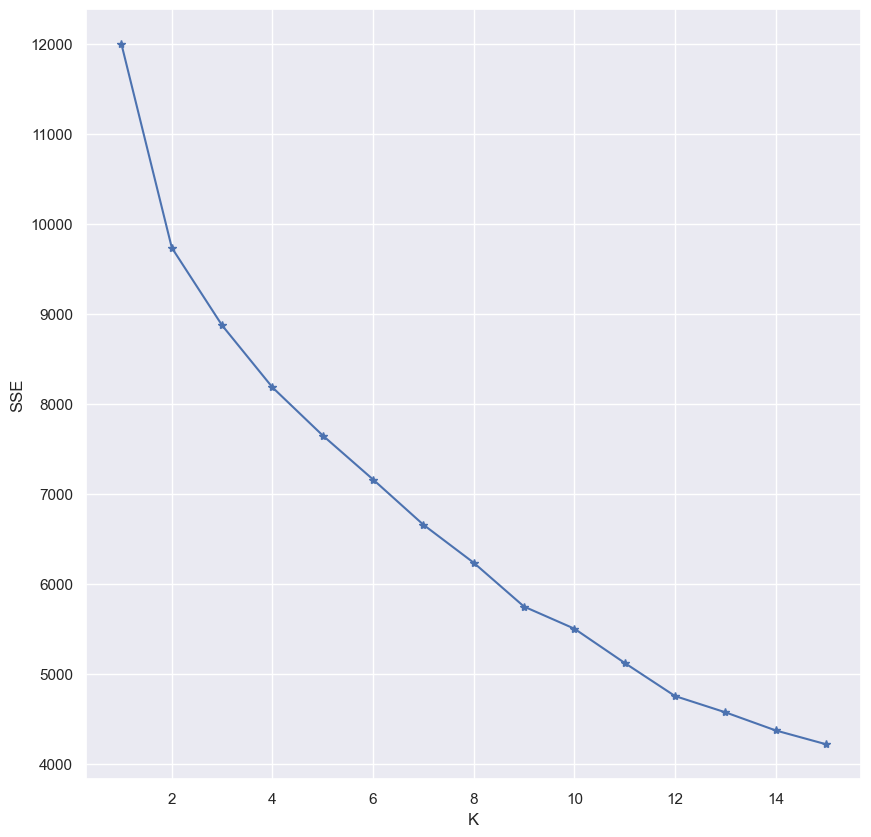

In [1696]:
#via the elbow method

sse=[]
for k in range(1, 16):
    kmeans=KMeans(n_clusters=k,)
    kmeans.fit(standardised_m4_all_df)
    sse.append(kmeans.inertia_)
x=range(1, 16)
plt.xlabel('K')
plt.ylabel('SSE')
plt.plot(x, sse, 'b*-')
plt.show()

In [1697]:
#likely number of clusters (elbow method): inconclusive (as in the cases of M1/M2/M3)

In [1698]:
#cluster the data (build the model) - assuming 2 clusters

kmeans=KMeans(n_clusters=2)
kmeans.fit(standardised_m4_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


KMeans(n_clusters=2)

In [1699]:
#assign each data point to a cluster

y_km=kmeans.fit_predict(standardised_m4_all_df)

/Users/tomyoritaka/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [1700]:
#review the cluster assignment for the 1st 20 data points

print(y_km[0:20])

[1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 1 0 1 0 0]


In [1701]:
print(m4_all[y_km==0][0:10])

            T4          V4          A4          P4          B4    m4_cost
4   433.649555  451.510521  875.067767  282.225705  336.567299  97.486197
6   407.129522  490.025144  809.559778  211.666955  313.766878  96.919370
10  349.594472  539.668964  790.610152  482.040299  352.342595  97.417886
12  378.441662  527.513072  215.261239  422.256899  344.683229  96.775989
14  451.029376  563.464176  129.701190  262.785261  356.217308  96.937967
16  379.432928  299.949123  648.603516  322.080394  350.638801  96.772976
18  349.850078  329.685751  577.066935  451.498910  334.882335  96.747050
19  404.294281  541.883139  331.942094  114.347479  363.933242  96.855035
21  300.325843  415.667183  747.978459  332.159008  337.804209  96.729284
24  342.604868  391.957075  393.176879  476.636862  369.778163  97.199660


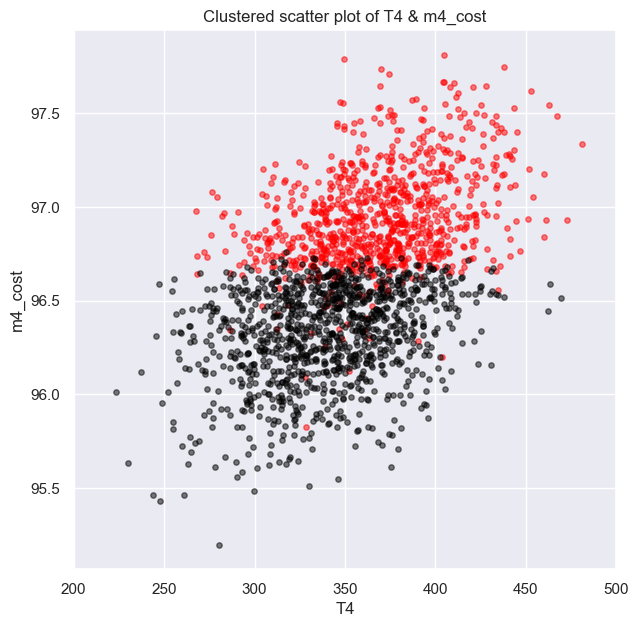

In [1702]:
#first, plot 'T4' vs 'm4_cost'

#separating the data points at T4=500
#truncate the x-axis at 500

plt.figure(figsize=(7,7))
plt.xlabel('T4')
plt.ylabel('m4_cost')
plt.title('Clustered scatter plot of T4 & m4_cost')
plt.xlim(200, 500)
plt.scatter(m4_all[y_km==0]['T4'], m4_all[y_km==0]['m4_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m4_all[y_km==1]['T4'], m4_all[y_km==1]['m4_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m4_cost=approx 96.75

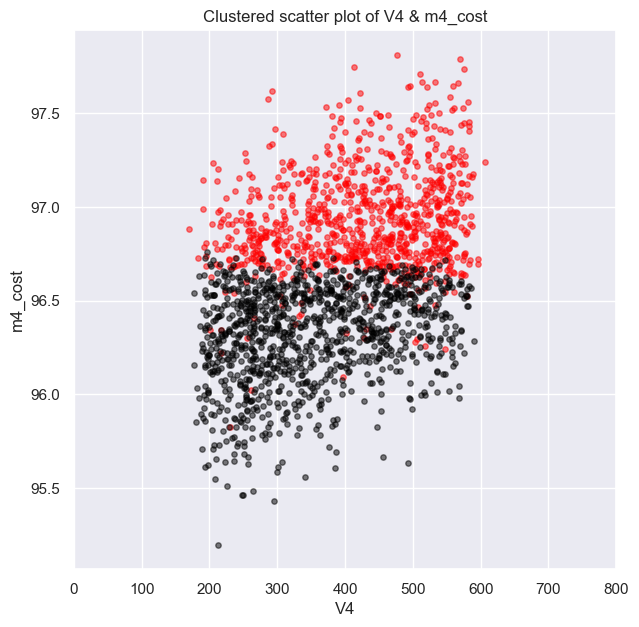

In [1703]:
#next, plot 'V4' vs 'm4_cost'

#separating the data points at V4=800
#truncate the x-axis at 800

plt.figure(figsize=(7,7))
plt.xlabel('V4')
plt.ylabel('m4_cost')
plt.title('Clustered scatter plot of V4 & m4_cost')
plt.xlim(None, 800)
plt.scatter(m4_all[y_km==0]['V4'], m4_all[y_km==0]['m4_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m4_all[y_km==1]['V4'], m4_all[y_km==1]['m4_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m4_cost=approx 96.75

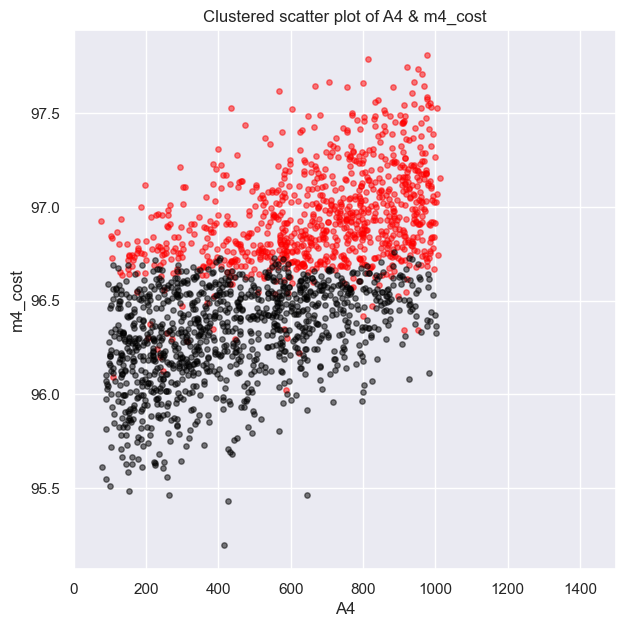

In [1704]:
#next, plot 'A4' vs 'm4_cost'

#separating the data points at A4=1500
#truncate the x-axis at 1500

plt.figure(figsize=(7,7))
plt.xlabel('A4')
plt.ylabel('m4_cost')
plt.title('Clustered scatter plot of A4 & m4_cost')
plt.xlim(None, 1500)
plt.scatter(m4_all[y_km==0]['A4'], m4_all[y_km==0]['m4_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m4_all[y_km==1]['A4'], m4_all[y_km==1]['m4_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m4_cost=approx 96.75

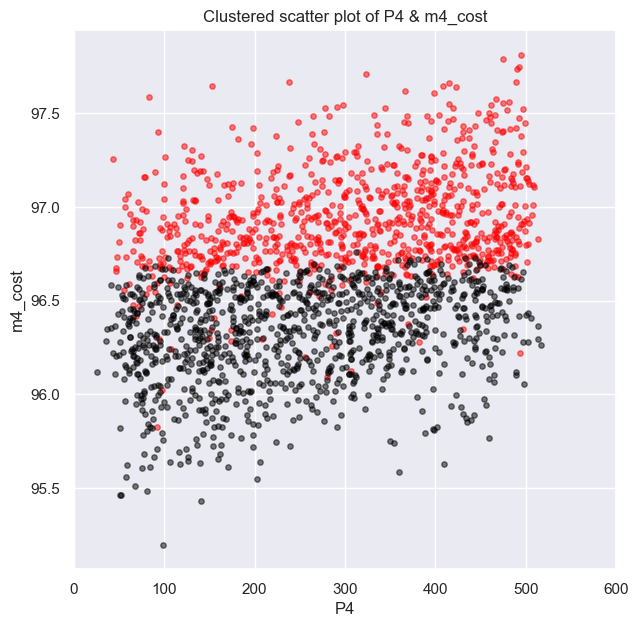

In [1705]:
#next, plot 'P4' vs 'm4_cost'

#separating the data points at P4=600
#truncate the x-axis at 600

plt.figure(figsize=(7,7))
plt.xlabel('P4')
plt.ylabel('m4_cost')
plt.title('Clustered scatter plot of P4 & m4_cost')
plt.xlim(None, 600)
plt.scatter(m4_all[y_km==0]['P4'], m4_all[y_km==0]['m4_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m4_all[y_km==1]['P4'], m4_all[y_km==1]['m4_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m4_cost=approx 96.75

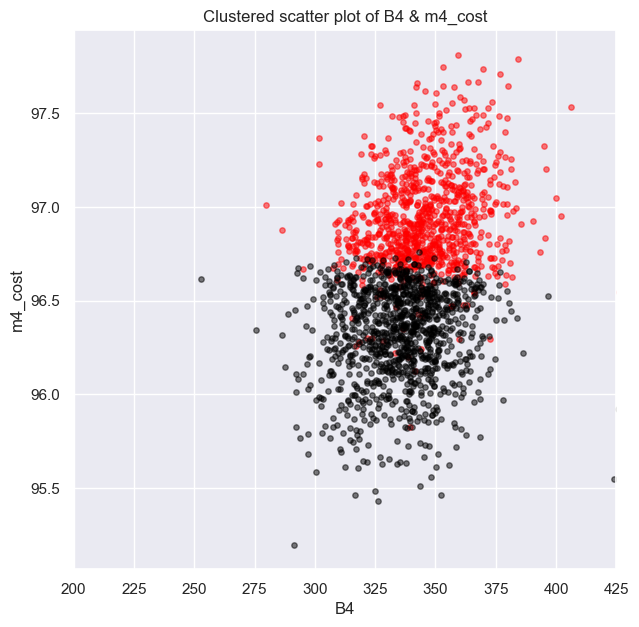

In [1706]:
#next, plot 'B4' vs 'm4_cost'

#separating the data points at B4=425
#truncate the x-axis at 425

plt.figure(figsize=(7,7))
plt.xlabel('B4')
plt.ylabel('m4_cost')
plt.title('Clustered scatter plot of B4 & m4_cost')
plt.xlim(200, 425)
plt.scatter(m4_all[y_km==0]['B4'], m4_all[y_km==0]['m4_cost'], s=15, c='red', alpha=0.5)
plt.scatter(m4_all[y_km==1]['B4'], m4_all[y_km==1]['m4_cost'], s=15, c='black', alpha=0.5)

# Note: there appears to be a divide between the 2 clusters at m4_cost=approx 96.75

# Note: we will skip using 4 (or 3, 4, 5, 6...) clusters as they did NOT appear to yield any additional insight for the M1 input variables & m1_cost

# Summary
- The M1 input variables, the M2 input variables, the M3 input variables & the M4 input variables each appear to have 2 clusters, divided by a particular level of the cost variable (m1_cost, m2_cost, m3_cost, m4_cost)
- It is unclear what separates the 2 clusters of M1, M2, M3 or M4; therefore, it is unclear how the clusters could be used to tease out stronger correlations and/or identify lower-cost data points

# M1
- The silhouette method indicates 2 potential clusters for the M1 input variables & m1_cost
- K-means clustering indicates there appears to be a divide in the dataset between the 2 clusters at (approx) m1_cost=92.5 (indicated by the behaviour of m1_cost against each of the M1 input variables)
- Using 4 clusters does NOT appear to yield any additional insight into the clustering of the M1 input variables & m1_cost

# M2
- The silhouette method indicates 2 potential clusters for the M2 input variables & m2_cost
- K-means clustering indicates there appears to be a divide in the dataset between the 2 clusters at (approx) m2_cost=101.5 (indicated by the behaviour of m2_cost against each of the M2 input variables)

# M3
- The silhouette method indicates 2 potential clusters for the M3 input variables & m3_cost
- K-means clustering indicates there appears to be a divide in the dataset between the 2 clusters at (approx) m3_cost=96.5 (indicated by the behaviour of m3_cost against each of the M3 input variables)

# M4
- The silhouette method indicates 2 potential clusters for the M4 input variables & m4_cost
- K-means clustering indicates there appears to be a divide in the dataset between the 2 clusters at (approx) m4_cost=96.75 (indicated by the behaviour of m4_cost against each of the M4 input variables)

# 3.4 Gaussian Mixture Models: m1_cost, m2_cost, m3_cost, m4_cost

# M1

Having had limited success in improving our understanding of the behaviours of the cost variables with clustering, we next turn our attention to Gaussian Mixture Models in the hope of identifying more than 1 sub-distribution of m1_cost, m2_cost, m3_cost and/or m4_cost.

For each of our Gaussian Mixture Models, we move through the following steps:

1. Assume the number of sub-distributions; for our analysis, we assume 2 sub-distributions given the results of our initial scatter plots & the subsequent clustering analyses
2. Apply a Gaussian Mixture Model to the cost data & derive the estimated means/other related statistics
3. Compare the 2 sub-distributions in a histogram as well as the 2 means – and determine if 2 sub-distributions exist for each cost variable

In [1707]:
#retrieve the M1 input variables & m1_cost data once again

m1_all=merged_df[['T1', 'V1', 'A1', 'P1', 'B1', 'm1_cost']]
m1_all['m1_cost']

0       92.524040
1       91.863553
2       92.546588
3       92.021783
4       92.089066
          ...    
1995    93.380881
1996    92.242557
1997    92.555595
1998    92.925032
1999    93.271349
Name: m1_cost, Length: 2000, dtype: float64

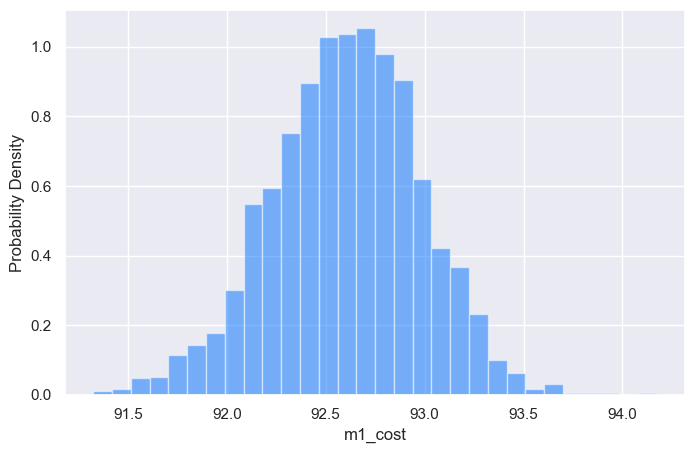

In [1708]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m1_all['m1_cost'], bins=30, density=True, alpha=0.5, color='#0070FF')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m1_cost')

plt.show()

In [1709]:
#the distribution of m1_cost does NOT appear to have more than 1 Gaussian distribution
#however, we will apply a Gaussian Mixture Model with an assumption of 2 sub-distributions

In [1710]:
m1_cost=m1_all[['m1_cost']]
m1_cost

,m1_cost
0,92.524040
1,91.863553
2,92.546588
3,92.021783
4,92.089066
...,...
1995,93.380881
1996,92.242557
1997,92.555595
1998,92.925032


In [1711]:
#import the Gaussian library
from sklearn.mixture import GaussianMixture

In [1712]:
gmm=GaussianMixture(n_components=2, covariance_type='full', tol=0.001)
gmm=gmm.fit(X=m1_cost)

In [1713]:
print(gmm.means_)

[[92.36478206]
 [92.81329296]]


In [1714]:
print(np.sqrt(gmm.covariances_))

[[[0.31528521]]

 [[0.29238587]]]


In [1715]:
print(gmm.weights_)

[0.47165147 0.52834853]


In [1716]:
mean_1=gmm.means_[0].item()
mean_2=gmm.means_[1].item()

sd_1=np.sqrt(gmm.covariances_[0]).item()
sd_2=np.sqrt(gmm.covariances_[1]).item()

totalPopulation=2000
weight_1=int(totalPopulation*gmm.weights_[0].item())
weight_2=int(totalPopulation*gmm.weights_[1].item())

In [1717]:
samples=np.random.normal(mean_1, sd_1, weight_1)
samples2=np.random.normal(mean_2, sd_2, weight_2)
combined_samples=np.append(samples, samples2)

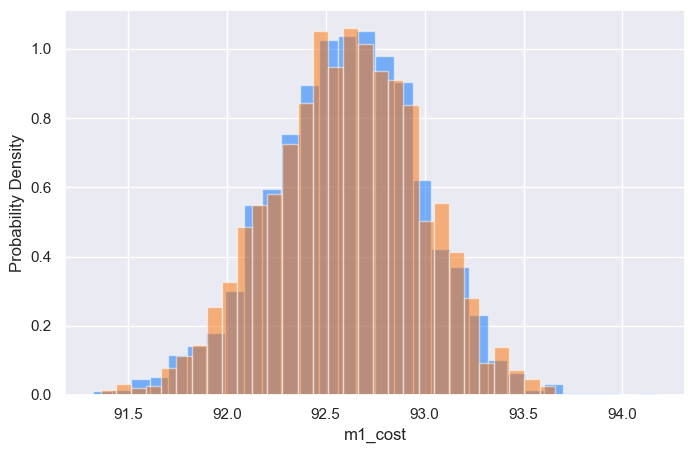

In [1718]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m1_cost, bins=30, density=True, alpha=0.5, color='#0070FF')
ax.hist(combined_samples, bins=30, density=True, alpha=0.5, color='#ff7000')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m1_cost')

plt.show()

# Note: m1_cost does NOT appear to have 2 (or more) Gaussian sub-distributions (the means of the 2 assumed sub-distributions are nearly identical)

# M2

In [1719]:
#retrieve the M2 input variables & m2_cost data once again

m2_all=merged_df[['T2', 'V2', 'A2', 'P2', 'B2', 'm2_cost']]
m2_all['m2_cost']

0       100.983478
1       100.981891
2       102.117686
3       101.824887
4       101.803140
           ...    
1995    101.678637
1996    100.150388
1997    101.841887
1998    101.449743
1999    102.054245
Name: m2_cost, Length: 2000, dtype: float64

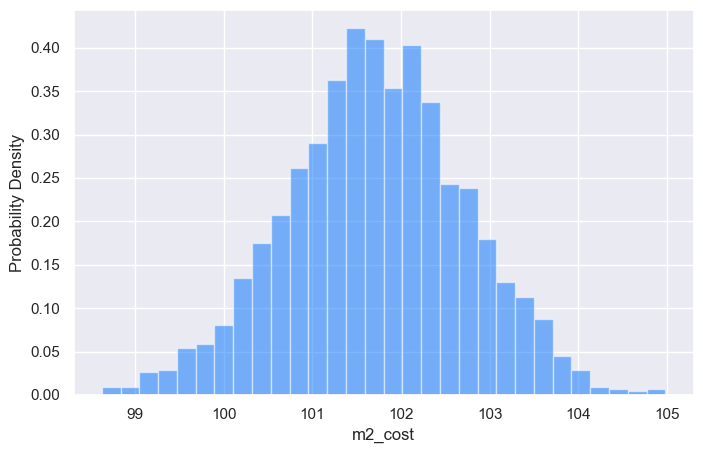

In [1720]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m2_all['m2_cost'], bins=30, density=True, alpha=0.5, color='#0070FF')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m2_cost')

plt.show()

In [1721]:
#the distribution of m2_cost does NOT appear to have more than 1 Gaussian distribution
#however, we will apply a Gaussian Mixture Model with an assumption of 2 sub-distributions

In [1722]:
m2_cost=m2_all[['m2_cost']]
m2_cost

,m2_cost
0,100.983478
1,100.981891
2,102.117686
3,101.824887
4,101.803140
...,...
1995,101.678637
1996,100.150388
1997,101.841887
1998,101.449743


In [1723]:
gmm=GaussianMixture(n_components=2, covariance_type='full', tol=0.001)
gmm=gmm.fit(X=m2_cost)

In [1724]:
print(gmm.means_)

[[102.30183013]
 [101.09552582]]


In [1725]:
print(np.sqrt(gmm.covariances_))

[[[0.79802669]]

 [[0.82043919]]]


In [1726]:
print(gmm.weights_)

[0.51177344 0.48822656]


In [1727]:
mean_1=gmm.means_[0].item()
mean_2=gmm.means_[1].item()

sd_1=np.sqrt(gmm.covariances_[0]).item()
sd_2=np.sqrt(gmm.covariances_[1]).item()

totalPopulation=2000
weight_1=int(totalPopulation*gmm.weights_[0].item())
weight_2=int(totalPopulation*gmm.weights_[1].item())

In [1728]:
samples=np.random.normal(mean_1, sd_1, weight_1)
samples2=np.random.normal(mean_2, sd_2, weight_2)
combined_samples=np.append(samples, samples2)

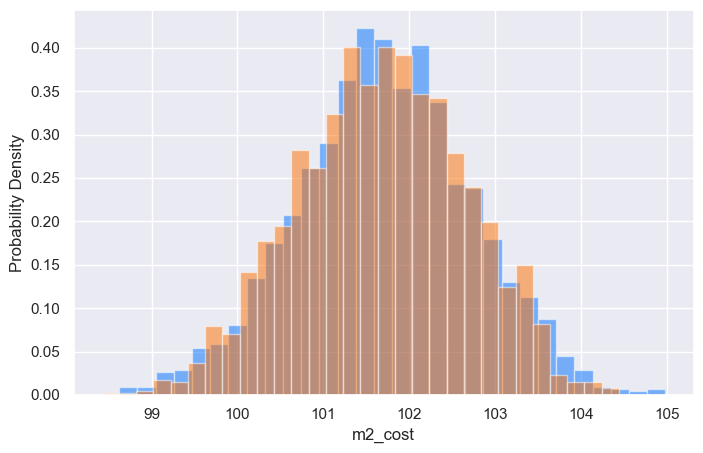

In [1729]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m2_cost, bins=30, density=True, alpha=0.5, color='#0070FF')
ax.hist(combined_samples, bins=30, density=True, alpha=0.5, color='#ff7000')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m2_cost')

plt.show()

# Note: m2_cost does NOT appear to have 2 (or more) Gaussian sub-distributions (the means of the 2 assumed sub-distributions are nearly identical)

# M3

In [1730]:
#retrieve the M3 input variables & m3_cost data once again

m3_all=merged_df[['T3', 'V3', 'A3', 'P3', 'B3', 'm3_cost']]
m3_all['m3_cost']

0       96.334276
1       95.987919
2       95.739381
3       95.772697
4       95.605800
          ...    
1995    96.296075
1996    95.635628
1997    96.722710
1998    97.201140
1999    96.125027
Name: m3_cost, Length: 2000, dtype: float64

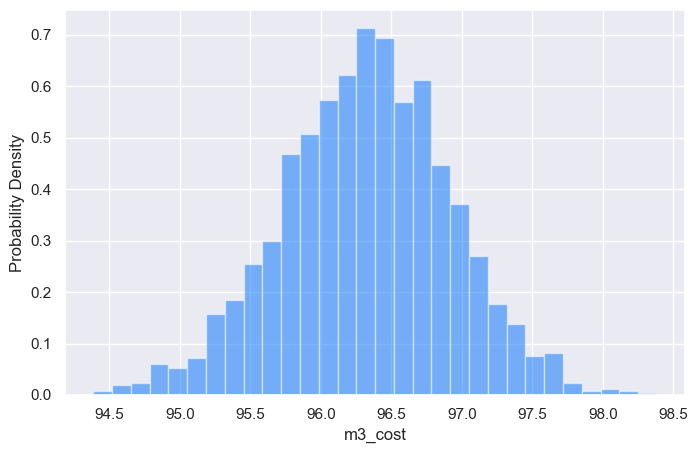

In [1731]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m3_all['m3_cost'], bins=30, density=True, alpha=0.5, color='#0070FF')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m3_cost')

plt.show()

In [1732]:
#the distribution of m3_cost does NOT appear to have more than 1 Gaussian distribution
#however, we will apply a Gaussian Mixture Model with an assumption of 2 sub-distributions

In [1733]:
m3_cost=m3_all[['m3_cost']]
m3_cost

,m3_cost
0,96.334276
1,95.987919
2,95.739381
3,95.772697
4,95.605800
...,...
1995,96.296075
1996,95.635628
1997,96.722710
1998,97.201140


In [1734]:
gmm=GaussianMixture(n_components=2, covariance_type='full', tol=0.001)
gmm=gmm.fit(X=m3_cost)

In [1735]:
print(gmm.means_)

[[96.64060044]
 [95.93254252]]


In [1736]:
print(np.sqrt(gmm.covariances_))

[[[0.47342747]]

 [[0.49627706]]]


In [1737]:
print(gmm.weights_)

[0.55067959 0.44932041]


In [1738]:
mean_1=gmm.means_[0].item()
mean_2=gmm.means_[1].item()

sd_1=np.sqrt(gmm.covariances_[0]).item()
sd_2=np.sqrt(gmm.covariances_[1]).item()

totalPopulation=2000
weight_1=int(totalPopulation*gmm.weights_[0].item())
weight_2=int(totalPopulation*gmm.weights_[1].item())

In [1739]:
samples=np.random.normal(mean_1, sd_1, weight_1)
samples2=np.random.normal(mean_2, sd_2, weight_2)
combined_samples=np.append(samples, samples2)

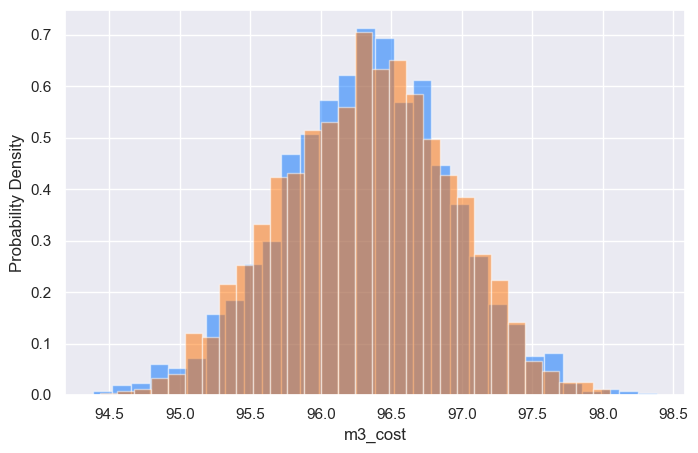

In [1740]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m3_cost, bins=30, density=True, alpha=0.5, color='#0070FF')
ax.hist(combined_samples, bins=30, density=True, alpha=0.5, color='#ff7000')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m3_cost')

plt.show()

# Note: m3_cost does NOT appear to have 2 (or more) Gaussian sub-distributions (the means of the 2 assumed sub-distributions are nearly identical)

# M4

In [1741]:
#retrieve the M4 input variables & m4_cost data once again

m4_all=merged_df[['T4', 'V4', 'A4', 'P4', 'B4', 'm4_cost']]
m4_all['m4_cost']

0       96.586348
1       96.497598
2       96.589076
3       96.260197
4       97.486197
          ...    
1995    96.608627
1996    96.570704
1997    97.303610
1998    97.130055
1999    96.357057
Name: m4_cost, Length: 2000, dtype: float64

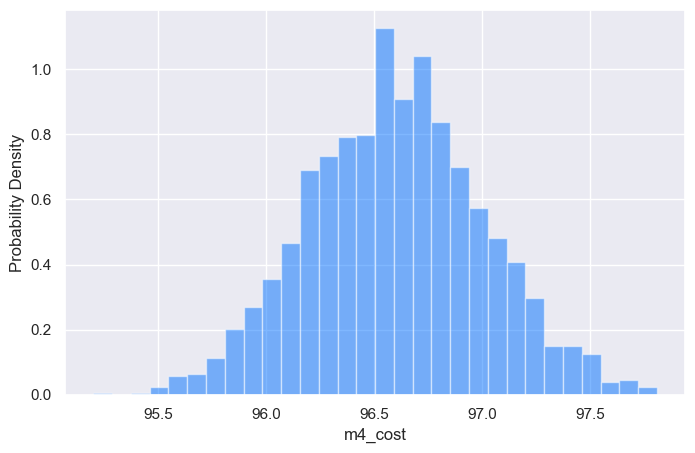

In [1742]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m4_all['m4_cost'], bins=30, density=True, alpha=0.5, color='#0070FF')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m4_cost')

plt.show()

In [1743]:
#the distribution of m4_cost does NOT appear to have more than 1 Gaussian distribution
#however, we will apply a Gaussian Mixture Model with an assumption of 2 sub-distributions

In [1744]:
m4_cost=m4_all[['m4_cost']]
m4_cost

,m4_cost
0,96.586348
1,96.497598
2,96.589076
3,96.260197
4,97.486197
...,...
1995,96.608627
1996,96.570704
1997,97.303610
1998,97.130055


In [1745]:
gmm=GaussianMixture(n_components=2, covariance_type='full', tol=0.001)
gmm=gmm.fit(X=m4_cost)

In [1746]:
print(gmm.means_)

[[96.85397229]
 [96.35371293]]


In [1747]:
print(np.sqrt(gmm.covariances_))

[[[0.32506118]]

 [[0.31619457]]]


In [1748]:
print(gmm.weights_)

[0.49411313 0.50588687]


In [1749]:
mean_1=gmm.means_[0].item()
mean_2=gmm.means_[1].item()

sd_1=np.sqrt(gmm.covariances_[0]).item()
sd_2=np.sqrt(gmm.covariances_[1]).item()

totalPopulation=2000
weight_1=int(totalPopulation*gmm.weights_[0].item())
weight_2=int(totalPopulation*gmm.weights_[1].item())

In [1750]:
samples=np.random.normal(mean_1, sd_1, weight_1)
samples2=np.random.normal(mean_2, sd_2, weight_2)
combined_samples=np.append(samples, samples2)

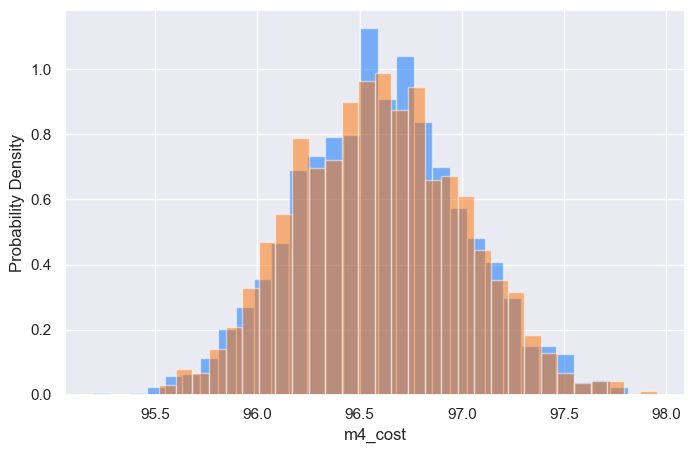

In [1751]:
fig, ax=plt.subplots(nrows=1, ncols=1, figsize=[8,5])
ax.hist(m4_cost, bins=30, density=True, alpha=0.5, color='#0070FF')
ax.hist(combined_samples, bins=30, density=True, alpha=0.5, color='#ff7000')

ax.set_ylabel('Probability Density')
ax.set_xlabel('m4_cost')

plt.show()

# Note: m4_cost does NOT appear to have 2 (or more) Gaussian sub-distributions (the means of the 2 assumed sub-distributions are nearly identical)

# Summary
- None of the M1-M4 cost variables (m1_cost, m2_cost, m3_cost, m4_cost) appears to have more than 1 Gaussian sub-distribution
- The means of the 2 assumed sub-distributions for each cost variable are nearly identical; the visual comparison of the 2 sub-distributions in a histogram each reinforces this

# 3.5 Decision Trees (Supervised ML): conta_d, crys_d, i_diff_d, burn_d

In the final section of our analysis, we apply basic decision trees & Random Forest Classifications to both the defect variables & the cost variables.  We convert the costs into categorical variables by assigning a value of 0 if the cost is in the lowest 25th percentile (otherwise, 1).  We analyse each set of input variables - M1-M4 – vis-à-vis their direct defect or cost variable (for example, the M1 input variables vs conta_d), but not any of the cross-step variables.  The reason for using decision trees & classifications is to potentially bolster our analyses (our ability to filter/reduce the dataset further or more efficiently).

For each decision tree/Random Forrest Classifier analysis, we move through the following steps:

1. Construct a basic decision tree using each set of input variables (M1-M4) & their direct defect or cost variable
2. ‘Prune’ the decision tree by using ‘ccp_alpha=’ to ‘correct’ for potential overfitting
3. Run a Random Forest Classifier using 80:20 split training & test datasets
4. Estimate the predicted defect probability or the probability of the cost being in the lowest 25th percentile for each set of input variables (test dataset)
5. Derive the classification fit using the ‘how often did we get the outcome right’ score as well as the confusion matrix & the following values: Accuracy, Misclassification Rate, False Positive Rate, Precision
6. Compare the performance of the Random Forest Classifier with that of the basic decision tree

We start with the defect variables

In [1752]:
#import additional libraries related to decision trees
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.tree import plot_tree
from sklearn.tree import export_graphviz

# M1

# Basic Decision Trees

In [1753]:
#decision tree using all M1 input variables & conta_d

m1_all=merged_df[['T1', 'V1', 'A1', 'P1', 'B1', 'conta_d']]

x_1=m1_all[['T1', 'V1', 'A1', 'P1', 'B1']]
y_1=m1_all['conta_d']

In [1754]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1755]:
model.fit(x_1, y_1)

DecisionTreeClassifier(max_depth=3, random_state=0)

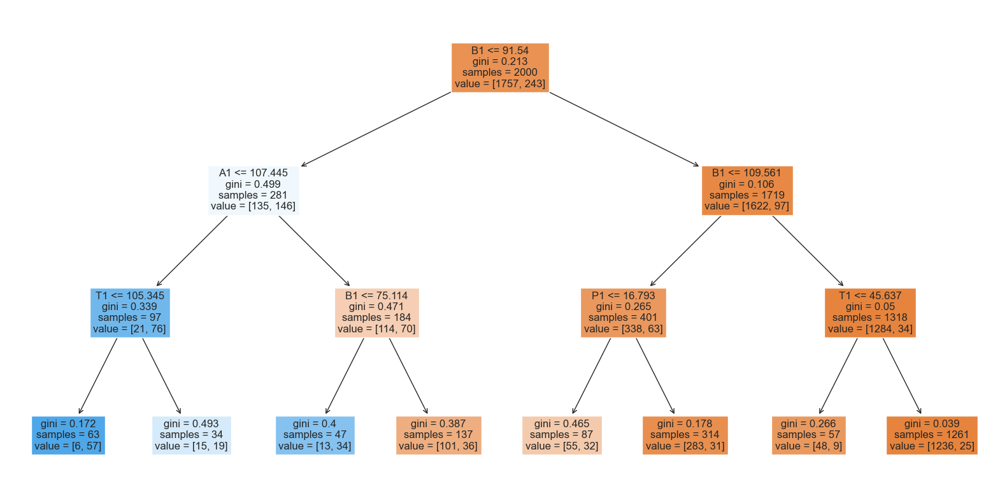

In [1756]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m1_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

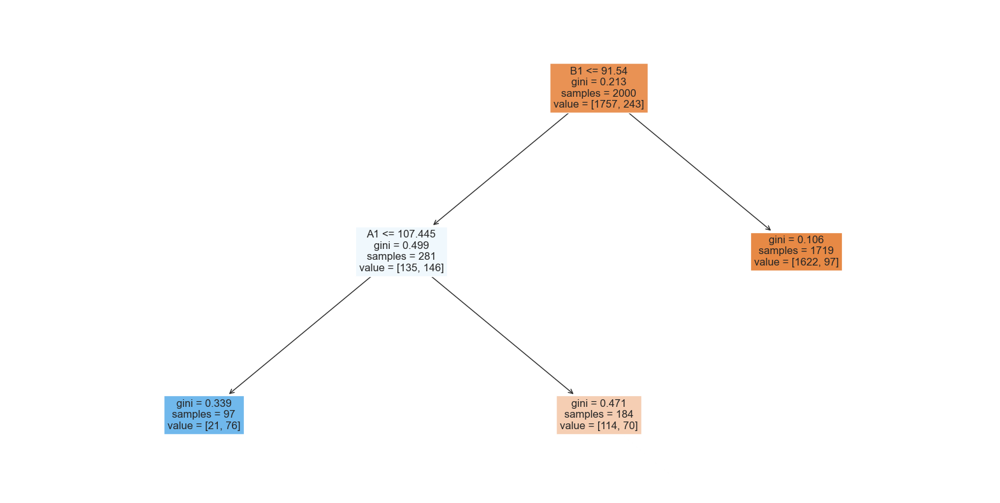

In [1757]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_1, y_1)
export_graphviz(model, out_file='defect_tree.dot', feature_names=x_1.columns, class_names=['Defect','No Defect'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m1_all.columns))
plt.show()

In [1758]:
#the Gini score represents the 'purity' of each node in the decision tree (how well the node has separated the classes/categories); the lower the Gini score is, the purer the node is (the better) 

# Random Forest Classifier

In [1759]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.9325

In [1760]:
predictions=rfc.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1761]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[352   4]
 [ 23  21]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 350, True Positive (1) - 16, False Positive - 5, False Negative - 29

# 'Accuracy' 91.50%=(350+16)/400

# 'Misclassification Rate' 8.50%=(5+29)/400

# 'False Positive Rate' 1.41%=5/(350+5)

# 'Precision' 76.19%=16/(5+16)

In [1762]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[100, 100, 200, 15, 100], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[1. 1. 0.]


In [1763]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.89

In [1764]:
predictions=dtc.predict(x_test)
predictions

array([0., 0., 0., 1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.

In [1765]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[331  25]
 [ 19  25]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 339, True Positive (1) - 17, False Positive - 16, False Negative - 28

# 'Accuracy' 89.00%=(339+17)/400

# 'Misclassification Rate' 11.00%=(16+28)/400

# 'False Positive Rate' 4.51%=16/(339+16)

# 'Precision' 51.52%=17/(16+17)

# Note: the performance of the Random Forrest Classifier appears to be somewhat better than that of the Basic Decision Tree

# M2

# Basic Decision Trees

In [1766]:
#decision tree using all M2 input variables & crys_d

m2_all=merged_df[['T2', 'V2', 'A2', 'P2', 'B2', 'crys_d']]

x_2=m2_all[['T2', 'V2', 'A2', 'P2', 'B2']]
y_2=m2_all['crys_d']

In [1767]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1768]:
model.fit(x_2, y_2)

DecisionTreeClassifier(max_depth=3, random_state=0)

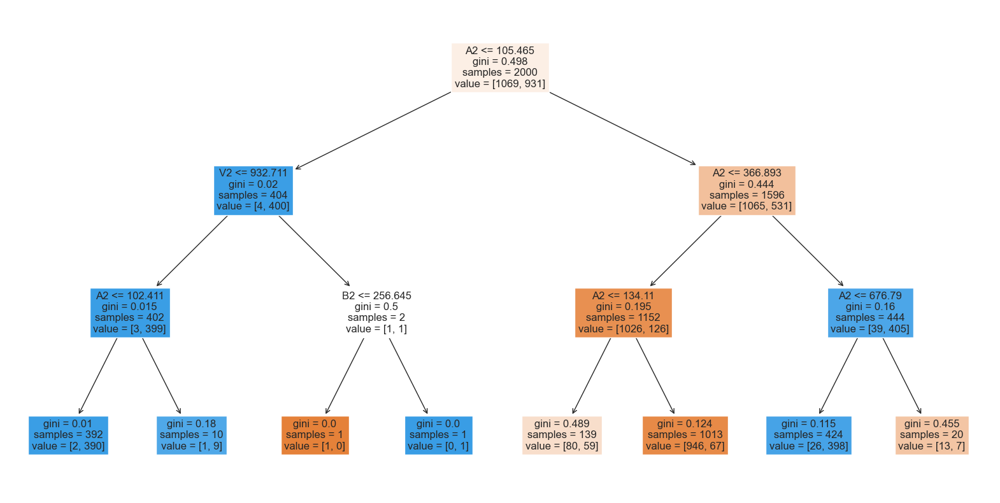

In [1769]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m2_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

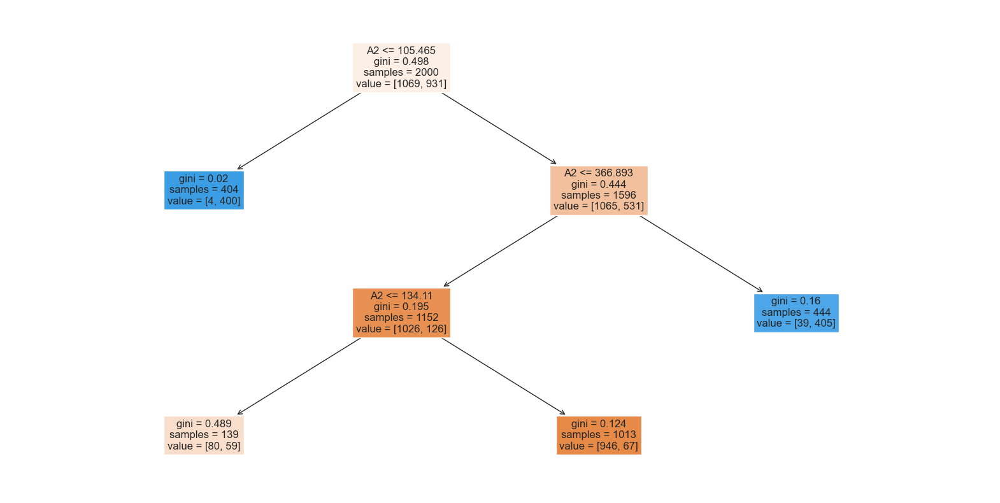

In [1770]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_2, y_2)
export_graphviz(model, out_file='defect_tree.dot', feature_names=x_2.columns, class_names=['Defect','No Defect'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m2_all.columns))
plt.show()

# Random Forest Classifier

In [1771]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.9475

In [1772]:
predictions=rfc.predict(x_test)
predictions

array([0., 0., 1., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0., 0., 1., 1., 0.,
       1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 1., 1., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 0., 1., 1., 1.,
       1., 0., 1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1.,
       1., 0., 0., 1., 1., 0., 1., 1., 0., 0., 1., 1., 1., 1., 0., 0., 0.,
       1., 0., 1., 1., 1., 1., 0., 0., 1., 0., 0., 1., 1., 0., 1., 1., 0.,
       1., 0., 1., 0., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0.,
       0., 1., 0., 0., 1., 0., 1., 1., 0., 0., 0., 1., 1., 1., 1., 1., 0.,
       1., 1., 0., 1., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 1.,
       0., 1., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 1., 0., 1.,
       0., 0., 0., 1., 0.

In [1773]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[213   5]
 [ 16 166]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 194, True Positive (1) - 178, False Positive - 10, False Negative - 18

# 'Accuracy' 93.00%=(194+178)/400

# 'Misclassification Rate' 7.00%=(10+18)/400

# 'False Positive Rate' 4.90%=10/(194+10)

# 'Precision' 94.68%=178/(10+178)

In [1774]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[500, 300, 100, 50, 300], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[1. 1. 0.]


In [1775]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.94

In [1776]:
predictions=dtc.predict(x_test)
predictions

array([0., 0., 1., 0., 1., 0., 1., 1., 0., 1., 1., 0., 0., 0., 1., 1., 0.,
       1., 0., 1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 1., 1., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 1., 1., 0., 1.,
       0., 1., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 0., 1., 0., 1.,
       1., 0., 1., 1., 1., 1., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 1.,
       1., 0., 0., 1., 1., 0., 1., 1., 0., 0., 1., 1., 1., 1., 0., 0., 0.,
       1., 1., 1., 1., 1., 1., 1., 0., 1., 0., 0., 1., 1., 0., 1., 1., 0.,
       1., 0., 1., 0., 1., 0., 0., 0., 0., 0., 1., 0., 0., 1., 1., 0., 0.,
       0., 1., 0., 0., 1., 0., 1., 0., 0., 0., 0., 1., 1., 1., 1., 1., 0.,
       1., 0., 0., 1., 0., 0., 0., 0., 1., 1., 1., 0., 0., 0., 0., 1., 1.,
       0., 1., 0., 1., 0., 0., 0., 0., 1., 1., 0., 0., 1., 0., 1., 0., 1.,
       1., 0., 0., 1., 0.

In [1777]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[209   9]
 [ 15 167]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 188, True Positive (1) - 174, False Positive - 16, False Negative - 22

# 'Accuracy' 90.50%=(188+174)/400

# 'Misclassification Rate' 9.50%=(16+22)/400

# 'False Positive Rate' 7.84%=16/(188+16)

# 'Precision' 91.58%=174/(16+174)

# Note: the performance of the Random Forrest Classifier appears to be somewhat better than that of the Basic Decision Tree

# M3

# Basic Decision Trees

In [1778]:
#decision tree using all M3 input variables & i_diff_d

m3_all=merged_df[['T3', 'V3', 'A3', 'P3', 'B3', 'i_diff_d']]

x_3=m3_all[['T3', 'V3', 'A3', 'P3', 'B3']]
y_3=m3_all['i_diff_d']

In [1779]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1780]:
model.fit(x_3, y_3)

DecisionTreeClassifier(max_depth=3, random_state=0)

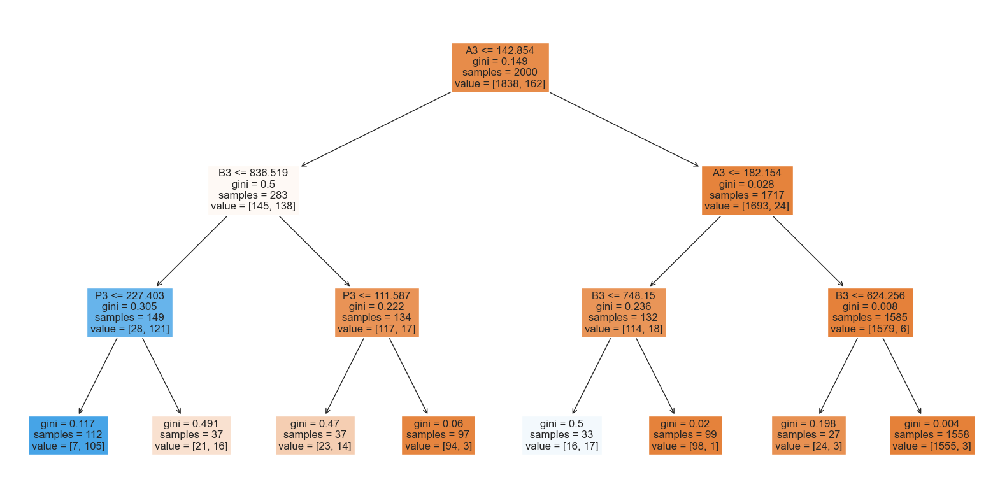

In [1781]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m3_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

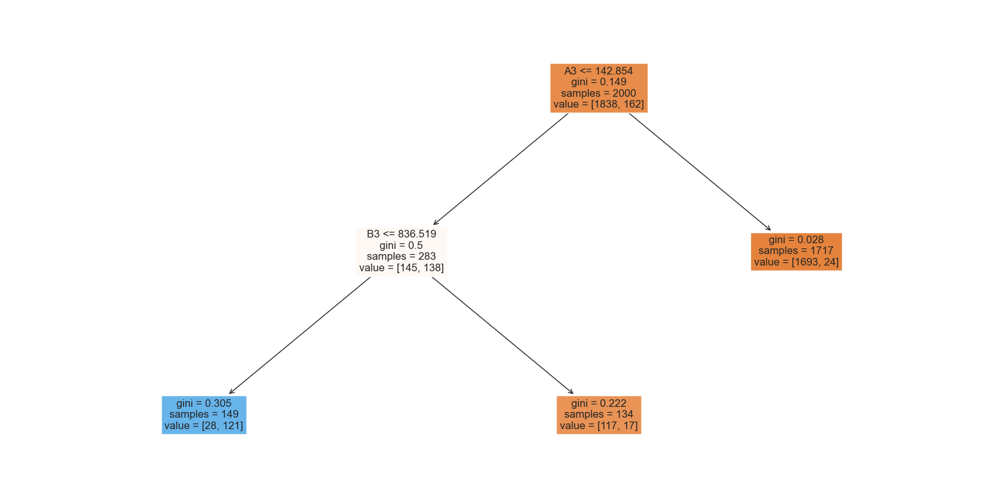

In [1782]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_3, y_3)
export_graphviz(model, out_file='defect_tree.dot', feature_names=x_3.columns, class_names=['Defect','No Defect'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m3_all.columns))
plt.show()

# Random Forest Classifier

In [1783]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.9775

In [1784]:
predictions=rfc.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0.

In [1785]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[361   3]
 [  6  30]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 356, True Positive (1) - 31, False Positive - 1, False Negative - 12

# 'Accuracy' 96.75%=(356+31)/400

# 'Misclassification Rate' 3.25%=(1+12)/400

# 'False Positive Rate' 0.28%=1/(356+1)

# 'Precision' 96.88%=31/(1+31)

In [1786]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[400, 400, 500, 100, 800], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[0. 1. 0.]


In [1787]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.945

In [1788]:
predictions=dtc.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 1., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 1.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 1., 0.

In [1789]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[354  10]
 [ 12  24]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 349, True Positive (1) - 34, False Positive - 8, False Negative - 9

# 'Accuracy' 95.75%=(349+34)/400

# 'Misclassification Rate' 4.25%=(8+9)/400

# 'False Positive Rate' 2.24%=8/(349+8)

# 'Precision' 80.95%=34/(8+34)

# Note: the performance of the Random Forrest Classifier is NOT significantly different from that of the Basic Decision Tree

# M4

# Basic Decision Trees

In [1790]:
#decision tree using all M4 input variables & burn_d

m4_all=merged_df[['T4', 'V4', 'A4', 'P4', 'B4', 'burn_d']]

x_4=m4_all[['T4', 'V4', 'A4', 'P4', 'B4']]
y_4=m4_all['burn_d']

In [1791]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1792]:
model.fit(x_4, y_4)

DecisionTreeClassifier(max_depth=3, random_state=0)

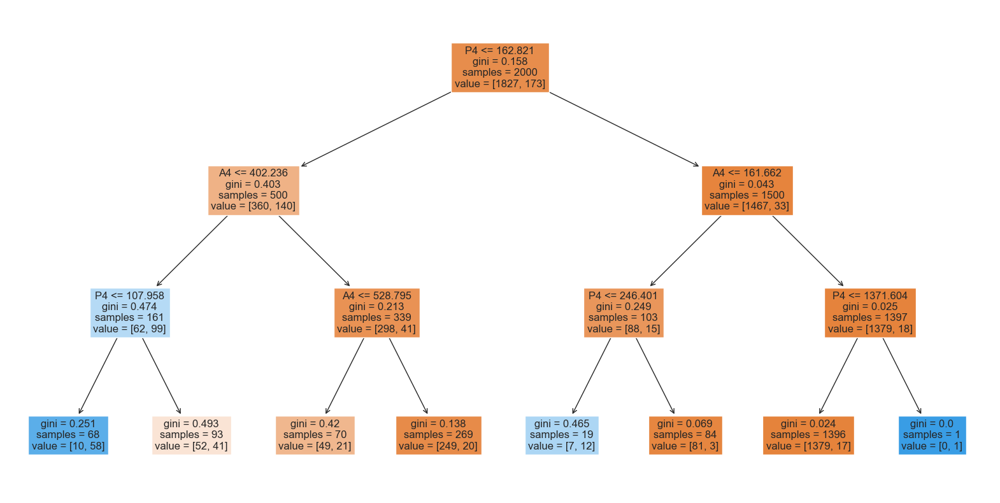

In [1793]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m4_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

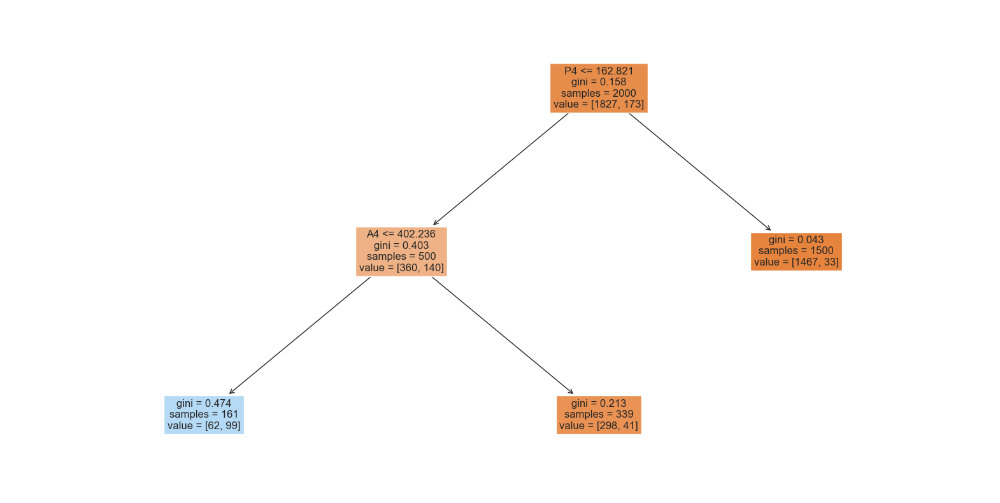

In [1794]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_4, y_4)
export_graphviz(model, out_file='defect_tree.dot', feature_names=x_4.columns, class_names=['Defect','No Defect'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m4_all.columns))
plt.show()

# Random Forrest Classifier

In [1795]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.93

In [1796]:
predictions=rfc.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0.

In [1797]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[358   6]
 [ 22  14]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 359, True Positive (1) - 12, False Positive - 9, False Negative - 20

# 'Accuracy' 92.75%=(359+12)/400

# 'Misclassification Rate' 7.25%=(9+20)/400

# 'False Positive Rate' 2.45%=9/(359+9)

# 'Precision' 57.14%=12/(9+12)

In [1798]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[400, 400, 400, 300, 300], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[0. 1. 0.]


In [1799]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.9075

In [1800]:
predictions=dtc.predict(x_test)
predictions

array([0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       1., 0., 0., 1., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 1.

In [1801]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[347  17]
 [ 20  16]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 352, True Positive (1) - 14, False Positive - 16, False Negative - 18

# 'Accuracy' 91.50%=(352+14)/400

# 'Misclassification Rate' 8.50%=(16+18)/400

# 'False Positive Rate' 4.35%=16/(352+16)

# 'Precision' 46.67%=14/(16+14)

# Note: the performance of the Random Forrest Classifier appears to be somewhat better than that of the Basic Decision Tree

# Summary
- As did logistic regressions, decision trees & classifications demonstrate the M1 input variables, the M2 input variables, the M3 input variables & the M4 input variables, each as a group, predict their direct defect very well

# M1
- According to the initial basic decision tree (Max Depth=3): [91.54<B1<=109.561, 16.793<P1] & [109.561<B1, 45.637<T1] would indicate a relatively low probability (<10% of the sample) of contamination defects
- According to a more ‘pruned’ tree: [91.54<B1] would indicate a similar probability
- According to the Random Forest Classifier, the M1 input variables [‘T1', 'V1', 'A1', 'P1', 'B1’] predict contamination defects very well
- Very high ‘accuracy’ score (Confusion Matrix)

# M2
- According to the initial basic decision tree (Max Depth=3): [134.11<A2<=366.893] would indicate a relatively low probability (<10% of the sample) of crystallisation defects; a more ‘pruned’ tree would indicate a similar result/probability
- According to the Random Forest Classifier, the M2 input variables [‘T2’, 'V2’, 'A2’, 'P2’, 'B2’] predict crystallisation defects very well
- Very high ‘accuracy’ & ‘precision’ scores

# M3
- According to the initial basic decision tree (Max Depth=3): [A3<=142.854, 836.519<B3, 111.587<P3], [142.854<A3<=182.154, 748.15<B3], [182.154<A3, B3<=624.256] & [182.154<A3, 624.256<B3] would indicate a relatively low probability (<10% of the sample) of ion diffusion defects
- According to a more ‘pruned’ tree: [A3<=142.854, 836.519<B3] & [142.854<A3] would indicate a similar probability
- According to the Random Forest Classifier, the M3 input variables [‘T3’, 'V3’, 'A3’, 'P3’, 'B3’] predict ion diffusion defects very well
- Very high ‘accuracy’ & ‘precision’ scores

# M4
- According to the initial basic decision tree (Max Depth=3): [P4<=162.821, 528.795<A4], [A4<=161.662, 246.401<P4] & [162.821<P4<=1371.604, 161.662<A4] would indicate a relatively low probability (<10% of the sample) of burnishing defects
- According to a more ‘pruned’ tree: [P4<=162.821, 402.236<A4] & [162.821<P4] would indicate a similar probability
- According to the Random Forest Classifier, the M4 input variables [‘T4’, 'V4’, 'A4’, 'P4’, 'B4’] predict burnishing defects very well
- Very high ‘accuracy’ score

# 3.6 Decision Trees (Supervised ML): m1_cost, m2_cost, m3_cost, m4_cost

We now turn our attention to the cost variables.

# M1

# Basic Decision Trees

In [1802]:
#find the values of m1_cost at the 25th, 50th & 75th percentiles

percentiles=merged_df['m1_cost'].quantile([0.25, 0.5, 0.75])

#print the percentiles

print(percentiles)

0.25    92.355334
0.50    92.615936
0.75    92.860238
Name: m1_cost, dtype: float64


In [1803]:
#decision tree using all M1 input variables & m1_cost

m1_all=merged_df[['T1', 'V1', 'A1', 'P1', 'B1', 'm1_cost']]

In [1804]:
m1_all['new_m1_cost']=0
m1_all.head()

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/1102101179.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m1_all['new_m1_cost']=0


,T1,V1,A1,P1,B1,m1_cost,new_m1_cost
0,78.940130,115.086999,232.867174,22.610159,133.624956,92.524040,0
1,279.123695,106.896424,143.837072,15.394145,108.505666,91.863553,0
2,90.800408,163.802623,167.744116,51.453506,123.931713,92.546588,0
3,72.221316,295.436651,68.756056,17.536468,80.242899,92.021783,0
4,42.302119,150.416225,668.046834,31.921874,79.462521,92.089066,0


In [1805]:
#iterate over the rows in m1_all & assign a value of 0 to the new column if the value in the original column is below the given number & a value of 1 if the value in the original column is above the given number

given_number=92.355334

for i in range(len(m1_all)):
    if m1_all['m1_cost'].iloc[i]<given_number:
        m1_all['new_m1_cost'].iloc[i]=0
    else:
        m1_all['new_m1_cost'].iloc[i]=1

m1_all

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/493302834.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m1_all['new_m1_cost'].iloc[i]=1
/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/493302834.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m1_all['new_m1_cost'].iloc[i]=0


,T1,V1,A1,P1,B1,m1_cost,new_m1_cost
0,78.940130,115.086999,232.867174,22.610159,133.624956,92.524040,1
1,279.123695,106.896424,143.837072,15.394145,108.505666,91.863553,0
2,90.800408,163.802623,167.744116,51.453506,123.931713,92.546588,1
3,72.221316,295.436651,68.756056,17.536468,80.242899,92.021783,0
4,42.302119,150.416225,668.046834,31.921874,79.462521,92.089066,0
...,...,...,...,...,...,...,...
1995,159.071431,202.034973,271.206895,26.687542,123.504741,93.380881,1
1996,42.324823,213.841416,135.754168,38.451957,115.233224,92.242557,0
1997,84.212089,262.656847,224.393630,41.903710,88.980414,92.555595,1
1998,135.165438,258.534429,20.459556,24.297708,157.036772,92.925032,1


In [1806]:
m1_all=m1_all.drop('m1_cost', axis=1)
m1_all.head()

,T1,V1,A1,P1,B1,new_m1_cost
0,78.940130,115.086999,232.867174,22.610159,133.624956,1
1,279.123695,106.896424,143.837072,15.394145,108.505666,0
2,90.800408,163.802623,167.744116,51.453506,123.931713,1
3,72.221316,295.436651,68.756056,17.536468,80.242899,0
4,42.302119,150.416225,668.046834,31.921874,79.462521,0


In [1807]:
x_1=m1_all[['T1', 'V1', 'A1', 'P1', 'B1']]
y_1=m1_all['new_m1_cost']

In [1808]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1809]:
model.fit(x_1, y_1)

DecisionTreeClassifier(max_depth=3, random_state=0)

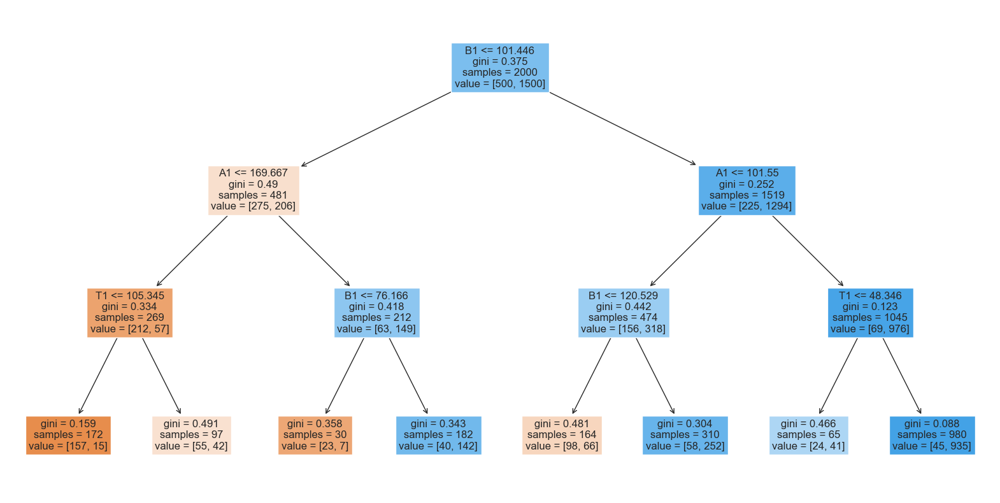

In [1810]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m1_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

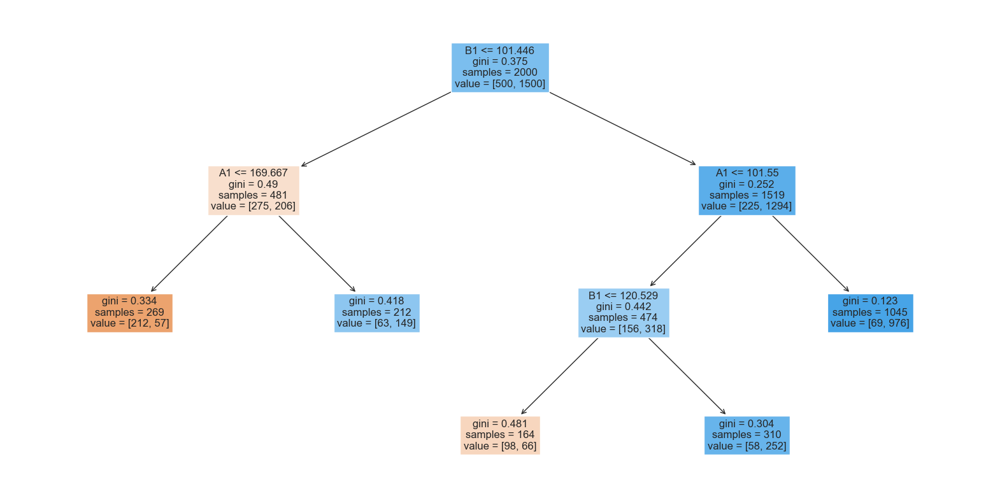

In [1811]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_1, y_1)
export_graphviz(model, out_file='cost_25_percentile.dot', feature_names=x_1.columns, class_names=['Above','Below'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m1_all.columns))
plt.show()

# Random Forrest Classifier

In [1812]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.9025

In [1813]:
predictions=rfc.predict(x_test)
predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1,
       1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [1814]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 85  31]
 [  8 276]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 68, True Positive (1) - 295, False Positive - 20, False Negative - 17

# 'Accuracy' 90.75%=(68+295)/400

# 'Misclassification Rate' 9.25%=(20+17)/400

# 'False Positive Rate' 22.73%=20/(68+20)

# 'Precision' 93.65%=295/(20+295)

In [1815]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[100, 100, 200, 15, 100], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[1. 0. 1.]


In [1816]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.85

In [1817]:
predictions=dtc.predict(x_test)
predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [1818]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 79  37]
 [ 23 261]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 63, True Positive (1) - 277, False Positive - 25, False Negative - 35

# 'Accuracy' 85.00%=(63+277)/400

# 'Misclassification' 15.00%=(25+35)/400

# 'False Positive' 28.41%=25/(63+25)

# 'Precision' 91.72%=277/(25+277)

# Note: the performance of the Random Forrest Classifier appears to be somewhat better than that of the Basic Decision Tree

# M2

# Basic Decision Tree

In [1819]:
#find the values of m2_cost at the 25th, 50th & 75th percentiles

percentiles=merged_df['m2_cost'].quantile([0.25, 0.5, 0.75])

#print the percentiles

print(percentiles)

0.25    101.039293
0.50    101.714324
0.75    102.355966
Name: m2_cost, dtype: float64


In [1820]:
#decision tree using all M2 input variables & m2_cost

m2_all=merged_df[['T2', 'V2', 'A2', 'P2', 'B2', 'm2_cost']]

In [1821]:
m2_all['new_m2_cost']=0
m2_all.head()

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/2157157414.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m2_all['new_m2_cost']=0


,T2,V2,A2,P2,B2,m2_cost,new_m2_cost
0,507.780191,370.014740,123.161691,43.707415,303.446698,100.983478,0
1,571.603120,468.268042,177.169161,73.582653,256.794293,100.981891,0
2,541.071181,487.986805,33.832191,82.867949,263.355556,102.117686,0
3,510.012513,427.478352,283.932571,90.980745,279.062032,101.824887,0
4,524.771696,317.944358,409.512248,71.396122,293.195537,101.803140,0


In [1822]:
#iterate over the rows in m2_all & assign a value of 0 to the new column if the value in the original column is below the given number & a value of 1 if the value in the original column is above the given number

given_number=101.039293

for i in range(len(m2_all)):
    if m2_all['m2_cost'].iloc[i]<given_number:
        m2_all['new_m2_cost'].iloc[i]=0
    else:
        m2_all['new_m2_cost'].iloc[i]=1

m2_all

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/3288260441.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m2_all['new_m2_cost'].iloc[i]=0
/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/3288260441.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m2_all['new_m2_cost'].iloc[i]=1


,T2,V2,A2,P2,B2,m2_cost,new_m2_cost
0,507.780191,370.014740,123.161691,43.707415,303.446698,100.983478,0
1,571.603120,468.268042,177.169161,73.582653,256.794293,100.981891,0
2,541.071181,487.986805,33.832191,82.867949,263.355556,102.117686,1
3,510.012513,427.478352,283.932571,90.980745,279.062032,101.824887,1
4,524.771696,317.944358,409.512248,71.396122,293.195537,101.803140,1
...,...,...,...,...,...,...,...
1995,517.280296,462.753197,266.051695,100.102305,316.755773,101.678637,1
1996,527.311922,347.071692,113.533567,55.430948,261.597180,100.150388,0
1997,598.385252,366.502573,284.444796,44.672621,329.278292,101.841887,1
1998,576.891863,951.337880,187.995396,44.988842,364.612119,101.449743,1


In [1823]:
m2_all=m2_all.drop('m2_cost', axis=1)
m2_all.head()

,T2,V2,A2,P2,B2,new_m2_cost
0,507.780191,370.014740,123.161691,43.707415,303.446698,0
1,571.603120,468.268042,177.169161,73.582653,256.794293,0
2,541.071181,487.986805,33.832191,82.867949,263.355556,1
3,510.012513,427.478352,283.932571,90.980745,279.062032,1
4,524.771696,317.944358,409.512248,71.396122,293.195537,1


In [1824]:
x_2=m2_all[['T2', 'V2', 'A2', 'P2', 'B2']]
y_2=m2_all['new_m2_cost']

In [1825]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1826]:
model.fit(x_2, y_2)

DecisionTreeClassifier(max_depth=3, random_state=0)

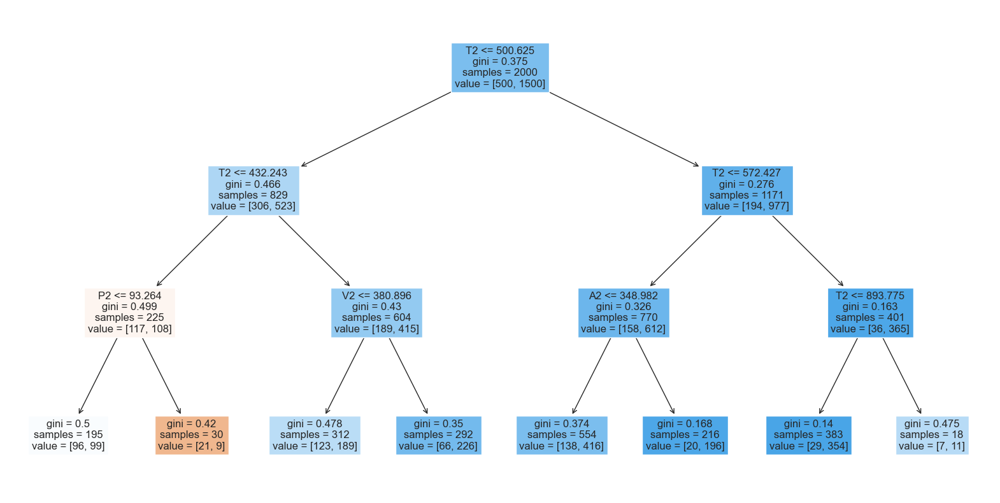

In [1827]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m2_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

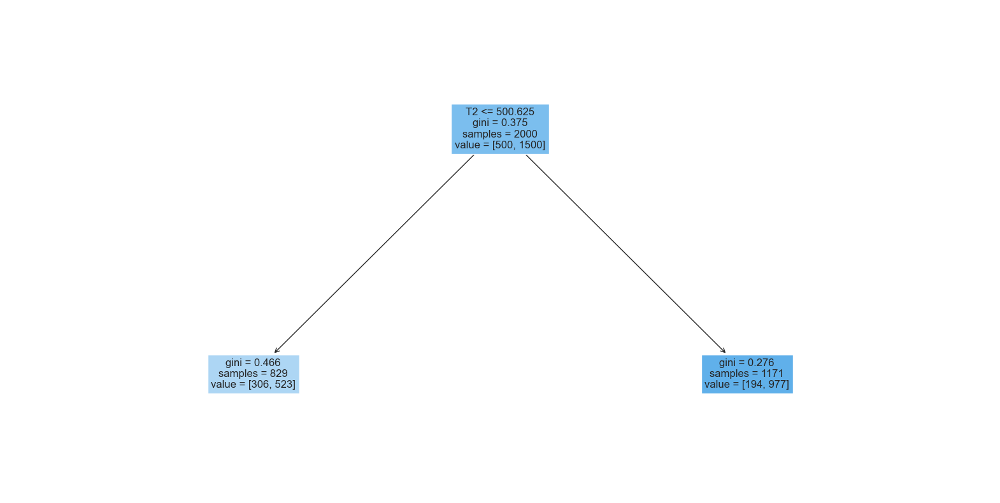

In [1828]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_2, y_2)
export_graphviz(model, out_file='cost_25_percentile.dot', feature_names=x_2.columns, class_names=['Above','Below'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m2_all.columns))
plt.show()

# Random Forest Classifier

In [1829]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_2, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.7275

In [1830]:
predictions=rfc.predict(x_test)
predictions

array([1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0,

In [1831]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 24  82]
 [ 27 267]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 20, True Positive (1) - 281, False Positive - 84, False Negative - 15

# 'Accuracy' 75.25%=(20+281)/400

# 'Misclassification' 24.75%=(84+15)/400

# 'False Positive' 80.77%=84/(20+84)

# 'Precision' 76.99%=281/(84+281)

In [1832]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[500, 300, 100, 50, 300], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[0. 1. 0.]


In [1833]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.6675

In [1834]:
predictions=dtc.predict(x_test)
predictions

array([1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1,
       1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1,

In [1835]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 39  67]
 [ 66 228]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 30, True Positive (1) - 224, False Positive - 74, False Negative - 72

# 'Accuracy' 63.50%=(30+224)/400

# 'Misclassification' 36.50%=(74+72)/400

# 'False Positive' 71.15%=74/(30+74)

# 'Precision' 75.17%=224/(74+224)

# Note: the performance of the Random Forrest Classifier appears to be significantly better than that of the Basic Decision Tree

# M3

# Basic Decision Trees

In [1836]:
#find the values of m3_cost at the 25th, 50th & 75th percentiles

percentiles=merged_df['m3_cost'].quantile([0.25, 0.5, 0.75])

#print the percentiles

print(percentiles)

0.25    95.933392
0.50    96.336918
0.75    96.721242
Name: m3_cost, dtype: float64


In [1837]:
#decision tree using all M3 input variables & m3_cost

m3_all=merged_df[['T3', 'V3', 'A3', 'P3', 'B3', 'm3_cost']]

In [1838]:
m3_all['new_m3_cost']=0
m3_all.head()

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/1783141662.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m3_all['new_m3_cost']=0


,T3,V3,A3,P3,B3,m3_cost,new_m3_cost
0,432.718652,414.939687,517.868420,91.028872,794.075924,96.334276,0
1,380.188927,513.624609,558.017404,69.462037,706.734324,95.987919,0
2,425.703618,485.482764,328.635820,66.799137,856.761784,95.739381,0
3,418.222734,358.063722,304.190547,43.574608,827.188272,95.772697,0
4,315.103209,415.277967,350.989988,164.284333,798.754006,95.605800,0


In [1839]:
#iterate over the rows in m3_all & assign a value of 0 to the new column if the value in the original column is below the given number & a value of 1 if the value in the original column is above the given number

given_number=95.933392

for i in range(len(m3_all)):
    if m3_all['m3_cost'].iloc[i]<given_number:
        m3_all['new_m3_cost'].iloc[i]=0
    else:
        m3_all['new_m3_cost'].iloc[i]=1

m3_all

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/2294298236.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m3_all['new_m3_cost'].iloc[i]=1
/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/2294298236.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m3_all['new_m3_cost'].iloc[i]=0


,T3,V3,A3,P3,B3,m3_cost,new_m3_cost
0,432.718652,414.939687,517.868420,91.028872,794.075924,96.334276,1
1,380.188927,513.624609,558.017404,69.462037,706.734324,95.987919,1
2,425.703618,485.482764,328.635820,66.799137,856.761784,95.739381,0
3,418.222734,358.063722,304.190547,43.574608,827.188272,95.772697,0
4,315.103209,415.277967,350.989988,164.284333,798.754006,95.605800,0
...,...,...,...,...,...,...,...
1995,353.764866,455.838086,547.266473,49.823743,787.978828,96.296075,1
1996,343.112086,409.644390,532.000477,127.517325,679.348828,95.635628,0
1997,422.669327,507.876632,408.203565,42.832904,801.994873,96.722710,1
1998,486.609288,425.064577,244.045240,95.274733,760.896683,97.201140,1


In [1840]:
m3_all=m3_all.drop('m3_cost', axis=1)
m3_all.head()

,T3,V3,A3,P3,B3,new_m3_cost
0,432.718652,414.939687,517.868420,91.028872,794.075924,1
1,380.188927,513.624609,558.017404,69.462037,706.734324,1
2,425.703618,485.482764,328.635820,66.799137,856.761784,0
3,418.222734,358.063722,304.190547,43.574608,827.188272,0
4,315.103209,415.277967,350.989988,164.284333,798.754006,0


In [1841]:
x_3=m3_all[['T3', 'V3', 'A3', 'P3', 'B3']]
y_3=m3_all['new_m3_cost']

In [1842]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1843]:
model.fit(x_3, y_3)

DecisionTreeClassifier(max_depth=3, random_state=0)

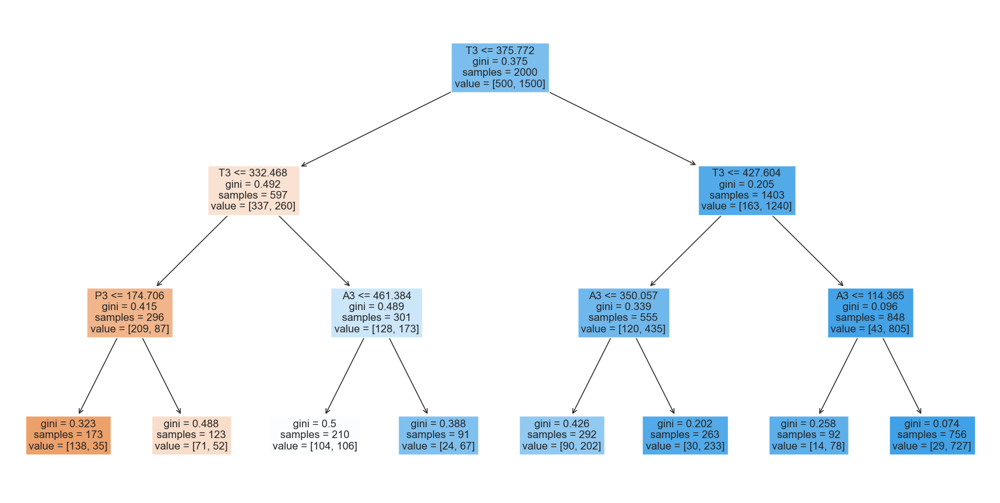

In [1844]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m3_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

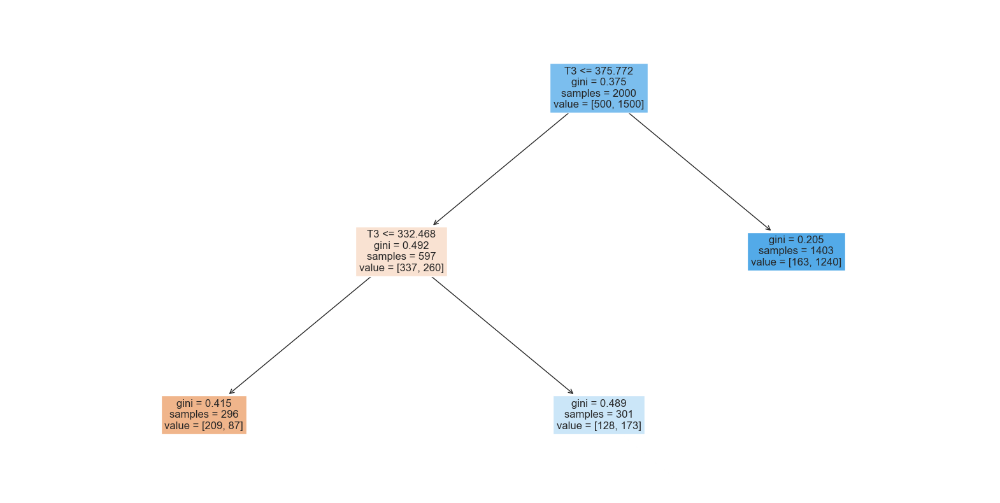

In [1845]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_3, y_3)
export_graphviz(model, out_file='cost_25_percentile.dot', feature_names=x_3.columns, class_names=['Above','Below'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m3_all.columns))
plt.show()

# Random Forest Classifier

In [1846]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.8025

In [1847]:
predictions=rfc.predict(x_test)
predictions

array([1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1,
       0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1,

In [1848]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 45  48]
 [ 31 276]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 45, True Positive (1) - 281, False Positive - 42, False Negative - 32

# 'Accuracy' 81.50%=(45+281)/400

# 'Misclassification' 18.50%=(42+32)/400

# 'False Positive' 48.28%=42/(45+42)

# 'Precision' 87.00%=281/(42+281)

In [1849]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[400, 400, 500, 100, 800], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[1. 0. 0.]


In [1850]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.725

In [1851]:
predictions=dtc.predict(x_test)
predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1,
       1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1,

In [1852]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 45  48]
 [ 62 245]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 42, True Positive (1) - 271, False Positive - 45, False Negative - 42

# 'Accuracy' 78.25%=(42+271)/400

# 'Misclassification' 21.75%=(45+42)/400

# 'False Positive' 51.72%=45/(42+45)

# 'Precision' 85.76%=271/(45+271)

# Note: the performance of the Random Forrest Classifier appears to be significantly better than that of the Basic Decision Tree

# M4

# Basic Decision Trees

In [1853]:
#find the values of m4_cost at the 25th, 50th & 75th percentiles

percentiles=merged_df['m4_cost'].quantile([0.25, 0.5, 0.75])

#print the percentiles

print(percentiles)

0.25    96.318463
0.50    96.600121
0.75    96.868792
Name: m4_cost, dtype: float64


In [1854]:
#decision tree using all M4 input variables & m4_cost

m4_all=merged_df[['T4', 'V4', 'A4', 'P4', 'B4', 'm4_cost']]

In [1855]:
m4_all['new_m4_cost']=0
m4_all.head()

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/1169439141.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m4_all['new_m4_cost']=0


,T4,V4,A4,P4,B4,m4_cost,new_m4_cost
0,392.655034,373.415078,432.946617,269.988431,326.391617,96.586348,0
1,399.148769,253.981065,127.103920,364.185571,355.790207,96.497598,0
2,344.886153,246.293714,423.369294,478.460090,358.684659,96.589076,0
3,300.590055,342.898547,439.010655,223.193350,356.529517,96.260197,0
4,433.649555,451.510521,875.067767,282.225705,336.567299,97.486197,0


In [1856]:
#iterate over the rows in m4_all & assign a value of 0 to the new column if the value in the original column is below the given number & a value of 1 if the value in the original column is above the given number

given_number=96.318463

for i in range(len(m4_all)):
    if m4_all['m4_cost'].iloc[i]<given_number:
        m4_all['new_m4_cost'].iloc[i]=0
    else:
        m4_all['new_m4_cost'].iloc[i]=1

m4_all

/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/4192156203.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m4_all['new_m4_cost'].iloc[i]=1
/var/folders/x4/mg6b28ws3zd2nwdlvlmr9cgr0000gn/T/ipykernel_60962/4192156203.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m4_all['new_m4_cost'].iloc[i]=0


,T4,V4,A4,P4,B4,m4_cost,new_m4_cost
0,392.655034,373.415078,432.946617,269.988431,326.391617,96.586348,1
1,399.148769,253.981065,127.103920,364.185571,355.790207,96.497598,1
2,344.886153,246.293714,423.369294,478.460090,358.684659,96.589076,1
3,300.590055,342.898547,439.010655,223.193350,356.529517,96.260197,0
4,433.649555,451.510521,875.067767,282.225705,336.567299,97.486197,1
...,...,...,...,...,...,...,...
1995,399.528096,261.063373,929.995458,94.856314,323.494331,96.608627,1
1996,316.846530,550.019613,285.254869,479.248539,344.081282,96.570704,1
1997,443.458059,421.295776,625.982901,368.286781,328.876947,97.303610,1
1998,335.277295,356.300952,851.102470,403.132450,343.032882,97.130055,1


In [1857]:
m4_all=m4_all.drop('m4_cost', axis=1)
m4_all.head()

,T4,V4,A4,P4,B4,new_m4_cost
0,392.655034,373.415078,432.946617,269.988431,326.391617,1
1,399.148769,253.981065,127.103920,364.185571,355.790207,1
2,344.886153,246.293714,423.369294,478.460090,358.684659,1
3,300.590055,342.898547,439.010655,223.193350,356.529517,0
4,433.649555,451.510521,875.067767,282.225705,336.567299,1


In [1858]:
x_4=m4_all[['T4', 'V4', 'A4', 'P4', 'B4']]
y_4=m4_all['new_m4_cost']

In [1859]:
#create the model object
model=DecisionTreeClassifier(random_state=0, max_depth=3)

In [1860]:
model.fit(x_4, y_4)

DecisionTreeClassifier(max_depth=3, random_state=0)

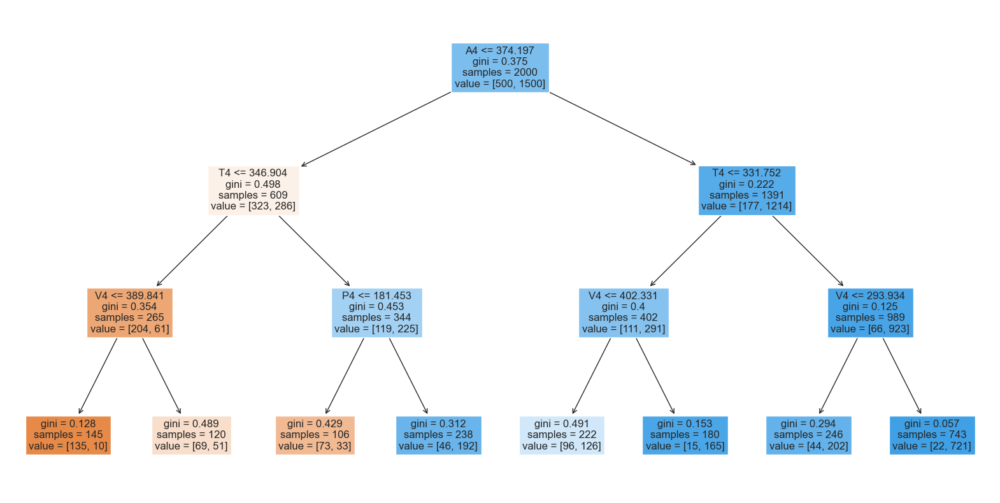

In [1861]:
plt.figure(figsize=(20, 10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m4_all.columns)) #Need to convert the column headings into a list explicitly in this version of Jupyter
plt.show()

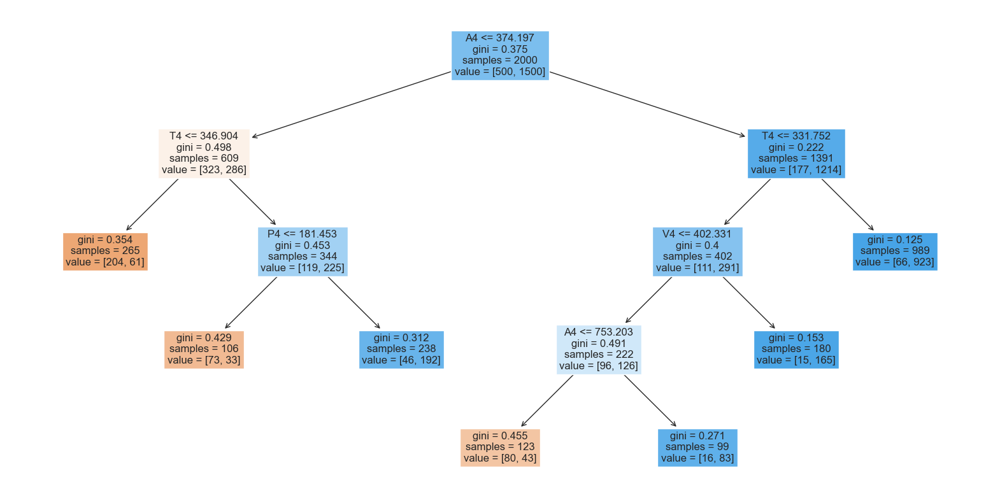

In [1862]:
model=DecisionTreeClassifier(random_state=0, max_depth=6, ccp_alpha=0.01)
model.fit(x_4, y_4)
export_graphviz(model, out_file='cost_25_percentile.dot', feature_names=x_3.columns, class_names=['Above','Below'], rounded=True, proportion=False, precision=2, filled=True)

plt.figure(figsize=(20,10))
plot_tree(model, filled=True, fontsize=12, feature_names=list(m4_all.columns))
plt.show()

# Random Forest Classifier

In [1863]:
#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#build & score the Random Forest Classifier

rfc=RandomForestClassifier()
rfc.fit(x_train, y_train)
rfc.score(x_test, y_test)

0.915

In [1864]:
predictions=rfc.predict(x_test)
predictions

array([0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,

In [1865]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 74  24]
 [ 10 292]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 77, True Positive (1) - 287, False Positive - 24, False Negative - 12

# 'Accuracy' 91.00%=(77+287)/400

# 'Misclassification' 9.00%=(24+12)/400

# 'False Positive' 23.76%=24/(77+24)

# 'Precision' 92.28%=287/(24+287)

In [1866]:
#extract the 1st decision tree from the Random Forest Classifier
estimator=rfc.estimators_[0]

#make predictions on 3 new data points
predictions=estimator.predict(np.array([[400, 400, 400, 300, 300], [50, 50, 50, 50, 50], [300, 300, 300, 300, 300]]))

#print the predictions
print(predictions)

[1. 0. 0.]


In [1867]:
#compare the performance of the Random Forest Classifier with that of the Basic Decision Tree

dtc=DecisionTreeClassifier(random_state=0)
dtc.fit(x_train, y_train)
dtc.score(x_test, y_test)

0.86

In [1868]:
predictions=dtc.predict(x_test)
predictions

array([0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0,
       0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0,
       1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0,

In [1869]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[ 69  29]
 [ 27 275]]


# Confusion Matrix (based on 1 particular iteration of the confusion matrix - the actual numbers will vary) : True Negative (0) - 70, True Positive (1) - 269, False Positive - 31, False Negative - 30

# 'Accuracy' 84.75%=(70+269)/400

# 'Misclassification' 15.25%=(31+30)/400

# 'False Positive' 30.69%=31/(70+31)

# 'Precision' 89.67%=269/(31+269)

# Note: the performance of the Random Forrest Classifier appears to be somewhat better than that of the Basic Decision Tree

# Summary
- Decision trees & classifications demonstrate the M1 input variables, the M2 input variables, the M3 input variables & the M4 input variables, each as a group, predict their direct cost  well (though the M2 input variables perform the worst)

# M1
- According to the initial basic decision tree (Max Depth=3): [B1<=101.446, A1<=169.667, T1<=105.345] would indicate a high probability (90%+ of the sample) of m1_cost being in the lowest 25th percentile
- According to a more ‘pruned’ tree: [B1<=101.446, A1<=169.667] would indicate a similar probability (approx 80% of the sample)
- According to the Random Forest Classifier, the M1 input variables [‘T1', 'V1', 'A1', 'P1', 'B1’] predict the probability of m1_cost being in the lowest 25th percentile well
- High ‘accuracy’  & ‘precision’ scores (Confusion Matrix)

# M2
- According to the initial basic decision tree (Max Depth=3): [T2<=432.243, 93.264<P2] would indicate a relatively high probability (approx 70% of the sample) of m2_cost being in the lowest 25th percentile 
- A more ‘pruned’ tree returns an inconclusive result
- According to the Random Forest Classifier, the M2 input variables [‘T2’, 'V2’, 'A2’, 'P2’, 'B2’] predict the probability of m2_cost being in the lowest 25th percentile reasonably well
- Reasonably high ‘accuracy’ & ‘precision’ scores

# M3
- According to the initial basic decision tree (Max Depth=3): [T3<=332.468, P3<=174.706] would indicate a relatively high probability (approx 80% of the sample) of m3_cost being in the lowest 25th percentile
- According to a more ‘pruned’ tree: [T3<=332.468] would indicate a similar probability (approx 70% of the sample)
- According to the Random Forest Classifier, the M3 input variables [‘T3’, 'V3’, 'A3’, 'P3’, 'B3’] predict the probability of m3_cost being in the lowest 25th percentile reasonably well
- Reasonably high ‘accuracy’ & ‘precision’ scores

# M4
- According to the initial basic decision tree (Max Depth=3): [A4<=374.197, T4<=346.904, V4<=389.841] would indicate a high probability (90%+ of the sample) of m4_cost being in the lowest 25th percentile
- According to a more ‘pruned’ tree: [A4<=374.197, T4<=346.904] would indicate a similar probability (approx 80% of the sample)
- According to the Random Forest Classifier, the M4 input variables [‘T4’, 'V4’, 'A4’, 'P4’, 'B4’] predict the probability of m4_cost being in the lowest 25th percentile well
- High ‘accuracy’ & ‘precision’ scores

Model the defect & cost behaviours of M1-M4 input variables using the given dataset
From the existing dataset, identify the ‘optimal' set(s) of M1-M4 input variables that will meet particular defect probability & cost requirements
Predict the defect probabilities & costs of a new set of M1-M4 input variables

# 4. Synthesising & Applying the Results

To identify the ‘optimal’ set(s) of M1-M4 input variables from the existing dataset, we first filter/reduce the dataset by applying logistic regressions to each set of input variables (M1, M3, M4) & their direct defect variable (for example, the M1 input variables vs conta_d) & selecting only those with probabilities below a particular threshold.  This filtering/reduction can be bolstered by decision trees/classifications in some cases – and/or by cross-step logistic regressions, which may help make the filtering/reduction more efficient though doing so may prove too restrictive.  We then turn to the cost variables.  Here, we need reasonable thresholds that can serve as the maximum permissible costs for m1_cost, m2_cost, m3_cost & m4_cost.  For example, we can use the thresholds gleaned from our clustering analyses or the lowest 25th percentile threshold values.  The sequence of analysing the defect variables & the cost variables can be reversed.

To predict the probabilities & costs of a new set of M1-M4 input variables, we can use the logistic regressions and/or decision trees/classifications to predict the probabilities of the 4 defects (contamination, crystallisation, ion diffusion, burnishing).  We can use the linear and/or polynomial regressions to predict the costs for M1, M3 & M4 (but not M2).

To identify a new set of input variables that ‘improve’ our probability/cost outcomes, we can strategically depart from an ‘optimal’ set identified in the above analysis & test a new set of variables NEAR that (current) ‘optimum’.  The challenge here is that the +/- directions of the coefficients of the logistic regressions & the linear/polynomial regressions are not all aligned.  To lower the probabilities of defects, we would shift the M1-M4 input variables as follows:

- M1: T1+, V1+, A1+, P1+, B1+ 
- M2: T2+, V2+, A2-, P2+, B2-
- M3: T3-, 'V3-, A3+, P3+, B3+
- M4: T4-, V4+, A4+, P4+, B4-

However, to lower the costs, we would shift the same input variables as follows:

- M1: T1-, V1-, A1-, P1-, B1-
- M3: T3<800 -
- M4: T4-, V4-, A4-, P4-, B4-

# 4.1 From the existing dataset, identify the ‘optimal' set(s) of M1-M4 input variables that will meet the following requirements:
- Keep the probability of any defect (conta_d, crys_d, i_diff_d, burn_d) below 5% (note: the existing dataset has the following defect probabilities: conta_d 12.15%, crys_d 46.55%, i_diff_d 8.10%, burn_d 8.65%)
- Keep the cost of each M (m1_cost - m4_cost) below the thresholds identified in the clustering analysis; if possible, filter the dataset further to the lowest 25th percentile 

# 4.1a: Keep the probability of any defect below 5%

In [1870]:
#first, we will use logistic regressions to filter/reduce the dataset, using conta_d to filter the M1 input variables, i_diff_d to filter the M3 input variables & burn_d to filter the M4 input variables

In [1871]:
#we will skip crys_d & the M2 input variables because of the previous analysis indicating a lack of strong correlation

In [1872]:
#multivariate logistic regression using all M1 input variables & conta_d

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_1=merged_df['conta_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_1, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)

In [1873]:
#intercept
intercept=logModel.intercept_
intercept

array([8.24531527])

In [1874]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.01184302, -0.00849775, -0.00510628, -0.02744091, -0.05435079]])

In [1875]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.85682198e-01, 1.43178022e-02],
       [9.10679384e-01, 8.93206158e-02],
       [9.98996679e-01, 1.00332088e-03],
       [9.18433794e-01, 8.15662059e-02],
       [7.86422824e-01, 2.13577176e-01],
       [9.96232210e-01, 3.76779004e-03],
       [9.98956505e-01, 1.04349501e-03],
       [9.85728761e-01, 1.42712388e-02],
       [8.92963428e-01, 1.07036572e-01],
       [8.86357877e-01, 1.13642123e-01],
       [9.71930864e-01, 2.80691360e-02],
       [7.10243066e-01, 2.89756934e-01],
       [1.64912553e-01, 8.35087447e-01],
       [9.33914930e-01, 6.60850696e-02],
       [5.75874371e-01, 4.24125629e-01],
       [9.80199279e-01, 1.98007208e-02],
       [9.71811981e-01, 2.81880187e-02],
       [9.92090663e-01, 7.90933692e-03],
       [9.92879051e-01, 7.12094895e-03],
       [6.12750750e-01, 3.87249250e-01],
       [7.06075171e-01, 2.93924829e-01],
       [9.63510953e-01, 3.64890472e-02],
       [9.93047146e-01, 6.95285404e-03],
       [9.88385730e-01, 1.16142699e-02],
       [3.847911

In [1876]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

1.431780216125437 %
8.93206157958952 %
0.10033208778206025 %
8.156620589788131 %
21.357717623206664 %
0.3767790038227316 %
0.10434950129400301 %
1.4271238764772927 %
10.703657243044098 %
11.36421227012842 %
2.806913602322561 %
28.97569338213349 %
83.50874473860664 %
6.608506956200519 %
42.41256286917303 %
1.9800720767218258 %
2.818801874849858 %
0.7909336920632557 %
0.7120948952655942 %
38.724924959941525 %
29.39248287736215 %
3.6489047175745664 %
0.6952854042799581 %
1.1614269937741175 %
61.52088764650551 %
27.995454846551503 %
22.73851011430878 %
5.5741463281028265 %
10.751535068185111 %
3.3000601404245646 %
1.4719808031126675 %
8.933649609056435 %
2.6641093869973855 %
12.788647644439772 %
14.230931167842725 %
1.8737976019692788 %
12.92066758807809 %
43.38697050711297 %
24.558289833621867 %
4.103567619882788 %
3.8166759181230745 %
15.711574214255899 %
1.59949778113019 %
9.31483287562504 %
52.7253053210075 %
4.695107655824347 %
6.163673999129457 %
14.9469734

In [1877]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.9325


In [1878]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[357   1]
 [ 26  16]]


In [1879]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the whole dataset (x_1)
probability_defect_all=logModel.predict_proba(x_1)
probability_defect_all

array([[0.93932933, 0.06067067],
       [0.95360257, 0.04639743],
       [0.96181049, 0.03818951],
       ...,
       [0.89243438, 0.10756562],
       [0.99229928, 0.00770072],
       [0.99746101, 0.00253899]])

In [1880]:
filtered_x_1=x_1[probability_defect_all[:, 1]<0.05]

In [1881]:
filtered_x_1

,T1,V1,A1,P1,B1
1,279.123695,106.896424,143.837072,15.394145,108.505666
2,90.800408,163.802623,167.744116,51.453506,123.931713
5,99.497250,216.679251,263.216775,17.935721,119.421314
6,125.824560,306.429457,282.042714,19.963581,131.234779
7,85.407327,279.346684,164.164788,15.279495,152.359977
...,...,...,...,...,...
1986,179.124281,246.565844,175.294245,43.138717,110.246981
1992,135.978230,275.822161,254.613662,26.663922,126.352581
1995,159.071431,202.034973,271.206895,26.687542,123.504741
1998,135.165438,258.534429,20.459556,24.297708,157.036772


In [1882]:
#get the index numbers of filtered_x_1
index_numbers=filtered_x_1.index

In [1883]:
#select the rows with the specified index numbers
filtered_merged_df_1=merged_df.iloc[index_numbers, :]
filtered_merged_df_1

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
1,1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,0.0,0.0,1.0,0.0
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
7,7,85.407327,279.346684,164.164788,15.279495,152.359977,497.025779,367.908510,266.774339,93.857865,279.130546,448.114820,431.760713,611.130227,41.295090,802.852726,327.965913,200.108205,744.279398,502.496117,312.072082,93.254593,101.441292,96.333786,96.432086,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1986,1986,179.124281,246.565844,175.294245,43.138717,110.246981,487.683871,389.835115,74.831629,87.075600,331.179834,245.286005,483.836306,598.591685,73.903368,912.670996,414.593739,245.203998,534.020474,72.264950,358.839346,93.025879,102.017589,95.828240,96.626101,0.0,1.0,0.0,0.0
1992,1992,135.978230,275.822161,254.613662,26.663922,126.352581,487.083922,326.680143,48.023743,78.703577,289.040923,473.093880,498.249153,486.716044,179.093973,919.814758,386.707430,456.745278,333.259516,184.277023,335.452628,93.199439,102.437257,96.835490,96.495058,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0
1998,1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,0.0,0.0,0.0,0.0


In [1884]:
#multivariate logistic regression using all M3 input variables & i_diff_d

x_3=merged_df[['T3', 'V3', 'A3', 'P3', 'B3']]
y_3=merged_df['i_diff_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_3, y_3, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)

In [1885]:
#intercept
intercept=logModel.intercept_
intercept

array([5.55184295])

In [1886]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[ 0.00408698,  0.00830335, -0.02461471, -0.00871907, -0.00953731]])

In [1887]:
#defect probability of each ['T3', 'V3', 'A3', 'P3', 'B3'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.99914449e-01, 8.55506631e-05],
       [6.98702704e-01, 3.01297296e-01],
       [9.99925076e-01, 7.49238414e-05],
       [9.81646169e-01, 1.83538314e-02],
       [9.85240575e-01, 1.47594251e-02],
       [9.87153052e-01, 1.28469479e-02],
       [2.91159041e-01, 7.08840959e-01],
       [9.99343356e-01, 6.56644216e-04],
       [9.99981418e-01, 1.85820097e-05],
       [9.82370677e-01, 1.76293228e-02],
       [9.99817528e-01, 1.82472488e-04],
       [9.98496256e-01, 1.50374448e-03],
       [9.48998578e-01, 5.10014222e-02],
       [7.52213981e-01, 2.47786019e-01],
       [8.81061880e-01, 1.18938120e-01],
       [9.99980557e-01, 1.94426528e-05],
       [7.83842333e-01, 2.16157667e-01],
       [9.99936208e-01, 6.37921989e-05],
       [9.92879218e-01, 7.12078222e-03],
       [9.18668900e-01, 8.13311001e-02],
       [9.97570147e-01, 2.42985300e-03],
       [9.99688500e-01, 3.11500399e-04],
       [9.99997186e-01, 2.81427057e-06],
       [5.56024423e-01, 4.43975577e-01],
       [9.999372

In [1888]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

0.008555066309533371 %
30.129729566206407 %
0.007492384144913316 %
1.835383139269693 %
1.4759425055095379 %
1.2846947907560715 %
70.88409591175186 %
0.06566442157641719 %
0.0018582009697499851 %
1.7629322822028177 %
0.018247248818205945 %
0.15037444796517196 %
5.100142223543903 %
24.77860194380888 %
11.893812016774863 %
0.0019442652759210034 %
21.6157666983683 %
0.006379219889483135 %
0.7120782218286684 %
8.133110014530955 %
0.242985300304499 %
0.03115003990537238 %
0.00028142705677732156 %
44.39755773776099 %
0.006275164381288564 %
0.03735067425943503 %
0.0021447171843284826 %
0.06096428465328192 %
0.006693058725363286 %
0.015704765356417162 %
40.77588376497604 %
21.831591809514617 %
13.626291576318753 %
6.655547557635611 %
0.15840377093485827 %
0.005525741473510369 %
7.032430772758066 %
0.00028970697612084147 %
0.13370353308189742 %
2.3388823696657477 %
0.0007195920173736945 %
0.05362290946229506 %
6.108342402090912 %
35.099610033599646 %
0.0113532459831743

In [1889]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.9625


In [1890]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[375   2]
 [ 13  10]]


In [1891]:
#defect probability of each ['T3', 'V3', 'A3', 'P3', 'B3'] input array in the whole dataset (x_3)
probability_defect_all=logModel.predict_proba(x_3)
probability_defect_all

array([[9.99967959e-01, 3.20406617e-05],
       [9.99939388e-01, 6.06121529e-05],
       [9.96010482e-01, 3.98951850e-03],
       ...,
       [9.98605451e-01, 1.39454853e-03],
       [9.53675526e-01, 4.63244735e-02],
       [9.99656555e-01, 3.43444722e-04]])

In [1892]:
filtered_x_3=x_3[probability_defect_all[:, 1]<0.05]

In [1893]:
filtered_x_3

,T3,V3,A3,P3,B3
0,432.718652,414.939687,517.868420,91.028872,794.075924
1,380.188927,513.624609,558.017404,69.462037,706.734324
2,425.703618,485.482764,328.635820,66.799137,856.761784
3,418.222734,358.063722,304.190547,43.574608,827.188272
4,315.103209,415.277967,350.989988,164.284333,798.754006
...,...,...,...,...,...
1995,353.764866,455.838086,547.266473,49.823743,787.978828
1996,343.112086,409.644390,532.000477,127.517325,679.348828
1997,422.669327,507.876632,408.203565,42.832904,801.994873
1998,486.609288,425.064577,244.045240,95.274733,760.896683


In [1894]:
#get the index numbers of filtered_x_3
index_numbers=filtered_x_3.index

In [1895]:
#select the rows with the specified index numbers
filtered_merged_df_3=merged_df.iloc[index_numbers, :]
filtered_merged_df_3

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
0,0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0.0,1.0,0.0,0.0
1,1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,0.0,0.0,1.0,0.0
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
3,3,72.221316,295.436651,68.756056,17.536468,80.242899,510.012513,427.478352,283.932571,90.980745,279.062032,418.222734,358.063722,304.190547,43.574608,827.188272,300.590055,342.898547,439.010655,223.193350,356.529517,92.021783,101.824887,95.772697,96.260197,0.0,0.0,1.0,0.0
4,4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0
1996,1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,0.0,0.0,0.0,0.0
1997,1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,0.0,0.0,0.0,0.0
1998,1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,0.0,0.0,0.0,0.0


In [1896]:
#select only the rows in filtered_merged_df_1 whose ID numbers are also found in filtered_merged_df_3
filtered_merged_df_1_3=filtered_merged_df_1[filtered_merged_df_1['ID'].isin(filtered_merged_df_3['ID'])]

filtered_merged_df_1_3

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
1,1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,0.0,0.0,1.0,0.0
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
7,7,85.407327,279.346684,164.164788,15.279495,152.359977,497.025779,367.908510,266.774339,93.857865,279.130546,448.114820,431.760713,611.130227,41.295090,802.852726,327.965913,200.108205,744.279398,502.496117,312.072082,93.254593,101.441292,96.333786,96.432086,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1986,1986,179.124281,246.565844,175.294245,43.138717,110.246981,487.683871,389.835115,74.831629,87.075600,331.179834,245.286005,483.836306,598.591685,73.903368,912.670996,414.593739,245.203998,534.020474,72.264950,358.839346,93.025879,102.017589,95.828240,96.626101,0.0,1.0,0.0,0.0
1992,1992,135.978230,275.822161,254.613662,26.663922,126.352581,487.083922,326.680143,48.023743,78.703577,289.040923,473.093880,498.249153,486.716044,179.093973,919.814758,386.707430,456.745278,333.259516,184.277023,335.452628,93.199439,102.437257,96.835490,96.495058,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0
1998,1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,0.0,0.0,0.0,0.0


In [1897]:
#multivariate logistic regression using all M4 input variables & burn_d

x_4=merged_df[['T4', 'V4', 'A4', 'P4', 'B4']]
y_4=merged_df['burn_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_4, y_4, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)

In [1898]:
#intercept
intercept=logModel.intercept_
intercept

array([3.40889697e-05])

In [1899]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[ 0.00029148, -0.00258743, -0.00508057, -0.01491202,  0.01111324]])

In [1900]:
#defect probability of each ['T4', 'V4', 'A4', 'P4', 'B4'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.95737777e-01, 4.26222287e-03],
       [9.96415322e-01, 3.58467758e-03],
       [9.96395593e-01, 3.60440687e-03],
       [9.68642671e-01, 3.13573290e-02],
       [9.91449080e-01, 8.55092041e-03],
       [9.95067488e-01, 4.93251247e-03],
       [8.28037068e-01, 1.71962932e-01],
       [9.99515517e-01, 4.84483298e-04],
       [9.95069783e-01, 4.93021731e-03],
       [9.99357578e-01, 6.42422124e-04],
       [3.41121346e-01, 6.58878654e-01],
       [9.95277452e-01, 4.72254804e-03],
       [9.26962433e-01, 7.30375671e-02],
       [9.26522997e-01, 7.34770032e-02],
       [9.73858180e-01, 2.61418199e-02],
       [9.99565235e-01, 4.34764508e-04],
       [8.71918230e-01, 1.28081770e-01],
       [9.92868187e-01, 7.13181301e-03],
       [8.33766916e-01, 1.66233084e-01],
       [6.95785097e-01, 3.04214903e-01],
       [9.00928924e-01, 9.90710765e-02],
       [9.98031575e-01, 1.96842476e-03],
       [9.82702631e-01, 1.72973693e-02],
       [9.84174807e-01, 1.58251927e-02],
       [8.753957

In [1901]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

0.42622228697705095 %
0.35846775821070653 %
0.3604406873496622 %
3.1357328960986477 %
0.8550920410979738 %
0.49325124735688214 %
17.196293215367294 %
0.04844832980890952 %
0.49302173131824717 %
0.06424221238768209 %
65.88786543943202 %
0.47225480413325677 %
7.303756705294605 %
7.347700315512065 %
2.614181986895831 %
0.04347645081499353 %
12.808177026521431 %
0.7131813007496369 %
16.62330835212715 %
30.42149031161775 %
9.90710764732962 %
0.19684247622343953 %
1.7297369267527032 %
1.5825192736682714 %
12.460427652083174 %
37.283076545476455 %
0.044093221535483715 %
4.101791561488788 %
19.775682103286236 %
0.31497347847391677 %
8.889416556146545 %
1.0444062318686735 %
0.02947080346324864 %
0.040905886635457606 %
0.21959341934330578 %
7.9619368072628784 %
34.15738936552999 %
3.4516854859162525 %
0.12623889677203798 %
0.03689301344406452 %
0.5529349126740546 %
17.172291476175488 %
36.25706133005938 %
0.6240431559860594 %
31.292829921415105 %
3.4033520259871337 %
0

In [1902]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.9425


In [1903]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[367   5]
 [ 18  10]]


In [1904]:
#defect probability of each ['T4', 'V4', 'A4', 'P4', 'B4'] input array in the whole dataset (x_4)
probability_defect_all=logModel.predict_proba(x_4)
probability_defect_all

array([[9.69234793e-01, 3.07652069e-02],
       [9.34826202e-01, 6.51737984e-02],
       [9.97088941e-01, 2.91105934e-03],
       ...,
       [9.97472878e-01, 2.52712238e-03],
       [9.99356242e-01, 6.43758404e-04],
       [8.90230337e-01, 1.09769663e-01]])

In [1905]:
filtered_x_4=x_4[probability_defect_all[:, 1]<0.05]

In [1906]:
filtered_x_4

,T4,V4,A4,P4,B4
0,392.655034,373.415078,432.946617,269.988431,326.391617
2,344.886153,246.293714,423.369294,478.460090,358.684659
4,433.649555,451.510521,875.067767,282.225705,336.567299
5,333.656045,282.034439,561.602508,301.208645,333.871364
6,407.129522,490.025144,809.559778,211.666955,313.766878
...,...,...,...,...,...
1991,400.093067,338.051015,566.104177,249.683040,354.904380
1995,399.528096,261.063373,929.995458,94.856314,323.494331
1996,316.846530,550.019613,285.254869,479.248539,344.081282
1997,443.458059,421.295776,625.982901,368.286781,328.876947


In [1907]:
#get the index numbers of filtered_x_4
index_numbers=filtered_x_4.index

In [1908]:
#select the rows with the specified index numbers
filtered_merged_df_4=merged_df.iloc[index_numbers, :]
filtered_merged_df_4

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
0,0,78.940130,115.086999,232.867174,22.610159,133.624956,507.780191,370.014740,123.161691,43.707415,303.446698,432.718652,414.939687,517.868420,91.028872,794.075924,392.655034,373.415078,432.946617,269.988431,326.391617,92.524040,100.983478,96.334276,96.586348,0.0,1.0,0.0,0.0
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
4,4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,0.0,1.0,1.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991,1991,85.498405,245.755223,3.884899,18.777088,122.770440,520.236651,453.281739,283.790431,60.958811,246.003330,507.982898,380.565629,216.030300,251.930544,703.555715,400.093067,338.051015,566.104177,249.683040,354.904380,92.348902,100.668466,96.215423,96.449847,0.0,0.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0
1996,1996,42.324823,213.841416,135.754168,38.451957,115.233224,527.311922,347.071692,113.533567,55.430948,261.597180,343.112086,409.644390,532.000477,127.517325,679.348828,316.846530,550.019613,285.254869,479.248539,344.081282,92.242557,100.150388,95.635628,96.570704,0.0,0.0,0.0,0.0
1997,1997,84.212089,262.656847,224.393630,41.903710,88.980414,598.385252,366.502573,284.444796,44.672621,329.278292,422.669327,507.876632,408.203565,42.832904,801.994873,443.458059,421.295776,625.982901,368.286781,328.876947,92.555595,101.841887,96.722710,97.303610,0.0,0.0,0.0,0.0


In [1909]:
#select only the rows in filtered_merged_df_1_3 whose ID numbers are also found in filtered_merged_df_4
filtered_merged_df_1_3_4=filtered_merged_df_1_3[filtered_merged_df_1_3['ID'].isin(filtered_merged_df_4['ID'])]

filtered_merged_df_1_3_4

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
7,7,85.407327,279.346684,164.164788,15.279495,152.359977,497.025779,367.908510,266.774339,93.857865,279.130546,448.114820,431.760713,611.130227,41.295090,802.852726,327.965913,200.108205,744.279398,502.496117,312.072082,93.254593,101.441292,96.333786,96.432086,0.0,0.0,0.0,0.0
12,12,111.281753,202.426943,251.402696,25.127667,154.431940,465.154361,344.746568,113.247551,62.680156,263.281726,352.244764,550.860287,505.207246,256.665230,893.630506,378.441662,527.513072,215.261239,422.256899,344.683229,93.190730,101.827710,95.853175,96.775989,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1979,1979,133.564282,243.290150,192.477415,30.067466,120.001843,467.384250,246.611556,413.778173,79.666999,231.270549,329.278863,500.298737,336.395334,26.614136,805.178400,400.196016,301.860547,619.816661,465.000004,319.818687,92.939553,101.303112,95.281704,96.680664,0.0,1.0,0.0,0.0
1984,1984,62.567954,196.121405,16.829473,50.778141,136.020605,536.539598,392.756055,216.506070,66.918204,306.890094,438.432525,469.007657,368.720710,311.793929,830.284269,264.267759,263.094565,805.556406,330.073648,347.027441,92.401875,102.000944,96.704506,96.277548,0.0,0.0,0.0,0.0
1985,1985,106.459117,293.616234,129.976761,27.476895,114.494574,529.624955,459.991751,481.962667,67.024546,278.858826,402.961978,436.939563,181.955342,657.948821,814.666770,287.015121,325.476251,992.580539,219.757880,330.502238,92.635392,102.027545,95.938033,96.528724,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0


In [1910]:
#next, we will apply a decision tree to further filter/reduce filtered_merged_df_1_3_4

In [1911]:
#filter the rows of filtered_merged_df_1_3_4 based on the values of 'B1','P1' & 'T1'
filtered_merged_df_1_dt_one=filtered_merged_df_1_3_4[(91.54<filtered_merged_df_1_3_4['B1'])&(filtered_merged_df_1_3_4['B1']<=109.561)&(16.793<filtered_merged_df_1_3_4['P1'])]

filtered_merged_df_1_dt_two=filtered_merged_df_1_3_4[(109.561<filtered_merged_df_1_3_4['B1'])&(45.637<filtered_merged_df_1_3_4['T1'])]

In [1912]:
filtered_merged_df_1_dt_one

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
51,51,136.715179,259.601157,277.956527,29.619840,101.288800,570.007320,332.954675,313.855121,54.451859,313.797529,308.858103,515.781132,571.649814,63.109065,1009.535276,345.036383,219.521399,664.533794,279.636607,348.240162,93.200967,103.808116,96.024815,96.657139,0.0,0.0,0.0,0.0
148,148,92.351118,242.032441,303.805455,31.974792,108.373004,341.768577,490.647118,121.968021,62.208935,329.422931,419.870330,387.163964,242.326053,47.865258,907.509566,313.584633,531.708229,557.875400,207.477246,329.504138,92.886926,101.708507,96.339101,96.415791,0.0,1.0,0.0,0.0
158,158,98.905401,259.818977,276.909383,53.455483,92.478031,592.565070,251.905632,2.216141,70.014472,284.989435,394.787012,388.927995,442.232354,293.274405,960.155956,394.900637,496.060848,715.349903,300.092755,353.370097,92.815312,103.147611,96.233943,97.291503,0.0,1.0,0.0,0.0
159,159,76.601673,263.431432,286.039827,29.369797,107.546709,471.015671,364.055794,27.669711,78.781903,349.130762,251.200677,425.142862,384.017387,197.816472,1006.586910,459.985313,588.746976,581.261129,158.149264,327.344088,92.808775,103.173069,95.991548,97.177354,0.0,1.0,0.0,0.0
160,160,101.445238,180.358676,266.205034,58.931510,103.102211,546.649503,358.823299,343.976361,59.918166,313.188321,423.066053,513.239780,516.206150,292.972866,576.743749,389.697152,490.316414,657.284160,187.328227,341.517686,92.725385,99.540630,96.712781,96.806492,0.0,0.0,0.0,0.0
215,215,173.165543,236.388528,166.342509,24.895063,103.697144,469.137899,469.069786,416.556918,56.628978,253.320107,288.720654,451.455478,395.278835,310.369359,892.259150,289.415640,525.623160,292.603786,434.738358,319.588077,92.723686,102.405426,95.330321,96.196250,0.0,1.0,0.0,0.0
284,284,87.028214,210.140692,190.294398,87.554923,99.143998,494.870981,385.952903,235.859315,64.159453,363.234869,388.265443,478.290338,594.752323,206.553102,825.262551,360.770267,319.091037,902.812934,428.132689,349.369328,92.361164,101.701621,96.856987,97.210351,0.0,0.0,0.0,0.0
389,389,89.694208,272.749318,262.320018,56.892131,108.940213,484.462017,396.430760,41.477643,61.735206,308.957793,442.483290,452.474363,358.021381,135.089572,924.335073,307.064315,558.169996,870.482617,271.838188,339.315677,92.886772,102.585445,96.449699,96.805250,0.0,1.0,0.0,0.0
410,410,93.275792,288.794227,236.145179,48.835519,96.191838,299.901654,404.604686,300.881946,75.268922,284.293534,396.897965,496.814263,380.011566,32.073255,915.707010,320.712553,310.897855,906.610754,228.579308,318.127564,92.676363,101.612728,95.885988,96.269984,0.0,0.0,0.0,0.0
430,430,93.390877,217.492444,305.342675,39.872043,109.268238,566.506010,304.833246,418.194206,88.037313,327.200329,473.326204,364.846197,435.136568,109.827631,922.827005,319.010096,514.108622,915.040573,228.131160,337.051494,92.762616,103.012365,96.557798,96.714962,0.0,1.0,0.0,0.0


In [1913]:
filtered_merged_df_1_dt_two

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
7,7,85.407327,279.346684,164.164788,15.279495,152.359977,497.025779,367.908510,266.774339,93.857865,279.130546,448.114820,431.760713,611.130227,41.295090,802.852726,327.965913,200.108205,744.279398,502.496117,312.072082,93.254593,101.441292,96.333786,96.432086,0.0,0.0,0.0,0.0
12,12,111.281753,202.426943,251.402696,25.127667,154.431940,465.154361,344.746568,113.247551,62.680156,263.281726,352.244764,550.860287,505.207246,256.665230,893.630506,378.441662,527.513072,215.261239,422.256899,344.683229,93.190730,101.827710,95.853175,96.775989,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1979,1979,133.564282,243.290150,192.477415,30.067466,120.001843,467.384250,246.611556,413.778173,79.666999,231.270549,329.278863,500.298737,336.395334,26.614136,805.178400,400.196016,301.860547,619.816661,465.000004,319.818687,92.939553,101.303112,95.281704,96.680664,0.0,1.0,0.0,0.0
1984,1984,62.567954,196.121405,16.829473,50.778141,136.020605,536.539598,392.756055,216.506070,66.918204,306.890094,438.432525,469.007657,368.720710,311.793929,830.284269,264.267759,263.094565,805.556406,330.073648,347.027441,92.401875,102.000944,96.704506,96.277548,0.0,0.0,0.0,0.0
1985,1985,106.459117,293.616234,129.976761,27.476895,114.494574,529.624955,459.991751,481.962667,67.024546,278.858826,402.961978,436.939563,181.955342,657.948821,814.666770,287.015121,325.476251,992.580539,219.757880,330.502238,92.635392,102.027545,95.938033,96.528724,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0


In [1914]:
#concatenate the two data frames
filtered_merged_df_1_dt=pd.concat([filtered_merged_df_1_dt_one, filtered_merged_df_1_dt_two])

#drop duplicate rows from the concatenated data frame
filtered_merged_df_1_dt=filtered_merged_df_1_dt.drop_duplicates()

filtered_merged_df_1_dt

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
51,51,136.715179,259.601157,277.956527,29.619840,101.288800,570.007320,332.954675,313.855121,54.451859,313.797529,308.858103,515.781132,571.649814,63.109065,1009.535276,345.036383,219.521399,664.533794,279.636607,348.240162,93.200967,103.808116,96.024815,96.657139,0.0,0.0,0.0,0.0
148,148,92.351118,242.032441,303.805455,31.974792,108.373004,341.768577,490.647118,121.968021,62.208935,329.422931,419.870330,387.163964,242.326053,47.865258,907.509566,313.584633,531.708229,557.875400,207.477246,329.504138,92.886926,101.708507,96.339101,96.415791,0.0,1.0,0.0,0.0
158,158,98.905401,259.818977,276.909383,53.455483,92.478031,592.565070,251.905632,2.216141,70.014472,284.989435,394.787012,388.927995,442.232354,293.274405,960.155956,394.900637,496.060848,715.349903,300.092755,353.370097,92.815312,103.147611,96.233943,97.291503,0.0,1.0,0.0,0.0
159,159,76.601673,263.431432,286.039827,29.369797,107.546709,471.015671,364.055794,27.669711,78.781903,349.130762,251.200677,425.142862,384.017387,197.816472,1006.586910,459.985313,588.746976,581.261129,158.149264,327.344088,92.808775,103.173069,95.991548,97.177354,0.0,1.0,0.0,0.0
160,160,101.445238,180.358676,266.205034,58.931510,103.102211,546.649503,358.823299,343.976361,59.918166,313.188321,423.066053,513.239780,516.206150,292.972866,576.743749,389.697152,490.316414,657.284160,187.328227,341.517686,92.725385,99.540630,96.712781,96.806492,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1979,1979,133.564282,243.290150,192.477415,30.067466,120.001843,467.384250,246.611556,413.778173,79.666999,231.270549,329.278863,500.298737,336.395334,26.614136,805.178400,400.196016,301.860547,619.816661,465.000004,319.818687,92.939553,101.303112,95.281704,96.680664,0.0,1.0,0.0,0.0
1984,1984,62.567954,196.121405,16.829473,50.778141,136.020605,536.539598,392.756055,216.506070,66.918204,306.890094,438.432525,469.007657,368.720710,311.793929,830.284269,264.267759,263.094565,805.556406,330.073648,347.027441,92.401875,102.000944,96.704506,96.277548,0.0,0.0,0.0,0.0
1985,1985,106.459117,293.616234,129.976761,27.476895,114.494574,529.624955,459.991751,481.962667,67.024546,278.858826,402.961978,436.939563,181.955342,657.948821,814.666770,287.015121,325.476251,992.580539,219.757880,330.502238,92.635392,102.027545,95.938033,96.528724,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0


# Note: applying a decision tree after applying a logistic regression to filter/reduce the dataset to obtain low probabilities of defects does NOT appear to yield much additional benefit

# Note: we will focus on logistic regressions to filter/reduce the dataset (without the additional step of applying decision trees)

In [1915]:
#now, use the 5 cross-step correlations of the M1-M3 input variables & defects previously identified to further filter/reduce the dataset

In [1916]:
filtered_merged_df_1_3_4

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
7,7,85.407327,279.346684,164.164788,15.279495,152.359977,497.025779,367.908510,266.774339,93.857865,279.130546,448.114820,431.760713,611.130227,41.295090,802.852726,327.965913,200.108205,744.279398,502.496117,312.072082,93.254593,101.441292,96.333786,96.432086,0.0,0.0,0.0,0.0
12,12,111.281753,202.426943,251.402696,25.127667,154.431940,465.154361,344.746568,113.247551,62.680156,263.281726,352.244764,550.860287,505.207246,256.665230,893.630506,378.441662,527.513072,215.261239,422.256899,344.683229,93.190730,101.827710,95.853175,96.775989,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1979,1979,133.564282,243.290150,192.477415,30.067466,120.001843,467.384250,246.611556,413.778173,79.666999,231.270549,329.278863,500.298737,336.395334,26.614136,805.178400,400.196016,301.860547,619.816661,465.000004,319.818687,92.939553,101.303112,95.281704,96.680664,0.0,1.0,0.0,0.0
1984,1984,62.567954,196.121405,16.829473,50.778141,136.020605,536.539598,392.756055,216.506070,66.918204,306.890094,438.432525,469.007657,368.720710,311.793929,830.284269,264.267759,263.094565,805.556406,330.073648,347.027441,92.401875,102.000944,96.704506,96.277548,0.0,0.0,0.0,0.0
1985,1985,106.459117,293.616234,129.976761,27.476895,114.494574,529.624955,459.991751,481.962667,67.024546,278.858826,402.961978,436.939563,181.955342,657.948821,814.666770,287.015121,325.476251,992.580539,219.757880,330.502238,92.635392,102.027545,95.938033,96.528724,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0


In [1917]:
#multivariate logistic regression using all M1 input variables & i_diff_d

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_3=merged_df['i_diff_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_3, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)

In [1918]:
#intercept
intercept=logModel.intercept_
intercept

array([-1.75293463])

In [1919]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.00192503, -0.00020023, -0.00035905,  0.00549734, -0.0042994 ]])

In [1920]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.92593045, 0.07406955],
       [0.90721368, 0.09278632],
       [0.92773867, 0.07226133],
       [0.91371206, 0.08628794],
       [0.90980407, 0.09019593],
       [0.91976848, 0.08023152],
       [0.91461904, 0.08538096],
       [0.89353863, 0.10646137],
       [0.90927723, 0.09072277],
       [0.88480921, 0.11519079],
       [0.8999398 , 0.1000602 ],
       [0.93079073, 0.06920927],
       [0.91355187, 0.08644813],
       [0.91911122, 0.08088878],
       [0.91105671, 0.08894329],
       [0.91696162, 0.08303838],
       [0.91212734, 0.08787266],
       [0.91633035, 0.08366965],
       [0.92026303, 0.07973697],
       [0.8936098 , 0.1063902 ],
       [0.92267076, 0.07732924],
       [0.91166328, 0.08833672],
       [0.92725527, 0.07274473],
       [0.91654908, 0.08345092],
       [0.91922711, 0.08077289],
       [0.92985296, 0.07014704],
       [0.9025112 , 0.0974888 ],
       [0.91388003, 0.08611997],
       [0.92859485, 0.07140515],
       [0.89747181, 0.10252819],
       [0.

In [1921]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

7.406954915007569 %
9.27863159404616 %
7.226132778530552 %
8.628794375631832 %
9.019593156592148 %
8.02315193304772 %
8.538095640353895 %
10.646137172698197 %
9.072277309099308 %
11.519078729948662 %
10.00602001344114 %
6.9209268669137165 %
8.64481337608937 %
8.088878076464962 %
8.894328875709899 %
8.303837531418417 %
8.787266103367012 %
8.36696471464506 %
7.973697291419281 %
10.639020213131277 %
7.732923963293811 %
8.83367212533526 %
7.274472788492749 %
8.345091906987028 %
8.077288746182662 %
7.014704286208059 %
9.748879757857901 %
8.611996982033446 %
7.1405149497334275 %
10.252818616669751 %
7.605452040938158 %
8.446680453648245 %
10.713815432433407 %
8.524088061811131 %
8.01327835811556 %
7.485679287924368 %
8.868348911510095 %
7.844046452702911 %
7.1698930227720075 %
9.631394161967432 %
6.709713679636398 %
8.131094250476078 %
8.67362876051406 %
9.045868025922221 %
8.335097572842388 %
9.5045985725337 %
7.2327447108320895 %
5.908394055929834 %
6.81570933477

In [1922]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.9275


In [1923]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[371   0]
 [ 29   0]]


In [1924]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the whole dataset (x_1)
probability_defect_all=logModel.predict_proba(x_1)
probability_defect_all

array([[0.92141729, 0.07858271],
       [0.93964094, 0.06035906],
       [0.90642356, 0.09357644],
       ...,
       [0.90028607, 0.09971393],
       [0.93174666, 0.06825334],
       [0.93645035, 0.06354965]])

In [1925]:
filtered_x_1_cross_3=x_1[probability_defect_all[:, 1]<0.05]

In [1926]:
filtered_x_1_cross_3

,T1,V1,A1,P1,B1
23,326.666911,229.746700,286.839617,16.220917,136.177673
262,113.784625,146.235091,266.646317,16.662202,297.820529
311,52.694518,200.375163,274.073484,20.791814,287.988639
439,55.727429,567.432700,169.178871,-4.726790,348.473408
550,25.528030,237.914884,144.283243,34.407417,316.323002
619,90.397671,261.048343,228.590355,30.619875,343.006210
674,79.222470,170.022986,187.389234,16.915668,284.645889
694,132.072132,262.650566,205.917404,35.884451,324.592428
711,188.135315,298.283359,271.377167,7.099967,200.130442
795,277.680261,234.974272,299.824687,15.535755,159.525229


In [1927]:
#get the index numbers of filtered_x_1_cross_3
index_numbers=filtered_x_1_cross_3.index

In [1928]:
#select the rows with the specified index numbers
filtered_merged_df_1_cross_3=merged_df.iloc[index_numbers, :]
filtered_merged_df_1_cross_3

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
23,23,326.666911,229.746700,286.839617,16.220917,136.177673,606.762676,347.362615,384.760261,68.194862,344.189309,403.574167,542.873404,162.501653,20.591969,758.397731,346.895929,393.018191,458.713971,343.803430,335.573830,92.802231,101.637131,96.343317,96.513184,0.0,1.0,0.0,0.0
262,262,113.784625,146.235091,266.646317,16.662202,297.820529,539.733476,363.479910,454.721479,80.516168,324.457937,446.897687,396.375487,474.930565,34.859784,751.736771,344.604133,373.977974,507.855431,222.229621,340.894873,92.712452,101.262437,96.656694,96.533373,0.0,1.0,0.0,0.0
311,311,52.694518,200.375163,274.073484,20.791814,287.988639,459.885744,427.226139,281.240851,78.665613,258.005941,459.619609,425.067211,567.923810,229.359494,836.757646,379.211426,329.877371,934.642286,57.800754,315.914401,92.489063,101.703431,96.359887,96.580975,0.0,0.0,0.0,0.0
439,439,55.727429,567.432700,169.178871,-4.726790,348.473408,525.159670,483.472045,352.699639,66.340012,272.530454,330.883316,376.750290,368.672214,45.794330,821.718070,352.773690,583.578762,450.446585,413.532689,324.783164,92.446245,102.017749,95.373429,96.719210,0.0,1.0,0.0,0.0
550,550,25.528030,237.914884,144.283243,34.407417,316.323002,486.418302,284.752856,212.184651,58.165574,328.767704,498.385018,502.515141,501.292474,183.069952,782.393744,345.828340,531.782400,832.617031,430.892041,349.732297,92.754149,101.049588,97.227454,97.431702,0.0,0.0,0.0,0.0
619,619,90.397671,261.048343,228.590355,30.619875,343.006210,521.700324,269.042054,357.206795,93.341992,285.412700,420.230053,403.534035,522.753089,72.112421,721.179430,347.152566,213.602269,149.378660,384.736291,337.971628,92.432906,100.563450,96.308925,95.909455,0.0,1.0,0.0,0.0
674,674,79.222470,170.022986,187.389234,16.915668,284.645889,537.278537,465.844128,217.305425,50.338472,270.014442,465.556769,446.755044,595.700909,110.450414,835.453588,352.225514,464.213080,250.096648,287.193451,332.445172,92.862907,102.175572,96.527374,96.571313,0.0,0.0,0.0,0.0
694,694,132.072132,262.650566,205.917404,35.884451,324.592428,450.137230,486.834022,289.472477,33.106602,248.845939,319.314299,547.716527,209.642769,174.011343,918.830903,439.110259,522.496696,452.591525,383.533350,353.758905,93.249712,102.311437,95.405629,97.277156,0.0,0.0,0.0,0.0
711,711,188.135315,298.283359,271.377167,7.099967,200.130442,507.138678,319.479860,318.622790,69.609507,290.203463,513.401327,559.261180,510.201180,157.557535,840.937949,434.419392,507.412098,249.324990,284.748996,326.906809,94.173970,101.672889,97.049154,96.558361,0.0,0.0,0.0,0.0
795,795,277.680261,234.974272,299.824687,15.535755,159.525229,635.139567,394.385463,79.650647,49.778613,275.366490,428.557362,493.350044,534.638999,50.978857,761.609328,349.383206,378.264500,415.346238,290.473204,316.059639,93.680181,101.886784,96.381297,96.255551,0.0,1.0,0.0,0.0


In [1929]:
#select only the rows in filtered_merged_df_1_3_4 whose ID numbers are also found in filtered_merged_df_1_cross_3
filtered_merged_df_1_3_4_cross=filtered_merged_df_1_3_4[filtered_merged_df_1_3_4['ID'].isin(filtered_merged_df_1_cross_3['ID'])]

filtered_merged_df_1_3_4_cross

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
262,262,113.784625,146.235091,266.646317,16.662202,297.820529,539.733476,363.479910,454.721479,80.516168,324.457937,446.897687,396.375487,474.930565,34.859784,751.736771,344.604133,373.977974,507.855431,222.229621,340.894873,92.712452,101.262437,96.656694,96.533373,0.0,1.0,0.0,0.0
439,439,55.727429,567.432700,169.178871,-4.726790,348.473408,525.159670,483.472045,352.699639,66.340012,272.530454,330.883316,376.750290,368.672214,45.794330,821.718070,352.773690,583.578762,450.446585,413.532689,324.783164,92.446245,102.017749,95.373429,96.719210,0.0,1.0,0.0,0.0
550,550,25.528030,237.914884,144.283243,34.407417,316.323002,486.418302,284.752856,212.184651,58.165574,328.767704,498.385018,502.515141,501.292474,183.069952,782.393744,345.828340,531.782400,832.617031,430.892041,349.732297,92.754149,101.049588,97.227454,97.431702,0.0,0.0,0.0,0.0
619,619,90.397671,261.048343,228.590355,30.619875,343.006210,521.700324,269.042054,357.206795,93.341992,285.412700,420.230053,403.534035,522.753089,72.112421,721.179430,347.152566,213.602269,149.378660,384.736291,337.971628,92.432906,100.563450,96.308925,95.909455,0.0,1.0,0.0,0.0
674,674,79.222470,170.022986,187.389234,16.915668,284.645889,537.278537,465.844128,217.305425,50.338472,270.014442,465.556769,446.755044,595.700909,110.450414,835.453588,352.225514,464.213080,250.096648,287.193451,332.445172,92.862907,102.175572,96.527374,96.571313,0.0,0.0,0.0,0.0
694,694,132.072132,262.650566,205.917404,35.884451,324.592428,450.137230,486.834022,289.472477,33.106602,248.845939,319.314299,547.716527,209.642769,174.011343,918.830903,439.110259,522.496696,452.591525,383.533350,353.758905,93.249712,102.311437,95.405629,97.277156,0.0,0.0,0.0,0.0
711,711,188.135315,298.283359,271.377167,7.099967,200.130442,507.138678,319.479860,318.622790,69.609507,290.203463,513.401327,559.261180,510.201180,157.557535,840.937949,434.419392,507.412098,249.324990,284.748996,326.906809,94.173970,101.672889,97.049154,96.558361,0.0,0.0,0.0,0.0
795,795,277.680261,234.974272,299.824687,15.535755,159.525229,635.139567,394.385463,79.650647,49.778613,275.366490,428.557362,493.350044,534.638999,50.978857,761.609328,349.383206,378.264500,415.346238,290.473204,316.059639,93.680181,101.886784,96.381297,96.255551,0.0,1.0,0.0,0.0
896,896,123.433045,199.379966,235.904506,46.982583,289.967761,460.615196,328.480407,109.348460,39.830396,383.135710,471.888926,441.965198,205.787281,748.833183,758.977170,607.677576,288.021106,765.552140,313.826950,395.021769,92.874337,100.797210,97.454501,97.325534,0.0,0.0,0.0,0.0
1030,1030,125.981582,187.661168,192.210639,7.592115,296.374466,566.234400,248.837756,349.816830,50.129418,311.797634,571.543418,534.443682,561.427870,195.731808,833.385864,378.882121,387.580352,586.182157,290.490322,327.085013,92.950029,102.204073,97.520942,96.744686,0.0,1.0,0.0,0.0


In [1930]:
#multivariate logistic regression using all M1 input variables & burn_d

x_1=merged_df[['T1', 'V1', 'A1', 'P1', 'B1']]
y_4=merged_df['burn_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_1, y_4, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)

In [1931]:
#intercept
intercept=logModel.intercept_
intercept

array([2.55291827])

In [1932]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.0075624 , -0.00706459, -0.00456487, -0.01475808, -0.01527992]])

In [1933]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[9.02510215e-01, 9.74897850e-02],
       [9.38746820e-01, 6.12531798e-02],
       [9.80873292e-01, 1.91267081e-02],
       [7.86788306e-01, 2.13211694e-01],
       [9.32549985e-01, 6.74500148e-02],
       [9.16395584e-01, 8.36044158e-02],
       [9.18457737e-01, 8.15422627e-02],
       [9.12803604e-01, 8.71963961e-02],
       [8.33234896e-01, 1.66765104e-01],
       [9.22663834e-01, 7.73361658e-02],
       [8.78825379e-01, 1.21174621e-01],
       [9.33896379e-01, 6.61036211e-02],
       [9.04107417e-01, 9.58925830e-02],
       [9.37547238e-01, 6.24527621e-02],
       [9.38113346e-01, 6.18866537e-02],
       [9.46130136e-01, 5.38698640e-02],
       [9.77915421e-01, 2.20845792e-02],
       [9.90827706e-01, 9.17229409e-03],
       [9.73501413e-01, 2.64985870e-02],
       [8.64711945e-01, 1.35288055e-01],
       [9.84721646e-01, 1.52783541e-02],
       [9.57075593e-01, 4.29244069e-02],
       [9.31293706e-01, 6.87062943e-02],
       [9.37980083e-01, 6.20199171e-02],
       [8.060955

In [1934]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

9.74897850494881 %
6.125317981109277 %
1.9126708117688966 %
21.321169401123726 %
6.745001476926089 %
8.360441576648746 %
8.154226268621626 %
8.719639614992976 %
16.676510406116556 %
7.733616582111813 %
12.1174620933504 %
6.61036211258223 %
9.589258299552188 %
6.245276209528281 %
6.188665372234076 %
5.386986401137691 %
2.208457923739995 %
0.9172294088348776 %
2.6498586981497527 %
13.528805523995333 %
1.5278354116175377 %
4.292440691937607 %
6.870629432223481 %
6.201991710744694 %
19.390442900148702 %
3.455201318838494 %
7.392518479470643 %
5.984664205684089 %
19.498865314353274 %
4.256241239947562 %
5.162271271453712 %
16.79642799810366 %
4.258463055844352 %
6.881289889495588 %
1.8044715900728185 %
3.3783203355576754 %
8.064990400562463 %
5.185700902115039 %
15.441255647884194 %
12.652097061476205 %
10.4934132107188 %
17.467777143805137 %
3.9015038268706523 %
15.323516790965588 %
2.1379002971366576 %
5.227539712716708 %
8.246843066066894 %
4.95417679491518 %
0

In [1935]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.9025


In [1936]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[361   0]
 [ 39   0]]


In [1937]:
#defect probability of each ['T1', 'V1', 'A1', 'P1', 'B1'] input array in the whole dataset (x_1)
probability_defect_all=logModel.predict_proba(x_1)
probability_defect_all

array([[0.90850951, 0.09149049],
       [0.94556883, 0.05443117],
       [0.93759664, 0.06240336],
       ...,
       [0.94987685, 0.05012315],
       [0.95879781, 0.04120219],
       [0.96967054, 0.03032946]])

In [1938]:
filtered_x_1_cross_4=x_1[probability_defect_all[:, 1]<0.05]

In [1939]:
filtered_x_1_cross_4

,T1,V1,A1,P1,B1
4,42.302119,150.416225,668.046834,31.921874,79.462521
5,99.497250,216.679251,263.216775,17.935721,119.421314
6,125.824560,306.429457,282.042714,19.963581,131.234779
7,85.407327,279.346684,164.164788,15.279495,152.359977
8,125.972699,283.317137,278.639493,43.441650,156.373373
...,...,...,...,...,...
1986,179.124281,246.565844,175.294245,43.138717,110.246981
1992,135.978230,275.822161,254.613662,26.663922,126.352581
1995,159.071431,202.034973,271.206895,26.687542,123.504741
1998,135.165438,258.534429,20.459556,24.297708,157.036772


In [1940]:
#get the index numbers of filtered_x_1_cross_4
index_numbers=filtered_x_1_cross_4.index

In [1941]:
#select the rows with the specified index numbers
filtered_merged_df_1_cross_4=merged_df.iloc[index_numbers, :]
filtered_merged_df_1_cross_4

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
4,4,42.302119,150.416225,668.046834,31.921874,79.462521,524.771696,317.944358,409.512248,71.396122,293.195537,315.103209,415.277967,350.989988,164.284333,798.754006,433.649555,451.510521,875.067767,282.225705,336.567299,92.089066,101.803140,95.605800,97.486197,0.0,1.0,1.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
7,7,85.407327,279.346684,164.164788,15.279495,152.359977,497.025779,367.908510,266.774339,93.857865,279.130546,448.114820,431.760713,611.130227,41.295090,802.852726,327.965913,200.108205,744.279398,502.496117,312.072082,93.254593,101.441292,96.333786,96.432086,0.0,0.0,0.0,0.0
8,8,125.972699,283.317137,278.639493,43.441650,156.373373,503.658279,413.867884,406.002926,72.688118,388.726135,361.364919,376.450597,188.688036,51.921770,822.632746,389.218567,383.027264,142.578438,142.947128,332.090912,93.623059,101.816778,96.309988,96.127435,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1986,1986,179.124281,246.565844,175.294245,43.138717,110.246981,487.683871,389.835115,74.831629,87.075600,331.179834,245.286005,483.836306,598.591685,73.903368,912.670996,414.593739,245.203998,534.020474,72.264950,358.839346,93.025879,102.017589,95.828240,96.626101,0.0,1.0,0.0,0.0
1992,1992,135.978230,275.822161,254.613662,26.663922,126.352581,487.083922,326.680143,48.023743,78.703577,289.040923,473.093880,498.249153,486.716044,179.093973,919.814758,386.707430,456.745278,333.259516,184.277023,335.452628,93.199439,102.437257,96.835490,96.495058,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0
1998,1998,135.165438,258.534429,20.459556,24.297708,157.036772,576.891863,951.337880,187.995396,44.988842,364.612119,486.609288,425.064577,244.045240,95.274733,760.896683,335.277295,356.300952,851.102470,403.132450,343.032882,92.925032,101.449743,97.201140,97.130055,0.0,0.0,0.0,0.0


In [1942]:
#select only the rows in filtered_merged_df_1_3_4_cross whose ID numbers are also found in filtered_merged_df_1_cross_4
filtered_merged_df_1_3_4_cross=filtered_merged_df_1_3_4_cross[filtered_merged_df_1_3_4_cross['ID'].isin(filtered_merged_df_1_cross_4['ID'])]

filtered_merged_df_1_3_4_cross

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
262,262,113.784625,146.235091,266.646317,16.662202,297.820529,539.733476,363.479910,454.721479,80.516168,324.457937,446.897687,396.375487,474.930565,34.859784,751.736771,344.604133,373.977974,507.855431,222.229621,340.894873,92.712452,101.262437,96.656694,96.533373,0.0,1.0,0.0,0.0
439,439,55.727429,567.432700,169.178871,-4.726790,348.473408,525.159670,483.472045,352.699639,66.340012,272.530454,330.883316,376.750290,368.672214,45.794330,821.718070,352.773690,583.578762,450.446585,413.532689,324.783164,92.446245,102.017749,95.373429,96.719210,0.0,1.0,0.0,0.0
550,550,25.528030,237.914884,144.283243,34.407417,316.323002,486.418302,284.752856,212.184651,58.165574,328.767704,498.385018,502.515141,501.292474,183.069952,782.393744,345.828340,531.782400,832.617031,430.892041,349.732297,92.754149,101.049588,97.227454,97.431702,0.0,0.0,0.0,0.0
619,619,90.397671,261.048343,228.590355,30.619875,343.006210,521.700324,269.042054,357.206795,93.341992,285.412700,420.230053,403.534035,522.753089,72.112421,721.179430,347.152566,213.602269,149.378660,384.736291,337.971628,92.432906,100.563450,96.308925,95.909455,0.0,1.0,0.0,0.0
674,674,79.222470,170.022986,187.389234,16.915668,284.645889,537.278537,465.844128,217.305425,50.338472,270.014442,465.556769,446.755044,595.700909,110.450414,835.453588,352.225514,464.213080,250.096648,287.193451,332.445172,92.862907,102.175572,96.527374,96.571313,0.0,0.0,0.0,0.0
694,694,132.072132,262.650566,205.917404,35.884451,324.592428,450.137230,486.834022,289.472477,33.106602,248.845939,319.314299,547.716527,209.642769,174.011343,918.830903,439.110259,522.496696,452.591525,383.533350,353.758905,93.249712,102.311437,95.405629,97.277156,0.0,0.0,0.0,0.0
711,711,188.135315,298.283359,271.377167,7.099967,200.130442,507.138678,319.479860,318.622790,69.609507,290.203463,513.401327,559.261180,510.201180,157.557535,840.937949,434.419392,507.412098,249.324990,284.748996,326.906809,94.173970,101.672889,97.049154,96.558361,0.0,0.0,0.0,0.0
795,795,277.680261,234.974272,299.824687,15.535755,159.525229,635.139567,394.385463,79.650647,49.778613,275.366490,428.557362,493.350044,534.638999,50.978857,761.609328,349.383206,378.264500,415.346238,290.473204,316.059639,93.680181,101.886784,96.381297,96.255551,0.0,1.0,0.0,0.0
896,896,123.433045,199.379966,235.904506,46.982583,289.967761,460.615196,328.480407,109.348460,39.830396,383.135710,471.888926,441.965198,205.787281,748.833183,758.977170,607.677576,288.021106,765.552140,313.826950,395.021769,92.874337,100.797210,97.454501,97.325534,0.0,0.0,0.0,0.0
1030,1030,125.981582,187.661168,192.210639,7.592115,296.374466,566.234400,248.837756,349.816830,50.129418,311.797634,571.543418,534.443682,561.427870,195.731808,833.385864,378.882121,387.580352,586.182157,290.490322,327.085013,92.950029,102.204073,97.520942,96.744686,0.0,1.0,0.0,0.0


In [1943]:
#multivariate logistic regression using all M2 input variables & i_diff_d

x_2=merged_df[['T2', 'V2', 'A2', 'P2', 'B2']]
y_3=merged_df['i_diff_d']

#split the data into a training dataset & a test dataset - 80:20

x_train, x_test, y_train, y_test=train_test_split(x_2, y_3, test_size=0.2)

#logistic regression using the training dataset

logModel=LogisticRegression(solver='liblinear')
logModel=logModel.fit(x_train, y_train)

predictions=logModel.predict(x_test)

In [1944]:
#intercept
intercept=logModel.intercept_
intercept

array([-3.90831818e-05])

In [1945]:
#coefficients
coefficients=logModel.coef_
coefficients

array([[-0.00359015, -0.0021603 ,  0.00088052, -0.00219709,  0.000321  ]])

In [1946]:
#defect probability of each ['T2', 'V2', 'A2', 'P2', 'B2'] input array in the test dataset
probability_defect=logModel.predict_proba(x_test)
probability_defect

array([[0.90551566, 0.09448434],
       [0.95599921, 0.04400079],
       [0.92217807, 0.07782193],
       [0.94807671, 0.05192329],
       [0.93340447, 0.06659553],
       [0.94799231, 0.05200769],
       [0.90181032, 0.09818968],
       [0.95545849, 0.04454151],
       [0.95259266, 0.04740734],
       [0.90461745, 0.09538255],
       [0.93406672, 0.06593328],
       [0.94779357, 0.05220643],
       [0.96341346, 0.03658654],
       [0.9112973 , 0.0887027 ],
       [0.94335434, 0.05664566],
       [0.94364574, 0.05635426],
       [0.88830974, 0.11169026],
       [0.93135607, 0.06864393],
       [0.92255063, 0.07744937],
       [0.92747753, 0.07252247],
       [0.91415985, 0.08584015],
       [0.91003381, 0.08996619],
       [0.93325686, 0.06674314],
       [0.98098517, 0.01901483],
       [0.93775446, 0.06224554],
       [0.94552076, 0.05447924],
       [0.93025926, 0.06974074],
       [0.88980866, 0.11019134],
       [0.85542623, 0.14457377],
       [0.92996073, 0.07003927],
       [0.

In [1947]:
print('Probability of defect is:')
print()
for i in range(len(probability_defect)):
    print((probability_defect[i][1])*100, '%')

Probability of defect is:

9.448433755004315 %
4.400078828712763 %
7.7821925800869804 %
5.192328819082231 %
6.6595526854284826 %
5.2007689205824565 %
9.818967872905429 %
4.4541507764134955 %
4.740733631307155 %
9.538255047687045 %
6.593328321794795 %
5.22064283182093 %
3.658653746666495 %
8.870269671335183 %
5.6645664366222706 %
5.635426135641029 %
11.169025848446246 %
6.864392815618767 %
7.744936568886554 %
7.252247477101149 %
8.584015381592227 %
8.996618556674806 %
6.674314120989348 %
1.9014831629963924 %
6.224553616955115 %
5.447924369088349 %
6.97407376916782 %
11.019133962002924 %
14.457377365233178 %
7.00392686083818 %
5.100420745429256 %
11.484513960016187 %
9.882546390531981 %
4.270104013444258 %
5.218690098319608 %
9.147244614892749 %
8.976013231823742 %
8.991728488621241 %
8.465807952271945 %
7.64910035471159 %
4.973251277118141 %
10.952101316522315 %
8.144953277792567 %
8.322163704660042 %
6.429903702348991 %
4.39549181930132 %
6.674148625848211 %
10.55949876587611 %
5.37653

In [1948]:
#what fraction of the time did the model get the right answer?

print(logModel.score(x_test, y_test))

0.905


In [1949]:
#confusion matrix to measure accuracy/quality

print(confusion_matrix(y_test, predictions))

[[362   0]
 [ 38   0]]


In [1950]:
#defect probability of each ['T2', 'V2', 'A2', 'P2', 'B2'] input array in the whole dataset (x_2)
probability_defect_all=logModel.predict_proba(x_2)
probability_defect_all

array([[0.92501805, 0.07498195],
       [0.9519841 , 0.0480159 ],
       [0.95540466, 0.04459534],
       ...,
       [0.93596092, 0.06403908],
       [0.9809717 , 0.0190283 ],
       [0.94352067, 0.05647933]])

In [1951]:
filtered_x_2_cross_3=x_2[probability_defect_all[:, 1]<0.05]

In [1952]:
filtered_x_2_cross_3

,T2,V2,A2,P2,B2
1,571.603120,468.268042,177.169161,73.582653,256.794293
2,541.071181,487.986805,33.832191,82.867949,263.355556
27,543.698326,486.822779,141.965807,91.599780,286.378320
28,604.746228,458.228249,196.057236,56.221193,329.939609
31,664.833459,314.811201,204.453190,107.127205,252.616391
...,...,...,...,...,...
1950,660.504340,460.069441,161.058659,40.980750,285.977810
1960,727.393764,385.870089,92.573920,59.324437,296.367456
1962,468.261149,969.657968,447.654186,88.879103,269.752566
1972,592.608191,432.692898,115.821681,78.873128,331.062812


In [1953]:
#get the index numbers of filtered_x_2_cross_3
index_numbers=filtered_x_2_cross_3.index

In [1954]:
#select the rows with the specified index numbers
filtered_merged_df_2_cross_3=merged_df.iloc[index_numbers, :]
filtered_merged_df_2_cross_3

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
1,1,279.123695,106.896424,143.837072,15.394145,108.505666,571.603120,468.268042,177.169161,73.582653,256.794293,380.188927,513.624609,558.017404,69.462037,706.734324,399.148769,253.981065,127.103920,364.185571,355.790207,91.863553,100.981891,95.987919,96.497598,0.0,0.0,1.0,0.0
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
27,27,71.011078,195.470308,53.391431,14.806038,148.778143,543.698326,486.822779,141.965807,91.599780,286.378320,413.577070,485.502943,247.930301,254.379670,822.328970,334.655068,255.561905,631.434633,369.598097,369.082504,92.461050,102.017315,96.109315,96.574075,0.0,1.0,0.0,0.0
28,28,93.214685,182.119946,238.267052,32.229821,137.847104,604.746228,458.228249,196.057236,56.221193,329.939609,473.045438,502.179959,570.124163,125.894868,969.324091,353.698595,435.829162,804.911361,409.309794,361.365971,92.849454,103.787834,97.148890,97.037866,0.0,0.0,0.0,0.0
31,31,103.852171,219.913385,44.690731,16.618334,118.220952,664.833459,314.811201,204.453190,107.127205,252.616391,426.756529,478.976238,48.342298,145.617626,922.315561,360.171702,498.347272,992.122010,335.187458,343.807312,92.496440,103.436859,95.792750,97.386493,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1950,1950,147.739356,134.593256,139.875844,30.637193,142.963652,660.504340,460.069441,161.058659,40.980750,285.977810,382.669717,528.205927,159.468520,100.962464,930.958158,328.665302,239.883726,218.708527,327.839049,336.807352,92.790546,103.626836,95.859877,96.210928,0.0,0.0,0.0,0.0
1960,1960,51.522575,230.705551,206.818611,22.181715,115.647300,727.393764,385.870089,92.573920,59.324437,296.367456,325.988545,402.190437,271.498682,146.177207,768.696051,333.409444,332.498526,579.953863,125.511722,334.339001,92.580332,102.021354,95.701291,96.191177,0.0,1.0,0.0,0.0
1962,1962,66.557071,175.365678,108.876996,35.312035,83.974080,468.261149,969.657968,447.654186,88.879103,269.752566,317.448010,385.588154,590.707945,94.023203,721.866057,362.297868,492.171321,165.750018,347.889020,326.632415,91.834394,100.988643,95.772380,96.379249,0.0,1.0,1.0,0.0
1972,1972,95.488611,115.637336,33.268939,40.525315,135.985640,592.608191,432.692898,115.821681,78.873128,331.062812,389.477401,372.941183,96.562319,260.267407,807.141130,317.676580,370.896816,198.016226,342.504876,329.184343,92.461412,102.073251,96.293965,96.080034,0.0,1.0,0.0,0.0


In [1955]:
#select only the rows in filtered_merged_df_1_3_4_cross whose ID numbers are also found in filtered_merged_df_2_cross_3
filtered_merged_df_1_3_4_cross=filtered_merged_df_1_3_4_cross[filtered_merged_df_1_3_4_cross['ID'].isin(filtered_merged_df_2_cross_3['ID'])]

filtered_merged_df_1_3_4_cross

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
795,795,277.680261,234.974272,299.824687,15.535755,159.525229,635.139567,394.385463,79.650647,49.778613,275.36649,428.557362,493.350044,534.638999,50.978857,761.609328,349.383206,378.2645,415.346238,290.473204,316.059639,93.680181,101.886784,96.381297,96.255551,0.0,1.0,0.0,0.0


In [1956]:
#at this point, we have filtered/reduced the dataset to 1 row (based on 1 particular iteration - the actual result will vary)

In [1957]:
#using cross-step correlations between M1-M4 input variables & defects (to filter/reduce) may be useful when the dataset is sufficiently large; however, in our cases (2,000 data points), doing so appears to be too restrictive

In [1958]:
#therefore, we will revert to filtered_merged_df_1_3_4 (500+ data points) & apply cost thresholds

# 4.1b: Keep the cost of each M (m1_cost - m4_cost) below thresholds

In [1959]:
#next, we will use certain cost thresholds for m1_cost - m4_cost to filter/reduce the dataset

In [1960]:
filtered_merged_df_1_3_4

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
2,2,90.800408,163.802623,167.744116,51.453506,123.931713,541.071181,487.986805,33.832191,82.867949,263.355556,425.703618,485.482764,328.635820,66.799137,856.761784,344.886153,246.293714,423.369294,478.460090,358.684659,92.546588,102.117686,95.739381,96.589076,0.0,1.0,0.0,0.0
5,5,99.497250,216.679251,263.216775,17.935721,119.421314,559.177849,308.082723,276.311048,121.856265,247.542239,404.889145,450.068219,248.182043,202.999744,858.130694,333.656045,282.034439,561.602508,301.208645,333.871364,92.843437,102.164501,95.750306,96.494506,0.0,0.0,0.0,0.0
6,6,125.824560,306.429457,282.042714,19.963581,131.234779,499.214881,379.053933,102.420953,52.087919,290.719797,361.924021,524.117804,573.137792,113.276497,632.874614,407.129522,490.025144,809.559778,211.666955,313.766878,93.387880,99.725083,96.261539,96.919370,0.0,0.0,0.0,0.0
7,7,85.407327,279.346684,164.164788,15.279495,152.359977,497.025779,367.908510,266.774339,93.857865,279.130546,448.114820,431.760713,611.130227,41.295090,802.852726,327.965913,200.108205,744.279398,502.496117,312.072082,93.254593,101.441292,96.333786,96.432086,0.0,0.0,0.0,0.0
12,12,111.281753,202.426943,251.402696,25.127667,154.431940,465.154361,344.746568,113.247551,62.680156,263.281726,352.244764,550.860287,505.207246,256.665230,893.630506,378.441662,527.513072,215.261239,422.256899,344.683229,93.190730,101.827710,95.853175,96.775989,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1979,1979,133.564282,243.290150,192.477415,30.067466,120.001843,467.384250,246.611556,413.778173,79.666999,231.270549,329.278863,500.298737,336.395334,26.614136,805.178400,400.196016,301.860547,619.816661,465.000004,319.818687,92.939553,101.303112,95.281704,96.680664,0.0,1.0,0.0,0.0
1984,1984,62.567954,196.121405,16.829473,50.778141,136.020605,536.539598,392.756055,216.506070,66.918204,306.890094,438.432525,469.007657,368.720710,311.793929,830.284269,264.267759,263.094565,805.556406,330.073648,347.027441,92.401875,102.000944,96.704506,96.277548,0.0,0.0,0.0,0.0
1985,1985,106.459117,293.616234,129.976761,27.476895,114.494574,529.624955,459.991751,481.962667,67.024546,278.858826,402.961978,436.939563,181.955342,657.948821,814.666770,287.015121,325.476251,992.580539,219.757880,330.502238,92.635392,102.027545,95.938033,96.528724,0.0,1.0,0.0,0.0
1995,1995,159.071431,202.034973,271.206895,26.687542,123.504741,517.280296,462.753197,266.051695,100.102305,316.755773,353.764866,455.838086,547.266473,49.823743,787.978828,399.528096,261.063373,929.995458,94.856314,323.494331,93.380881,101.678637,96.296075,96.608627,0.0,0.0,0.0,0.0


In [1961]:
#filter the rows of filtered_merged_df_1_3_4 based on the threshold values of 'm1_cost', 'm2_cost', 'm3_cost' & 'm4_cost' identified in the previous clustering analysis
filtered_merged_df_1_3_4_clustering_thresholds=filtered_merged_df_1_3_4[(filtered_merged_df_1_3_4['m1_cost']<92.5)&(filtered_merged_df_1_3_4['m2_cost']<101.5)&(filtered_merged_df_1_3_4['m3_cost']<96.5)&(filtered_merged_df_1_3_4['m4_cost']<96.75)]

In [1962]:
filtered_merged_df_1_3_4_clustering_thresholds

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
161,161,104.819496,159.192684,211.606229,40.350840,119.674636,546.697745,338.997225,262.264434,34.624630,296.181528,348.303618,451.484541,508.457761,156.746399,738.497534,281.256034,362.648311,413.101679,263.738800,335.875675,92.495828,100.912784,96.000575,95.921040,0.0,0.0,0.0,0.0
619,619,90.397671,261.048343,228.590355,30.619875,343.006210,521.700324,269.042054,357.206795,93.341992,285.412700,420.230053,403.534035,522.753089,72.112421,721.179430,347.152566,213.602269,149.378660,384.736291,337.971628,92.432906,100.563450,96.308925,95.909455,0.0,1.0,0.0,0.0
1857,1857,115.318235,143.502272,-0.957661,111.794097,107.727793,554.334760,276.682562,441.033281,41.773970,241.675440,437.600525,497.115377,386.130918,255.863447,766.189341,394.704914,241.629477,166.039547,455.742119,310.748845,92.050944,101.362471,96.042421,95.942151,0.0,1.0,1.0,0.0


In [1963]:
#alternatively, filter the rows of filtered_merged_df_1_3_4 based on the threshold values at the lowest 25th percentile of 'm1_cost', 'm2_cost', 'm3_cost' & 'm4_cost'

In [1964]:
#filter the rows of filtered_merged_df_1_3_4 based on the threshold values of 'm1_cost', 'm2_cost', 'm3_cost' & 'm4_cost' identified in the previous clustering analysis
filtered_merged_df_1_3_4_25thpercentile=filtered_merged_df_1_3_4[(filtered_merged_df_1_3_4['m1_cost']<92.355334)&(filtered_merged_df_1_3_4['m2_cost']<101.039293)&(filtered_merged_df_1_3_4['m3_cost']<95.933392)&(filtered_merged_df_1_3_4['m4_cost']<96.318463)]

In [1965]:
filtered_merged_df_1_3_4_25thpercentile

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d


In [1966]:
#the lowest 25th percentile appears to be too restrictive given the above requirement to keep the defect probabilities below 5%

# Summary
- For any dataset of M1-M4 input variables & their associated defect & cost variables, we can set our defect & cost requirements - and apply a combination of logistic regressions (which could include cross-step logistic regressions), decision trees & cost thresholds to filter/reduce & arrive at the ‘optimal’ set(s)
- Applying logistic regressions (for defect variables) to the existing dataset (the M1 input variables vs conta_d, the M3 input variables vs i_diff_d, the M4 input variables vs burn_d), we can filter/reduce the 2,000 data points to 500-600, all of which meet the requirement of having conta_d/i_diff_d/burn_d defect probabilities below 5% (logistic regressions are NOT a good model for crys_d)
- In addition, we could further filter/reduce the dataset with decision trees/classifications; the decision would depend on the size of the dataset & the efficiency of the filtering/reduction by the initial logistic regressions; in our case, applying decision trees after applying a logistic regression does NOT appear to yield much additional benefit
- Furthermore, we can apply 1 or more of the 5 cross-step logistic regressions (for example, the M1 input variables vs i_diff_d); doing so is a very efficient way to filter/reduce the dataset; in our case, however, applying cross-step correlations would be too restrictive (down to 1 row/array of data after applying 3 cross-step correlations)
- Taking the 500-600 data points obtained from the initial logistic regressions & applying the cost thresholds identified in the clustering analyses, we can filter/reduce the dataset to a handful of ‘optimal’ sets of M1-M4 input variables (+ their associated defect & cost variables)
- ‘ID’=161 appears to be the most consistent result seen through our many iterations
- Alternatively, we could apply the threshold values at the lowest 25th percentile of ‘m1_cost', 'm2_cost', 'm3_cost' & 'm4_cost’; in our case, however, applying the lowest 25th percentile would be too restrictive (would filter/reduce the dataset to 0 row/array)

# 4.2 Predict the probabilities & costs of a new set of M1-M4 input variables
- Probabilities: conta_d, crys_d, i_diff_d, burn_d
- Costs: m1_cost - m4_cost

In [1967]:
#we will start from the array 'ID'=161, which has been identified as an 'optimal' set in the above analysis; we will test a new set of variables NEAR 'ID'=161

In [1968]:
#get the row index of 'ID'=161
optimal_set_index_one=merged_df.index[merged_df['ID']==161]

#get the entire row
selected_row=merged_df.loc[optimal_set_index_one]

#set the display.max_columns option to None
pd.set_option('display.max_columns', None)

selected_row

,ID,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4,m1_cost,m2_cost,m3_cost,m4_cost,i_diff_d,crys_d,conta_d,burn_d
161,161,104.819496,159.192684,211.606229,40.35084,119.674636,546.697745,338.997225,262.264434,34.62463,296.181528,348.303618,451.484541,508.457761,156.746399,738.497534,281.256034,362.648311,413.101679,263.7388,335.875675,92.495828,100.912784,96.000575,95.92104,0.0,0.0,0.0,0.0


In [1969]:
#based on the results of the previous logistic regressions as well as linear/polynomial regressions, we will select the new M1-M4 input variables by increasing or decreasing the values of the array 'ID'=161 to attempt to lower defect probabilities & costs

In [1970]:
#the coefficients of the previous logistic regressions indicate the following +/- directions to lower defect probabilities
#M1: 'T1'+, 'V1'+, 'A1'+, 'P1'+, 'B1'+ (to lower the probability of contamination defects)
#M2: 'T2'+, 'V2'+, 'A2'-, 'P2'+, 'B2'- (to lower the probability of ion diffusion defects - a cross-step correlation)
#M3: 'T3'-, 'V3'-, 'A3'+, 'P3'+, 'B3'+ (to lower the probability of ion diffusion defects)
#M4: 'T4'-, 'V4'+, 'A4'+, 'P4'+, 'B4'- (to lower the probability of burnishing defects)

In [1971]:
#the coefficients of the previous linear/polynomial regressions indicate the following +/- directions to lower costs
#M1: 'T1'-, 'V1'-, 'A1'-, 'P1'-, 'B1'- (to lower m1_cost)
#M3: 'T3'<800 - (to lower m3_cost)
#M4: 'T4'-, 'V4'-, 'A4'-, 'P4'-, 'B4'- (to lower m4_cost)

# Note: the direction of changes in the values of the M1-M4 input variables to lower defect probabilities often conflict with the direction of changes required to lower m1_cost, m2_cost, m3_cost & m4_cost

# Note: therefore, we must ask - do we wish to further lower the probabilities of defects, or do we want to lower the costs potentially at the (slight) expense of increased defect probabilities?

In [1972]:
#let us attempt to lower the costs

In [1973]:
#to lower the costs, we will reduce the values of the M1-M4 input variables by 10%
selected_row_x=selected_row[['T1', 'V1', 'A1', 'P1', 'B1', 'T2', 'V2', 'A2', 'P2', 'B2', 'T3', 'V3', 'A3', 'P3', 'B3', 'T4', 'V4', 'A4', 'P4', 'B4']]
multiplied_row_x=selected_row_x*0.9

#concatenate the multiplied row to the selected row identified above
multiplied_row_x=pd.concat([selected_row_x, multiplied_row_x])

multiplied_row_x

,T1,V1,A1,P1,B1,T2,V2,A2,P2,B2,T3,V3,A3,P3,B3,T4,V4,A4,P4,B4
161,104.819496,159.192684,211.606229,40.350840,119.674636,546.697745,338.997225,262.264434,34.624630,296.181528,348.303618,451.484541,508.457761,156.746399,738.497534,281.256034,362.648311,413.101679,263.73880,335.875675
161,94.337546,143.273416,190.445606,36.315756,107.707173,492.027971,305.097503,236.037991,31.162167,266.563375,313.473256,406.336087,457.611985,141.071759,664.647780,253.130431,326.383480,371.791511,237.36492,302.288108


In [1974]:
#use a linear regression to predict m1_cost_new based on the new (lower) values of 'T1', 'V1', 'A1', 'P1' & 'B1'

#[94.337546, 143.273416, 190.445606, 36.315756, 107.707173]; these values are based on 1 particular iteration of the analysis - the actual numbers will vary

#the intercept & the coefficients of the linear regression function are also based on 1 particular iteration - the actual numbers will vary

m1_cost_new=90.94588340653175+94.337546*0.00339353+143.273416*0.00153415+190.445606*0.00144446+36.315756*0.00092131+107.707173*0.00607064
print('The new predicted cost of M1 based on T1, V1, A1, P1 & B1 is ', m1_cost_new)

The new predicted cost of M1 based on T1, V1, A1, P1 & B1 is  92.44822421206938


In [1975]:
#this represents a DECREASE in m1_cost

In [1976]:
#using a polynomial regression function would yield a stronger correlation for m1_cost_new & might shed additional light

In [1977]:
#the linear or polynomial regression analyses did NOT indicate any strong correletations that would predict the value of m2_cost

In [1978]:
#use a linear regression to predict m3_cost_new based on the new (lower) values of 'T3' (must be <800)

#'T3'=313.473256; this value is based on 1 particular iteration of the analysis - the actual number will vary

#the intercept & the coefficients are based on 1 particular iteration of the linear regression - the actual number will vary

m3_cost_new=94.13093294448458+313.473256*0.0053105
print('The new predicted cost of M3 based on T3 is ', m3_cost_new)

The new predicted cost of M3 based on T3 is  95.79563267047259


In [1979]:
#this represents a DECREASE in m3_cost

In [1980]:
#use a linear regression to predict m4_cost_new based on the new (lower) values of 'T4', 'V4', 'A4', 'P4' & 'B4'

#[253.130431, 326.383480, 371.791511, 237.36492, 302.288108]; these values are based on 1 particular iteration of the analysis - the actual numbers will vary

#the intercept & the coefficients of the linear regression function are also based on 1 particular iteration - the actual numbers will vary

m4_cost_new=93.0062722795225+253.130431*0.00315866+326.383480*0.00092302+371.791511*0.00062887+237.36492*0.00074633+302.288108*0.00452782
print('The new predicted cost of M4 based on T4, V4, A4, P4 & B4 is ', m4_cost_new)

The new predicted cost of M4 based on T4, V4, A4, P4 & B4 is  95.8867509558453


In [1981]:
#this represents a DECREASE in m4_cost

In [1982]:
#using a polynomial regression function would yield a stronger correlation for m4_cost_new & might shed additional light

In [1983]:
#use a logistic regression to predict the probability of a contamination defect based on the new (lower) values of 'T1', 'V1', 'A1', 'P1' & 'B1'

#[94.337546, 143.273416, 190.445606, 36.315756, 107.707173]; these values are based on 1 particular iteration of the analysis - the actual numbers will vary

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are also based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_contamination_defect_new=(1/(1+math.exp(-(8.1568667+94.337546*(-0.01066528)+143.273416*(-0.00814335)+190.445606*(-0.00506989)+36.315756*(-0.02734963)+107.707173*(-0.05553036)))))*100
print('The new probability of a contamination defect based on T1, V1, A1, P1 & B1 is ', probability_contamination_defect_new, '%')

The new probability of a contamination defect based on T1, V1, A1, P1 & B1 is  12.392511840070247 %


In [1984]:
#the probability of a contamination defect has INCREASED to 12.39% from below 5%

In [1985]:
#analysing the cross-step predictitive power (ion diffusion & burnishing defects) of the M1 input variables through logistic regressions MIGHT provide further insights

In [1986]:
#use a logistic regression to predict the probability of an ion diffusion defect (M3) based on the new (lower) values of 'T2', 'V2', 'A2', 'P2' & 'B2'

#[492.027971, 305.097503, 236.037991, 31.162167, 266.563375]; these values are based on 1 particular iteration of the analysis - the actual numbers will vary

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are also based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_ion_diffusion_defect_new=(1/(1+math.exp(-(-0.00242892+492.027971*(-0.00420604)+305.097503*(-0.00143738)+236.037991*(0.00098548)+31.162167*(-0.00303767)+266.563375*(0.00090799)))))*100
print('The new probability of an ion diffusion defect based on T2, V2, A2, P2 & B2 is ', probability_ion_diffusion_defect_new, '%')

The new probability of an ion diffusion defect based on T2, V2, A2, P2 & B2 is  10.617018408936147 %


In [1987]:
#the probability of an ion diffusion defect has INCREASED to 10.62% from below 5%

In [1988]:
#analysing the cross-step predictitive power of the M2 input variables for burnishing defects through logistic regressions MIGHT provide further insights

In [1989]:
#use a logistic regression to predict the probability of a burnishing defect (M4) based on the new (lower) values of 'T2', 'V2', 'A2', 'P2' & 'B2'

#[492.027971, 305.097503, 236.037991, 31.162167, 266.563375]; these values are based on 1 particular iteration of the analysis - the actual numbers will vary

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are also based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_burnishing_defect_new=(1/(1+math.exp(-(-3.52785542e-05+492.027971*(-1.80964073e-03)+305.097503*(-2.34665672e-03)+236.037991*(-2.88011254e-05)+31.162167*(-5.93114786e-03)+266.563375*(-4.06254614e-04)))))*100
print('The new probability of a burnishing defect based on T2, V2, A2, P2 & B2 is ', probability_burnishing_defect_new, '%')

The new probability of a burnishing defect based on T2, V2, A2, P2 & B2 is  12.93963753813534 %


In [1990]:
#the probability of a burnishing defect has INCREASED to 12.94% from below 5%

In [1991]:
#use a logistic regression to predict the probability of an ion diffusion defect (M3) based on the new (lower) values of 'T3', 'V3', 'A3', 'P3' & 'B3'

#[313.473256, 406.336087, 457.611985, 141.071759, 664.647780]; these values are based on 1 particular iteration of the analysis - the actual numbers will vary

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are also based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_ion_diffusion_defect_new_next=(1/(1+math.exp(-(5.45038048+313.473256*(0.00354605)+406.336087*(0.00764373)+457.611985*(-0.02378028)+141.071759*(-0.00745455)+664.647780*(-0.00919743)))))*100
print('The new probability of an ion diffusion defect based on T3, V3, A3, P3 & B3 is ', probability_ion_diffusion_defect_new_next, '%')

The new probability of an ion diffusion defect based on T3, V3, A3, P3 & B3 is  0.02296043334265682 %


In [1992]:
#the probability of an ion diffusion defect has STAYED BELOW 5% (0.023%)

In [1993]:
#this result conflicts with the above cross-step analysis of the M2 input variables & ion diffusion defects; for consistency, we will use non-cross-step results wherever possible 

In [1994]:
#analysing the cross-step predictitive power of the M3 input variables for burnishing defects through logistic regressions MIGHT provide further insights

In [1995]:
#use a logistic regression to predict the probability of a burnishing defect (M4) based on the new (lower) values of 'T4', 'V4', 'A4', 'P4' & 'B4'

#[253.130431, 326.383480, 371.791511, 237.36492, 302.288108]; these values are based on 1 particular iteration of the analysis - the actual numbers will vary

#probability=1/(1 + exp(-linear_combination))

#the intercept & the coefficients are also based on 1 particular iteration of the logistic regression - the actual numbers will vary

probability_burnishing_defect_new_next=(1/(1+math.exp(-(5.47073793e-05+253.130431*(0.00052151)+326.383480*(-0.0025139)+371.791511*(-0.00589303)+237.36492*(-0.01603905)+302.288108*(0.01220424)))))*100
print('The new probability of a burnishing defect based on T4, V4, A4, P4 & B4 is ', probability_burnishing_defect_new_next, '%')

The new probability of a burnishing defect based on T4, V4, A4, P4 & B4 is  4.754707542412037 %


In [1996]:
#the probability of a burnishing defect has STAYED BELOW 5% (4.75%)

In [1997]:
#this result conflicts with the above cross-step analysis of the M2 input variables & burnishing defects; for consistency, we will use non-cross-step results wherever possible 

# Summary
- The decision to depart from the ‘optimal’ set identified above (‘ID’=161) depends on the business judgement regarding defect probabilities & costs; if the business can tolerate defect probabilities above 5%, it has scope for meaningful cost reductions; otherwise, it appears difficult to reduce costs without significantly (negatively) impacting some of the defect probabilities
- For a new set of M1-M4 input variables near the ‘optimal’ set identified above (defect probabilities below 5%, costs below the thresholds identified in the previous clustering analyses), we can reduce the costs but possibly only at the expense of some of the defect probabilities being negatively impacted
- The M1-M4 input variables are positively correlated with m1_cost, m2_cost, m3_cost & m4_cost; therefore, choosing input variables whose values are below the values of the original ‘optimal’ set should help us reduce the costs
- Using a new set of M1-M4 input variables that are 10% below the values of the ‘optimal’ set (‘ID’=161) - and using the results of the linear regression analyses previously performed, we can predict the values of m1_cost, m3_cost & m4_cost; the 3 predicted values are lower than the original values (m2_cost cannot be predicted since no meaningful correlation appears to exist between the M2 (or M1) input variables & m2_cost
- The magnitudes of the cost decreases are relatively small (all less than 1%)
- Using polynomial regressions MIGHT shed additional light on the behaviours of m1_cost & m4_cost
- The 10% decreases in the values of M1-M4 input variables result in a significant increase in the probability of the contamination defect; however, the probabilities of an ion diffusion defect & a burnishing defect stay below 5%; it is unclear what the impact on the crystallisation defect would be

# 5. Conclusions: What Algorithms/Models Work Well

We conclude that multivariate logistic regressions work well in predicting the probabilities of defects (except for crystallisation defects) – and that these regressions can be complemented by decision trees/classifications.  We also conclude that multivariate linear/polynomial regressions work well in predicting the values of costs (except for m2_cost).  These regressions, again, can be complemented by decision trees/classifications.  We find neither clustering nor Gaussian Mixture Models to be particularly useful in identifying a relevant sub-population of the dataset for a more efficient analysis/prediction though the former gives us cost thresholds (m1_cost, m2_cost, m3_cost & m4_cost) we can use to accelerate our dataset filtering/reduction.

# END